## Camera Selection

In [ ]:
import scipy.io as spio
#from __future__ import print_function

import numpy as np
import os

from IPython.display import clear_output
from IPython import display

import matplotlib.pyplot as plt
#import cv2 as cv
%matplotlib inline

In [3]:
import string
import random
import torch
import torch.nn as nn
from torch.autograd import Variable
import torch.optim as optim
from torch.distributions import Categorical
import time, math
 
torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark = True

use_cuda = torch.cuda.is_available()

if use_cuda:
    print ('CUDA is available')
#use_cuda=False   #uncomment this if you dont want to use cuda variables

CUDA is available


In [4]:
import sys
import os
import gc
import collections
import hickle as hkl

sys.path.insert(0, '../data/')
import get_pid_train_test as db
import auxiliary as af

In [5]:
# sys.path.insert(0,'../py-MDNet/modules')
# from sample_generator import *


### For Validation

In [33]:
# Test function
def plot_current_state(ped, c,fno):
    # load image for current location
    img,bb = load_image(ped,c,fno,db_no)

    dpi = 80.0
    #figsize = (img.size[0]/dpi, img.size[1]/dpi)
    figsize = (img.shape[0]/dpi, img.shape[1]/dpi)
    fig = plt.figure(frameon=False, figsize=figsize, dpi=dpi)
    ax = plt.Axes(fig, [0., 0., 1., 1.])
    ax.set_axis_off()
    fig.add_axes(ax)

    # get image and rect handle
    imAX = ax.imshow(img, aspect='normal')
    rect = plt.Rectangle(tuple(bb[0,:2]),bb[0,2],bb[0,3], 
        linewidth=3, edgecolor="#ff0000", zorder=1, fill=False)
    ax.add_patch(rect)

    plt.pause(.01)
    plt.draw()
    #fig.savefig(os.path.join(savefig_dir,'0000.jpg'),dpi=dpi)
    
    return imAX, rect
    
def plot_second(ped,c,curr_frame, imAX,rect):
    img,bb =  load_image(ped,c,curr_frame,db_no)
    #if np.array(img).shape[0] > 0:
    if img != []:
        imAX.set_data(img)
    #print (bb)

    #if bb.shape[0] > 0:
    if bb != []:
        rect.set_xy(bb[0,:2])
        rect.set_width(bb[0,2])
        rect.set_height(bb[0,3])
        print ('Correct camera')
    elif c!= num_camera-1:
        print ('Wrong camera')

    
    display.display(plt.gcf())
    plt.pause(1)
    plt.draw()
    #fig.savefig(os.path.join(savefig_dir,'%04d.jpg'%(i)),dpi=dpi)

def get_reward_gt(ped, curr_frame, c):
    y = afc.find_target_camera(ped,curr_frame)
    # get reward (give reward at end of episode)
    if y == num_camera-1 and y == c:
        reward = 0
    elif y == c:
        reward = 1
    else:
        reward = -1
        
    return reward,y

def get_next_step(ped,c,curr_frame, state):
    # update current state and history
    ispresent,this_state = get_state_vector(ped, c,curr_frame)
    if ispresent:
        next_state = this_state
    else:
        # use previous state
        next_state = state
    
    # get correct label from ground truth
    reward,y = get_reward_gt(ped, curr_frame,c)

    return next_state,reward,y,ispresent

def test_func(pTest, iloc='first', eloc='last', fixLoc=-1, isdebug=0, req_inc=1):
    policy_net.eval()
    rsT,accT = [],[]
    Qvalues = []
    numTrAllP = []
    
    for p in range(pTest.shape[0]): 
        reward_sum = 0
        accP = []
        inc = 1
        aaa = 1
        Qval_1p= []
        numTr = 0
        
        # load p'th person data
        ped = np.copy(pTest[p])
        # camera index and frame index starts from zero
        ped[:,0] -= 1
        ped[:,1] -= 1
        
        # Initialize with current state with start frame
        if iloc == 'first':
            startIDX = 0
        elif iloc == 'rand':
            startIDX = np.random.randint( 0,ped.shape[0]-20 )
        elif iloc == 'fix':
            startIDX = fixLoc
        if startIDX > ped.shape[0]:
            continue
        myPos = ped[startIDX,0:]
        print ('Initial position: ',myPos)
        
        curr_camera = myPos[0]
        curr_frame = myPos[1]
        
        # Initialize history variable (one-hot encoding)
        ch = np.zeros((h_len,num_camera))
        occ_len = 0.01
        # Make initial state
        _,state,rt = make_state_vector(ped, curr_camera,curr_frame, ch,occ_len)
        prev_rt = rt[0:4]
        #print (state.size())
        num_steps = 0
        prev_camera = curr_camera
        count_curr_c = 0
        
        if render: # show current location
            plot_current_state(ped, curr_camera,curr_frame)

            display.clear_output(wait=True)
            display.display(plt.gcf())


        while(curr_frame <= ped[-1,1]): # alltime-6):
            if use_cuda:
                state_in = Variable(state)
                value_c = policy_net(state_in)
            else:
                state_in = Variable(state)
                value_c = policy_net(state_in)
                
            # Only exploitation for testing
            camera_index = torch.argmax(value_c)
            c = camera_index.detach().cpu().numpy()
            
            occ_max_val = 12000000
            aaa += 1
            if aaa > 1 and occ_len > occ_max_val:
                c = c #np.array(num_camera-1)
            if occ_len > occ_max_val and aaa%50 == 0:
                aaa = 1
                c = np.array(np.random.randint(num_camera))

            # find target for the next frame
            curr_frame += fpsc
            num_steps += 1
            
            # get correct label from ground truth
            reward,y = get_reward_gt(ped, curr_frame,c)
            #if req_inc:
            if inc==1 and y!=num_camera-1:
                # inside a camera
                if req_inc:
                    accP.append((y,y))
                    c = y
                else:
                    accP.append((y,c.item(0)))
            elif inc==0 and y==c.item(0) and y!=num_camera-1:
                # transitioning to second camera
                accP.append((y,c.item(0)))
                inc = 1
                numTr += 1
            elif inc==1 and y==num_camera-1:
                # moving out of a camera FOV
                inc = 0
                accP.append((y,c.item(0)))
            else:
                # Making transition
                accP.append((y,c.item(0)))
                #print ('Another case',y,c.item(0))
                    
            #else:
            #    accP.append((y,c.item(0)))
            
            # get the current bounding box
            bbox = ped[ np.logical_and(ped[:,0]==c,ped[:,1]==curr_frame),2:]
            if bbox.shape[0] > 0: # and np.random.rand < 0.95:
                bbox = bbox[0]
                rt = np.zeros((8))
                rt[0] = bbox[0]/320 -(np.random.rand()-0.5)/100
                rt[1] = bbox[1]/240 -(np.random.rand()-0.5)/100
                rt[2] = bbox[2]/320 -(np.random.rand()-0.5)/100
                rt[3] = bbox[3]/240 -(np.random.rand()-0.5)/100
                rt[4] = rt[0] - prev_rt[0] if occ_len < 0.2 else 0
                rt[5] = rt[1] - prev_rt[1] if occ_len < 0.2 else 0
                rt[6] = rt[2] - prev_rt[2] if occ_len < 0.2 else 0
                rt[7] = rt[3] - prev_rt[3] if occ_len < 0.2 else 0
                curr_camera = c
                
                ispresent = 1
                prev_rt = rt[0:4]
                    
            else:
                ispresent = 0
                
            # count the time of prev_camera selection
            if ispresent:
                occ_len = 0.01
            else:
                occ_len += 1
            #hcount = np.array(-occ_max_val + (occ_len/500)*(occ_max_val-(-occ_max_val)))
            hcount = np.array(10*np.log(occ_len))
            # update current state and history
            ch[1:,] = ch[0:-1,]
            ch[0,0:] = afc.make_one_hot_camera(c)
                
            if isdebug:
                print ( np.where(rt.ravel()))
                print ( np.where(ch))
                print (c, curr_frame)
                print ('isPresent', ispresent)
            
            # get next camera using policy network
            this_cam = afc.make_one_hot_camera(curr_camera)
            # make next_state vector
            next_state = np.concatenate((this_cam, rt.ravel()))
            next_state = np.concatenate((next_state, hcount.ravel()))
            next_state = np.concatenate((next_state, ch.ravel()))
            next_state[next_state==0] = -10
            next_state[next_state==1] = 10
            if use_cuda:
                next_state = torch.from_numpy(next_state.astype(np.float32)).unsqueeze(0).cuda()
            else:
                next_state = torch.from_numpy(next_state.astype(np.float32)).unsqueeze(0)
                
            # get next state
            #next_state,reward,y,ispresent = get_next_step(ped,c,curr_frame, state)
            
            # store current reward
            reward_sum += reward
            Qval_1p.append((list(value_c.detach().cpu().numpy()[0]),hcount.ravel()[0],reward,False,y,c,state.detach().cpu().numpy()))
                        
            state = next_state
            prev_camera = c
            
            if render:
                plot_second()
            if eloc != 'last':
                if num_steps > eloc:
                    break
            
        # stack episodic reward 
        Qvalues.append((np.stack(Qval_1p)))
        rsT.append((reward_sum,num_steps))
        accT.append(accP)
        numTrAllP.append(numTr)
        
    return rsT, accT, Qvalues, numTrAllP


### Initialize hyper-parameters

In [7]:
learning_rate = 1e-4
batch_size = 1200
replay_memory_size = 10000
#epsilon = 0.1
gamma = 0.9

resume = False # resume from previous checkpoint?
render = False
eps = np.finfo(np.float32).eps.item()


In [8]:
# load dataset
db_no = 4
[pALL,num_camera,alltime,fps] = db.get_pid(set_no=db_no, train_flag='train')
num_camera += 1  # occlusion is also considered as a FOV
fpsc = 2
pALL = np.array(pALL)

# load test set for current data set
[pTest,num_camera,alltime,fps] = db.get_pid(set_no=db_no, train_flag='test')
num_camera += 1  # occlusion is also considered as a FOV
fpsc = 2
pTest = np.array(pTest)

Total number of person in data set:  (1, 49)
Total number of person in data set:  (1, 49)


In [9]:
numEpoch = 100000
d = 10
region_size = (d,d)

h_len = 10
input_size = h_len*(num_camera) + num_camera+ 4*2 +1

# Load auxiliary functions using an object
afc = af.AuxiliaryFunction(num_camera=num_camera, d=d, h_len=h_len)

### Model

In [10]:
# Initialize required parameters
hidden_size1 = 4096
hidden_size2 = 2048
hidden_size3 = 256

# Required network
class NextCamera(nn.Module):
    def __init__(self):
        super(NextCamera, self).__init__()
        
        # make decoder layers
        self.fch1 = nn.Linear(input_size, hidden_size1)
        self.fch2 = nn.Linear(hidden_size1, hidden_size2)
        self.fch3 = nn.Linear(hidden_size2, hidden_size3)
        self.fco = nn.Linear(hidden_size3, num_camera)
        
        # Activation function 
        self.tanh = nn.Tanh() #ReLU()
        self.relu = nn.ReLU() #ReLU()
        #self.linear = nn.Linear() 
        
    def forward(self, x):
        
        x = self.relu(self.fch1(x))
        x = self.relu(self.fch2(x))
        x = self.relu(self.fch3(x))
        x = self.fco(x)
            
        return x # nn.functional.softmax(x)

In [11]:
# build the model
if use_cuda:
    policy_net = NextCamera().cuda()
    policy_net.float().cuda()
    criterion = nn.MSELoss().cuda()
else:
    policy_net = NextCamera()
    policy_net.float()
    criterion = nn.MSELoss()
if use_cuda:
    target_net = NextCamera().cuda()
    target_net.float().cuda()
target_net.load_state_dict(policy_net.state_dict())

# use ADAM as optimizer since we can load the whole data to train
optimizer = optim.Adam(policy_net.parameters(), lr=learning_rate)

In [12]:
def backward_network(replay_memory_pos,pos_prob, replay_memory_neg, replay_memory_cx, update_criteria):
    # sample random minibatch
    minibatch_pos = random.choices(replay_memory_pos, k=min(len(replay_memory_pos), int(batch_size/3)), weights=pos_prob)
    minibatch_posneg = minibatch_pos + random.sample(replay_memory_neg, min(len(replay_memory_neg), int(batch_size/3)))
    minibatch = minibatch_posneg + random.sample(replay_memory_cx, min(len(replay_memory_cx), int(batch_size/3)))
    
    # unpack minibatch
    state = torch.cat(tuple(d[0] for d in minibatch))
    action = torch.cat(tuple(d[1] for d in minibatch))
    reward = torch.cat(tuple(d[2] for d in minibatch))
    next_state = torch.cat(tuple(d[3] for d in minibatch))
    
    numRew = torch.stack([torch.sum(reward>=1),torch.sum(reward==-1),torch.sum(reward==0.1)]).data.cpu().numpy()
    print ('Positive reward: ', torch.sum(reward>=1))
    print ('Negative reward: ', torch.sum(reward==-1))
    print ('Cx reward: ', torch.sum(reward==0.1))
    
    #print (state.size(), next_state.size(), reward.size(), action.size())

    if use_cuda:  # put on GPU if CUDA is available
        state = state.cuda()
        action = action.cuda()
        reward = reward.cuda()
        next_state = next_state.cuda()

    # get output for the next state
    #next_output = policy_net(next_state)
    next_output = target_net(next_state)
    #print (reward,next_output)
    #print (next_output[0:50,])
    

    # set y_j to r_j for terminal state, otherwise to r_j + gamma*max(Q)
    y = torch.cat(tuple(reward[i] if minibatch[i][4]
                              else reward[i] + gamma * torch.max(next_output[i])
                              for i in range(len(minibatch))))

    # extract Q-value
    q_value = torch.sum(policy_net(state) * action, dim=1)

    # PyTorch accumulates gradients by default, so they need to be reset in each pass
    optimizer.zero_grad()

    # returns a new Tensor, detached from the current graph, the result will never require gradient
    y = y.detach()

    #print (y, q_value)
    # calculate loss
    loss = criterion(q_value, y)

    # do backward pass
    loss.backward()
    optimizer.step()
    
    # copy weights from policy_net to target_net
    if update_criteria == 10:
        target_net.load_state_dict(policy_net.state_dict())
        update_criteria = 0
    update_criteria += 1
    
    return loss.data,numRew,update_criteria


### Run episodes

In [13]:
reward_sum = 0
running_reward = None
xs,rs,cprs = [],[],[]
episode_number = 0
episode_durations = []
episode_reward = []
validation_reward= []
replay_memory_pos = []
pos_prob = []
replay_memory_neg = []
replay_memory_cx = []
M = np.zeros((num_camera,num_camera))

In [14]:
# Load model if required
resume = False
backup_fname = './models/Q_ijcai_3L_st200_db4_xywh_10log'
if resume:
    policy_net = torch.load(backup_fname)
    policy_net.eval()
    print ('Model loaded')
    #episode_reward,running_reward = hkl.load(backup_fname+'_variables.hkl')
    print ('episodic reward loaded')

In [15]:
def make_state_vector(ped, curr_camera,curr_frame, ch,occ_len):
    numSamples = 30
    overlap_thres = [0.9, 1]
        
    # read image
    img,bbox,p = afc.load_image(ped,curr_camera,curr_frame,db_no)
    imw, imh = (320,240) #img.size
    #print (img.size)
    #print (bbox,p)
    #hc = np.array(-occ_max_val + (occ_len/500)*(occ_max_val-(-occ_max_val)))
    hc = np.array(10*np.log(occ_len))
    
    if p:
#         # Draw samples
#         examples = gen_samples(SampleGenerator('gaussian', img.size, 0.1, 1.2),
#                                bbox, numSamples, overlap_thres)  # 50 samples with 0.8 overlap
#         #print (examples.shape)
#         samples = examples[np.random.randint(len(examples))].reshape(1,4)
#         #print (samples)
#         #rt = afc.find_curr_rt(samples[0])
#         bbox = samples[0]
        rt = np.zeros((8))
        rt[0] = bbox[0]/imw -(np.random.rand()-0.5)/100
        rt[1] = bbox[1]/imh -(np.random.rand()-0.5)/100
        rt[2] = bbox[2]/imw -(np.random.rand()-0.5)/100
        rt[3] = bbox[3]/imh -(np.random.rand()-0.5)/100
        rt[4] = 0
        rt[5] = 0
        rt[6] = 0
        rt[7] = 0
        #print (np.where(rt.ravel()))
        
        # make next_state vector
        this_cam = afc.make_one_hot_camera(curr_camera)
        state = np.concatenate((this_cam, rt.ravel()))
        state = np.concatenate((state, hc.ravel()))
        state = np.concatenate((state, ch.ravel()))
        state = state.reshape(1,-1)
        state[state==0] = -10
        state[state==1] = 10
        
        if use_cuda:
            state = torch.from_numpy(state).float().cuda()
        else:
            state = torch.from_numpy(state).float()
    else:
        print ('Target is not present in ',c,curr_frame)
        state = []
    
    return p,state,rt

def append_reward(rs,num_steps):
    if len(rs) > 0:
        # stack episodic reward 
        epR = np.vstack(rs)
        rs = []

        # append the episodic reward
        #episode_number += 1
        #episode_durations.append(num_steps)
        reward_stat = [num_steps,np.std(epR),np.sum(epR)]
        episode_reward.append(reward_stat)
    
    return rs


In [16]:
epoch = 0
occ_max_val = 100

In [17]:
EpData = []
allEpData = []
numRew=[]

In [18]:
numUpdateRew=[]
update_criteria = 0

In [19]:
trExplored = {}
for i in range(num_camera):
    for j in range(num_camera):
        trExplored[str(i)+'-'+str(j)] = []

In [20]:
policy_net.train()
max_ep_len = 5000

while epoch < numEpoch:
#for epoch in range(numEpoch):
    # repeat for all pedestrians
    #disp(pALL)
     
    for p in range(pALL.shape[0]): #range(pInLoop.shape[0])
        
        # load p'th person data
        ped = np.copy(pALL[p])

        # camera index and frame index starts from zero
        ped[:,0] -= 1
        ped[:,1] -= 1
        #print (np.unique(ped[:,0]))
        
        # check if camera number is correct
        if (ped[:,0] >= num_camera).any():
            print ('Error in person ', p)
            break
            
        if ped.shape[0] < max_ep_len/2:
            continue
        
        # select a camera uniformly
        uniq_cam = np.unique(ped[:,0])
        if len(uniq_cam) < 2 and np.random.rand() > 0.1:
            continue
        rand_cam = uniq_cam[np.random.randint(len(uniq_cam))]
        index_of_rand_cam = np.nonzero( ped[:,0]==rand_cam )[0]
        len_indices_rand_cam = len(index_of_rand_cam)
        
        # Initialize with current state with start frame
        tranIDX = np.where(ped[1:,0]-ped[0:-1,0])[0]
        if len(uniq_cam) < 2 or np.random.rand() < 0.4:
            startIDX = np.random.randint( 0,ped.shape[0]-max_ep_len/2 )
        else:
            startIDX = np.random.choice(tranIDX)-20
        #startIDX = np.random.choice(tranIDX)-20 if np.random.rand(1) < 0.6 else np.random.randint( 0,ped.shape[0]-max_ep_len/2 )
        #startIDX = index_of_rand_cam[np.random.randint(len_indices_rand_cam/10)]
        myPos = ped[startIDX,0:]
        #print (myPos)
        
        curr_camera = myPos[0]
        curr_frame = myPos[1]
        
        # Initialize history variable (one-hot encoding)
        ch = np.zeros((h_len,num_camera))
        
        # initialize total time target was occluded
        num_steps = 0
        occ_len = 0.01
        hcount = np.array(10*np.log(occ_len))
        CDataEp = []
        inCDataEp = []
        EpData = []
        
        # create initial state (ct,rt,tau_t)
        #bbox = myPos[2:]
        #rt = afc.find_curr_rt(bbox)
        _,state,rt=make_state_vector(ped, curr_camera,curr_frame,ch,occ_len)
        prev_rt = rt[0:4]
        stCam = curr_camera
        expStC = curr_camera
        count_curr_c = 0
        prev_camera = curr_camera

        if render: # show current location
            plt.imshow(x.reshape(input_size))
            display.clear_output(wait=True)
            display.display(plt.gcf())
                       
        while(curr_frame <= ped[-1,1]):
            
            if use_cuda:
                state_in = Variable(state)
                value_c = policy_net(state_in)
            else:
                state_in = Variable(state)
                value_c = policy_net(state_in)
            
            # epsilon annealing
            epsilon = 1 / np.log(epoch*12 + 1.0000001)
            
            # generate random steps
            if np.random.rand(1) < 0.01:
                rsteps = np.random.randint(fpsc,20,1)
            else:
                rsteps = 1
            curr_frame += rsteps*fpsc if rsteps > 1 else fpsc
            num_steps += 1
                
            # initialize action
            one_hot_action = torch.zeros([num_camera], dtype=torch.float32)
            if use_cuda:  # put on GPU if CUDA is available
                one_hot_action = one_hot_action.cuda()

            # epsilon greedy exploration
            random_action = np.random.random() <= epsilon
            camera_index = [torch.randint(num_camera, torch.Size([]), dtype=torch.int)
                           if random_action else torch.argmax(value_c)][0]
            
            if use_cuda:  # put on GPU if CUDA is available
                camera_index = camera_index.cuda()

            one_hot_action[camera_index] = 1
            one_hot_action = one_hot_action.unsqueeze(0)
            c = camera_index.detach().cpu().numpy()
            
            # Store the transition explored
            M[stCam,c] += 1
            
            # get the current bounding box
            bbox = ped[ np.logical_and(ped[:,0]==c,ped[:,1]==curr_frame),2:]
            if bbox.shape[0] > 0:
                #rt = afc.find_curr_rt(bbox[0]) 
                bbox = bbox[0]
                rt = np.zeros((8))
                rt[0] = bbox[0]/320 -(np.random.rand()-0.5)/100
                rt[1] = bbox[1]/240 -(np.random.rand()-0.5)/100
                rt[2] = bbox[2]/320 -(np.random.rand()-0.5)/100
                rt[3] = bbox[3]/240 -(np.random.rand()-0.5)/100
                rt[4] = rt[0] - prev_rt[0] if occ_len < 0.2 else 0
                rt[5] = rt[1] - prev_rt[1] if occ_len < 0.2 else 0
                rt[6] = rt[2] - prev_rt[2] if occ_len < 0.2 else 0
                rt[7] = rt[3] - prev_rt[3] if occ_len < 0.2 else 0
                
                curr_camera = c
                #ch = np.zeros((h_len,num_camera))
                #num_steps = 0
                ispresent = 1
                stCam = c
                
                prev_rt = rt[0:4]
            else:
                ispresent = 0
            
            if ispresent and expStC != num_camera-1 and c != num_camera-1:
                trExplored[str(expStC)+'-'+str(c)].append(occ_len)
                expStC = c
            
            # get correct label from ground truth
            y = afc.find_target_camera(ped, curr_frame)
            # get reward (give reward at end of episode)
            if y == num_camera-1 and y == c:
                reward = 0.01
            elif y == c and occ_len< 20:
                reward = 0.5
                wt = 1
            elif y == c:
                reward = 1
                wt = 10
            else:
                reward = -1
            reward_sum += reward
            rs.append(reward)
            EpData.append((list(value_c.detach().cpu().numpy()[0]),hcount.ravel()[0],reward,random_action,y,c))
            
            #print (np.array([rt, ispresent,c]))
            ######################## prepare the next state  #############################
            # count the time of prev_camera selection
            if ispresent:
                occ_len = 0.01
            else:
                occ_len += rsteps
            #hcount = np.array(-occ_max_val + (occ_len/500)*(occ_max_val-(-occ_max_val)))
            hcount = np.array(10*np.log(occ_len))
            # update current state and history
            ch[1:,] = ch[0:-1,]
            ch[0,0:] = afc.make_one_hot_camera(c)
            
            # get next camera using policy network
            this_cam = afc.make_one_hot_camera(curr_camera)
            # make next_state vector
            next_state = np.concatenate((this_cam, rt.ravel()))
            next_state = np.concatenate((next_state, hcount.ravel()))
            next_state = np.concatenate((next_state, ch.ravel()))
            next_state[next_state==0] = -10
            next_state[next_state==1] = 10
            if use_cuda:
                next_state = torch.from_numpy(next_state.astype(np.float32)).unsqueeze(0).cuda()
            else:
                next_state = torch.from_numpy(next_state.astype(np.float32)).unsqueeze(0)
                
            if use_cuda:
                reward = torch.from_numpy(np.array([reward], dtype=np.float32)).unsqueeze(0).cuda()
            else:
                reward = torch.from_numpy(np.array([reward], dtype=np.float32)).unsqueeze(0)
            
            #print ('camera selected: ',c, 'Target: ',y, 'reward: ',reward)
            
            # save transition to replay memory
            if reward >= 0.1:
                replay_memory_pos.append((state, one_hot_action, reward, next_state, ispresent))
                pos_prob.append(wt)
            elif reward == 0.01:
                replay_memory_neg.append((state, one_hot_action, reward, next_state, ispresent))
            else:
                replay_memory_cx.append((state, one_hot_action, reward, next_state, ispresent))
        
            # if replay memory is full, remove the oldest transition
            if len(replay_memory_pos) > replay_memory_size:
                replay_memory_pos.pop(0)
                pos_prob.pop(0)
            if len(replay_memory_neg) > replay_memory_size:
                replay_memory_neg.pop(0)
            if len(replay_memory_cx) > replay_memory_size:
                replay_memory_cx.pop(0)
            
            state = next_state
            prev_camera = c
            
            if num_steps >= max_ep_len and y!=num_camera-1 and y==c:  # break the episode
                print (epoch, p, random_action, rsteps)
                print ('x_t: ', c,rt)
                #print ( np.where(ch)[1])
                print ('Q values: ', value_c)
                print (y,c, curr_frame,ped[-1,1], num_steps, hcount)
                print ('isPresent', ispresent)
                print ('Pos Replay length: ', len(replay_memory_pos))
                print ('')
                
                #print (pos_prob[:])
                break
        
        # update value_function
        loss,rrr,update_criteria = backward_network(replay_memory_pos, pos_prob[:], replay_memory_neg,replay_memory_cx, update_criteria)
        numUpdateRew.append(rrr)
        allEpData.append((np.stack(EpData)))
        
        # store episodic reward
        #numRew.append((sum(np.stack(rs)==100),sum(np.stack(rs)==-100),sum(np.stack(rs)==0.1)))
        rs = append_reward(rs,num_steps)
        
        # boring book-keeping
        running_reward = reward_sum if running_reward is None else running_reward * 0.99 + reward_sum * 0.01
        if epoch % 2 == 0:
            print ('ep %d: ep_len:%d episode reward: total was %f. running mean: %f' % (epoch, num_steps, reward_sum, running_reward))
        if epoch % 300 == 1 and p==0: 
            #torch.save(policy_net, './EpData/policy_db4_3rep_del_wt_'+str(epoch))
            torch.save(policy_net, './EpData/policy_db4_3rep_del_5k_'+str(epoch))
            #np.save('./models/allEpData_db4_3rep_del_wt_'+str(epoch),np.array(allEpData[-100:]),allow_pickle=True)
            np.save('./models/allEpData_db4_3rep_del_5k_'+str(epoch),np.array(allEpData[-100:]),allow_pickle=True)
            allEpData = []
            
        reward_sum = 0
        num_steps = 0
        rs = []
    
    if epoch % 100 == 0: # test on validation set
        _,accV,qv = test_func(pTest[1:2],iloc='first',eloc='last')
        av = np.stack(accV[0])
        av = sum(av[av[:,0]!=(num_camera-1),0] == av[av[:,0]!=(num_camera-1),1])/sum(av[:,0]!=(num_camera-1))
        validation_reward.append((qv,av)) 
    print (M)
    epoch += 1
        

0 0 True 1
x_t:  3 [0.095898   0.24742124 0.06751343 0.26916341 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.6086, -0.4954,  0.8786,  0.0867,  0.8537,  0.0606]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15167] 26239 5835 -46.05170185988091
isPresent 1
Pos Replay length:  76

Positive reward:  tensor(43, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 0: ep_len:5835 episode reward: total was -4786.290000. running mean: -4786.290000
Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 0: ep_len:1686 episode reward: total was -1376.200000. running mean: -4752.189100
Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 0: ep_len:1072 episode reward: total was -914.550000. running mean: -4713.812709
0 15 True 1
x_t:  3 [0.09534285 0.27240648 0.

/home/anils/vedantb/miniconda3/envs/anils/lib/python3.7/site-packages/torch/serialization.py:256: UserWarning: Couldn't retrieve source code for container of type NextCamera. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


1 5 False 1
x_t:  2 [0.00602801 0.40383743 0.08940427 0.26934085 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.0488, -0.2949,  0.3405,  0.1441,  0.0225, -0.0850]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12003] 23402 5368 -46.05170185988091
isPresent 1
Pos Replay length:  482

Positive reward:  tensor(220, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1 10 False 1
x_t:  2 [0.03186445 0.39095864 0.05914976 0.25965599 0.         0.
 0.         0.        ]
Q values:  tensor([[ 0.1680, -0.1737,  0.4236,  0.3896, -0.0629,  0.2513]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18148] 22563 5155 -46.05170185988091
isPresent 1
Pos Replay length:  599

Positive reward:  tensor(233, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1 15 True 1
x_t:  3 [0.09654863 0.26763824 0.07777978 0.30520754 0.         0.
 0.         0.        ]
Q values:  tenso

5 0 True 1
x_t:  1 [0.51798751 0.34162371 0.18657068 0.43302178 0.         0.
 0.         0.        ]
Q values:  tensor([[ 0.4188,  0.4470,  0.2443,  0.1095, -0.0195,  0.7773]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11980] 26239 5406 -46.05170185988091
isPresent 1
Pos Replay length:  2195

Positive reward:  tensor(198, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
5 5 False 1
x_t:  0 [0.29489359 0.41069676 0.08114866 0.26781746 0.         0.
 0.         0.        ]
Q values:  tensor([[0.2732, 0.1537, 0.0453, 0.0483, 0.0216, 0.2365]], device='cuda:0',
       grad_fn=<AddmmBackward>)
0 0 [13640] 23402 5004 -46.05170185988091
isPresent 1
Pos Replay length:  2305

Positive reward:  tensor(220, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(213, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='c

8 15 False 1
x_t:  1 [ 0.19971618  0.34323747  0.06754976  0.32268945 -0.01762932 -0.0071308
  0.00240045  0.01520189]
Q values:  tensor([[-2.1326e-01,  4.9533e-01,  5.0423e-04, -5.9386e-02, -1.6812e-01,
         -7.5775e-01]], device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14931] 23278 5000 -46.05170185988091
isPresent 1
Pos Replay length:  5595

Positive reward:  tensor(152, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 8: ep_len:5000 episode reward: total was -1385.490000. running mean: -3671.783145
8 22 True 1
x_t:  3 [0.46007527 0.2872886  0.06078046 0.31598631 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.3574,  0.5158,  0.3587,  0.1330, -0.2952,  0.6533]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [26269] 27495 5039 -46.05170185988091
isPresent 1
Pos Replay length:  5871

Positive reward:  tensor(156, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='

12 5 True 1
x_t:  2 [0.80758446 0.39127818 0.10800402 0.30070973 0.         0.
 0.         0.        ]
Q values:  tensor([[ 0.1369, -0.1821, -0.2030,  0.1968,  0.0472,  0.6001]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12114] 23402 5281 -46.05170185988091
isPresent 1
Pos Replay length:  9730

Positive reward:  tensor(133, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 12: ep_len:5281 episode reward: total was -1081.100000. running mean: -3248.441791
12 10 True 1
x_t:  3 [0.0926962  0.21418282 0.06052633 0.25886063 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.0171,  0.2248, -0.2677,  0.3836, -0.3068,  0.7041]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14583] 22563 6007 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(127, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 12: ep_len:6007 episode rew

15 15 True 1
x_t:  2 [0.56817881 0.40139987 0.05986812 0.26252753 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.2028, -0.0238, -0.0640, -0.4737, -0.4966,  0.3977]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [15603] 23278 5252 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(104, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
15 22 True 1
x_t:  4 [0.13299303 0.38461549 0.07146545 0.30519422 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.4596, -0.3149,  0.0820, -0.2735, -0.3557,  0.2295]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16342] 27495 5174 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(89, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 8405.  5822.  4751.  4171.  3783. 56051.]
 [ 5467.  5913.  5126.  3519.  3070. 44799.]
 [ 5438.  6354. 10064.  5

19 0 True 1
x_t:  2 [0.67721766 0.40763888 0.09721325 0.29366635 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.2227, -0.7794,  0.0277, -0.6022, -0.4806, -0.0298]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12650] 26239 5806 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(86, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
19 5 False 1
x_t:  2 [0.04565877 0.4009445  0.11089874 0.26232623 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.5057, -0.7880,  0.2103, -0.1747, -0.3081,  0.0519]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21555] 23402 5089 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(77, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(75, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, de

23 0 True 1
x_t:  4 [0.30889222 0.37352613 0.06155404 0.28712731 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.6408, -0.4895, -0.3006, -0.7385, -0.6105,  0.2422]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16331] 26239 6456 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(76, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
23 5 True 1
x_t:  0 [0.48695309 0.39976771 0.08503666 0.32455728 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.5123, -0.4253, -0.3825, -0.7365, -0.5963,  0.0285]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13575] 23402 5257 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(84, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(97, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, dev

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(86, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
27 22 True 1
x_t:  2 [0.16924125 0.40501335 0.06424259 0.27412512 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9447, -1.1648, -0.7930, -0.7899, -0.6685, -0.4092]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18478] 27495 5383 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(84, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 13276.   9159.   6329.   5786.   5434.  97579.]
 [  8055.  10410.   7898.   5309.   4550.  81889.]
 [  7792.   9388.  16314.   9703.   7148. 126244.]
 [  7934.   7468.  13011.  21352.   7797. 127492.]
 [  1321.   1062.   1336.   3076.   5662.  10392.]
 [     0.      0.      0.      0.      

31 5 False 1
x_t:  0 [0.75740637 0.38862442 0.08481877 0.34284094 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.5901, -1.4983, -0.9003, -0.7007, -1.3797, -0.6241]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13524] 23402 5158 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(84, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
31 10 False 1
x_t:  3 [0.0851316  0.22090254 0.05991672 0.2548393  0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9310, -1.2612, -1.1117, -0.3434, -1.4755, -0.3568]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14579] 22563 5922 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
31 15 False 1
x_t:  2 [0.02626204 0.41296307 0.06068957 0.25585927 0.         0.
 0.         0.        ]
Q values: 

Positive reward:  tensor(79, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
35 5 False 1
x_t:  1 [0.45152005 0.30288724 0.06698322 0.30002323 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1539, -0.3451, -0.8584, -1.5817, -1.1409, -0.3506]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14987] 23402 5185 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(83, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
35 10 True 1
x_t:  3 [0.11095829 0.22989417 0.06548362 0.25791275 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.0175, -0.5420, -0.8473, -1.0155, -0.9900, -0.5673]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14591] 22563 5912 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(79, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, d

38 10 False 1
x_t:  2 [0.0053678  0.40289181 0.06505352 0.24810129 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4356, -1.5866, -0.4603, -1.1189, -0.9293, -0.6156]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18142] 22563 5135 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 38: ep_len:5135 episode reward: total was -684.790000. running mean: -1512.504324
38 15 True 1
x_t:  0 [0.86197735 0.39963937 0.10096052 0.32851852 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2034, -1.1242, -0.9088, -0.9419, -1.1566, -0.6167]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13369] 23278 5062 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(86, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 38: ep_len:5062 episode rew

41 22 False 1
x_t:  3 [0.17454793 0.26708325 0.07164902 0.30665894 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3833, -1.0205, -1.0662, -0.6173, -0.9135, -0.6380]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15228] 27495 6160 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(82, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 19318.  12843.   8324.   7645.   7231. 146947.]
 [ 11451.  14743.  11143.   6675.   5792. 113647.]
 [ 11125.  14676.  25366.  16095.  10430. 219456.]
 [ 10640.  10298.  19874.  32521.  13407. 199145.]
 [  1713.   1420.   1682.   5160.   9993.  15054.]
 [     0.      0.      0.      0.      0.      0.]]
42 0 True 1
x_t:  2 [0.67163987 0.40781943 0.09693543 0.28902864 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3790, -0.7367, -0.9987, -1.1229, -1.0281, -0.3754]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12650] 26239 5594

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
45 22 True 1
x_t:  3 [0.09503563 0.25645816 0.08942654 0.29194972 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.8966, -0.9290, -1.4613, -0.9674, -1.2546, -0.5057]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15211] 27495 5712 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(79, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 21002.  13657.   8761.   8087.   7627. 159761.]
 [ 12481.  15871.  12255.   6985.   6088. 121119.]
 [ 12058.  16084.  27877.  17425.  11283. 246791.]
 [ 11283.  10962.  21598.  35136.  14144. 218841.]
 [  1799.   1495.   1750.   5537.  10714.  16112.]
 [     0.      0.      0.      0.      0.      0.]]
Positive reward:  tensor(83, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, devi

49 5 True 1
x_t:  1 [0.88855806 0.27552533 0.04785002 0.32014303 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.6364, -0.6684, -0.9605, -1.0049, -1.3107, -0.3616]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14923] 23402 5215 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(83, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
49 10 False 1
x_t:  3 [0.07924548 0.2308534  0.0699034  0.24560698 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.5132, -1.0646, -1.0811, -0.4607, -1.4408, -0.4815]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14577] 22563 5903 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
49 15 False 1
x_t:  1 [0.33917439 0.32846459 0.0963119  0.31230714 0.         0.
 0.         0.        ]
Q values:  

52 22 False 1
x_t:  3 [0.40416065 0.29968189 0.08637408 0.33406135 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9531, -1.1468, -1.0241, -0.6419, -1.2445, -0.6520]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15277] 27495 5935 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 52: ep_len:5935 episode reward: total was -1055.700000. running mean: -1155.681163
[[ 24013.  15205.   9645.   8968.   8501. 186433.]
 [ 14055.  18070.  13702.   7890.   6908. 140464.]
 [ 13792.  17590.  31796.  20559.  12623. 287877.]
 [ 12525.  12209.  23974.  40911.  16387. 253627.]
 [  1969.   1651.   1925.   6858.  12806.  18195.]
 [     0.      0.      0.      0.      0.      0.]]
Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
53 5 False 1
x_t:  2 [0.11278685

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 56: ep_len:1112 episode reward: total was -122.270000. running mean: -1079.434969
Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 56: ep_len:1603 episode reward: total was -335.150000. running mean: -1071.992119
56 22 False 1
x_t:  4 [0.04451482 0.38538806 0.09899816 0.30210729 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2381, -1.6569, -0.8822, -0.8623, -0.7373, -0.7393]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16330] 27495 5200 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 56: ep_len:5200 episode reward: total was -1192.380000. running mean: -1073.195998
[[ 25694.  16057.  10132.   9411.   8

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 60: ep_len:2556 episode reward: total was -351.640000. running mean: -1015.970955
60 5 False 1
x_t:  3 [0.12510589 0.25902216 0.07914105 0.3104484  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.0218, -1.4076, -1.2594, -0.7061, -1.1203, -0.7614]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18219] 23402 6000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 60: ep_len:6000 episode reward: total was -828.910000. running mean: -1014.100346
60 10 False 1
x_t:  3 [0.1894067  0.23945634 0.07309762 0.2911813  0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9845, -1.2357, -1.1324, -0.7124, -1.0609, -0.7658]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14617] 22563 6012 -46

63 22 True 1
x_t:  2 [0.8746416  0.37446898 0.0562405  0.2334391  0.         0.
 0.         0.        ]
Q values:  tensor([[-0.5881, -1.4702, -0.7290, -1.2769, -1.4052, -0.6072]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12578] 27495 5014 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 28861.  17830.  11191.  10368.   9863. 227959.]
 [ 16503.  21599.  16065.   8871.   7895. 168976.]
 [ 16480.  20421.  38728.  25631.  14944. 358017.]
 [ 14305.  13973.  27641.  49090.  19241. 304802.]
 [  2218.   1847.   2141.   8105.  15766.  21817.]
 [     0.      0.      0.      0.      0.      0.]]
64 0 False 1
x_t:  2 [ 0.63618918  0.41531648  0.11009908  0.24177027  0.00173371  0.00539986
  0.01115023 -0.00150744]
Q values:  tensor([[-0.7941, -0.6501,  0.5167, -0.8588, -0.7001, -1.0145]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [2

67 15 False 1
x_t:  2 [0.07987252 0.41072397 0.08963355 0.26442615 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7424, -1.3673, -0.6763, -0.8968, -0.7825, -0.6825]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11922] 23278 5286 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
67 22 False 1
x_t:  3 [ 0.22105437  0.27038107  0.10598088  0.2808722   0.00505849 -0.00444624
  0.00979264  0.00328264]
Q values:  tensor([[-0.6031, -0.4393, -0.7523,  0.4400, -0.6857, -0.7735]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [26225] 27495 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 30812.  18818.  11690.  10933.  10348. 243056.]
 [ 17380.  22963.  16772.   9279.   8248. 17932

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
71 5 False 1
x_t:  3 [0.06074977 0.2536597  0.08515853 0.26716437 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.0500, -1.0357, -1.4550, -0.5519, -1.6348, -0.6647]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18201] 23402 5934 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
71 10 False 1
x_t:  3 [0.06142146 0.22421678 0.05411807 0.24913335 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1058, -0.8984, -1.3473, -0.6826, -1.4463, -0.7596]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14572] 22563 5965 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(87, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, 

74 15 False 1
x_t:  2 [0.05124902 0.40528955 0.06540229 0.2551395  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7094, -1.3629, -0.6343, -0.8779, -0.9405, -0.7627]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11916] 23278 5377 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 74: ep_len:5377 episode reward: total was -992.130000. running mean: -870.444958
74 22 False 1
x_t:  1 [0.7497457  0.31789753 0.09364673 0.48736565 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4676, -0.4911, -0.9517, -1.3543, -1.2024, -0.5415]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11929] 27495 5397 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 74: ep_len:5397 episode rew

78 5 False 1
x_t:  0 [ 0.38396498  0.40329186  0.05961116  0.30700076  0.00197253 -0.00429401
 -0.00448897 -0.00509446]
Q values:  tensor([[ 0.4671, -0.6229, -0.8396, -0.8363, -0.4328, -0.9434]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13619] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(75, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 78: ep_len:5000 episode reward: total was -743.860000. running mean: -840.714998
Positive reward:  tensor(76, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 78: ep_len:1921 episode reward: total was -306.650000. running mean: -835.374348
78 15 False 1
x_t:  2 [0.30319982 0.40924206 0.08781791 0.25772744 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7871, -1.7833, -0.4583, -1.0962, -0.6460, -0.8077]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11956] 

82 0 False 1
x_t:  3 [ 0.37610905  0.27624391  0.07730615  0.3165356   0.011648   -0.00728996
 -0.00463917  0.00849784]
Q values:  tensor([[-0.4589, -0.5341, -0.4756,  0.3472, -0.3903, -0.7439]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [26170] 26239 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(77, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 82: ep_len:5000 episode reward: total was -1262.870000. running mean: -831.924062
Positive reward:  tensor(78, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 82: ep_len:1680 episode reward: total was -139.610000. running mean: -825.000922
82 10 False 1
x_t:  3 [0.88750702 0.32385842 0.1107516  0.40794673 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1609, -1.8307, -1.0710, -0.2482, -1.2554, -0.6102]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [16400]

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
85 22 True 1
x_t:  4 [0.03369485 0.39463982 0.07365963 0.29392944 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8653, -0.9859, -0.7798, -0.9013, -1.0118, -0.5210]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16328] 27495 5328 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(79, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 40467.  24596.  14144.  13284.  12696. 314034.]
 [ 21398.  28660.  20383.  10970.   9717. 224885.]
 [ 20931.  27152.  51892.  34551.  19156. 484159.]
 [ 18096.  17662.  35139.  65661.  25421. 416735.]
 [  2670.   2266.   2554.  11094.  21796.  29066.]
 [     0.      0.      0.      0.      0.      0.]]
86 0 False 1
x_t:  2 [0.67199441 0.40587257 0.10505427 0.2968536  0.         0.
 0.         0.        ]
Q values:  tens

89 5 False 1
x_t:  0 [0.84594211 0.39469081 0.0704186  0.32880858 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.5756, -1.4706, -0.6522, -1.0409, -1.3861, -0.7319]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13513] 23402 5202 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
89 10 True 1
x_t:  3 [0.07483513 0.23265687 0.06091605 0.23708644 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.5930, -1.6209, -1.0213, -0.7897, -1.7432, -0.9013]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14577] 22563 5955 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(78, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, d

ep 92: ep_len:5207 episode reward: total was -656.720000. running mean: -752.430994
92 22 False 1
x_t:  3 [0.06972143 0.26226577 0.07716544 0.26328949 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.0688, -1.4146, -1.6706, -0.6059, -1.1238, -0.7592]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15201] 27495 5910 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(77, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 92: ep_len:5910 episode reward: total was -781.300000. running mean: -752.719684
[[ 43606.  26190.  14929.  14017.  13432. 337149.]
 [ 22913.  31096.  22052.  12046.  10375. 244636.]
 [ 22149.  28722.  55980.  36698.  20421. 525241.]
 [ 19201.  18734.  37086.  70590.  27616. 450606.]
 [  2797.   2380.   2677.  11712.  23551.  31349.]
 [     0.      0.      0.      0.      0.      0.]]
Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device

96 10 True 1
x_t:  3 [0.37517085 0.26547818 0.09507536 0.32577102 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4516, -0.9904, -1.3443, -1.4676, -1.2638, -0.8247]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14666] 22563 6075 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(76, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 96: ep_len:6075 episode reward: total was -983.130000. running mean: -745.641110
96 15 False 1
x_t:  2 [0.09763459 0.4098222  0.11711471 0.33532324 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5480, -1.5094, -0.6662, -1.5210, -0.7844, -0.9045]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21488] 23278 5019 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 96: ep_len:5019 episode rewa

99 22 False 1
x_t:  0 [0.90868744 0.40548428 0.08728056 0.34107686 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.8121, -1.3430, -0.9238, -1.6441, -1.5316, -0.8903]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20687] 27495 5355 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(77, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 46951.  28057.  15713.  14750.  14139. 360573.]
 [ 24658.  33854.  23598.  12776.  11132. 267932.]
 [ 23583.  30778.  60356.  39733.  21782. 570987.]
 [ 20348.  19824.  39585.  75481.  29329. 485701.]
 [  2929.   2514.   2812.  12528.  25315.  33573.]
 [     0.      0.      0.      0.      0.      0.]]
100 0 False 1
x_t:  1 [0.20230133 0.35376413 0.17310858 0.48512387 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9398, -0.3752, -1.5255, -1.2822, -1.4232, -0.4602]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [12010] 26239 54

103 0 False 1
x_t:  1 [0.29542469 0.3425559  0.13312041 0.48662741 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5391, -0.3560, -1.2145, -1.4233, -1.1187, -0.3893]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [12003] 26239 5350 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(79, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
103 10 True 1
x_t:  2 [0.03099348 0.39563626 0.06025031 0.25890442 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2352, -1.6258, -0.9326, -1.3009, -0.8359, -0.7471]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18148] 22563 5206 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(77, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0,

106 15 False 1
x_t:  2 [0.60196515 0.40811639 0.08211719 0.27966759 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6314, -1.6162, -0.6159, -1.1451, -1.0052, -0.8313]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12001] 23278 5116 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 106: ep_len:5116 episode reward: total was -494.540000. running mean: -689.780557
106 22 True 1
x_t:  0 [0.90857098 0.40490631 0.08443707 0.35069913 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1200, -1.6595, -1.2910, -1.3649, -1.4891, -1.0426]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20685] 27495 5087 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 106: ep_len:5087 episode 

110 0 False 1
x_t:  2 [0.6023544  0.41122939 0.05444242 0.25113914 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9163, -1.4640, -0.6557, -1.3892, -1.2251, -0.6639]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [23626] 26239 5074 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(79, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 110: ep_len:5074 episode reward: total was -671.050000. running mean: -676.666791
110 5 False 1
x_t:  3 [0.06629257 0.24651458 0.07845965 0.26279101 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1351, -1.5020, -1.9190, -0.7936, -1.7887, -0.8354]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18201] 23402 5480 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 110: ep_len:5480 episode r

113 15 True 1
x_t:  2 [0.02925248 0.41060724 0.06227686 0.26262753 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4731, -1.9533, -1.2595, -1.1633, -1.2042, -0.6661]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11913] 23278 5422 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
113 22 False 1
x_t:  3 [0.06810835 0.26227636 0.07936423 0.25837324 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1026, -2.1399, -1.9111, -0.5794, -2.2619, -0.6854]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15201] 27495 5894 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(77, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 54263.  31421.  17336.  16484.  15793. 414721.]
 [ 27868.  39289.  26550.  14036.  12415. 308872.]
 [ 26109.  

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
117 5 True 1
x_t:  1 [0.90490877 0.27726342 0.089439   0.32440826 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4778, -0.9561, -1.2939, -1.2254, -1.4938, -0.3396]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14919] 23402 5130 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
117 10 False 1
x_t:  2 [0.39034782 0.39814707 0.09505944 0.2460184  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2662, -1.1146,  0.4900, -1.3349, -0.9318, -0.7882]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12126] 22563 5001 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0,

120 22 False 1
x_t:  4 [0.04828756 0.38328761 0.11357011 0.29846967 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8054, -1.6627, -0.7461, -1.0513, -0.6276, -0.6320]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16331] 27495 5058 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(80, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 120: ep_len:5058 episode reward: total was -735.000000. running mean: -693.536891
[[ 57843.  33299.  18198.  17292.  16631. 442112.]
 [ 31360.  41902.  28089.  14754.  13154. 330136.]
 [ 27735.  36060.  73308.  47173.  25538. 704156.]
 [ 23838.  23069.  46257.  91538.  35067. 593354.]
 [  3394.   2954.   3218.  14648.  31945.  41343.]
 [     0.      0.      0.      0.      0.      0.]]
121 0 True 1
x_t:  2 [0.01732237 0.40212955 0.0820939  0.29354634 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7604, -2.4849, -0.8041, -0.7427, -1.8

124 5 True 1
x_t:  0 [0.4795464  0.39711673 0.08799429 0.3218707  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1290, -1.1701, -1.1425, -0.8440, -1.3997, -0.3560]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13578] 23402 5049 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 124: ep_len:5049 episode reward: total was -594.100000. running mean: -692.338268
124 10 True 1
x_t:  2 [0.66192592 0.39710128 0.0749074  0.24596712 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.8112, -1.4690, -0.6160, -0.9795, -1.3502, -0.2611]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12086] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(79, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 124: ep_len:5000 episode re

128 0 True 1
x_t:  1 [0.32012541 0.35169892 0.24478714 0.50104474 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.7861, -0.5713, -1.2301, -1.0113, -1.1732, -0.2616]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22957] 26239 5695 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 128: ep_len:5695 episode reward: total was -872.080000. running mean: -687.680686
128 5 True 1
x_t:  0 [0.70981399 0.38901192 0.07708621 0.3156495  0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9859, -0.9463, -1.0399, -0.7512, -1.2657, -0.4200]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [23199] 23402 5105 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 128: ep_len:5105 episode rew

131 10 False 1
x_t:  3 [0.07522558 0.22877076 0.06119684 0.23752954 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.7842, -1.6398, -1.1886, -0.5345, -1.5875, -0.5757]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14577] 22563 5007 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
131 15 True [13]
x_t:  0 [0.2633295  0.42178445 0.10255509 0.30207172 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.4407, -1.5309, -0.4542, -0.9658, -1.1443, -0.3764]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13466] 23278 5181 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(78, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
131 22 True 1
x_t:  2 [0.3876687  0.40818881 0.06515555 0.25900682 0.         0.
 0.         0.        ]
Q val

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
135 5 False 1
x_t:  3 [0.84608081 0.34382341 0.1475274  0.43343537 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2086, -1.2481, -1.1446, -0.3060, -0.7048, -0.3273]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [19883] 23402 5042 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(75, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
135 10 True 1
x_t:  1 [0.8869189  0.29194533 0.11665418 0.33686661 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1021, -0.6966, -0.9572, -0.9011, -0.9544, -0.2984]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22468] 22563 5178 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0,

139 5 False 1
x_t:  3 [0.06307842 0.24967445 0.08706452 0.26386096 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4190, -1.5380, -1.0549, -0.4453, -1.2795, -0.5422]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18203] 23402 6077 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(81, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
139 10 False 1
x_t:  3 [0.0938325  0.21976607 0.06298137 0.25668017 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3478, -1.3845, -0.9773, -0.4844, -1.1969, -0.6163]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14585] 22563 6054 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(76, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
139 15 False 1
x_t:  2 [0.00068015 0.41264944 0.08237922 0.25442574 0.         0.
 0.         0.        ]
Q value

142 15 False [18]
x_t:  2 [0.00324782 0.41254739 0.11939045 0.32892789 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.0404, -1.4551, -0.4560, -0.9566, -0.6847, -0.8005]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21474] 23278 5011 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 142: ep_len:5011 episode reward: total was -521.750000. running mean: -650.983151
142 22 False 1
x_t:  4 [0.13085615 0.38593046 0.07494281 0.30902726 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1127, -1.0726, -0.6053, -1.2675, -0.5871, -0.6572]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16342] 27495 5326 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(97, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 142: ep_len:5326 epis

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 146: ep_len:1675 episode reward: total was -215.870000. running mean: -649.768610
Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 146: ep_len:1651 episode reward: total was -221.040000. running mean: -645.481324
146 15 True 1
x_t:  1 [0.89038777 0.29627844 0.08031365 0.30867167 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1702, -0.6935, -0.8222, -1.1142, -0.8028, -0.4487]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14843] 23278 5106 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 146: ep_len:5106 episode reward: total was -713.180000. running mean: -646.158311
146 22 False 1
x_t:  1 [0.72368259 0.3

149 15 False 1
x_t:  1 [0.8991759  0.29142673 0.10336024 0.31396322 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5091, -0.3756, -1.0576, -1.4324, -1.2547, -0.3985]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14839] 23278 5191 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
149 22 False 1
x_t:  0 [0.90759027 0.39795164 0.08680161 0.35111105 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.7523, -1.4544, -1.2692, -1.4253, -1.7554, -0.8699]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20685] 27495 5085 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 72557.  41128.  21884.  20821.  20072. 555771.]
 [ 38175.  51909.  33485.  17228.  15454. 407243.]
 [ 33476. 

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
153 5 False 1
x_t:  2 [ 0.34615178  0.3870029   0.0610523   0.29040456  0.02036935 -0.00217464
  0.01277312  0.01053605]
Q values:  tensor([[-0.5401, -0.4623,  0.4437, -0.6992, -0.5420, -0.7494]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21601] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
153 10 False 1
x_t:  3 [0.08994821 0.22906855 0.05653549 0.25370941 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6520, -2.1857, -1.1948, -0.8671, -1.4438, -0.9217]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14582] 22563 6089 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(77, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx r

156 22 False 1
x_t:  2 [0.01738676 0.41282371 0.10788929 0.26221025 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.0637, -1.8713, -0.6125, -1.0913, -0.7032, -0.8828]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18460] 27495 5444 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(83, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 156: ep_len:5444 episode reward: total was -669.340000. running mean: -648.210892
[[ 75752.  43167.  22750.  21617.  20864. 582583.]
 [ 39754.  54092.  34734.  17771.  16020. 425818.]
 [ 34899.  45464.  94518.  59836.  31965. 924607.]
 [ 29512.  28507.  57554. 117518.  44221. 772438.]
 [  4071.   3580.   3866.  18473.  41800.  54054.]
 [     0.      0.      0.      0.      0.      0.]]
157 0 False 1
x_t:  3 [0.09509154 0.24147532 0.06682985 0.24370881 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3060, -1.9872, -1.4158, -0.8511, -1.

160 5 True 1
x_t:  0 [0.42631087 0.3951281  0.09157787 0.31751303 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3693, -1.6437, -1.3470, -0.9664, -1.8232, -0.7656]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13593] 23402 5068 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 160: ep_len:5068 episode reward: total was -676.080000. running mean: -654.275335
Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 160: ep_len:2739 episode reward: total was -337.990000. running mean: -651.112482
160 15 False 1
x_t:  0 [0.83220752 0.4079473  0.08900769 0.32493892 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.5900, -1.4878, -0.8118, -1.3532, -1.3943, -0.6585]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13377] 23278 5146 -4

164 0 True 1
x_t:  1 [0.80497429 0.30383551 0.1071854  0.43903408 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4173, -0.6107, -0.7763, -1.3577, -1.2680, -0.4305]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11956] 26239 5537 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 164: ep_len:5537 episode reward: total was -594.770000. running mean: -648.692597
164 5 True 1
x_t:  1 [0.16954329 0.33089427 0.11222564 0.33141485 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4538, -0.5678, -0.7030, -1.3575, -1.0926, -0.4057]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [15023] 23402 5231 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 164: ep_len:5231 episode rew

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 81619.  45644.  24290.  23093.  22182. 628401.]
 [ 42742.  57810.  36702.  19026.  16948. 455245.]
 [ 36793.  48208. 100547.  64298.  33620. 984483.]
 [ 31107.  30055.  61125. 125340.  47358. 825960.]
 [  4263.   3754.   4020.  19475.  44750.  57802.]
 [     0.      0.      0.      0.      0.      0.]]
168 0 True [8]
x_t:  2 [0.67770078 0.40371102 0.10941678 0.29407996 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3370, -1.5163, -0.7985, -1.2794, -1.3085, -0.5317]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12649] 26239 5071 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 168: ep_len:5071 episode reward: total was -730.110000. running mean: -640.946198
168 5 False 1
x_t:  2 [0.0484882

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[  83267.   46358.   24654.   23450.   22498.  640320.]
 [  43852.   59221.   37443.   19533.   17293.  466800.]
 [  37277.   48823.  102180.   65086.   34029. 1001908.]
 [  31611.   30618.   62198.  127669.   48129.  844300.]
 [   4322.    3805.    4066.   19749.   45682.   58593.]
 [      0.       0.       0.       0.       0.       0.]]
172 0 True 1
x_t:  3 [0.11958103 0.25902496 0.06167352 0.27486136 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.0859, -0.9923, -0.4166, -0.7787, -1.2293, -0.6108]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15176] 26239 6926 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device=

175 0 False 1
x_t:  1 [0.68654718 0.31083854 0.15840808 0.44320628 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1008, -0.4702, -1.1680, -1.1161, -0.8756, -0.5117]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11963] 26239 5501 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(80, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
175 15 False 1
x_t:  2 [-0.00142721  0.41206724  0.10270551  0.3305797   0.          0.
  0.          0.        ]
Q values:  tensor([[-1.2649, -1.2598, -0.6927, -1.0349, -0.7977, -0.7100]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21472] 23278 5103 -46.05170185988091
isPresent 1


178 22 False 1
x_t:  4 [0.09135445 0.3857733  0.08227602 0.29637679 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.0273, -1.2292, -1.0780, -0.9446, -0.3787, -0.5827]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16339] 27495 5263 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(76, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 178: ep_len:5263 episode reward: total was -671.610000. running mean: -602.981340
[[  86478.   47616.   25508.   24270.   23307.  669449.]
 [  45080.   61443.   38867.   20304.   17878.  487181.]
 [  38373.   50223.  106125.   67245.   35125. 1043767.]
 [  32649.   31668.   64600.  133173.   50155.  881458.]
 [   4442.    3927.    4187.   20452.   47409.   61140.]
 [      0.       0.       0.       0.       0.       0.]]
179 0 True 1
x_t:  2 [0.02551308 0.40951491 0.10262477 0.25047741 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2

Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 182: ep_len:4410 episode reward: total was -398.840000. running mean: -594.196276
182 10 False 1
x_t:  3 [0.05864738 0.21950535 0.06871089 0.25835901 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5687, -1.6628, -1.4906, -0.4804, -1.6133, -0.6569]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14574] 22563 5954 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 182: ep_len:5954 episode reward: total was -689.550000. running mean: -595.149814
Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 182: ep_len:1807 episode reward: total was -191.190000. running mean: -591.110216
182 22 False 1
x_t:  3 [0.06589963 0.

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[  89905.   49299.   26462.   25122.   24054.  696764.]
 [  46848.   63572.   40257.   20827.   18382.  503949.]
 [  39608.   51768.  110332.   69628.   36296. 1087315.]
 [  33655.   32666.   66509.  137911.   51758.  916961.]
 [   4553.    4039.    4310.   21121.   49254.   63520.]
 [      0.       0.       0.       0.       0.       0.]]
186 0 False 1
x_t:  0 [0.79652905 0.40022745 0.08051769 0.3322203  0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9163, -1.8394, -1.1714, -1.1622, -1.7010, -1.1465]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20644] 26239 5116 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 186: ep_len:5116 episode reward: total was -791.120000. running mean: -599.5761

189 0 False 1
x_t:  0 [0.90435854 0.40196459 0.08015054 0.34263352 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9524, -2.1725, -1.0945, -1.2717, -1.7464, -1.1570]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20630] 26239 5062 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
189 5 True 1
x_t:  0 [0.77240633 0.38839649 0.10314509 0.34414333 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3396, -1.3299, -1.7173, -1.4690, -1.5790, -0.5068]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13521] 23402 5177 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
189 10 True 1
x_t:  3 [0.07848163 0.22240535 0.06165249 0.24783481 0.         0.
 0.         0.        ]
Q values: 

192 10 False 1
x_t:  3 [0.09000721 0.2289043  0.06239943 0.2468822  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4814, -2.0320, -1.6587, -0.8692, -1.7565, -1.0328]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14580] 22563 5974 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 192: ep_len:5974 episode reward: total was -587.750000. running mean: -619.473055
192 15 True 1
x_t:  2 [0.14176376 0.41709342 0.07974005 0.25770556 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6863, -1.6886, -1.0141, -1.3899, -0.8888, -0.8749]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11931] 23278 5265 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 192: ep_len:5265 episode 

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 196: ep_len:1475 episode reward: total was -126.720000. running mean: -596.870779
Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 196: ep_len:815 episode reward: total was -57.010000. running mean: -591.472171
196 10 False 1
x_t:  3 [0.28192721 0.26150101 0.08550864 0.30154597 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2010, -1.9202, -1.7311, -0.5910, -2.0191, -0.7519]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14644] 22563 6000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(77, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 196: ep_len:6000 episode reward: total was -707.120000. running mean: -592.628649
196 15 True 1
x_t:  1 [0.3260134  0.331

200 0 True 1
x_t:  1 [0.61728363 0.31937717 0.09773362 0.44699521 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5569, -0.5779, -1.3419, -1.2380, -1.3328, -0.5160]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11974] 26239 5378 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 200: ep_len:5378 episode reward: total was -608.770000. running mean: -592.404862
Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 200: ep_len:785 episode reward: total was -87.320000. running mean: -587.354014
200 10 False 1
x_t:  3 [0.07966666 0.22679961 0.06186877 0.25333889 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4445, -1.9363, -1.6680, -0.5322, -1.7223, -0.5969]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14578] 22563 6020 -46.

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[  98887.   54233.   28311.   27096.   25853.  759681.]
 [  51334.   70046.   43539.   22286.   19878.  554847.]
 [  42756.   56099.  121056.   75896.   39341. 1198775.]
 [  36359.   35220.   71998.  151880.   56262. 1009219.]
 [   4872.    4342.    4625.   22979.   54448.   70225.]
 [      0.       0.       0.       0.       0.       0.]]
Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 204: ep_len:1172 episode reward: total was -146.880000. running mean: -579.845315
Positive reward:  tensor(48, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 204: ep_len:4421 episode reward: total was -353.710000. running mean: -577.583962
204 10 True 1
x_t:  2 [0.01942634 0.39843405 0.05538656 0.25204219 0.         0.
 0.       

208 10 False [19]
x_t:  3 [0.64075319 0.30692474 0.12693186 0.36838835 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2716, -1.6466, -1.2279, -0.2352, -1.4979, -0.5714]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [16429] 22563 5133 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 208: ep_len:5133 episode reward: total was -617.070000. running mean: -552.855683
208 15 False 1
x_t:  2 [0.00084411 0.41687692 0.0796782  0.2530948  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5935, -1.6371, -0.8455, -1.3494, -0.9758, -0.9839]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11909] 23278 5105 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 208: ep_len:5105 epis

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 212: ep_len:3562 episode reward: total was -404.650000. running mean: -545.137516
Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 212: ep_len:809 episode reward: total was -41.120000. running mean: -540.097341
212 10 False 1
x_t:  2 [0.01639208 0.39408209 0.06484887 0.25886002 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4250, -2.0636, -0.9741, -1.1132, -1.2219, -0.9931]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18144] 22563 5329 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 212: ep_len:5329 episode reward: total was -582.010000. running mean: -540.516467
212 15 False 1
x_t:  1 [0.61803093 0.30

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 216: ep_len:2545 episode reward: total was -252.410000. running mean: -538.753320
216 5 False 1
x_t:  2 [0.09016781 0.39830508 0.10234526 0.2798167  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6381, -1.7824, -0.8682, -1.5927, -1.1693, -0.9586]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12017] 23402 5396 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 216: ep_len:5396 episode reward: total was -536.440000. running mean: -538.730187
Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 216: ep_len:1670 episode reward: total was -185.630000. running mean: -535.199185
216 15 False 1
x_t:  0 [ 6.70978444e-0

219 22 False 1
x_t:  1 [0.75410938 0.31984013 0.09176959 0.48426751 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6027, -0.4237, -1.6279, -1.6648, -1.3577, -0.6327]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11929] 27495 5526 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 106913.   57701.   29820.   28636.   27396.  813716.]
 [  54578.   75599.   46495.   23540.   21113.  597478.]
 [  45139.   59588.  130478.   80455.   41765. 1289643.]
 [  38711.   37349.   76472.  163390.   60111. 1085568.]
 [   5117.    4629.    4869.   24275.   58905.   75756.]
 [      0.       0.       0.       0.       0.       0.]]
220 0 True 1
x_t:  2 [0.00539863 0.41218033 0.04810288 0.24417355 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7393, -1.5536, -1.0276, -1.6950, -1.3305, -1.0452]],
       device='cuda:0', grad_fn=<

223 0 False 1
x_t:  0 [0.91402981 0.40137021 0.06837995 0.34223981 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.0734, -1.9300, -1.3990, -1.8585, -1.8827, -1.3068]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20628] 26239 5195 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
223 5 False 1
x_t:  0 [0.93750117 0.38856464 0.04856286 0.33740895 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9393, -1.8814, -1.0872, -1.2791, -1.8029, -1.1238]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13494] 23402 5169 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0,

226 22 False 1
x_t:  2 [0.74856576 0.40798963 0.10234456 0.25086261 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9607, -1.5953, -0.7904, -1.3532, -1.4802, -0.8438]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [23646] 27495 5189 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 226: ep_len:5189 episode reward: total was -694.390000. running mean: -544.379610
[[ 110453.   59247.   30603.   29318.   28101.  837611.]
 [  56315.   78321.   48062.   24205.   21759.  619627.]
 [  46217.   61065.  134836.   82521.   42778. 1330657.]
 [  39711.   38403.   78560.  168846.   61827. 1121693.]
 [   5237.    4746.    5005.   25102.   60940.   78627.]
 [      0.       0.       0.       0.       0.       0.]]
227 0 False 1
x_t:  1 [0.84562001 0.30476578 0.14441819 0.431028   0.         0.
 0.         0.        ]
Q values:  tensor([[-1.

230 5 False 1
x_t:  0 [0.92997731 0.37823005 0.05803603 0.3640623  0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9498, -2.0137, -1.2777, -1.4057, -2.0467, -1.1379]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13498] 23402 5204 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 230: ep_len:5204 episode reward: total was -516.840000. running mean: -533.234470
230 10 False 1
x_t:  3 [0.06638803 0.22062514 0.06988417 0.25627229 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5770, -1.8060, -1.6439, -0.6571, -1.5263, -0.7917]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14574] 22563 5913 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(91, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 230: ep_len:5913 episode 

233 22 False 1
x_t:  1 [0.64019665 0.30954562 0.17191781 0.50098976 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5578, -0.3901, -1.3161, -1.3168, -1.1771, -0.5527]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11934] 27495 5457 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 114273.   60870.   31376.   30070.   28821.  863294.]
 [  57871.   81152.   49329.   24839.   22324.  639373.]
 [  47246.   62515.  138880.   84347.   43789. 1368299.]
 [  40663.   39430.   80551.  174487.   63579. 1159036.]
 [   5376.    4867.    5152.   25733.   63153.   81284.]
 [      0.       0.       0.       0.       0.       0.]]
234 0 False 1
x_t:  1 [ 0.67715858  0.31371085  0.14308083  0.51947011 -0.01661899 -0.00982029
 -0.0418198   0.01966483]
Q values:  tensor([[-0.4770,  0.5873, -0.5293, -0.7557, -0.6790, -0.7742]],
       device='c

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
237 5 False 1
x_t:  2 [0.09032941 0.39946079 0.09786255 0.27272603 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5329, -1.9862, -0.8971, -1.2338, -1.2224, -1.0051]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12017] 23402 5177 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
237 10 False 1
x_t:  3 [0.08181112 0.22775357 0.06005447 0.24519919 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5099, -1.8845, -1.7052, -0.5872, -2.0049, -0.6865]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14578] 22563 6084 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(77, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0

ep 240: ep_len:5258 episode reward: total was -485.450000. running mean: -527.877488
240 22 False 1
x_t:  3 [0.08891396 0.26206647 0.06259714 0.2685767  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3693, -2.1180, -1.5283, -0.5280, -1.5641, -0.6054]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15204] 27495 5942 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 240: ep_len:5942 episode reward: total was -591.530000. running mean: -528.514013
[[ 118107.   62574.   32070.   30814.   29521.  888253.]
 [  59768.   83906.   50564.   25732.   22918.  661010.]
 [  48378.   64089.  143279.   86354.   44956. 1412691.]
 [  41755.   40489.   82617.  180263.   65384. 1197425.]
 [   5496.    4997.    5289.   26323.   65298.   83956.]
 [      0.       0.       0.       0.       0.       0.]]
241 0 False 1
x_t:  1 [0.79609573 0.3209255

ep 244: ep_len:5369 episode reward: total was -507.640000. running mean: -519.394219
244 5 False 1
x_t:  3 [0.05885111 0.24167727 0.09068411 0.26735169 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4738, -1.9618, -1.5990, -0.4448, -1.5416, -0.5441]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18203] 23402 5443 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 244: ep_len:5443 episode reward: total was -453.080000. running mean: -518.731077
Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 244: ep_len:4674 episode reward: total was -474.300000. running mean: -518.286766
244 15 True 1
x_t:  0 [0.86230859 0.40710238 0.09519368 0.3256445  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2075, -1.5674, -1.3728, -1.8329, -1.6162, 

248 0 False 1
x_t:  1 [0.6672823  0.31262317 0.10819754 0.46153331 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5988, -0.5812, -1.8469, -1.5948, -1.6387, -0.5895]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11970] 26239 5454 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 248: ep_len:5454 episode reward: total was -548.060000. running mean: -515.117204
248 5 False 1
x_t:  1 [0.5376176  0.29779617 0.0869072  0.28952064 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5357, -0.5524, -1.7518, -1.7206, -1.4289, -0.5859]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14972] 23402 5103 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 248: ep_len:5103 episode r

251 15 True 1
x_t:  1 [0.79067918 0.29964476 0.05447305 0.29296292 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6538, -0.6163, -1.5174, -1.5479, -1.6140, -0.5460]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14857] 23278 5069 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
251 22 True 1
x_t:  4 [0.02021411 0.39034562 0.07627575 0.31305035 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5592, -1.3405, -1.2122, -1.4928, -0.9775, -0.6975]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16326] 27495 5114 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(47, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 123919.   65249.   33189.   31994.   30679.  928452.]
 [  62371.   88357.   52403.   26604.   23850.  692653.]


ep 254: ep_len:5160 episode reward: total was -470.130000. running mean: -519.174931
254 22 False 1
x_t:  2 [0.77921702 0.40736966 0.09425568 0.24874474 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.7692, -1.8568, -0.7053, -1.7484, -1.5556, -0.8482]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12591] 27495 5049 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 254: ep_len:5049 episode reward: total was -598.610000. running mean: -519.969281
[[ 125438.   65856.   33476.   32293.   30958.  939158.]
 [  63032.   89787.   52952.   26893.   24127.  703059.]
 [  50441.   67313.  151425.   90018.   46948. 1491980.]
 [  43912.   42580.   86663.  191679.   68993. 1273872.]
 [   5758.    5269.    5541.   27497.   69579.   89655.]
 [      0.       0.       0.       0.       0.       0.]]
Positive reward:  tensor(62, device='cuda:0

ep 258: ep_len:5422 episode reward: total was -653.060000. running mean: -520.800590
Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 258: ep_len:572 episode reward: total was -40.080000. running mean: -515.993384
Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 258: ep_len:2944 episode reward: total was -387.110000. running mean: -514.704550
258 15 False 1
x_t:  0 [0.86206738 0.39552749 0.10090274 0.33508882 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.8949, -1.6603, -1.0053, -1.7488, -1.6494, -1.0499]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13369] 23278 5098 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 258: ep_len:5098 episode reward: tot

262 0 True 1
x_t:  3 [0.0630027  0.2385955  0.05798703 0.2607453  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5368, -1.7252, -1.4856, -0.9196, -1.4516, -0.7984]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15157] 26239 5735 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 262: ep_len:5735 episode reward: total was -847.060000. running mean: -515.320601
262 5 False 1
x_t:  3 [0.06406822 0.24649008 0.0858752  0.2963373  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5257, -2.0984, -1.6736, -0.8060, -1.5818, -0.9363]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18207] 23402 5517 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(78, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 262: ep_len:5517 episode re

265 10 False 1
x_t:  0 [0.94257133 0.37634201 0.0458089  0.35364632 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9268, -1.9519, -1.4336, -1.4954, -2.1867, -0.9756]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [19927] 22563 5335 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
265 22 False 1
x_t:  2 [ 1.49426805e-01  4.06198846e-01  8.56465696e-02  2.66171276e-01
 -1.76773030e-02  3.48717220e-04  7.65750596e-03 -1.23298752e-03]
Q values:  tensor([[-0.9130, -0.5472,  0.4297, -0.6410, -0.6879, -1.0002]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12692] 27495 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(74, device='cuda:0')
Negative reward:  

ep 268: ep_len:5258 episode reward: total was -583.530000. running mean: -504.730835
[[ 132736.   68865.   34783.   33669.   32254.  986243.]
 [  66609.   95645.   55552.   28073.   25349.  745183.]
 [  52567.   70434.  159633.   94081.   48940. 1572073.]
 [  45800.   44466.   90454.  201851.   72238. 1343141.]
 [   5997.    5486.    5788.   28719.   73288.   94616.]
 [      0.       0.       0.       0.       0.       0.]]
269 0 False 1
x_t:  1 [0.79457472 0.29973488 0.13577184 0.4454893  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5213, -0.8532, -1.8065, -1.8503, -1.5638, -0.8554]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11955] 26239 5556 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
269 5 True 1
x_t:  1 [0.90579254 0.28037614 0.09084238 0.32822117 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.70

ep 272: ep_len:5416 episode reward: total was -510.870000. running mean: -511.308260
272 5 True 1
x_t:  0 [0.77155564 0.38736898 0.0994131  0.34657095 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3111, -1.9088, -1.0852, -1.6641, -1.6391, -0.9988]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13521] 23402 5008 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 272: ep_len:5008 episode reward: total was -492.150000. running mean: -511.116678
272 10 False 1
x_t:  3 [0.1618068  0.22826805 0.06540481 0.26769902 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0670, -2.1962, -1.6388, -0.5823, -1.7157, -0.8042]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14608] 22563 5981 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, 

275 15 False 1
x_t:  1 [0.79835923 0.30195822 0.10562471 0.29950744 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0153, -0.6694, -1.6858, -1.5143, -1.5788, -0.6985]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14853] 23278 5073 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
275 22 False 1
x_t:  4 [0.18993961 0.39354639 0.07333626 0.33138849 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1926, -1.2930, -1.1240, -1.8972,  0.6105, -1.7534]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [27455] 27495 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 136583.   70725.   35570.   34468.   33010. 1015203.]
 [  68913.   98842.   57193.   28874.   26019.  769735.

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
279 5 False 1
x_t:  3 [0.06971168 0.25264962 0.07797543 0.29086371 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7838, -1.4775, -1.4552, -0.1492, -1.6782, -0.4412]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18207] 23402 5596 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
279 15 False 1
x_t:  2 [0.05078628 0.40846849 0.06197392 0.25556331 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8250, -1.8119, -1.0490, -1.4542, -1.3226, -1.0832]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11916] 23278 5204 -46.05170185988091
isPresent 1
Pos Repl

282 15 False 1
x_t:  2 [0.01432438 0.40522557 0.06769107 0.24840971 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7809, -1.8123, -0.8924, -1.6642, -2.0866, -1.0601]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11911] 23278 5217 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(81, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 282: ep_len:5217 episode reward: total was -409.630000. running mean: -508.312236
282 22 False 1
x_t:  2 [ 0.6890972   0.4090638   0.09902966  0.25295616 -0.03354332  0.00763241
  0.0238244  -0.00206437]
Q values:  tensor([[-0.4207, -0.4930,  0.5296, -0.6318, -0.7395, -0.5660]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [23655] 27495 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 282: ep_

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 286: ep_len:1680 episode reward: total was -124.490000. running mean: -500.224590
Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 286: ep_len:1086 episode reward: total was -115.700000. running mean: -496.379344
286 15 False 1
x_t:  2 [0.06784931 0.40497827 0.07061083 0.34455052 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9658, -1.7348, -0.7397, -1.5108, -1.5567, -1.2344]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21482] 23278 5097 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 286: ep_len:5097 episode reward: total was -637.040000. running mean: -497.785950
286 22 False 1
x_t:  3 [0.06128587 0.

289 22 False 1
x_t:  4 [0.04808426 0.38725805 0.10438598 0.30787105 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4794, -1.3457, -1.3469, -1.6372, -0.7176, -0.7595]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16330] 27495 5160 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 144295.   73997.   37168.   35976.   34359. 1069125.]
 [  72354.  104899.   59940.   30031.   27189.  812121.]
 [  55750.   75109.  172282.   99570.   52080. 1694520.]
 [  48670.   47280.   96397.  218137.   76986. 1447163.]
 [   6422.    5885.    6125.   30429.   79885.  103106.]
 [      0.       0.       0.       0.       0.       0.]]
290 0 False 1
x_t:  2 [ 0.29824524  0.41031045  0.11949402  0.31446346 -0.00708664 -0.00113628
  0.01108708  0.00299143]
Q values:  tensor([[-0.5753, -0.6104,  0.4433, -0.5642, -0.8761, -0.6762]],
       device='c

293 0 False 1
x_t:  3 [0.14144869 0.25736812 0.07412424 0.27794098 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5381, -1.9861, -1.3896, -0.4470, -1.6508, -0.5270]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15183] 26239 5714 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
293 5 True 1
x_t:  1 [0.84483523 0.27940891 0.0838812  0.32571729 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4278, -0.6863, -1.4398, -1.5044, -1.3336, -0.4265]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14926] 23402 5058 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(82, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, 

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 296: ep_len:4846 episode reward: total was -452.780000. running mean: -493.525869
Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 296: ep_len:3786 episode reward: total was -450.940000. running mean: -493.100011
[[ 148282.   75671.   37947.   36715.   35103. 1095993.]
 [  74010.  107783.   61603.   30656.   27799.  834633.]
 [  56744.   76484.  176596.  101398.   53106. 1735784.]
 [  49433.   48147.   98116.  222908.   78529. 1479873.]
 [   6537.    5977.    6228.   30844.   81713.  105407.]
 [      0.       0.       0.       0.       0.       0.]]
297 0 False 1
x_t:  1 [0.76059023 0.30736492 0.09007843 0.43090019 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3833, -0.3657, -1.6501, -1.5827, -1.2815, -0.5284]],
       device='cuda:0', grad_fn=<AddmmBack

300 5 False 1
x_t:  2 [0.04344844 0.38329452 0.06892697 0.27642488 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7161, -1.6699, -1.1884, -1.7199, -1.3906, -1.1940]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12008] 23402 5369 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 300: ep_len:5369 episode reward: total was -529.940000. running mean: -497.274865
300 10 False 1
x_t:  3 [0.88895181 0.32077829 0.11414165 0.40254646 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1155, -1.4988, -1.0196, -0.2748, -1.5564, -0.6241]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [16400] 22563 5076 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(96, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 300: ep_len:5076 episode 

303 22 False 1
x_t:  3 [0.06648185 0.26513209 0.0829202  0.25757759 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2897, -2.0746, -1.2450, -0.4141, -1.8555, -0.5184]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15202] 27495 5763 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 152186.   77216.   38722.   37433.   35839. 1123371.]
 [  75441.  110326.   62634.   31206.   28369.  856334.]
 [  57900.   77995.  180692.  103099.   54143. 1781244.]
 [  50420.   49108.  100154.  228673.   80340. 1516878.]
 [   6664.    6093.    6366.   31548.   83915.  108337.]
 [      0.       0.       0.       0.       0.       0.]]
Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 304: ep_len:4449 episode reward: total was -498.830000. running mean: -492.948

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
307 5 True 1
x_t:  1 [0.54694851 0.28461665 0.07292579 0.29224479 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4485, -0.6149, -1.3047, -1.4157, -1.2596, -0.4432]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14973] 23402 5514 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(80, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
307 10 False 1
x_t:  2 [0.0277664  0.39301975 0.05233662 0.25351331 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6643, -1.8323, -0.9308, -1.4361, -1.2162, -1.0161]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18146] 22563 5143 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0,

310 15 True 1
x_t:  2 [0.51929363 0.41050613 0.07734004 0.24884312 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7493, -1.2629, -1.2008, -1.3711, -1.5329, -0.9492]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [15609] 23278 5365 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 310: ep_len:5365 episode reward: total was -463.640000. running mean: -504.161159
310 22 True 1
x_t:  2 [0.64680879 0.40839997 0.07204702 0.26334281 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8826, -2.1486, -1.4523, -0.7767, -1.6370, -0.7784]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12613] 27495 5010 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 310: ep_len:5010 episode r

Positive reward:  tensor(77, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 314: ep_len:4472 episode reward: total was -557.680000. running mean: -509.271620
314 5 True 1
x_t:  0 [0.89234523 0.38820511 0.06938305 0.32434196 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.0063, -1.9501, -1.3700, -1.4183, -1.9982, -0.9252]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [23155] 23402 5063 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(75, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 314: ep_len:5063 episode reward: total was -381.060000. running mean: -507.989504
Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 314: ep_len:1712 episode reward: total was -189.590000. running mean: -504.805508
314 15 False 1
x_t:  1 [0.89983946 0.29

317 22 False 1
x_t:  2 [0.01898413 0.4101169  0.10367786 0.26514585 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6337, -2.1119, -0.9677, -1.5974, -1.4761, -1.0661]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18460] 27495 5161 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 159213.   80699.   40258.   38876.   37207. 1174715.]
 [  79764.  116411.   65597.   32692.   29670.  903443.]
 [  60059.   81291.  189089.  107137.   56337. 1865954.]
 [  52353.   50938.  104224.  238973.   83487. 1585559.]
 [   6903.    6377.    6595.   32780.   88507.  113675.]
 [      0.       0.       0.       0.       0.       0.]]
318 0 False 1
x_t:  3 [0.06378982 0.24515491 0.07559052 0.25873095 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3744, -2.2184, -1.7910, -0.6579, -1.6536, -0.7911]],
       device='cuda:0', grad_fn=

Positive reward:  tensor(75, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
321 10 False 1
x_t:  3 [0.83501197 0.32227225 0.16267372 0.39525466 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9364, -1.2473, -0.9565,  0.2074, -1.3734, -1.1876]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14733] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
321 15 False 1
x_t:  2 [0.00772864 0.41416606 0.08608113 0.25588789 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6719, -2.0416, -0.8263, -2.0137, -1.4143, -0.9045]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11910] 23278 5355 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(

325 5 False 1
x_t:  0 [0.9326561  0.38269921 0.05227659 0.34124551 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1134, -1.7780, -1.7059, -1.5952, -1.9763, -1.2351]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13496] 23402 5162 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
325 15 False 1
x_t:  0 [0.92768478 0.40764773 0.06273449 0.32416008 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.0406, -1.6498, -1.3222, -1.7170, -1.7898, -1.0644]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13364] 23278 5075 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0

329 0 False 1
x_t:  1 [0.84497926 0.30280123 0.14390888 0.42597007 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3822, -0.5085, -1.5155, -1.6951, -1.3016, -0.6522]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11949] 26239 5378 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(83, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
329 5 False [11]
x_t:  0 [0.94264537 0.38390508 0.05577283 0.33966053 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9110, -1.6701, -1.2646, -1.7087, -1.5933, -0.9447]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13494] 23402 5176 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
329 10 False 1
x_t:  3 [0.06643421 0.22434574 0.06300942 0.24831218 0.         0.
 0.         0.        ]
Q val

332 5 False 1
x_t:  1 [0.06422711 0.35492724 0.18027042 0.51673051 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3420, -0.1856, -1.1808, -1.5901, -1.1011, -0.2048]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22111] 23402 5189 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 332: ep_len:5189 episode reward: total was -473.780000. running mean: -502.104753
Positive reward:  tensor(80, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 332: ep_len:4556 episode reward: total was -655.140000. running mean: -503.635105
332 15 False 1
x_t:  1 [0.9018168  0.29226284 0.08379163 0.30652441 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3441, -0.3827, -1.3054, -1.5598, -1.1453, -0.3999]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14842] 23278 5533 -

Positive reward:  tensor(83, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 336: ep_len:4399 episode reward: total was -341.910000. running mean: -488.860241
Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 336: ep_len:3528 episode reward: total was -340.130000. running mean: -487.372938
336 15 False 1
x_t:  2 [0.00790579 0.40942873 0.11093659 0.33248664 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6261, -1.7046, -1.0557, -1.5275, -1.4308, -1.1458]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21473] 23278 5160 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 336: ep_len:5160 episode reward: total was -405.800000. running mean: -486.557209
336 22 False 1
x_t:  1 [0.7240842  0.

340 0 False 1
x_t:  2 [0.00733729 0.40401569 0.05028985 0.24144257 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8335, -2.1679, -0.8857, -1.6731, -0.9687, -1.1243]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18388] 26239 5113 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 340: ep_len:5113 episode reward: total was -482.740000. running mean: -479.236418
340 5 True 1
x_t:  0 [0.93040312 0.37759417 0.06682675 0.36258223 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.8135, -2.0322, -1.0196, -1.4311, -1.5758, -1.1013]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13498] 23402 5133 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 340: ep_len:5133 episode re

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
343 22 False 1
x_t:  2 [0.82153314 0.40445209 0.06349996 0.25962587 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2162, -1.7303, -0.8560, -1.8885, -1.7210, -0.9687]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12586] 27495 5010 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 172630.   86514.   42861.   41397.   39718. 1268502.]
 [  86484.  127353.   70497.   35161.   31845.  983543.]
 [  63569.   86934.  203958.  113668.   59837. 2008447.]
 [  55580.   54287.  110860.  257532.   89200. 1709290.]
 [   7357.    6830.    7024.   34859.   95983.  123966.]
 [      0.       0.       0.       0.       0.       0.]]
344 0 False 1
x_t:  1 [0.81151066 0.3046232  0.17558526 0.43245082 0.         0.


347 0 False 1
x_t:  2 [0.00350243 0.40489107 0.11287081 0.2378684  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3930, -1.7781, -1.0959, -1.6352, -1.1684, -1.2340]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18394] 26239 5127 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
347 5 False 1
x_t:  2 [0.07201993 0.39842492 0.09206142 0.26780455 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4131, -1.8277, -1.0207, -1.6576, -1.1522, -1.2611]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12014] 23402 5469 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0,

Positive reward:  tensor(75, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 350: ep_len:542 episode reward: total was -14.530000. running mean: -468.290922
350 22 False 1
x_t:  3 [0.57291629 0.32497084 0.08647831 0.38358128 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7270, -1.8710, -1.1197, -0.4055, -1.5524, -0.4114]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15304] 27495 5836 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 350: ep_len:5836 episode reward: total was -562.250000. running mean: -469.230513
[[ 176423.   88066.   43595.   42099.   40399. 1293964.]
 [  87982.  130064.   71810.   35716.   32414. 1005062.]
 [  64565.   88425.  208201.  115485.   60760. 2048644.]
 [  56531.   55232.  112775.  262818.   90810. 1747519.]
 [   7492.    6957.    7148.

354 10 False 1
x_t:  2 [0.03121991 0.38918343 0.06040902 0.25935375 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7761, -1.5552, -0.6932, -1.0980, -1.1857, -0.9374]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18148] 22563 5252 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 354: ep_len:5252 episode reward: total was -646.690000. running mean: -471.332123
354 15 False 1
x_t:  1 [0.03842952 0.35716917 0.12557087 0.35854659 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4578,  0.1014, -1.3361, -1.4807, -1.7375, -1.2804]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14948] 23278 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 354: ep_len:5000 episode

358 10 False 1
x_t:  3 [0.11248605 0.24485108 0.06302377 0.2460045  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2035, -1.7211, -1.2600, -0.3717, -1.5069, -0.3720]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14593] 22563 5996 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 358: ep_len:5996 episode reward: total was -595.140000. running mean: -464.272536
Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 358: ep_len:1736 episode reward: total was -144.200000. running mean: -461.071810
358 22 False 1
x_t:  2 [ 0.15074497  0.4124296   0.08957954  0.27490321 -0.01978568  0.00529794
  0.00591162  0.00046625]
Q values:  tensor([[-0.6767, -0.6184,  0.4154, -0.5040, -0.6586, -0.7353]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12

362 0 False 1
x_t:  3 [0.07327871 0.2353629  0.06407288 0.25081733 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6988, -1.4981, -1.4832, -0.6863, -1.7389, -0.8267]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15160] 26239 6850 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(75, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 362: ep_len:6850 episode reward: total was -820.300000. running mean: -471.359283
Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 362: ep_len:811 episode reward: total was -25.340000. running mean: -466.899091
362 10 False 1
x_t:  3 [0.06430061 0.21408508 0.06438218 0.25154803 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3192, -1.7939, -1.3857, -0.2745, -1.4342, -0.3332]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14574] 22563 6046 -46

365 15 True 1
x_t:  2 [0.08601044 0.41004093 0.08253031 0.26175268 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7887, -1.3475, -1.3404, -1.5826, -1.0405, -0.8293]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11923] 23278 5467 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 184220.   91464.   45106.   43655.   41927. 1349196.]
 [  91974.  135716.   74183.   37044.   33608. 1050070.]
 [  66788.   91665.  217099.  119190.   62792. 2134930.]
 [  58453.   57270.  116814.  273427.   94215. 1823516.]
 [   7743.    7192.    7385.   36688.  102465.  133107.]
 [      0.       0.       0.       0.       0.       0.]]
366 0 False [18]
x_t:  1 [0.51449928 0.33313504 0.13991154 0.45168815 0.         0

369 0 False 1
x_t:  2 [0.18207017 0.40036618 0.09434234 0.25747208 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2920, -1.5351, -1.1445, -1.2723, -1.2396, -1.1629]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18418] 26239 5167 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
369 5 False 1
x_t:  0 [0.93180895 0.38439798 0.05731512 0.34599417 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.7540, -1.4198, -1.2115, -1.8656, -1.6300, -1.0558]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13492] 23402 5256 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(75, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0,

373 0 False [11]
x_t:  2 [0.00396175 0.40420307 0.049332   0.2475333  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7926, -1.9445, -0.9707, -1.1227, -1.5983, -1.2306]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18388] 26239 5139 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
373 5 True 1
x_t:  1 [0.5313418  0.29176205 0.04920026 0.29767036 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3844, -0.9425, -1.3811, -1.4554, -1.6351, -0.5903]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14975] 23402 5120 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(

376 15 False 1
x_t:  2 [0.60000672 0.4087993  0.09059924 0.25310489 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1160, -1.6218, -0.6687, -1.4144, -1.5495, -0.8186]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [15596] 23278 5256 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 376: ep_len:5256 episode reward: total was -341.410000. running mean: -480.043586
Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 376: ep_len:4903 episode reward: total was -530.810000. running mean: -480.551250
[[ 189595.   94220.   46255.   44629.   42980. 1387002.]
 [  94233.  140120.   76558.   37952.   34501. 1082413.]
 [  68419.   94018.  223789.  122284.   64369. 2198368.]
 [  60013.   58725.  120603.  281676.   96789. 1880912.]
 [   7935.    7389.    758

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 380: ep_len:1057 episode reward: total was -156.000000. running mean: -473.059266
Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 380: ep_len:549 episode reward: total was -31.810000. running mean: -468.646773
380 22 False 1
x_t:  2 [ 0.22638732  0.40861828  0.07241473  0.26854765  0.00251454 -0.00122401
 -0.01860906  0.00110623]
Q values:  tensor([[-0.7016, -0.6983,  0.5684, -0.5272, -0.6375, -0.7432]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12684] 27495 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 380: ep_len:5000 episode reward: total was -470.610000. running mean: -468.666405
[[ 191193.   95031.   4

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 384: ep_len:4811 episode reward: total was -458.710000. running mean: -458.238408
Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 384: ep_len:3459 episode reward: total was -333.600000. running mean: -456.992024
Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 384: ep_len:4975 episode reward: total was -489.930000. running mean: -457.321404
[[ 193134.   95962.   46974.   45375.   43738. 1414681.]
 [  95896.  143328.   78257.   38607.   35132. 1106536.]
 [  69442.   95585.  228211.  123851.   65430. 2240998.]
 [  60958.   59677.  122463.  286833.   98286. 1916034.]
 [   8051.    7497.    7717.   38022.  108419.  139721.]
 [      0.       0.       0.       0.       0.       0.]]
385 0 

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 388: ep_len:1072 episode reward: total was -116.270000. running mean: -450.176424
388 15 True 1
x_t:  3 [0.10075169 0.27356586 0.07312298 0.30848946 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5418, -1.2835, -1.2065, -0.4279, -1.2255, -0.3360]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18181] 23278 5521 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 388: ep_len:5521 episode reward: total was -306.590000. running mean: -448.740560
388 22 False 1
x_t:  3 [ 0.2794717   0.26434445  0.06817376  0.28576983  0.01295623  0.01412745
 -0.00210625 -0.00817131]
Q values:  tensor([[-0.8386, -0.7114, -0.6633,  0.5546, -0.7384, -0.9668]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [262

392 0 False 1
x_t:  1 [0.80767994 0.30448404 0.17809814 0.43219642 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5399, -0.6443, -1.4348, -1.4550, -1.2276, -0.7011]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11950] 26239 5413 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 392: ep_len:5413 episode reward: total was -690.950000. running mean: -453.461584
Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 392: ep_len:4376 episode reward: total was -309.230000. running mean: -452.019268
392 10 False 1
x_t:  2 [0.00110624 0.39693509 0.06445375 0.24869914 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8277, -2.0191, -1.0034, -1.5864, -1.2332, -1.0494]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18142] 22563 5279 -

395 10 False 1
x_t:  2 [ 0.16167484  0.40279262  0.07837387  0.23162505 -0.02298602  0.00327677
  0.01181391 -0.02097499]
Q values:  tensor([[-0.6184, -0.4912,  0.5394, -0.4848, -0.6661, -0.3999]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12163] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(77, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 199167.   98788.   48043.   46498.   44886. 1458323.]
 [  98284.  147880.   80237.   39517.   36078. 1142088.]
 [  70919.   98043.  234868.  126438.   66900. 2302613.]
 [  62348.   61051.  125324.  294813.  100737. 1971079.]
 [   8205.    7702.    7889.   38835.  111549.  

399 0 False 1
x_t:  1 [0.84931625 0.30396639 0.12628047 0.42749411 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7507, -0.6018, -1.5487, -1.6162, -1.2413, -0.7340]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11947] 26239 5317 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
399 5 False 1
x_t:  0 [0.90640044 0.39168396 0.06123857 0.32995267 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.6567, -1.8024, -0.6653, -1.2204, -1.7789, -0.9192]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13500] 23402 5230 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
399 10 False 1
x_t:  3 [0.08674716 0.22091065 0.06107226 0.244635   0.         0.
 0.         0.        ]
Q values

402 10 True 1
x_t:  3 [0.32460769 0.24905634 0.06334761 0.31290806 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1232, -1.4626, -1.1825, -0.6657, -1.4013, -0.4900]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14651] 22563 6001 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 402: ep_len:6001 episode reward: total was -700.900000. running mean: -463.469501
402 15 True 1
x_t:  2 [0.00399244 0.41084232 0.07177753 0.25217135 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5150, -1.8405, -1.5832, -1.4570, -1.3992, -1.1285]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11908] 23278 5268 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 402: ep_len:5268 episode r

Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 204173.  100866.   49073.   47486.   45864. 1496620.]
 [ 100155.  151968.   82165.   40311.   36979. 1173922.]
 [  72437.  100156.  240846.  129164.   68371. 2365828.]
 [  63661.   62362.  128193.  302632.  103172. 2021559.]
 [   8381.    7893.    8064.   39624.  114894.  148043.]
 [      0.       0.       0.       0.       0.       0.]]
Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 406: ep_len:4497 episode reward: total was -469.060000. running mean: -462.625377
406 5 False 1
x_t:  2 [0.07428248 0.40002297 0.10611889 0.26446564 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8996, -1.8004, -0.8365, -1.3418, -1.4678, -0.9787]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12015] 23402 5243 -46.05170185988091
isPresent 1
Pos Replay length:  1000

409 22 False 1
x_t:  4 [0.21921022 0.39244981 0.11073506 0.2973302  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7844, -1.4443, -1.6063, -1.4651, -0.6746, -0.7556]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16362] 27495 5124 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(77, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 206336.  101711.   49455.   47843.   46230. 1510449.]
 [ 101000.  153706.   82866.   40617.   37312. 1186214.]
 [  73001.  101140.  243081.  130159.   68950. 2388874.]
 [  64250.   62927.  129510.  305879.  104297. 2044932.]
 [   8474.    7962.    8141.   40017.  116176.  149729.]
 [      0.       0.       0.       0.       0.       0.]]
410 0 False 1
x_t:  0 [0.93498604 0.40903118 0.05895711 0.34826235 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9645, -1.7511, -1.4561, -1.6372, -2.2838, -1.2357]],
       device='cuda:0', grad_fn=

413 5 False 1
x_t:  1 [0.90669839 0.27375526 0.08917444 0.33549592 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5311, -0.4390, -1.5449, -1.5112, -1.4707, -0.5544]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14916] 23402 5119 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
413 10 False 1
x_t:  0 [0.87996428 0.38565753 0.10368658 0.36077441 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.4529, -1.7453, -0.8154, -1.2359, -1.9599, -0.9620]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [19933] 22563 5330 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
413 15 False 1
x_t:  2 [0.37809208 0.40560451 0.09131614 0.27305737 0.         0.
 0.         0.        ]
Q value

416 15 False 1
x_t:  2 [-0.00106099  0.41510897  0.07355789  0.25171101  0.          0.
  0.          0.        ]
Q values:  tensor([[-2.2432, -1.8695, -0.9192, -1.2837, -1.1768, -1.2843]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11907] 23278 5123 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 416: ep_len:5123 episode reward: total was -992.480000. running mean: -483.671527
416 22 False 1
x_t:  2 [0.84240586 0.3977401  0.0613312  0.23536123 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9126, -1.7025, -0.9003, -1.6711, -1.3663, -0.9428]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12582] 27495 5012 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 416: ep_len:5012

420 10 False 1
x_t:  0 [0.94416837 0.37725789 0.05015674 0.37573629 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.8249, -1.6524, -1.1104, -2.0907, -1.3660, -1.1030]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [19925] 22563 5284 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 420: ep_len:5284 episode reward: total was -589.880000. running mean: -481.160289
420 15 False 1
x_t:  2 [0.16004943 0.40711587 0.08493414 0.26163695 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.3055, -1.6815, -0.7732, -1.9502, -1.4409, -0.9678]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11933] 23278 5224 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 420: ep_len:5224 episode

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 424: ep_len:3510 episode reward: total was -500.420000. running mean: -483.817195
424 5 False 1
x_t:  1 [0.81044446 0.28684888 0.09991086 0.31734522 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.0728, -0.5002, -1.7563, -1.3588, -1.1246, -0.5120]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14931] 23402 5115 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 424: ep_len:5115 episode reward: total was -978.980000. running mean: -488.768823
424 10 False 1
x_t:  3 [0.09858739 0.21493731 0.06226766 0.26085029 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4420, -1.7410, -1.9186, -0.6536, -1.5952, -0.7283]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14585] 22563 5038 -

427 15 False 1
x_t:  2 [0.15562577 0.41382026 0.08342141 0.24522771 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6006, -1.6189, -0.8465, -1.3131, -1.3536, -1.2977]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11932] 23278 5098 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
427 22 False 1
x_t:  4 [0.12631677 0.38636418 0.06916816 0.30865684 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3089, -0.9970, -1.3892, -1.4440, -0.7737, -0.9475]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16342] 27495 5174 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 214244.  105855.   51039.   49358.   47812. 1574030.]
 [ 105352.  160581.   86734.   42357.   38756. 1240685.

431 0 False 1
x_t:  1 [0.81200413 0.30381669 0.17829113 0.42861339 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7743, -0.4000, -1.5284, -1.3818, -0.9210, -0.4698]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11950] 26239 5399 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
431 5 False 1
x_t:  0 [0.51099231 0.38669902 0.1106848  0.32996673 0.         0.
 0.         0.        ]
Q values:  tensor([[ 0.2844, -1.3970, -1.4036, -1.5262, -1.2354, -1.5921]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13563] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(76, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0,

434 10 False 1
x_t:  3 [0.07441216 0.23467855 0.06463599 0.2427209  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2299, -1.2089, -1.3563, -0.4303, -1.2830, -0.4427]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14577] 22563 5943 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 434: ep_len:5943 episode reward: total was -726.460000. running mean: -505.804736
Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 434: ep_len:3488 episode reward: total was -397.260000. running mean: -504.719289
Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 434: ep_len:4695 episode reward: total was -575.870000. running mean: -505.430796
[[ 217986.  107520.   51715.   50036.

438 5 False 1
x_t:  0 [0.8864701  0.38341157 0.07199642 0.31576159 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.8833, -1.8502, -1.2840, -1.9327, -1.5962, -0.9807]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [23159] 23402 5183 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 438: ep_len:5183 episode reward: total was -378.190000. running mean: -494.793200
438 10 False 1
x_t:  2 [ 0.83906796  0.39707693  0.0510038   0.25306044 -0.00546927  0.03036716
 -0.0194828  -0.0477135 ]
Q values:  tensor([[-0.3194, -0.5758,  0.5370, -0.6558, -0.2403, -0.5587]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12058] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(75, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 438: ep_l

441 22 False 1
x_t:  2 [0.83665807 0.41361879 0.10683284 0.24712522 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9624, -1.5244, -0.7020, -1.6754, -1.2516, -0.7385]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [23631] 27495 5061 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 221598.  109039.   52347.   50685.   49050. 1626433.]
 [ 108422.  166446.   89312.   43597.   39934. 1286401.]
 [  77632.  108345.  262376.  138382.   73667. 2579244.]
 [  68458.   67195.  139452.  329856.  113469. 2209719.]
 [   9040.    8506.    8727.   42843.  125811.  162641.]
 [      0.       0.       0.       0.       0.       0.]]
442 0 False 1
x_t:  2 [0.65770671 0.40351256 0.05758957 0.30010747 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.8895, -1.5636, -0.6413, -1.5556, -1.2696, -0.6739]],
       device='cuda:0', grad_fn=

445 0 False 1
x_t:  1 [0.79766903 0.29436155 0.08782992 0.441951   0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6463, -0.7460, -1.7167, -1.5315, -1.4303, -0.8039]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11957] 26239 5425 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
445 5 False 1
x_t:  2 [0.04452161 0.3941647  0.08073245 0.27682936 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2968, -1.5520, -0.7749, -1.6790, -1.4871, -1.1641]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12010] 23402 5400 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(78, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(50, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0,

448 5 False 1
x_t:  3 [0.14602668 0.2672755  0.11574703 0.31669454 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.0406, -1.9736, -1.2577, -0.4700, -1.4512, -0.4824]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18224] 23402 5918 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 448: ep_len:5918 episode reward: total was -572.710000. running mean: -485.482551
448 10 False 1
x_t:  4 [ 0.39058966  0.33318407  0.08286675  0.2541702  -0.0056098  -0.01229831
  0.01313098  0.0090358 ]
Q values:  tensor([[-0.5800, -0.7064, -0.7775, -0.6773,  0.4320, -0.7266]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [15773] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 448: ep_l

451 22 True 1
x_t:  3 [0.06205801 0.25689708 0.06980454 0.25847991 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4848, -1.5913, -1.1667, -0.5060, -1.5244, -0.4601]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15196] 27495 6070 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(75, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 226904.  111365.   53357.   51847.   49994. 1666496.]
 [ 110780.  170649.   91056.   44471.   40713. 1317863.]
 [  79140.  110483.  268569.  140955.   75160. 2641777.]
 [  69825.   68598.  142483.  337992.  116284. 2264241.]
 [   9198.    8662.    8900.   43623.  129064.  166597.]
 [      0.       0.       0.       0.       0.       0.]]
Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 452: ep_len:4507 episode reward: total was -437.000000. running mean: -483.5596

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
455 15 False 1
x_t:  2 [0.00171534 0.41383474 0.05957046 0.25018801 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7549, -2.0702, -1.1276, -1.3981, -1.4870, -1.3745]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11906] 23278 5125 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 229166.  112360.   53752.   52230.   50364. 1682922.]
 [ 111516.  172486.   91842.   44800.   41043. 1330053.]
 [  79678.  111388.  270936.  141848.   75695.

458 22 False 1
x_t:  1 [0.61761355 0.33716484 0.18121074 0.48246422 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5814, -0.5859, -1.8108, -1.7739, -1.5154, -0.8156]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11936] 27495 5352 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 458: ep_len:5352 episode reward: total was -511.680000. running mean: -474.626383
[[ 230935.  113179.   54040.   52547.   50679. 1695686.]
 [ 112148.  173779.   92529.   45017.   41291. 1339104.]
 [  80058.  111938.  272623.  142599.   76113. 2680256.]
 [  70750.   69553.  144738.  343481.  118150. 2300706.]
 [   9295.    8779.    9001.   44065.  131114.  169103.]
 [      0.       0.       0.       0.       0.       0.]]
459 0 False 1
x_t:  1 [0.83698894 0.30318627 0.14759574 0.42628172 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.

462 5 True 1
x_t:  1 [0.35691366 0.31586333 0.07516822 0.31103339 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6014, -0.7375, -1.4317, -1.5936, -1.2999, -0.6127]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [15000] 23402 5108 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 462: ep_len:5108 episode reward: total was -438.430000. running mean: -478.104571
462 10 True 1
x_t:  3 [0.29035217 0.26312386 0.07672948 0.29237483 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5204, -1.6405, -1.1616, -0.9617, -1.2371, -0.3551]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14646] 22563 6039 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(48, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 462: ep_len:6039 episode re

Positive reward:  tensor(75, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 234909.  115138.   54727.   53243.   51386. 1723649.]
 [ 113686.  176426.   93585.   45536.   41803. 1359821.]
 [  81128.  113402.  276585.  144410.   77092. 2722295.]
 [  71708.   70503.  146746.  348917.  120023. 2337241.]
 [   9407.    8868.    9079.   44645.  132943.  171823.]
 [      0.       0.       0.       0.       0.       0.]]
Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 466: ep_len:4978 episode reward: total was -577.920000. running mean: -476.218802
466 5 True 1
x_t:  1 [0.88488955 0.28687987 0.05373    0.3058782  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5821, -0.8525, -1.6362, -1.6591, -1.5729, -0.6559]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14924] 23402 5211 -46.05170185988091
isPresent 1
Pos Replay length:  10000

469 5 False 1
x_t:  3 [0.09556179 0.25317199 0.10128655 0.31012013 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6081, -1.8588, -1.3805, -0.4043, -1.4547, -0.4585]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18213] 23402 6001 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
469 10 False 1
x_t:  3 [0.26874337 0.24351823 0.06790092 0.31134847 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4737, -1.8548, -1.5259, -0.3470, -1.6664, -0.4337]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14639] 22563 5971 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
469 15 False 1
x_t:  1 [0.89471144 0.29825684 0.08524245 0.30637445 0.         0.
 0.         0.        ]
Q value

472 15 False 1
x_t:  0 [0.70111817 0.39339808 0.1040355  0.34270704 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9136, -1.9950, -0.9149, -1.2732, -1.6855, -0.9205]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13395] 23278 5169 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 472: ep_len:5169 episode reward: total was -320.740000. running mean: -484.690511
472 22 False 1
x_t:  2 [ 0.35259232  0.40717448  0.06242197  0.26708421 -0.02385535  0.00095775
  0.02235499 -0.00385105]
Q values:  tensor([[-0.5069, -0.6444,  0.4380, -0.6287, -0.5679, -0.7990]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12663] 27495 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 472: ep_

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 476: ep_len:4965 episode reward: total was -578.140000. running mean: -482.917940
Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 476: ep_len:733 episode reward: total was -44.360000. running mean: -478.532361
476 10 False 1
x_t:  2 [0.00044131 0.39923627 0.06875076 0.25105628 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1694, -2.3333, -0.8812, -1.7667, -1.9081, -1.3090]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18142] 22563 5085 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 476: ep_len:5085 episode reward: total was -578.960000. running mean: -479.536637
Positive reward:  tensor(68, device='cu

479 22 False 1
x_t:  3 [0.09632789 0.25871936 0.06657302 0.28375472 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2293, -1.9687, -1.7892, -0.6263, -1.6904, -0.7995]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15207] 27495 5713 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 241822.  118555.   56101.   54750.   52704. 1778041.]
 [ 116511.  181750.   96307.   46605.   42844. 1401203.]
 [  83142.  116694.  285134.  148445.   79156. 2809057.]
 [  73612.   72345.  151254.  359598.  123712. 2410555.]
 [   9657.    9108.    9304.   45861.  137401.  177343.]
 [      0.       0.       0.       0.       0.       0.]]
Positive reward:  tensor(49, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 480: ep_len:4145 episode reward: total was -582.610000. running mean: -483.709

Positive reward:  tensor(82, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
483 5 False 1
x_t:  3 [0.8458381  0.33352024 0.10989143 0.45481854 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2859, -1.4468, -1.0154, -0.4031, -1.2179, -0.5545]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [19887] 23402 5011 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
483 10 False 1
x_t:  3 [0.06375952 0.22570371 0.06390448 0.25369871 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6548, -1.2116, -1.0836, -0.1100, -1.0132, -0.6178]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14575] 22563 6040 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0

486 10 False 1
x_t:  3 [0.08855537 0.22313143 0.05859975 0.24973191 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0810, -1.7486, -1.5097, -0.4907, -1.7003, -0.8289]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14582] 22563 5983 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 486: ep_len:5983 episode reward: total was -634.240000. running mean: -489.337914
Positive reward:  tensor(79, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 486: ep_len:817 episode reward: total was -73.060000. running mean: -485.175135
486 22 False 1
x_t:  4 [ 0.08226469  0.4079874   0.13267993  0.30025583  0.01082647  0.01765595
  0.03082343 -0.01527853]
Q values:  tensor([[-0.5112, -0.7379, -0.6224, -0.5824,  0.4780, -0.7418]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [2727

489 22 False 1
x_t:  2 [0.61068774 0.40421651 0.04630954 0.25787885 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.6424, -0.6938,  0.5609, -0.7223, -0.8081, -1.1893]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12621] 27495 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 247363.  121421.   57201.   55746.   53681. 1819437.]
 [ 119120.  186243.   98571.   47470.   43700. 1434786.]
 [  84597.  119141.  291464.  151219.   80681. 2871487.]
 [  74907.   73625.  154335.  367455.  126142. 2460868.]
 [   9839.    9304.    9506.   46765.  140840.  181882.]
 [      0.       0.       0.       0.       0.       0.]]
490 0 False 1
x_t:  1 [0.72262196 0.32029737 0.20055779 0.52413651 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4955, -1.1891, -2.1493, -2.0023, -1.6357, -1.2467]],
       device='cuda:0', grad_fn=

493 5 False 1
x_t:  1 [0.80746063 0.29159882 0.09989446 0.31539435 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6995, -0.7320, -1.6109, -1.4979, -1.4109, -0.7327]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14931] 23402 5172 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
493 15 False 1
x_t:  2 [ 0.37226915  0.40602662  0.05864881  0.32867184  0.03878337 -0.0012353
 -0.02129437  0.00118493]
Q values:  tensor([[-0.3671, -0.5588,  0.4804, -0.6206, -0.6141, -0.4603]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21520] 23278 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(77, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx re

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
497 5 False [4]
x_t:  0 [0.93044651 0.38681408 0.06197969 0.34652652 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.7963, -1.8939, -1.1198, -1.5846, -1.4806, -0.8493]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13492] 23402 5257 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
497 15 False 1
x_t:  1 [ 0.68957096  0.29807532  0.05801367  0.31870779 -0.01705449  0.00266117
 -0.02417317  0.00328332]
Q values:  tensor([[-0.8192,  0.3875, -0.7063, -0.5719, -0.7770, -0.9026]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14870] 23278 5000 -46.05170185988091
is

500 22 False 1
x_t:  4 [0.05291223 0.39797866 0.12625409 0.29349865 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5360, -1.8482, -1.9208, -1.6118, -0.8055, -0.8561]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16335] 27495 5254 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 500: ep_len:5254 episode reward: total was -465.920000. running mean: -471.638936
Initial position:  [  0 930 291  92  27  86]
[[ 252859.  124138.   58207.   56723.   54727. 1860398.]
 [ 121186.  190667.  100481.   48337.   44521. 1467656.]
 [  86001.  121809.  298106.  154235.   82185. 2933322.]
 [  76218.   75008.  157146.  375199.  129004. 2514129.]
 [  10027.    9472.    9674.   47785.  143915.  186177.]
 [      0.       0.       0.       0.       0.       0.]]
501 0 True 1
x_t:  2 [0.45174853 0.40577592 0.06546628 0.26194356 0.         0.
 0.

504 10 False 1
x_t:  2 [0.04351737 0.3957072  0.07583481 0.24801535 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1981, -2.0616, -1.0374, -1.6211, -1.7412, -1.0968]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18149] 22563 5010 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 504: ep_len:5010 episode reward: total was -700.290000. running mean: -479.168512
504 15 False 1
x_t:  2 [0.04931305 0.40532561 0.06216334 0.25912176 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9309, -2.0165, -1.0689, -1.5588, -1.5493, -1.1101]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11916] 23278 5042 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 504: ep_len:5042 episode

508 0 False 1
x_t:  2 [0.77851054 0.40708574 0.09703359 0.2782487  0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9226, -1.6324, -0.3580, -1.3620, -1.9656, -0.6620]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12633] 26239 5001 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 508: ep_len:5001 episode reward: total was -581.670000. running mean: -485.143165
Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 508: ep_len:1559 episode reward: total was -121.340000. running mean: -481.505133
Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 508: ep_len:3051 episode reward: total was -306.850000. running mean: -479.758582
508 15 False 1
x_t:  3 [ 0.42505675  0

512 0 False 1
x_t:  1 [0.88276868 0.29953392 0.11035611 0.42680429 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6939, -0.6867, -1.6699, -1.7934, -1.3726, -0.9144]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11946] 26239 5448 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 512: ep_len:5448 episode reward: total was -586.800000. running mean: -471.643782
512 5 False 1
x_t:  0 [0.94155373 0.39073073 0.05783204 0.34575646 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.7673, -1.3930, -1.5657, -2.1914, -1.4174, -0.8860]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13493] 23402 5197 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 512: ep_len:5197 episode r

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
515 15 False 1
x_t:  1 [0.69656925 0.29627722 0.05645069 0.32479796 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8635, -0.6215, -1.6261, -1.6562, -1.4080, -0.6942]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14870] 23278 5003 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 260089.  127608.   59531.   58372.   55990. 1911499.]
 [ 124477.  196498.  103162.   49685.   45663. 1512876.]
 [  88067.  125334.  307365.  158877.   84289. 3022160.]
 [  78230.   76987.  161531.  386380.  132753. 2593187.]
 [  10278.    9699.    9908.   49098.  148749.  192327.]
 [     

519 0 True 1
x_t:  3 [0.06087051 0.24701738 0.05468497 0.25638068 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4719, -1.3542, -1.5307, -0.7680, -1.6623, -0.4807]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15155] 26239 5921 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
519 5 False 1
x_t:  3 [0.06063153 0.24178149 0.09174916 0.27035826 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5831, -1.3799, -1.5638, -0.3837, -1.6216, -0.4921]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18203] 23402 5886 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
519 10 False 1
x_t:  3 [0.06210053 0.2185914  0.05636765 0.24175742 0.         0.
 0.         0.        ]
Q values:

522 22 False 1
x_t:  1 [0.75390751 0.31595404 0.18653994 0.49137559 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5170, -0.4311, -1.7458, -1.4817, -1.3509, -0.4525]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11924] 27495 5302 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 522: ep_len:5302 episode reward: total was -516.520000. running mean: -465.968832
[[ 263708.  129343.   60210.   58985.   56605. 1937754.]
 [ 125880.  199324.  104361.   50382.   46166. 1534482.]
 [  88973.  126783.  311343.  160749.   85176. 3061207.]
 [  79195.   77920.  163613.  391784.  134965. 2631554.]
 [  10390.    9810.   10047.   49645.  150721.  195130.]
 [      0.       0.       0.       0.       0.       0.]]
523 0 False 1
x_t:  1 [0.86050263 0.30601074 0.12428914 0.42739657 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.

526 5 False 1
x_t:  2 [0.00804302 0.39484139 0.10070132 0.26676144 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7579, -1.7558, -0.6401, -1.5969, -1.3556, -1.0050]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12005] 23402 5241 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 526: ep_len:5241 episode reward: total was -555.190000. running mean: -461.030994
Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 526: ep_len:3571 episode reward: total was -331.850000. running mean: -459.739184
526 15 False 1
x_t:  1 [0.89729923 0.29307594 0.08452095 0.31058686 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4186, -0.4566, -1.3549, -1.3391, -1.1944, -0.4798]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14842] 23278 5075 -

530 5 False 1
x_t:  3 [0.11321232 0.25338715 0.08901802 0.30366096 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3411, -1.2919, -1.4364, -0.4154, -1.0914, -0.5571]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18215] 23402 5475 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 530: ep_len:5475 episode reward: total was -486.030000. running mean: -451.255661
Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 530: ep_len:2735 episode reward: total was -256.090000. running mean: -449.304004
Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 530: ep_len:562 episode reward: total was -44.900000. running mean: -445.259964
530 22 False 1
x_t:  3 [0.06681906 0.257

Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 534: ep_len:3280 episode reward: total was -383.220000. running mean: -442.953328
534 5 False 1
x_t:  3 [0.09165532 0.26366221 0.10355582 0.29880864 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9374, -1.2505, -1.3592, -0.6139, -0.9991, -0.6895]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18212] 23402 5959 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 534: ep_len:5959 episode reward: total was -433.780000. running mean: -442.861595
534 10 False 1
x_t:  3 [0.92939998 0.30813613 0.07215821 0.41732714 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6225, -1.2084, -0.9440, -0.5040, -1.0228, -0.5318]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [16398] 22563 5056 -

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 271343.  132767.   61531.   60339.   57902. 1989548.]
 [ 128826.  205359.  106570.   51413.   47242. 1577995.]
 [  91043.  129743.  320104.  164257.   87247. 3148014.]
 [  81125.   79834.  167553.  402317.  138147. 2707464.]
 [  10625.   10032.   10277.   50672.  154918.  200531.]
 [      0.       0.       0.       0.       0.       0.]]
538 0 False 1
x_t:  1 [0.83638115 0.30248153 0.14292734 0.42613978 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5987, -0.6431, -1.7545, -1.5100, -1.3339, -0.7020]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11949] 26239 5469 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(49, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 538: ep_len:5469 episode reward: total was -533.220000. running mean: -436.4484

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
541 22 False 1
x_t:  3 [0.21003925 0.27420385 0.07493273 0.30130926 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5102, -1.8798, -1.6461, -0.6589, -1.6323, -0.7403]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15242] 27495 5961 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 273101.  133553.   61838.   60625.   58205. 2001746.]
 [ 129484.  206828.  107178.   51681.   47495. 1588907.]
 [  91598.  130652.  322325.  165373.   87776. 3171794.]
 [  81585.   80285.  168483.  405088.  138960. 2726736.]
 [  10687.   10078.   10321.   50899.  156070.  201931.]
 [      0.       0.       0.       0.       0.       0.]]
542 0 False 1
x_t:  1 [0.91020807 0.28913795 0.09066471 0.43895962 0.         0.


Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
545 5 False 1
x_t:  2 [0.12982998 0.38961476 0.05863656 0.28005815 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8107, -1.8577, -1.1195, -1.5202, -1.4771, -1.2652]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12021] 23402 5284 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
545 10 False 1
x_t:  2 [ 0.57898677  0.40247863  0.08353113  0.24626086  0.00326158  0.01042523
  0.0240779  -0.0133819 ]
Q values:  tensor([[-0.7375, -0.6243,  0.5261, -0.5378, -0.5172, -0.6439]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18247] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx r

548 10 True 1
x_t:  3 [0.09320184 0.22276808 0.06830661 0.26290807 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5024, -1.3891, -1.4561, -0.8020, -1.3723, -0.5837]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14587] 22563 5064 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(82, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 548: ep_len:5064 episode reward: total was -569.680000. running mean: -432.633396
548 15 False 1
x_t:  0 [0.58230743 0.40540642 0.05536393 0.35124434 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.7269, -1.5024, -1.2533, -1.6627, -1.4901, -0.7880]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13416] 23278 5007 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(76, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 548: ep_len:5007 episode 

551 22 False 1
x_t:  4 [0.13224209 0.37962872 0.08473935 0.30852667 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1466, -1.5319, -1.2897, -1.2311, -0.1971, -0.4407]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16343] 27495 5349 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 278650.  135700.   62815.   61611.   59105. 2040297.]
 [ 131711.  211124.  109019.   52466.   48288. 1621299.]
 [  93015.  132949.  328472.  167835.   89203. 3230732.]
 [  82959.   81614.  171424.  412977.  141321. 2781621.]
 [  10871.   10251.   10483.   51614.  159574.  206179.]
 [      0.       0.       0.       0.       0.       0.]]
552 0 False 1
x_t:  1 [0.85720051 0.29928364 0.12318822 0.42767022 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2802, -0.5198, -1.7263, -1.6585, -1.2014, -0.6050]],
       device='cuda:0', grad_fn=

555 15 False 1
x_t:  1 [ 0.09718527  0.3513241   0.08281095  0.34434552 -0.00828224  0.00657788
  0.00124474  0.00897485]
Q values:  tensor([[-0.6209,  0.4598, -0.4307, -0.6112, -0.5850, -0.6493]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14943] 23278 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 280512.  136654.   63156.   61935.   59434. 2054086.]
 [ 132539.  212589.  109650.   52744.   48573. 1632088.]
 [  93620.  133709.  330689.  168844.   89770. 3255293.]
 [  83335.   82025.  172147.  415644.  141854. 2798031.]
 [  10924.   10296.   10548.   51823.  160765.  207290.]
 [      0.       0.       0.       0.       0.       0.]]
556 0 False 1
x_t:  1 [0.85984821 0.30040771 0.12972758 0.4328976

559 0 False 1
x_t:  3 [0.49689735 0.30168494 0.10261477 0.35410804 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5598, -1.2789, -1.4652, -0.7980, -1.5832, -0.7987]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [26192] 26239 6126 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
559 10 True 1
x_t:  3 [0.08507366 0.23216586 0.0547531  0.24160899 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3383, -1.2006, -1.4323, -0.5419, -1.4149, -0.7964]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14580] 22563 6107 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0,

Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 562: ep_len:1573 episode reward: total was -154.230000. running mean: -433.487419
562 22 False 1
x_t:  2 [0.03808229 0.40936073 0.08344523 0.25482986 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4245, -1.7015, -0.9417, -1.5408, -1.2224, -1.0520]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18462] 27495 5203 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 562: ep_len:5203 episode reward: total was -470.120000. running mean: -433.853745
[[ 284237.  138244.   63884.   62677.   60138. 2082892.]
 [ 133654.  215131.  110588.   53249.   49061. 1652150.]
 [  94612.  135135.  334844.  170466.   90779. 3297929.]
 [  84230.   82974.  174162.  420696.  143527. 2835714.]
 [  11041.   10386.   1065

566 0 False 1
x_t:  2 [0.00890237 0.40995742 0.11643372 0.24457623 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7752, -1.8830, -0.3884, -1.0646, -1.6762, -0.9477]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18394] 26239 5046 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 566: ep_len:5046 episode reward: total was -439.970000. running mean: -436.429827
566 5 False 1
x_t:  2 [0.00291503 0.39690616 0.07170662 0.26282622 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8137, -1.8608, -0.7747, -1.0481, -1.9537, -1.0437]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21547] 23402 5522 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 566: ep_len:5522 episode r

569 0 True 1
x_t:  1 [0.76310238 0.30765784 0.09060982 0.43541132 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8217, -0.6996, -1.6684, -1.6937, -1.6090, -0.8217]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11960] 26239 5283 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
569 5 False 1
x_t:  0 [0.93850316 0.39114449 0.05416915 0.35079908 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.6195, -1.6248, -1.1914, -1.9618, -1.7762, -0.9275]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13497] 23402 5067 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
569 10 False 1
x_t:  2 [ 0.00603095  0.40166052  0.08821605  0.24021119 -0.02107749  0.00420734
  0.02731257 -0.009

572 10 False 1
x_t:  3 [0.20041759 0.23320954 0.07943266 0.28295601 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3556, -1.2751, -1.2395, -0.3688, -1.4797, -0.6246]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14620] 22563 5923 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 572: ep_len:5923 episode reward: total was -607.450000. running mean: -439.119776
572 15 False 1
x_t:  3 [0.07956538 0.26944221 0.06956831 0.30541412 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3975, -1.3207, -1.3081, -0.5674, -1.5968, -0.6118]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18177] 23278 5546 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 572: ep_len:5546 episode

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 576: ep_len:1490 episode reward: total was -132.420000. running mean: -427.241113
Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 576: ep_len:4987 episode reward: total was -286.260000. running mean: -425.831302
576 10 False 1
x_t:  3 [0.08152917 0.22147588 0.05905905 0.25339595 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3147, -1.4696, -1.6543, -0.4942, -1.5350, -0.5655]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14578] 22563 5994 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 576: ep_len:5994 episode reward: total was -545.000000. running mean: -427.022989
Positive reward:  tensor(62, device='

579 15 False 1
x_t:  3 [0.12609567 0.27958229 0.0831313  0.30666109 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7776, -1.4995, -1.0802, -0.5244, -1.5900, -0.5368]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18189] 23278 5541 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
579 22 False 1
x_t:  3 [0.08911514 0.2628613  0.05790604 0.27021087 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6489, -1.4025, -1.3547, -0.5304, -1.4259, -0.5590]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15204] 27495 5754 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 293471.  142663.   65576.   64330.   61727. 2148122.]
 [ 136928.  222222.  113282.   54525.   50336. 1704633.

583 0 False 1
x_t:  0 [0.91271238 0.40431341 0.06485726 0.33698935 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2208, -2.5304, -2.4506, -1.3557, -2.2828, -1.2495]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20629] 26239 5325 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
583 5 False 1
x_t:  0 [0.47974562 0.39783285 0.09506659 0.33405933 0.         0.
 0.         0.        ]
Q values:  tensor([[ 0.4431, -1.0234, -0.9447, -0.9628, -1.0741, -1.1191]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13577] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
583 10 False 1
x_t:  3 [0.34856977 0.26359772 0.0982018  0.30895827 0.         0.
 0.         0.        ]
Q values

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 586: ep_len:808 episode reward: total was -37.770000. running mean: -422.406708
586 22 False 1
x_t:  1 [0.71234342 0.32471524 0.17109123 0.43390975 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.5146, -0.9590, -2.3781, -1.6984, -1.0462, -1.0794]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22945] 27495 5995 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 586: ep_len:5995 episode reward: total was -923.000000. running mean: -427.412641
[[ 296966.  144345.   66169.   64965.   62293. 2173052.]
 [ 138336.  225247.  114506.   55132.   50899. 1727607.]
 [  97937.  140168.  349704.  176951.   94200. 3443941.]
 [  87251.   85988.  180599.  439122.  149122. 2962679.]
 [  11444.   10765.   11084.

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 590: ep_len:4428 episode reward: total was -563.800000. running mean: -443.462648
590 5 False 1
x_t:  1 [0.89402861 0.27029302 0.06333629 0.33220479 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4675, -0.3314, -1.5346, -1.3728, -1.3933, -0.4610]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14922] 23402 5009 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 590: ep_len:5009 episode reward: total was -331.830000. running mean: -442.346322
590 10 False 1
x_t:  3 [0.0985161  0.2219925  0.06185803 0.26059843 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5974, -1.3858, -1.6995, -0.6962, -2.0079, -0.7378]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14587] 22563 6047 -

593 15 False 1
x_t:  2 [0.04114944 0.40577001 0.06183002 0.2546265  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9043, -2.1808, -0.6444, -1.5354, -1.7972, -0.9572]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11915] 23278 5471 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
593 22 False 1
x_t:  2 [0.07056083 0.4110306  0.0485643  0.27201475 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8537, -1.5359, -1.1642, -1.6395, -1.5831, -1.1848]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18464] 27495 5124 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(45, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 300964.  146311.   66878.   65632.   62995. 2201678.]
 [ 139837.  228346.  115572.   55787.   51478. 1750229.

596 22 False 1
x_t:  2 [0.01668357 0.41038848 0.10183401 0.26949077 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0597, -2.0953, -1.0850, -1.9170, -1.5635, -1.5389]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18460] 27495 5241 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 596: ep_len:5241 episode reward: total was -582.290000. running mean: -464.849770
[[ 302465.  147218.   67146.   65944.   63303. 2213910.]
 [ 140928.  229676.  115982.   56144.   51750. 1759180.]
 [  99352.  142413.  356075.  179461.   95637. 3505726.]
 [  88684.   87456.  183975.  447738.  152132. 3021843.]
 [  11650.   10935.   11278.   55425.  173958.  225010.]
 [      0.       0.       0.       0.       0.       0.]]
597 0 False 1
x_t:  3 [ 0.442118    0.28710419  0.08361742  0.32516427  0.03001353 -0.00231395
 -0.02082368 -0.00205726]
Q value

600 5 False 1
x_t:  2 [0.11756622 0.39703052 0.0795228  0.27998503 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9303, -1.9140, -0.9362, -1.4605, -1.6228, -1.5088]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12019] 23402 5480 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 600: ep_len:5480 episode reward: total was -385.640000. running mean: -457.299224
600 10 False 1
x_t:  2 [ 0.45250624  0.39610106  0.05043008  0.24701153 -0.01363062 -0.00132303
 -0.01591056 -0.00432154]
Q values:  tensor([[-0.8403, -0.6067,  0.4279, -0.6973, -0.5735, -0.7757]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12120] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 600: ep_l

603 22 False 1
x_t:  1 [0.85103136 0.31297708 0.13224982 0.46076092 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8400, -0.8914, -1.5550, -1.6278, -1.8125, -0.9132]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22935] 27495 5719 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 305756.  148838.   67767.   66580.   63874. 2238815.]
 [ 142523.  232614.  117140.   56752.   52371. 1784017.]
 [ 100292.  143876.  360407.  181114.   96510. 3547367.]
 [  89582.   88339.  185747.  452973.  153740. 3058431.]
 [  11767.   11067.   11399.   56102.  176433.  228161.]
 [      0.       0.       0.       0.       0.       0.]]
604 0 False 1
x_t:  1 [0.73131961 0.30783166 0.11811475 0.45019796 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7646, -0.6555, -1.5822, -1.8182, -1.7774, -0.6816]],
       device='cuda:0', grad_fn=

607 5 False 1
x_t:  3 [0.17129801 0.26178837 0.08064684 0.32683108 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2650, -1.2531, -1.9392, -0.5717, -1.1466, -0.6207]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18233] 23402 5943 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
607 10 False 1
x_t:  3 [0.07945913 0.23018251 0.06594044 0.23984742 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4413, -1.2405, -1.7645, -0.3738, -1.0723, -0.7167]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14577] 22563 6006 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
607 15 False 1
x_t:  2 [0.05216861 0.40454773 0.06401833 0.26281031 0.         0.
 0.         0.        ]
Q value

610 22 False 1
x_t:  1 [0.44811794 0.33713578 0.14771028 0.49846882 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3842, -0.4657, -1.8102, -1.6806, -1.1679, -0.6466]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11952] 27495 5446 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(75, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 610: ep_len:5446 episode reward: total was -1022.410000. running mean: -454.193081
[[ 309123.  150743.   68467.   67526.   64539. 2266554.]
 [ 144098.  235507.  118462.   57361.   52934. 1805693.]
 [ 101297.  145364.  364627.  182941.   97487. 3591525.]
 [  90389.   89237.  187579.  458497.  155405. 3092972.]
 [  11895.   11203.   11522.   56652.  178927.  230678.]
 [      0.       0.       0.       0.       0.       0.]]
Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 614: ep_len:4846 episode reward: total was -350.870000. running mean: -454.800585
614 10 False 1
x_t:  3 [0.07616988 0.23540577 0.0607938  0.24219023 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7107, -1.4723, -1.8868, -0.5745, -1.1133, -0.8818]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14577] 22563 6050 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 614: ep_len:6050 episode reward: total was -657.080000. running mean: -456.823379
614 15 False 1
x_t:  3 [0.07941142 0.27049075 0.06460336 0.30720161 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8848, -1.6289, -1.3868, -0.5874, -1.6685, -0.7280]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18177] 23278 5492 

617 22 False 1
x_t:  3 [0.07186561 0.26239732 0.08242169 0.26607032 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7953, -1.3987, -1.2750, -0.2558, -1.3357, -0.6808]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15203] 27495 5986 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(79, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 312875.  152241.   69111.   68180.   65208. 2293877.]
 [ 145680.  238503.  119591.   58178.   53519. 1829377.]
 [ 102350.  146808.  368844.  184780.   98533. 3635926.]
 [  91263.   90157.  189408.  463898.  156969. 3129504.]
 [  12006.   11332.   11650.   57337.  181178.  233684.]
 [      0.       0.       0.       0.       0.       0.]]
618 0 False 1
x_t:  1 [0.79534616 0.30627712 0.10325826 0.43306496 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6334, -0.4298, -1.8981, -1.8279, -1.4497, -0.8570]],
       device='cuda:0', grad_fn=

Positive reward:  tensor(45, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
621 10 False 1
x_t:  2 [ 0.29930533  0.39969369  0.06795874  0.23400425 -0.01163753 -0.00108892
 -0.02514704  0.00068059]
Q values:  tensor([[-0.5077, -0.5489,  0.5612, -0.5901, -0.5674, -0.5593]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12143] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
621 22 False 1
x_t:  4 [0.00107734 0.39428627 0.08914842 0.29933532 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6468, -1.2694, -1.8398, -1.3604, -0.7421, -0.9470]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16322] 27495 5127 -46.05170185988091
isP

625 0 False 1
x_t:  1 [0.69364464 0.33035828 0.22570616 0.50123532 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8108, -1.0720, -2.0317, -1.7745, -1.6902, -1.1501]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22929] 26239 5578 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
625 5 True 1
x_t:  1 [0.82850341 0.2810136  0.10448681 0.31689038 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4621, -0.6462, -1.7014, -1.4772, -1.3526, -0.3948]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14927] 23402 5231 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, 

628 22 False 1
x_t:  2 [0.02053837 0.41709578 0.10445772 0.26619565 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8705, -1.8271, -1.1528, -1.7837, -1.6865, -1.2268]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18460] 27495 5512 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 628: ep_len:5512 episode reward: total was -427.870000. running mean: -429.672642
[[ 318490.  154625.   70017.   69083.   66147. 2332138.]
 [ 147721.  242945.  121421.   59017.   54252. 1862423.]
 [ 103722.  148878.  375314.  187257.  100027. 3699221.]
 [  92584.   91459.  192422.  471650.  159770. 3183788.]
 [  12190.   11527.   11831.   58254.  184507.  238351.]
 [      0.       0.       0.       0.       0.       0.]]
Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:

632 15 False 1
x_t:  2 [0.80954509 0.41181407 0.07178208 0.27904449 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3857, -2.1092, -0.1234, -1.8465, -1.9850, -0.6421]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [15565] 23278 5269 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 632: ep_len:5269 episode reward: total was -392.740000. running mean: -428.077161
632 22 False 1
x_t:  3 [0.06469593 0.25777685 0.0722985  0.26086635 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6605, -1.5018, -1.4777, -0.5217, -1.7872, -0.7774]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15199] 27495 5908 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(75, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 632: ep_len:5908 episode

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 636: ep_len:4819 episode reward: total was -357.600000. running mean: -413.415018
Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 636: ep_len:2021 episode reward: total was -131.940000. running mean: -410.600268
[[ 322522.  156251.   70719.   69728.   66782. 2358921.]
 [ 149259.  246039.  122699.   59626.   54841. 1886273.]
 [ 104730.  150254.  379536.  189160.  101045. 3741631.]
 [  93406.   92288.  194185.  476743.  161508. 3217864.]
 [  12305.   11624.   11937.   58849.  186494.  241297.]
 [      0.       0.       0.       0.       0.       0.]]
637 0 False 1
x_t:  0 [0.83445686 0.39180073 0.06380385 0.35353885 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.7512, -2.3702, -0.9775, -1.8218, -2.8546, -1.4020]],
       device='cuda:0', grad_fn=<AddmmBack

640 10 False 1
x_t:  2 [0.54631028 0.39349595 0.08307383 0.25031261 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.6253, -0.7878,  0.3028, -0.9622, -0.8482, -1.3387]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12104] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 640: ep_len:5000 episode reward: total was -485.960000. running mean: -421.298564
Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 640: ep_len:5174 episode reward: total was -516.990000. running mean: -422.255478
640 22 False 1
x_t:  1 [0.74983928 0.31632348 0.14201767 0.47854241 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4999, -0.6927, -1.5883, -1.6282, -1.3623, -0.7041]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11926] 27495 5358 

644 0 False 1
x_t:  1 [0.84639104 0.30262168 0.14646743 0.53469491 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0571, -0.8217, -2.1844, -1.9620, -2.0504, -0.9547]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22919] 26239 5651 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 644: ep_len:5651 episode reward: total was -511.790000. running mean: -428.674823
644 5 False 1
x_t:  1 [0.65041835 0.29176571 0.09801335 0.30029234 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5153, -0.4685, -1.6199, -1.5407, -1.5537, -0.4697]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14953] 23402 5083 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 644: ep_len:5083 episode r

647 15 False 1
x_t:  0 [0.9400888  0.40581956 0.04888284 0.32285877 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.6904, -1.3971, -1.4500, -2.4428, -1.5149, -0.7282]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13362] 23278 5022 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
647 22 False 1
x_t:  3 [0.07066358 0.26744336 0.08247099 0.25912404 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7421, -0.9495, -1.3552, -0.5045, -1.2041, -0.5241]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15203] 27495 5865 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 328751.  158932.   71782.   70724.   67871. 2402246.]
 [ 151801.  251104.  124509.   61091.   55838. 1925470.

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
651 10 True 1
x_t:  3 [0.06720718 0.2200129  0.05784955 0.24343087 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4320, -1.3103, -1.4948, -0.6031, -1.0799, -0.6437]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14572] 22563 6095 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
651 15 True 1
x_t:  1 [0.89038177 0.29833987 0.08171199 0.3088557  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4255, -0.7297, -1.3671, -1.4100, -1.4267, -0.6440]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14843] 23278 5386 -46.05170185988091
isPresent 1
Pos Repla

654 22 True 1
x_t:  0 [0.94147132 0.40327205 0.04622886 0.35037514 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9008, -1.6581, -2.1893, -2.1753, -2.2600, -1.1613]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20683] 27495 5434 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 654: ep_len:5434 episode reward: total was -521.730000. running mean: -432.180296
[[ 332424.  160417.   72372.   71336.   68454. 2427560.]
 [ 153472.  253633.  125569.   61582.   56297. 1945231.]
 [ 107117.  154410.  390127.  193791.  103541. 3847636.]
 [  95613.   94617.  199047.  490456.  166178. 3312316.]
 [  12609.   11942.   12227.   60508.  191826.  248735.]
 [      0.       0.       0.       0.       0.       0.]]
655 0 False 1
x_t:  1 [0.85212081 0.29935112 0.12766346 0.43150389 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6

Positive reward:  tensor(78, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 658: ep_len:555 episode reward: total was -21.370000. running mean: -427.489503
Positive reward:  tensor(81, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 658: ep_len:2055 episode reward: total was -211.290000. running mean: -425.327508
Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 658: ep_len:1604 episode reward: total was -107.040000. running mean: -422.144633
658 22 False 1
x_t:  2 [0.08334954 0.40838602 0.0661469  0.26946629 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7216, -1.6554, -0.5732, -1.1457, -1.6057, -0.6704]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18466] 27495 5250 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(52, device='cu

662 0 True 1
x_t:  1 [0.87731668 0.30090898 0.10712758 0.42513564 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4752, -0.9894, -1.3443, -1.7037, -1.7395, -0.6131]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11946] 26239 5298 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 662: ep_len:5298 episode reward: total was -440.020000. running mean: -417.175785
Positive reward:  tensor(76, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 662: ep_len:4480 episode reward: total was -232.000000. running mean: -415.324027
662 10 False 1
x_t:  3 [0.11650197 0.22390449 0.06376397 0.26721717 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6078, -1.1294, -1.5497, -0.6530, -1.4949, -0.7776]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14594] 22563 5952 -4

666 0 False 1
x_t:  1 [0.84228073 0.30587772 0.14678553 0.42948542 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8218, -0.5530, -2.0599, -1.7429, -1.4692, -0.6510]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11949] 26239 5506 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 666: ep_len:5506 episode reward: total was -453.960000. running mean: -410.251855
Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 666: ep_len:3506 episode reward: total was -154.930000. running mean: -407.698637
Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 666: ep_len:1049 episode reward: total was -109.100000. running mean: -404.712650
666 15 False 1
x_t:  3 [0.90437873 0.3

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
669 22 False 1
x_t:  1 [0.83656692 0.31078047 0.09764852 0.4545048  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8389, -0.9262, -1.7081, -1.4749, -1.6910, -0.9704]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22937] 27495 5582 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(37, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 340022.  163760.   73589.   72591.   69669. 2478396.]
 [ 156663.  259680.  127868.   62724.   57452. 1992913.]
 [ 109106.  157295.  399075.  197319.  105449. 3932787.]
 [  97513.   96506.  202643.  501378.  169002. 3390507.]
 [  12847.   12155.   12455.   61529.  196625.  254098.]
 [      0.       0.       0.       0.       0.       0.]]
670 0 False 1
x_t:  3 [ 0.19056835  0.25831463  0.06690341  0.26855182  0.0137979

673 15 False 1
x_t:  1 [ 0.15527481  0.35615818  0.11011057  0.32925275 -0.02156162  0.01506799
  0.02155592 -0.00573239]
Q values:  tensor([[-0.7800,  0.3794, -0.6612, -0.6173, -0.5916, -0.6505]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14935] 23278 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
673 22 False 1
x_t:  0 [0.94493153 0.39679377 0.04665291 0.34472535 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.8278, -1.9272, -2.4615, -1.8859, -1.9146, -1.2134]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20683] 27495 5296 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 342043.  164490.   73908.   72880.   69996. 2491850.]
 [ 157321.  261375.  128547.   63075.  

676 22 False 1
x_t:  3 [0.10407416 0.24955406 0.06351087 0.25361009 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5153, -1.0575, -1.3653, -0.5148, -1.1520, -0.5819]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [26187] 27495 5051 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 676: ep_len:5051 episode reward: total was -394.930000. running mean: -389.123261
[[ 343552.  165172.   74165.   73152.   70273. 2503903.]
 [ 157994.  262779.  128941.   63327.   57970. 2016417.]
 [ 109948.  158579.  402801.  198624.  106289. 3968539.]
 [  98309.   97362.  204089.  506005.  170243. 3424931.]
 [  12946.   12269.   12549.   62011.  198626.  256846.]
 [      0.       0.       0.       0.       0.       0.]]
Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:

680 5 False 1
x_t:  1 [0.36022441 0.30811698 0.07793495 0.31015832 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4343, -0.2865, -1.5607, -1.4371, -1.3146, -0.3777]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [15000] 23402 5231 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 680: ep_len:5231 episode reward: total was -344.360000. running mean: -394.481787
680 10 True 1
x_t:  0 [0.94293158 0.38027158 0.04620702 0.35712802 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.6179, -1.8226, -1.2460, -1.7431, -1.8792, -0.7039]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [19927] 22563 5307 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 680: ep_len:5307 episode r

683 22 False 1
x_t:  1 [0.74612945 0.31705629 0.07676287 0.47597681 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4562, -0.5638, -1.7377, -1.5908, -1.2888, -0.5732]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11930] 27495 5393 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 347012.  166769.   74846.   73843.   70917. 2531904.]
 [ 159224.  265506.  129984.   63890.   58558. 2038510.]
 [ 110958.  160102.  407362.  200440.  107233. 4012072.]
 [  99203.   98295.  205898.  511444.  172080. 3463040.]
 [  13070.   12385.   12655.   62692.  200924.  259428.]
 [      0.       0.       0.       0.       0.       0.]]
684 0 False 1
x_t:  1 [0.70440536 0.31481403 0.14386913 0.44197275 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6352, -0.6335, -1.5098, -1.6367, -1.4947, -0.6363]],
       device='cuda:0', grad_fn=

Positive reward:  tensor(76, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
687 10 False 1
x_t:  4 [ 0.05808192  0.36693131  0.08860156  0.27459123 -0.00971526 -0.01206243
 -0.00666621  0.01492227]
Q values:  tensor([[-0.6274, -0.5712, -0.7469, -0.5088,  0.4138, -0.4814]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [15970] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
687 15 False 1
x_t:  1 [0.79746124 0.29993373 0.11958449 0.3038902  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5824, -0.5464, -1.2532, -1.3306, -1.3827, -0.5663]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14852] 23278 5423 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx 

691 5 True 1
x_t:  2 [0.00522324 0.40456913 0.10127998 0.26239411 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6731, -2.0309, -0.7094, -1.6503, -1.5538, -0.6587]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12006] 23402 5424 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
691 10 False 1
x_t:  3 [0.09860789 0.22127238 0.05471794 0.25476964 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9417, -1.1066, -1.4122, -0.2500, -1.5016, -0.5784]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14585] 22563 6022 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0,

694 15 False 1
x_t:  0 [0.91697969 0.39211443 0.05801429 0.34994225 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.4746, -1.6949, -1.4267, -1.9969, -1.4920, -0.9653]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [23071] 23278 5126 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 694: ep_len:5126 episode reward: total was -442.570000. running mean: -395.331965
694 22 False 1
x_t:  2 [0.90209109 0.38041069 0.03945473 0.20398622 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5106, -1.4079, -0.4673, -1.6961, -1.7788, -0.4860]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [23625] 27495 5002 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 694: ep_len:5002 episode

698 0 False 1
x_t:  2 [0.02157538 0.41183178 0.09922411 0.24372506 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9537, -1.7416, -0.9686, -1.3307, -1.6664, -1.0282]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18396] 26239 5212 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(81, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 698: ep_len:5212 episode reward: total was -433.320000. running mean: -399.234185
698 5 True 1
x_t:  1 [0.37771017 0.31584807 0.11229712 0.28856993 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5867, -0.5857, -1.3823, -1.2966, -1.4602, -0.3548]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14995] 23402 5194 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 698: ep_len:5194 episode re

701 10 False 1
x_t:  3 [0.0732012  0.23257328 0.07034274 0.23684051 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5255, -1.3700, -1.7814, -0.5165, -1.3825, -0.6186]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14577] 22563 6120 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
701 22 False 1
x_t:  2 [0.02327718 0.40937567 0.10800581 0.26624435 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8388, -1.8995, -0.8471, -1.9188, -1.5757, -0.9839]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18460] 27495 5118 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
705 10 False 1
x_t:  2 [0.8581319  0.39615509 0.08100681 0.24388261 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.0779, -1.7318, -0.2588, -1.7526, -1.8127, -0.9263]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12052] 22563 5018 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
705 15 False 1
x_t:  2 [0.82455843 0.37896197 0.07572723 0.25493274 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.0152, -1.7566,  0.0027, -1.5829, -1.7844, -0.8703]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [15561] 23278 5239 -46.05170185988091
isPresent 1
Pos Rep

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
709 15 False 1
x_t:  1 [0.88935651 0.28778123 0.06417711 0.32068151 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2750, -0.3875, -1.5191, -1.4805, -1.0326, -0.5048]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14844] 23278 5115 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
709 22 False 1
x_t:  4 [-0.00145115  0.39463436  0.09016575  0.29711444  0.          0.
  0.          0.        ]
Q values:  tensor([[-1.3343, -1.2438, -1.5368,

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
713 10 False 1
x_t:  1 [0.18139166 0.32413444 0.07372182 0.36599457 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3464, -0.1623, -1.2089, -1.3558, -0.9231, -0.2318]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [18831] 22563 5218 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
713 15 False 1
x_t:  2 [0.83914573 0.404644   0.0839629  0.21860817 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4041, -1.9644, -0.3191, -1.6917, -1.7650, -0.8271]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [15559] 23278 5196 -46.05170185988091
isPresent 1
Pos Rep

717 5 True 1
x_t:  1 [0.43709179 0.30407288 0.06811284 0.30434652 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3317, -0.6169, -1.2793, -1.3127, -1.3621, -0.4543]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14989] 23402 5160 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
717 10 False 1
x_t:  3 [0.88497766 0.32538698 0.10829597 0.40328322 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5722, -1.4005, -1.7190, -0.0651, -1.5761, -0.6615]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [16400] 22563 5018 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
717 15 False 1
x_t:  1 [0.9005276  0.29891353 0.09551341 0.3078618  0.         0.
 0.         0.        ]
Q values

720 22 False 1
x_t:  4 [0.05948032 0.4041213  0.07026276 0.30739112 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2707, -1.2416, -1.3721, -1.3285, -0.4456, -0.5600]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [27271] 27495 5411 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 720: ep_len:5411 episode reward: total was -526.070000. running mean: -392.566932
[[ 365261.  174756.   78011.   76955.   73971. 2664072.]
 [ 167347.  281022.  136301.   67392.   61508. 2161354.]
 [ 115662.  168010.  428081.  208837.  111732. 4217317.]
 [ 103292.  102546.  214747.  536624.  179525. 3638373.]
 [  13670.   13019.   13279.   65460.  213125.  274264.]
 [      0.       0.       0.       0.       0.       0.]]
Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:

724 22 False 1
x_t:  0 [0.86032092 0.39564288 0.07066968 0.32665777 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.0640, -1.9355, -1.3219, -1.5728, -2.3212, -1.1581]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20701] 27495 5100 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 724: ep_len:5100 episode reward: total was -432.990000. running mean: -380.072265
[[ 367160.  175518.   78344.   77251.   74223. 2676836.]
 [ 167998.  282503.  136735.   67693.   61788. 2173026.]
 [ 116116.  168578.  429851.  209475.  112174. 4237408.]
 [ 103749.  102946.  215657.  539057.  180324. 3657050.]
 [  13717.   13068.   13318.   65727.  214298.  275730.]
 [      0.       0.       0.       0.       0.       0.]]
725 0 False 1
x_t:  2 [0.76846004 0.4043223  0.09907711 0.28680679 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.

728 15 False 1
x_t:  2 [0.01698316 0.405049   0.06470597 0.2521171  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4952, -1.6790, -0.8623, -1.4532, -1.5106, -1.0763]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11911] 23278 5250 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 728: ep_len:5250 episode reward: total was -258.500000. running mean: -378.892364
728 22 True 1
x_t:  1 [0.83771736 0.30167159 0.12350608 0.48904258 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5009, -0.8274, -1.4228, -1.6914, -1.1919, -0.6155]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11919] 27495 5354 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 728: ep_len:5354 episode 

Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 732: ep_len:4387 episode reward: total was -268.370000. running mean: -386.648215
732 10 False 1
x_t:  0 [0.8885085  0.39354282 0.10518981 0.338633   0.         0.
 0.         0.        ]
Q values:  tensor([[-0.6639, -1.9072, -1.4476, -2.1359, -1.8422, -0.9604]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [19931] 22563 5320 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(80, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 732: ep_len:5320 episode reward: total was -520.900000. running mean: -387.990733
Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 732: ep_len:4924 episode reward: total was -269.050000. running mean: -386.801325
Positive reward:  tensor(66, device='

735 22 False 1
x_t:  2 [0.04501317 0.41442574 0.08052781 0.25835098 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5187, -1.8908, -0.7855, -1.6608, -1.7308, -1.1469]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18462] 27495 5261 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 372607.  177910.   79395.   78444.   75279. 2720376.]
 [ 169895.  286887.  138879.   68515.   62670. 2207568.]
 [ 117591.  170972.  436554.  211996.  113643. 4304045.]
 [ 105039.  104287.  218059.  547071.  182347. 3714022.]
 [  13889.   13249.   13508.   66592.  217987.  280636.]
 [      0.       0.       0.       0.       0.       0.]]
736 0 False 1
x_t:  1 [0.92019271 0.29025064 0.08403172 0.44057374 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5122, -0.8315, -1.5826, -1.7093, -1.2940, -0.8747]],
       device='cuda:0', grad_fn=

739 15 False 1
x_t:  0 [ 0.58076414  0.41588642  0.10995421  0.36639814  0.00103346  0.00997173
  0.00537285 -0.00083143]
Q values:  tensor([[ 0.4023, -0.6352, -0.7478, -0.6605, -0.5717, -0.7683]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [23119] 23278 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
739 22 False 1
x_t:  3 [0.06704071 0.26109969 0.06062898 0.25622524 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5300, -1.3665, -1.3052, -0.3411, -1.7382, -0.6321]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15197] 27495 5917 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 374931.  178938.   79749.   78780.   75651. 2734863.]
 [ 170580.  288641.  139295.   68832.  

743 0 False 1
x_t:  1 [0.81402441 0.30726106 0.17039199 0.42855518 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5932, -0.7329, -1.4617, -1.8223, -1.6198, -0.8101]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11950] 26239 5361 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
743 5 False 1
x_t:  1 [0.88634501 0.27560565 0.05060315 0.32997623 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6712, -0.7862, -1.3529, -1.7522, -1.5544, -0.8022]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14923] 23402 5157 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
743 10 False 1
x_t:  4 [ 0.35140153  0.3429468   0.08055846  0.24591415 -0.02951868  0.00120581
  0.02694217  0.00

Positive reward:  tensor(75, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 746: ep_len:1677 episode reward: total was -48.480000. running mean: -388.100633
746 10 False 1
x_t:  3 [0.08136435 0.22595663 0.06338138 0.24922491 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6129, -1.6648, -1.4114, -0.0832, -1.4990, -0.7113]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14578] 22563 6035 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 746: ep_len:6035 episode reward: total was -507.330000. running mean: -389.292927
746 15 False 1
x_t:  0 [0.92975068 0.40460119 0.06494951 0.33136622 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9585, -1.6426, -1.4562, -1.9232, -1.6300, -1.0342]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13363] 23278 5080 -

749 22 False 1
x_t:  3 [0.05840601 0.24557081 0.06477848 0.26509752 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7514, -1.4722, -1.4282, -0.5223, -1.5361, -0.5936]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15195] 27495 5941 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 380445.  181587.   80741.   79726.   76611. 2776380.]
 [ 172411.  293092.  140937.   69567.   63683. 2251310.]
 [ 119483.  173703.  445358.  215394.  115449. 4388184.]
 [ 106886.  106049.  221885.  557866.  185241. 3789717.]
 [  14089.   13463.   13709.   67610.  221757.  285813.]
 [      0.       0.       0.       0.       0.       0.]]
750 0 False 1
x_t:  1 [0.79126463 0.31212089 0.17709079 0.4251776  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9972, -0.9498, -1.8150, -1.8649, -1.7667, -0.9705]],
       device='cuda:0', grad_fn=

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
753 10 False 1
x_t:  3 [0.18835236 0.23753549 0.0718264  0.28501551 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5950, -1.0923, -1.6223, -0.5801, -1.1570, -0.8121]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14617] 22563 6055 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(50, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
753 22 False 1
x_t:  1 [0.86610124 0.29801585 0.13124238 0.44923833 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7244, -0.7617, -2.0015, -1.9518

757 0 False 1
x_t:  3 [ 2.62493882e-01  2.52585586e-01  7.53517369e-02  2.93656863e-01
  1.55114369e-02  6.36200162e-04 -2.03981114e-04 -1.70749618e-03]
Q values:  tensor([[-0.5381, -0.4169, -0.5516,  0.5124, -0.6098, -0.3988]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [26146] 26239 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
757 5 False 1
x_t:  4 [ 0.58521206  0.37109293  0.06902839  0.3705618   0.01737753 -0.00440537
 -0.00468139 -0.00819582]
Q values:  tensor([[-0.4615, -0.5443, -0.6131, -0.5391,  0.3522, -0.5745]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [19519] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(68, device='cuda:0')
Nega

760 15 False 1
x_t:  1 [ 0.48326728  0.31022545  0.07585374  0.30023525 -0.02605328 -0.00554562
  0.01476954 -0.00268248]
Q values:  tensor([[-0.6946,  0.3829, -0.7296, -0.5379, -0.7956, -0.6967]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14895] 23278 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 760: ep_len:5000 episode reward: total was -289.860000. running mean: -383.341023
Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 760: ep_len:2042 episode reward: total was -91.710000. running mean: -380.424712
[[ 386097.  184210.   81582.   80632.   77480. 2813095.]
 [ 174211.  297347.  142377.   70316.   64393. 2283058.]
 [ 120908.  175747.  451528.  218032.  116924. 4450582.]
 [ 108170.  107337.  224422.  565494.  187255. 3844942.]
 [  14221. 

764 5 False 1
x_t:  2 [0.00287771 0.40318411 0.07134802 0.25482733 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4605, -1.4885, -0.8786, -1.3248, -1.5385, -1.0195]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21545] 23402 5605 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 764: ep_len:5605 episode reward: total was -660.830000. running mean: -384.690403
Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 764: ep_len:3043 episode reward: total was -290.400000. running mean: -383.747498
764 15 True 1
x_t:  0 [0.93354936 0.40023478 0.05437634 0.32902908 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9663, -1.3477, -1.0648, -1.5803, -1.5239, -0.6443]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13362] 23278 5082 -4

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
767 15 True 1
x_t:  2 [0.16032894 0.40333899 0.08902472 0.25946748 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4918, -1.5656, -1.4371, -1.6538, -1.6225, -0.7477]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11933] 23278 5209 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
767 22 True 1
x_t:  2 [0.03747169 0.41132168 0.0866966  0.26175026 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4440, -1.5946, -1.2464, -1.5923, -1.6408, -0.9528]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18462] 27495 5102 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0,

771 0 False 1
x_t:  0 [0.93371996 0.40496279 0.0549501  0.34276624 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1652, -1.6850, -1.6365, -1.3009, -1.6742, -1.4121]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20625] 26239 5367 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
771 5 False 1
x_t:  1 [0.89881151 0.2720383  0.05803548 0.33167062 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4489, -0.4058, -1.4243, -1.1270, -1.2514, -0.5148]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14922] 23402 5202 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
771 10 False 1
x_t:  2 [ 0.16696464  0.39397382  0.06267794  0.2611426   0.01327408 -0.00845608
 -0.01080988  0.01

774 22 False 1
x_t:  1 [0.27083068 0.36328624 0.21369398 0.51226983 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4847, -0.8014, -1.4683, -1.6929, -1.4340, -0.8026]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11962] 27495 5366 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 774: ep_len:5366 episode reward: total was -628.530000. running mean: -392.227262
[[ 393329.  187418.   82815.   81916.   78769. 2867611.]
 [ 176847.  303183.  144408.   71426.   65348. 2326099.]
 [ 122800.  178846.  460187.  221830.  118756. 4533127.]
 [ 109898.  109167.  228091.  576147.  190328. 3921298.]
 [  14462.   13850.   14099.   69557.  229859.  296020.]
 [      0.       0.       0.       0.       0.       0.]]
775 0 False 1
x_t:  1 [0.85628086 0.30333343 0.13798321 0.54263493 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.

Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 778: ep_len:3681 episode reward: total was -178.220000. running mean: -385.701381
778 10 False 1
x_t:  3 [0.07542233 0.22171657 0.06586433 0.24578684 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5044, -1.0936, -1.6214, -0.4452, -1.2635, -0.8457]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14576] 22563 5951 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(75, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 778: ep_len:5951 episode reward: total was -563.620000. running mean: -387.480567
778 15 False 1
x_t:  2 [0.0014014  0.41188605 0.11104225 0.3246291  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4316, -1.4819, -0.5077, -1.0838, -1.7608, -0.7122]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21473] 23278 5261 

782 0 True 1
x_t:  2 [0.76875048 0.40829789 0.09486883 0.2907429  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8326, -1.2545, -1.7499, -1.7623, -2.0497, -1.0929]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12635] 26239 5656 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 782: ep_len:5656 episode reward: total was -549.090000. running mean: -383.635436
782 5 False 1
x_t:  2 [0.04322553 0.39101856 0.07633681 0.27610542 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7505, -1.7076, -0.8722, -1.3511, -1.6369, -0.9020]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12010] 23402 5318 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 782: ep_len:5318 episode re

785 22 False 1
x_t:  4 [0.25374953 0.37643709 0.07671593 0.30074034 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2388, -1.0316, -1.6466, -1.4599, -0.3476, -0.4713]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16366] 27495 5133 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(80, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 398943.  189592.   83755.   82870.   79736. 2908676.]
 [ 178625.  307409.  145928.   72232.   66130. 2359987.]
 [ 124157.  180664.  466545.  224413.  120197. 4594551.]
 [ 111194.  110454.  230373.  584118.  192373. 3977147.]
 [  14604.   14020.   14280.   70505.  233146.  300191.]
 [      0.       0.       0.       0.       0.       0.]]
786 0 True 1
x_t:  1 [0.83824511 0.30289923 0.13993558 0.42981497 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3674, -0.7683, -1.5514, -1.7045, -1.5404, -0.6443]],
       device='cuda:0', grad_fn=<

789 0 True 1
x_t:  1 [0.79662566 0.30747511 0.10795469 0.43759217 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4834, -0.6479, -1.9306, -1.8043, -1.6699, -0.8123]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11956] 26239 5400 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
789 10 False 1
x_t:  3 [0.06718194 0.21882935 0.05491129 0.23905681 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4742, -1.5731, -1.4788, -0.6366, -1.2349, -0.7201]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14573] 22563 5945 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0,

793 0 False 1
x_t:  1 [0.81086127 0.31376347 0.16791442 0.43256206 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3666, -0.2975, -1.9208, -1.8078, -1.3170, -0.6614]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11952] 26239 5233 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
793 5 False [15]
x_t:  0 [ 0.48913915  0.39395245  0.08637973  0.32174248 -0.16546702 -0.01467913
  0.00763016  0.00739547]
Q values:  tensor([[ 0.3456, -0.4946, -0.8336, -0.7021, -0.6386, -0.6836]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13574] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
793 10 False 1
x_t:  3 [0.08133294 0.22270957 0.06294996 0.2512543  0.         0.
 0.         0

796 5 False 1
x_t:  0 [0.25286152 0.4119938  0.07956692 0.30059023 0.         0.
 0.         0.        ]
Q values:  tensor([[ 0.5168, -0.8089, -1.0697, -0.8346, -0.9675, -1.2339]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [23287] 23402 5001 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 796: ep_len:5001 episode reward: total was -339.980000. running mean: -382.239297
796 10 False 1
x_t:  3 [0.88601753 0.32960266 0.10950523 0.40109453 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2188, -1.4241, -1.3707,  0.7925, -1.5527, -0.8873]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [16400] 22563 5109 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 796: ep_len:5109 episode 

799 10 False 1
x_t:  2 [0.00542507 0.40307422 0.06487954 0.24617038 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5028, -1.6050, -0.6053, -1.5157, -1.7965, -0.8071]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18143] 22563 5037 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
799 15 False 1
x_t:  2 [0.12863576 0.40435752 0.06183042 0.2620569  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6168, -1.7475, -0.3725, -1.0519, -1.9590, -1.0016]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11927] 23278 5432 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
799 22 True 1
x_t:  0 [0.94251121 0.39549368 0.05117832 0.34108247 0.         0.
 0.         0.        ]
Q value

803 10 False 1
x_t:  3 [0.93232574 0.31451923 0.06871871 0.42060531 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4290, -1.0909, -1.2588, -0.0845, -1.0850, -0.7496]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [16398] 22563 5105 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
803 15 False 1
x_t:  1 [0.11914729 0.37239964 0.12189823 0.50795631 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1074,  0.1327, -1.8328, -1.3091, -0.6287, -0.3204]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22046] 23278 5190 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
803 22 True 1
x_t:  3 [0.06784085 0.26162848 0.0750268  0.2614233  0.         0.
 0.         0.        ]
Q value

806 22 False 1
x_t:  1 [0.88982846 0.30141383 0.11350242 0.49997483 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3930, -0.3778, -1.5233, -1.4246, -1.1803, -0.5776]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11916] 27495 5244 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 806: ep_len:5244 episode reward: total was -417.750000. running mean: -378.258129
[[ 409795.  194139.   85652.   84760.   81485. 2986520.]
 [ 182513.  316450.  149247.   73878.   67744. 2427185.]
 [ 126987.  184731.  478901.  229775.  123048. 4722633.]
 [ 113610.  112960.  234854.  599310.  196231. 4081062.]
 [  14913.   14330.   14542.   71816.  238896.  307864.]
 [      0.       0.       0.       0.       0.       0.]]
Positive reward:  tensor(76, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:

810 15 False 1
x_t:  3 [0.08510135 0.2740789  0.0632607  0.31128161 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5259, -1.2758, -1.1766, -0.1737, -1.4594, -0.5414]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18177] 23278 5946 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 810: ep_len:5946 episode reward: total was -339.940000. running mean: -383.088121
810 22 False 1
x_t:  1 [0.61539221 0.34254405 0.18143931 0.47763524 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6393, -0.5125, -1.3004, -1.3955, -1.4711, -0.6049]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11936] 27495 5344 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(78, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 810: ep_len:5344 episode

814 10 False 1
x_t:  2 [0.86531833 0.39212942 0.07922791 0.2413647  0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9157, -1.4297,  0.2223, -1.1615, -1.3077, -0.3801]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12052] 22563 5041 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 814: ep_len:5041 episode reward: total was -465.430000. running mean: -377.674637
Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 814: ep_len:4914 episode reward: total was -335.910000. running mean: -377.256991
814 22 False 1
x_t:  2 [ 0.02582889  0.41806437  0.10234783  0.27254677  0.00717418  0.00185313
 -0.01444345  0.00681285]
Q values:  tensor([[-0.6542, -0.7655,  0.4436, -0.6917, -0.5997, -0.6807]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [23

817 22 False 1
x_t:  3 [0.0587244  0.23764882 0.05535493 0.24425339 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6146, -1.4839, -1.4063, -0.3915, -1.2106, -0.5569]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [26171] 27495 5055 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 415443.  197026.   86603.   85745.   82425. 3028602.]
 [ 184672.  321036.  150840.   74726.   68504. 2460986.]
 [ 128377.  186678.  485448.  232291.  124430. 4785741.]
 [ 114881.  114255.  237538.  607341.  198753. 4135549.]
 [  15098.   14512.   14700.   72759.  242088.  312652.]
 [      0.       0.       0.       0.       0.       0.]]
818 0 False 1
x_t:  0 [0.90878619 0.40884485 0.06499362 0.33404834 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.7844, -1.9104, -2.1161, -1.3985, -1.8721, -0.9508]],
       device='cuda:0', grad_fn=

821 0 False 1
x_t:  1 [0.83516631 0.31625498 0.14046739 0.52074118 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5521, -0.9791, -2.0611, -1.8736, -1.5324, -1.0664]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22921] 26239 5675 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(76, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
821 5 False 1
x_t:  1 [0.53777028 0.29616416 0.11054639 0.29480098 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3091, -0.4888, -1.3972, -1.3471, -1.2567, -0.4961]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14969] 23402 5179 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
821 10 False 1
x_t:  3 [0.92899787 0.30802127 0.0654545  0.42035548 0.         0.
 0.         0.        ]
Q values

824 10 False 1
x_t:  3 [ 0.10864128  0.23477527  0.0640496   0.2537793   0.00705517 -0.00056584
 -0.0082497   0.0007147 ]
Q values:  tensor([[-0.6275, -0.5387, -0.4806,  0.4341, -0.5245, -0.5074]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14591] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 824: ep_len:5000 episode reward: total was -444.040000. running mean: -396.158661
Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 824: ep_len:2232 episode reward: total was -162.000000. running mean: -393.817075
824 22 False 1
x_t:  3 [ 0.57691249  0.31655556  0.09985341  0.33901395  0.02069871  0.01248983
 -0.01137656 -0.00882574]
Q values:  tensor([[-0.6436, -0.6806, -0.6535,  0.3614, -0.5405, -0.5773]],
       device='cuda:0', grad_fn=<AddmmBa

828 0 False 1
x_t:  1 [0.84101783 0.30136632 0.14644764 0.4298604  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7332, -0.5719, -1.5735, -1.5741, -1.3916, -0.7699]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11949] 26239 5418 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 828: ep_len:5418 episode reward: total was -578.240000. running mean: -410.533356
Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 828: ep_len:4372 episode reward: total was -257.330000. running mean: -409.001323
828 10 False 1
x_t:  3 [0.07246468 0.21593164 0.06221522 0.24883218 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4979, -1.2896, -1.8234, -0.6342, -1.3413, -0.7253]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14575] 22563 6092 -

831 15 False [17]
x_t:  2 [0.02285045 0.41002144 0.10159312 0.33682729 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4954, -1.3235, -0.5644, -1.3968, -1.6139, -0.7275]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21478] 23278 5053 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
831 22 False 1
x_t:  1 [0.66702231 0.31063889 0.11034679 0.45282727 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8727, -1.1634, -1.7978, -2.1273, -1.8123, -1.2312]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22953] 27495 5668 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 422634.  200643.   87952.   87309.   83810. 3085094.]
 [ 187698.  327156.  153087.   75822.   69589. 25069

835 0 True 1
x_t:  2 [0.00611631 0.41004322 0.08133796 0.27933826 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.3327, -1.8968, -1.5694, -2.0268, -2.4477, -1.2474]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [23707] 26239 6067 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
835 5 False 1
x_t:  2 [0.01877923 0.39718646 0.05948376 0.26215079 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9743, -1.1575, -0.4948, -1.1977, -1.7966, -0.6484]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21548] 23402 5117 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
835 10 False 1
x_t:  3 [0.06390055 0.22085156 0.05727641 0.24079744 0.         0.
 0.         0.        ]
Q values:

Positive reward:  tensor(79, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 838: ep_len:1673 episode reward: total was -62.100000. running mean: -422.856325
[[ 425926.  202299.   88958.   88368.   84495. 3112165.]
 [ 188926.  329592.  154205.   76307.   70052. 2525860.]
 [ 131252.  191289.  497895.  237951.  127299. 4913134.]
 [ 117553.  116753.  243260.  622604.  203695. 4246157.]
 [  15421.   14857.   15033.   74547.  249368.  321076.]
 [      0.       0.       0.       0.       0.       0.]]
839 0 False 1
x_t:  0 [0.90068487 0.40494019 0.07960767 0.3437592  0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9628, -2.1807, -2.0152, -1.6757, -2.1864, -1.3634]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20630] 26239 5118 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0'

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 842: ep_len:4183 episode reward: total was -427.640000. running mean: -423.411588
Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 842: ep_len:4367 episode reward: total was -228.860000. running mean: -421.466072
842 10 False 1
x_t:  2 [-0.00145361  0.40751756  0.06603784  0.2475755   0.          0.
  0.          0.        ]
Q values:  tensor([[-1.6251, -1.1105, -0.0527, -1.6596, -1.8867, -0.9923]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18140] 22563 5259 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 842: ep_len:5259 episode reward: total was -494.100000. running mean: -422.192411
Positive reward:  tensor(67, 

846 5 False 1
x_t:  1 [0.64774462 0.29994661 0.0941387  0.29025522 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6397, -0.6213, -1.4926, -1.4294, -1.5233, -0.6276]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14955] 23402 5099 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 846: ep_len:5099 episode reward: total was -336.750000. running mean: -404.936301
846 10 False 1
x_t:  3 [0.08436037 0.228677   0.0602731  0.24963087 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5690, -1.2989, -1.5695, -0.5352, -1.4540, -0.7279]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14580] 22563 6035 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 846: ep_len:6035 episode 

850 0 False 1
x_t:  0 [0.93321268 0.39909087 0.05900688 0.3409165  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3755, -1.7940, -1.6310, -1.5350, -2.1204, -1.4738]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20625] 26239 5262 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 850: ep_len:5262 episode reward: total was -406.220000. running mean: -396.215617
850 5 False 1
x_t:  2 [0.00047185 0.40176126 0.09361974 0.26963755 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7979, -1.4579, -0.7804, -1.5582, -1.4311, -0.8351]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12003] 23402 5220 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 850: ep_len:5220 episode r

Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
853 22 False 1
x_t:  2 [-0.00075017  0.40723364  0.0510666   0.25715026  0.          0.
  0.          0.        ]
Q values:  tensor([[-1.5937, -1.6663, -0.9380, -1.6767, -1.7456, -0.9748]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18452] 27495 5185 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 433491.  205698.   90236.   89684.   85745. 3168298.]
 [ 191536.  335838.  156272.   77443.   71206. 2574773.]
 [ 133327.  193909.  507074.  241718.  129262. 5003172.]
 [ 119388.  118664.  246791.  634240.  206808. 4325331.]
 [  15658.   15110.   15240.   75905.  254097.  327305.]
 [      0.       0.       0.       0.       0.       0.]]
854 0 False 1
x_t:  1 [0.84420661 0.30832048 0.14011785 0.42419396 0.    

Positive reward:  tensor(82, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
857 10 False 1
x_t:  3 [0.15173986 0.23634815 0.07980364 0.26285222 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5567, -1.1812, -1.5895, -0.3530, -1.3449, -0.8658]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14602] 22563 6040 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
857 22 True 1
x_t:  4 [0.00718698 0.39129067 0.09236988 0.30051938 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3727, -1.2427, -1.7762, -1.6375, -0.7700, -0.5254]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16322] 27495 5166 -46.05170185988091
isPresent 1
Pos Repl

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
861 5 False 1
x_t:  2 [0.11895226 0.3938246  0.10559109 0.26773562 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0118, -1.5029, -0.8555, -1.1448, -1.6264, -0.8654]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21566] 23402 5154 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(48, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
861 10 False 1
x_t:  3 [0.06587186 0.22055102 0.06968547 0.25897658 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9275, -1.3801, -1.2173, -0.2424, -1.2762, -0.8086]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14574] 22563 5896 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(78, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0

864 10 False 1
x_t:  2 [ 0.45435402  0.39658552  0.05096152  0.24952723  0.00216588 -0.00230767
 -0.01029565  0.00155212]
Q values:  tensor([[-0.6748, -0.7590,  0.4007, -0.6874, -0.7896, -0.7249]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12121] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 864: ep_len:5000 episode reward: total was -425.030000. running mean: -381.772400
864 15 False 1
x_t:  2 [-0.00051923  0.4135088   0.07608641  0.25472207  0.          0.
  0.          0.        ]
Q values:  tensor([[-1.5584, -1.5411, -0.6508, -1.6141, -1.6855, -0.9758]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11909] 23278 5241 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 

868 0 False 1
x_t:  0 [0.84083514 0.39577621 0.10174319 0.33697351 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.0502, -2.2212, -2.0206, -1.9042, -2.0539, -1.2028]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20638] 26239 5151 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 868: ep_len:5151 episode reward: total was -529.280000. running mean: -382.804160
868 5 False 1
x_t:  1 [0.00361381 0.3412585  0.12238061 0.51343367 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2336, -0.0076, -1.5478, -1.3479, -1.0799, -0.3894]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22105] 23402 5103 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 868: ep_len:5103 episode r

871 10 False 1
x_t:  0 [0.8840042  0.39946775 0.09909118 0.34165945 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9326, -1.8671, -1.8187, -1.8365, -1.7210, -0.9570]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [19931] 22563 5295 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
871 15 False 1
x_t:  2 [0.00332149 0.4095197  0.11089924 0.32591518 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.5139, -1.6782, -1.1699, -1.6286, -1.9523, -1.1744]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21473] 23278 5722 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(

875 0 False 1
x_t:  1 [0.64497918 0.31735272 0.08041622 0.44574598 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5413, -0.4194, -2.0372, -1.8254, -1.7680, -0.8361]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11972] 26239 5311 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(77, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
875 10 False 1
x_t:  3 [0.06502671 0.2187372  0.05698755 0.24790107 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4727, -1.2590, -1.9232, -0.5684, -1.6749, -0.8488]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14572] 22563 6045 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0

878 22 False 1
x_t:  1 [0.74505068 0.31302681 0.1278994  0.49029579 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6447, -0.6671, -1.8583, -1.8001, -1.4697, -0.7565]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11928] 27495 5388 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 878: ep_len:5388 episode reward: total was -525.700000. running mean: -389.442109
[[ 445730.  210959.   92541.   91746.   87723. 3256890.]
 [ 195807.  345836.  159751.   79243.   72996. 2651219.]
 [ 136805.  198887.  522620.  248269.  132759. 5163028.]
 [ 122441.  121701.  252534.  653135.  212255. 4457154.]
 [  16043.   15489.   15633.   77648.  262007.  337503.]
 [      0.       0.       0.       0.       0.       0.]]
879 0 False 1
x_t:  1 [0.80679332 0.30867822 0.13793834 0.4420024  0.         0.
 0.         0.        ]
Q values:  tensor([[-2.

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 882: ep_len:1747 episode reward: total was -99.450000. running mean: -379.779008
882 22 False 1
x_t:  2 [0.01333189 0.40906848 0.10791179 0.2739338  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6461, -2.0452, -0.7606, -1.9298, -2.0697, -0.9760]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18458] 27495 5102 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 882: ep_len:5102 episode reward: total was -341.710000. running mean: -379.398318
[[ 447930.  211984.   92888.   92221.   88064. 3272509.]
 [ 196520.  347524.  160249.   79566.   73291. 2663701.]
 [ 137224.  199590.  524654.  249065.  133163. 5181706.]
 [ 122826.  122084.  253327.  655667.  212760. 4474254.]
 [  16105.   15535.   15687

886 0 True 1
x_t:  1 [0.20645154 0.36656709 0.19226    0.47868776 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7445, -1.2527, -1.7607, -1.9327, -1.9139, -0.9704]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [12009] 26239 5346 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 886: ep_len:5346 episode reward: total was -484.150000. running mean: -385.730314
886 5 False 1
x_t:  3 [0.0608925  0.24698269 0.08575315 0.26625441 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5087, -1.6764, -1.7304, -0.6796, -1.5686, -0.7081]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18201] 23402 6092 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 886: ep_len:6092 episode re

889 10 False 1
x_t:  3 [0.07248336 0.2335705  0.06650095 0.24427656 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4976, -1.2278, -1.3531, -0.6739, -1.2960, -0.7337]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14577] 22563 5958 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
889 15 False 1
x_t:  1 [0.92011615 0.28329684 0.07728493 0.31772382 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6128, -0.6589, -1.3424, -1.7062, -1.4190, -0.7801]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14838] 23278 5013 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
889 22 False 1
x_t:  4 [ 0.38472691  0.38130068  0.06706698  0.3078862   0.01153264 -0.00392173
 -0.01270797  0.

892 15 False 1
x_t:  2 [0.43049296 0.40825478 0.04699844 0.26919349 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0271, -1.7113, -1.0289, -1.8458, -1.8309, -1.0982]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11974] 23278 5526 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 892: ep_len:5526 episode reward: total was -369.050000. running mean: -384.835277
892 22 True [14]
x_t:  1 [0.14022024 0.36415155 0.09881624 0.47931617 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0223, -1.3926, -2.1404, -2.1132, -2.0196, -1.2463]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [23000] 27495 5048 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 892: ep_len:5048 episo

896 0 False [5]
x_t:  1 [0.84524781 0.29990906 0.14366846 0.42967025 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7592, -0.7722, -1.7854, -1.7258, -1.4827, -0.7821]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11949] 26239 5394 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(75, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 896: ep_len:5394 episode reward: total was -468.420000. running mean: -389.000571
896 5 False 1
x_t:  1 [0.60600542 0.29204794 0.0609414  0.28922009 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4934, -0.5535, -1.4534, -1.4880, -1.3976, -0.5583]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14963] 23402 5185 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 896: ep_len:5185 episode

900 0 False 1
x_t:  1 [0.69554585 0.32510439 0.21748055 0.51072779 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0154, -1.2819, -2.0306, -1.9302, -1.9341, -1.3378]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22930] 26239 5030 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 900: ep_len:5030 episode reward: total was -400.070000. running mean: -368.825728
900 5 False 1
x_t:  2 [0.33846321 0.40335895 0.09830632 0.27628448 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9168, -1.7041, -1.1505, -1.7528, -1.5618, -1.1577]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12050] 23402 5352 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 900: ep_len:5352 episode r

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 904: ep_len:2496 episode reward: total was -179.780000. running mean: -370.093131
904 5 False 1
x_t:  3 [0.44138154 0.27867978 0.11560643 0.38302537 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.6718, -0.7341, -0.9957,  0.2905, -0.9407, -1.3272]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [19933] 23402 5001 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 904: ep_len:5001 episode reward: total was -220.510000. running mean: -368.597300
Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 904: ep_len:1092 episode reward: total was -71.140000. running mean: -365.622727
904 15 False 1
x_t:  2 [0.03400056 0.41

907 22 False 1
x_t:  4 [0.22561224 0.38563243 0.10993961 0.29205299 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3238, -1.2452, -1.3855, -1.4436, -0.4427, -0.4751]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16362] 27495 5357 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 459806.  217180.   95184.   94228.   90096. 3361176.]
 [ 201102.  357721.  163808.   81532.   75094. 2741631.]
 [ 140403.  204061.  538755.  255291.  136343. 5327146.]
 [ 125721.  124872.  258843.  673438.  217935. 4597324.]
 [  16500.   15942.   16128.   79878.  271759.  349148.]
 [      0.       0.       0.       0.       0.       0.]]
908 0 False 1
x_t:  1 [0.83699893 0.30302246 0.14000893 0.43044386 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8251, -0.8971, -1.5673, -1.7547, -1.6314, -0.9037]],
       device='cuda:0', grad_fn=

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 461404.  218186.   95496.   94531.   90397. 3373684.]
 [ 201584.  358873.  164327.   81795.   75313. 2752143.]
 [ 140949.  204722.  541101.  256305.  136868. 5352531.]
 [ 126116.  125301.  259562.  676005.  218627. 4615280.]
 [  16557.   16012.   16182.   80041.  273233.  350355.]
 [      0.       0.       0.       0.       0.       0.]]
Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 912: ep_len:4978 episode reward: total was -538.290000. running mean: -358.345715
Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 912: ep_len:801 episode reward: total was

915 15 False 1
x_t:  2 [0.00564754 0.413683   0.07325532 0.25556166 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8398, -1.6706, -1.0262, -1.6903, -1.4466, -1.1051]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11907] 23278 5348 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 463258.  218927.   95801.   94856.   90711. 3387456.]
 [ 202283.  360450.  164804.   82116.   75603. 2765384.]
 [ 141412.  205398.  543172.  257250.  137315. 5372793.]
 [ 126523.  125710.  260339.  678770.  219327. 4632453.]
 [  16610.   16092.   16232.   80381.  274702.  351887.]
 [      0.       0.       0.       0.       0.       0.]]
916 0 False 1
x_t:  1 [0.90496636 0.29032907 0.08586796 0.44621575 0.         0.


919 0 True 1
x_t:  1 [0.78865115 0.30676262 0.07624719 0.44276608 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7605, -1.0324, -1.8743, -2.0674, -1.8452, -0.9344]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11958] 26239 5433 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(76, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
919 10 False 1
x_t:  0 [0.88802774 0.39931521 0.1076026  0.33753138 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.8988, -1.8798, -1.8343, -2.0697, -2.0760, -1.1702]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [19931] 22563 5270 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0,

923 0 False 1
x_t:  1 [0.66773435 0.3105766  0.11150928 0.51358549 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9275, -1.1894, -1.8994, -2.0847, -2.1762, -1.3156]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22935] 26239 5770 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
923 5 False 1
x_t:  2 [0.00336623 0.40542071 0.09208853 0.25864437 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6769, -1.6083, -0.7756, -1.4897, -1.7066, -0.8549]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12002] 23402 5248 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0,

927 0 False 1
x_t:  2 [0.88650021 0.39711895 0.05395685 0.16186552 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1408, -1.3413, -0.2675, -1.5153, -1.2899, -0.6671]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [23574] 26239 5059 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
927 5 False 1
x_t:  2 [0.00760553 0.40351518 0.08731938 0.25005692 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6912, -1.4821, -0.8701, -1.6279, -1.4070, -0.9700]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12002] 23402 5355 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
927 10 False 1
x_t:  4 [-0.00125499  0.37052156  0.09144261  0.28375939  0.          0.
  0.          0.        ]


930 10 False 1
x_t:  3 [0.88906068 0.32808388 0.11041778 0.40209379 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3775, -1.3916, -1.2241,  0.0364, -1.5321, -0.8950]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [16400] 22563 5183 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 930: ep_len:5183 episode reward: total was -467.580000. running mean: -356.526310
Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 930: ep_len:3469 episode reward: total was -236.680000. running mean: -355.327847
930 22 False 1
x_t:  4 [0.20859551 0.38215368 0.08818294 0.30462129 0.02250185 0.00365544
 0.0200314  0.00116671]
Q values:  tensor([[-0.4823, -0.6793, -0.4109, -0.4929,  0.3013, -0.5059]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16356] 274

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 934: ep_len:2525 episode reward: total was -217.110000. running mean: -356.843034
934 5 False 1
x_t:  2 [0.24226774 0.39129786 0.08829341 0.27891662 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0574, -1.9072, -0.9306, -1.9516, -2.0159, -1.4532]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12036] 23402 5307 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 934: ep_len:5307 episode reward: total was -375.120000. running mean: -357.025804
Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 934: ep_len:4809 episode reward: total was -335.540000. running mean: -356.810946
934 15 False [12]
x_t:  1 [0.69409179 

938 0 False 1
x_t:  1 [0.79043699 0.31843888 0.17996538 0.42082664 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7289, -0.6351, -1.8449, -2.0903, -1.6526, -0.8198]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11953] 26239 5389 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 938: ep_len:5389 episode reward: total was -561.960000. running mean: -354.149988
938 5 False 1
x_t:  1 [0.8625905  0.27942647 0.08243978 0.3152386  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6732, -0.4980, -1.5775, -1.7472, -1.5077, -0.5684]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14925] 23402 5177 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 938: ep_len:5177 episode r

941 22 False 1
x_t:  3 [0.06122363 0.2503474  0.07977884 0.25872528 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7192, -1.1385, -1.7674, -0.4198, -1.6499, -1.1148]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15198] 27495 6090 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 476826.  224524.   97939.   96927.   92785. 3479328.]
 [ 207096.  371087.  168519.   83979.   77348. 2844855.]
 [ 144697.  209914.  558221.  263519.  140638. 5524915.]
 [ 129576.  128782.  266543.  697946.  224863. 4766706.]
 [  16995.   16515.   16671.   82335.  283115.  363253.]
 [      0.       0.       0.       0.       0.       0.]]
Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 942: ep_len:1529 episode reward: total was -109.130000. running mean: -353.664

945 0 False 1
x_t:  1 [0.67793027 0.32510603 0.21903856 0.51306    0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8744, -0.8980, -2.2730, -2.2322, -1.4374, -0.9180]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22931] 26239 5850 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
945 5 False 1
x_t:  2 [0.00083953 0.39615664 0.10415531 0.27045517 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8794, -1.7416, -0.8883, -1.4049, -1.3028, -0.9985]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12005] 23402 5401 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
945 10 False 1
x_t:  3 [0.0861163  0.22371837 0.06220078 0.2433309  0.         0.
 0.         0.        ]
Q values

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 948: ep_len:3019 episode reward: total was -296.750000. running mean: -380.057707
[[ 480229.  226100.   98476.   97447.   93334. 3502803.]
 [ 208304.  373933.  169664.   84601.   77853. 2865305.]
 [ 145707.  211339.  562431.  265979.  141687. 5567939.]
 [ 130458.  129682.  268526.  702939.  226341. 4804388.]
 [  17073.   16593.   16749.   82749.  284977.  365590.]
 [      0.       0.       0.       0.       0.       0.]]
Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
949 10 False 1
x_t:  3 [0.0908863  0.22561858 0.05657424 0.24815666 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4920, -1.3778, -1.5085, -0.8777, -1.2396, -1.00

952 15 False 1
x_t:  2 [0.06229301 0.41255414 0.09185584 0.2611306  0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1189, -1.6389, -1.1440, -1.5506, -1.6212, -1.2714]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11918] 23278 5050 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 952: ep_len:5050 episode reward: total was -272.710000. running mean: -386.882106
952 22 False 1
x_t:  1 [0.85765306 0.29696208 0.09917311 0.49714898 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7396, -0.5488, -1.7931, -1.6730, -1.3602, -0.7478]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11918] 27495 5529 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(48, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 952: ep_len:5529 episode

956 0 False 1
x_t:  2 [0.77160083 0.40909346 0.09510711 0.28655718 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2350, -1.4002, -0.3157, -1.4482, -1.4165, -0.5607]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12635] 26239 5086 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 956: ep_len:5086 episode reward: total was -470.710000. running mean: -396.234885
956 5 False 1
x_t:  1 [0.72214222 0.29284503 0.10907775 0.29351107 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4617, -0.4144, -1.4162, -1.3590, -1.2907, -0.5599]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14942] 23402 5172 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 956: ep_len:5172 episode r

960 0 False 1
x_t:  2 [0.91026552 0.39426088 0.05359869 0.16436425 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7900, -1.5982, -0.4980, -1.2907, -1.5336, -0.7141]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [23570] 26239 5050 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 960: ep_len:5050 episode reward: total was -461.060000. running mean: -383.838305
960 5 False 1
x_t:  3 [0.06557896 0.24822711 0.08209468 0.29281841 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7105, -1.7058, -1.1438, -0.6426, -1.5641, -0.6738]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18207] 23402 5510 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 960: ep_len:5510 episode r

963 5 False 1
x_t:  0 [ 0.54317216  0.39310031  0.1048378   0.3384138  -0.04512881  0.00089688
  0.03608173  0.00771353]
Q values:  tensor([[ 0.4138, -0.4960, -0.6126, -0.4827, -0.6933, -0.7054]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13557] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
963 10 False 1
x_t:  3 [0.88198557 0.32742936 0.10853067 0.40167398 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3896, -1.2806, -0.8057, -0.2785, -1.8012, -0.5508]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [16400] 22563 5117 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
963 15 False 1
x_t:  1 [0.82910641 0.30620546 0.09220803 0.29688729 0.         0.
 0.         0. 

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 966: ep_len:5219 episode reward: total was -560.680000. running mean: -389.683499
966 15 False 1
x_t:  0 [0.91143928 0.39975744 0.05045752 0.32386187 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.6799, -1.2878, -1.6870, -1.7753, -1.4575, -0.6957]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13367] 23278 5088 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 966: ep_len:5088 episode reward: total was -196.950000. running mean: -387.756164
966 22 False 1
x_t:  3 [0.06191499 0.24153954 0.06131878 0.24657954 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7522, -1.3180, -1.2733, -0.6616, -1.4739, -0.6941]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [26173] 27495 6043 

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 970: ep_len:1090 episode reward: total was -102.900000. running mean: -381.106809
Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 970: ep_len:796 episode reward: total was -51.970000. running mean: -377.815441
970 22 False 1
x_t:  3 [0.05953001 0.25820846 0.07154119 0.2634332  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6241, -1.4443, -1.4080, -0.5408, -1.5850, -0.8027]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15198] 27495 5975 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 970: ep_len:5975 episode reward: total was -462.200000. running mean: -378.659287
[[ 491676.  231125.  100387.   99380.  

974 0 True 1
x_t:  1 [0.85768653 0.30348255 0.12833954 0.43186623 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4839, -1.4147, -1.6426, -1.6944, -1.7801, -0.8797]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11948] 26239 5438 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 974: ep_len:5438 episode reward: total was -443.250000. running mean: -381.686791
Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 974: ep_len:4932 episode reward: total was -255.020000. running mean: -380.420123
974 10 False 1
x_t:  3 [0.05800401 0.22406016 0.05278029 0.24169723 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6509, -1.4029, -1.2114, -0.4596, -1.4326, -0.7691]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14571] 22563 5924 -4

977 10 True 1
x_t:  3 [0.08890193 0.23109196 0.05664022 0.2408471  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8484, -1.0862, -1.4044, -0.4069, -1.3560, -0.8552]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14580] 22563 6103 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
977 15 False 1
x_t:  0 [ 0.49625631  0.41037991  0.07449135  0.34063454 -0.00230993 -0.00262623
 -0.0390042  -0.00557077]
Q values:  tensor([[ 0.5872, -0.4355, -0.6934, -0.5376, -0.7160, -0.5997]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13430] 23278 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
977 22 False 1
x_t:  1 [0.76652934 0.31519644 0.18481717 0.49047461 0.         0.
 0.         0. 

980 22 True 1
x_t:  3 [0.06654211 0.25823502 0.07615901 0.26465563 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4097, -1.6394, -1.5662, -1.0717, -1.5312, -0.4928]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15199] 27495 5952 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 980: ep_len:5952 episode reward: total was -404.310000. running mean: -392.612330
[[ 496862.  233523.  101376.  100304.   96094. 3624763.]
 [ 214563.  387459.  175168.   87145.   80239. 2968419.]
 [ 150115.  217188.  582213.  274700.  145998. 5765943.]
 [ 134350.  133580.  276468.  727683.  233088. 4979288.]
 [  17594.   17122.   17266.   85345.  295692.  379609.]
 [      0.       0.       0.       0.       0.       0.]]
Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0

984 5 False 1
x_t:  1 [0.86016965 0.28412188 0.08155073 0.31730287 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6814, -0.5050, -1.4838, -1.6593, -1.6625, -0.5937]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14925] 23402 5182 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(75, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 984: ep_len:5182 episode reward: total was -360.460000. running mean: -389.703530
984 10 False 1
x_t:  3 [0.06230711 0.22179468 0.05350915 0.23857684 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7387, -1.5989, -1.1119, -0.6987, -1.6596, -0.7815]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14571] 22563 6035 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(80, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 984: ep_len:6035 episode 

988 0 False 1
x_t:  1 [0.85794729 0.30669674 0.13000875 0.42566339 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1524, -0.7197, -1.8169, -1.7512, -1.6896, -0.7325]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11948] 26239 5358 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 988: ep_len:5358 episode reward: total was -392.930000. running mean: -381.848504
988 5 False 1
x_t:  0 [0.93050424 0.38862701 0.05732667 0.35197187 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.7175, -1.7065, -1.9234, -2.1769, -1.8825, -0.7410]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13497] 23402 5174 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 988: ep_len:5174 episode r

991 0 False 1
x_t:  0 [0.9364872  0.40091178 0.06009986 0.34933908 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9455, -1.7577, -2.1016, -1.8005, -2.1642, -1.2633]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20625] 26239 5261 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
991 5 False 1
x_t:  3 [0.0662547  0.2536707  0.08165391 0.25920237 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7746, -1.4069, -1.5008, -0.3416, -1.7610, -0.8813]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18202] 23402 6033 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0,

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 994: ep_len:3036 episode reward: total was -209.660000. running mean: -377.460785
[[ 503768.  236634.  102540.  101453.   97207. 3675267.]
 [ 217121.  393633.  177392.   88263.   81307. 3015888.]
 [ 151995.  219971.  590871.  278159.  147815. 5850894.]
 [ 136079.  135278.  279673.  738415.  235942. 5054695.]
 [  17857.   17339.   17475.   86450.  300525.  385821.]
 [      0.       0.       0.       0.       0.       0.]]
Positive reward:  tensor(82, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
995 10 False 1
x_t:  2 [0.04549351 0.40469709 0.09857974 0.25437148 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7248, -1.4721, -0.6137, -1.5888, -1.7446, -0.94

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 998: ep_len:3825 episode reward: total was -257.420000. running mean: -374.991552
Positive reward:  tensor(43, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 998: ep_len:2986 episode reward: total was -163.200000. running mean: -372.873637
[[ 505554.  237508.  102889.  101811.   97528. 3690842.]
 [ 218041.  395061.  177934.   88593.   81608. 3028122.]
 [ 152476.  220652.  593269.  279160.  148283. 5874260.]
 [ 136490.  135703.  280417.  741193.  236531. 5073307.]
 [  17931.   17409.   17542.   86819.  302135.  387606.]
 [      0.       0.       0.       0.       0.       0.]]
999 0 False 1
x_t:  1 [0.85430664 0.29980647 0.12779055 0.4247865  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9120, -0.6850, -1.7434, -1.6742, -1.3504, -0.7531]],
       device='cuda:0', grad_fn=<AddmmBack

Positive reward:  tensor(49, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1002: ep_len:1560 episode reward: total was -75.880000. running mean: -365.509198
Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1002: ep_len:3023 episode reward: total was -287.180000. running mean: -364.725906
1002 15 False 1
x_t:  2 [0.01997366 0.4071908  0.06944069 0.25466119 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9103, -1.6951, -0.9276, -1.5778, -1.7028, -0.9997]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11911] 23278 5441 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1002: ep_len:5441 episode reward: total was -352.080000. running mean: -364.599447
1002 22 False 1
x_t:  4 [0.0421078

1006 0 False 1
x_t:  1 [0.49743784 0.32605656 0.10049749 0.46371658 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8132, -0.7620, -1.6603, -1.7747, -1.6688, -0.8536]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11986] 26239 5417 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1006: ep_len:5417 episode reward: total was -461.980000. running mean: -366.535229
1006 5 False 1
x_t:  3 [0.0575168  0.25453123 0.07951196 0.26724278 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1504, -1.2798, -2.0256, -0.8840, -1.6875, -1.2234]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18201] 23402 5546 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1006: ep_len:5546 episo

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1010: ep_len:4230 episode reward: total was -434.910000. running mean: -352.580456
Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1010: ep_len:589 episode reward: total was -22.590000. running mean: -349.280552
Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1010: ep_len:2970 episode reward: total was -245.100000. running mean: -348.238746
Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1010: ep_len:4825 episode reward: total was -340.050000. running mean: -348.156859
1010 22 False 1
x_t:  3 [0.06266886 0.25445283 0.06420683 0.25798844 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1014: ep_len:2481 episode reward: total was -268.040000. running mean: -343.950289
1014 5 False 1
x_t:  2 [0.02435151 0.39143026 0.08287963 0.27063114 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9357, -1.8319, -0.7571, -1.7163, -1.9252, -0.9481]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21550] 23402 5137 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1014: ep_len:5137 episode reward: total was -283.420000. running mean: -343.344986
Positive reward:  tensor(50, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1014: ep_len:1648 episode reward: total was -70.950000. running mean: -340.621036
1014 15 False 1
x_t:  2 [0.0411675 

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 515315.  241407.  104519.  103322.   99139. 3758410.]
 [ 221547.  403050.  180616.   89997.   83044. 3087300.]
 [ 154689.  224135.  603683.  283393.  150556. 5975984.]
 [ 138451.  137737.  284035.  754156.  239804. 5162220.]
 [  18212.   17680.   17790.   88129.  307761.  394899.]
 [      0.       0.       0.       0.       0.       0.]]
Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1018: ep_len:2484 episode reward: total was -169.120000. running mean: -345.820414
1018 5 True 1
x_t:  1 [0.9026405  0.28382002 0.09558039 0.32592023 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8172, -0.6780, -1.6403, -1.7286, -1.6972, -0.7385]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14919] 23402 5290 -46.05170185988091
isPresent 1
Pos Replay length:  100

1021 5 False 1
x_t:  1 [0.8923486  0.27395039 0.06139917 0.32543532 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9396, -0.6608, -1.6390, -1.7668, -1.8363, -0.7889]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14922] 23402 5002 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1021 15 False [7]
x_t:  2 [0.05701109 0.40924359 0.09246053 0.25660975 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4248, -1.9607, -0.6952, -1.8756, -2.1940, -0.7068]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11917] 23278 5076 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tens

1025 0 False [6]
x_t:  1 [0.66704455 0.30869773 0.08433678 0.45900529 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8587, -0.7151, -1.7711, -1.7728, -1.6017, -0.8862]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11971] 26239 5373 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(46, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1025 15 False 1
x_t:  0 [0.9064794  0.40696752 0.05482662 0.32925214 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9988, -1.8477, -2.4591, -2.1633, -1.6851, -1.0703]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13365] 23278 5133 -46.05170185988091
isPresent 1
Pos 

1029 0 False 1
x_t:  3 [0.06207326 0.24707129 0.05301011 0.25162076 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7915, -1.5010, -1.7903, -0.6356, -1.7064, -1.0735]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15155] 26239 5867 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1029 10 False 1
x_t:  3 [0.06731488 0.22307007 0.06718873 0.25027067 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6699, -1.4087, -1.5314, -0.5828, -1.5885, -0.8933]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14576] 22563 6003 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

1032 10 False 1
x_t:  3 [0.13586345 0.22953103 0.0599997  0.25492011 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4698, -1.4333, -1.3150, -0.5870, -1.5461, -0.7270]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14597] 22563 5827 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1032: ep_len:5827 episode reward: total was -544.840000. running mean: -346.346017
1032 15 False 1
x_t:  3 [ 0.44502513  0.29141967  0.06620401  0.30210275 -0.01565336  0.00138405
  0.00336853 -0.00596051]
Q values:  tensor([[-0.6613, -0.7828, -0.5992,  0.4494, -0.6008, -0.6978]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [19731] 23278 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1032:

1035 22 False 1
x_t:  1 [0.74327621 0.31458719 0.07003509 0.4757473  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7685, -0.4564, -1.4936, -1.6107, -1.5843, -0.6623]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11930] 27495 5361 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(83, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 524942.  245242.  106187.  104916.  100651. 3827432.]
 [ 224711.  411166.  183267.   91538.   84384. 3145021.]
 [ 156867.  227125.  613849.  287484.  152807. 6078871.]
 [ 140400.  139757.  287533.  767175.  243426. 5252429.]
 [  18451.   17915.   18037.   89409.  313004.  401986.]
 [      0.       0.       0.       0.       0.       0.]]
1036 0 False 1
x_t:  1 [0.83595265 0.30004685 0.14362991 0.42856263 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8760, -0.7145, -1.7575, -1.6274, -1.5179, -0.7699]],
       device='cuda:0', grad_f

1039 5 True 1
x_t:  1 [0.90019147 0.28397554 0.09365349 0.32672718 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4137, -0.5889, -1.3758, -1.5061, -1.3273, -0.3787]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14919] 23402 5139 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1039 15 False 1
x_t:  0 [0.9091862  0.4036838  0.04710766 0.32537988 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.4583, -1.5503, -1.8869, -2.0525, -1.6190, -0.6738]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13367] 23278 5168 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(

1042 15 False 1
x_t:  2 [0.04851845 0.40787006 0.06209382 0.26205368 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0391, -1.5905, -0.7517, -1.9217, -1.9344, -1.2173]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11916] 23278 5044 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1042: ep_len:5044 episode reward: total was -275.630000. running mean: -349.067340
1042 22 False 1
x_t:  0 [ 7.14401683e-01  4.03851644e-01  7.05479144e-02  3.14418238e-01
  8.71449178e-05 -8.39118990e-03 -8.34136235e-03  2.12297303e-03]
Q values:  tensor([[ 0.4681, -0.5262, -0.6040, -0.5536, -0.6556, -0.8635]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20747] 27495 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  ten

1046 15 True 1
x_t:  1 [0.00175063 0.39343112 0.12961315 0.48203303 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1310, -0.0855, -1.4038, -1.1916, -1.0328, -0.3012]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22036] 23278 5145 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1046: ep_len:5145 episode reward: total was -211.280000. running mean: -342.430389
Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1046: ep_len:3834 episode reward: total was -325.650000. running mean: -342.262585
[[ 530664.  247576.  107191.  105885.  101622. 3870821.]
 [ 226694.  415950.  184670.   92385.   85159. 3180513.]
 [ 158159.  229058.  620215.  289909.  154071. 6139995.]
 [ 141709.  141024.  289820.  775339.  245497. 5308715.]
 [  18642.   18078.   18

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1050: ep_len:793 episode reward: total was -28.890000. running mean: -329.303146
Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1050: ep_len:4093 episode reward: total was -274.040000. running mean: -328.750515
[[ 532374.  248321.  107471.  106168.  101880. 3882303.]
 [ 227229.  417283.  185119.   92640.   85355. 3190738.]
 [ 158620.  229619.  622088.  290617.  154508. 6160995.]
 [ 142019.  141354.  290370.  777565.  246080. 5323147.]
 [  18685.   18124.   18249.   90512.  317480.  408301.]
 [      0.       0.       0.       0.       0.       0.]]
Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1051 5 False 1
x_t:  3 [0.06990076 0.25115856 0.08307082 0.26159456 0.         0.
 0.      

1054 10 False 1
x_t:  2 [0.01448931 0.40064334 0.06538197 0.25623001 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2808, -1.6613, -0.9556, -1.4437, -1.8399, -1.3155]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18144] 22563 5306 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1054: ep_len:5306 episode reward: total was -600.210000. running mean: -345.471374
1054 15 False 1
x_t:  2 [0.08913855 0.41595251 0.12205765 0.33351052 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9269, -1.3908, -0.7691, -1.6473, -1.3466, -1.0201]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21486] 23278 5023 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(75, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1054: ep_len:5023 epi

1057 10 False 1
x_t:  3 [0.05901138 0.22060711 0.04872667 0.24740757 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2928, -1.3540, -1.6848, -0.8926, -1.2512, -0.9863]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14572] 22563 6040 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1057 22 False 1
x_t:  1 [0.79911526 0.30828451 0.15295072 0.49441576 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5128, -0.3392, -1.4455, -1.4627, -1.5107, -0.5557]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11920] 27495 5374 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tenso

1061 0 False 1
x_t:  3 [0.06731154 0.23974934 0.06769119 0.2577883  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6711, -1.4000, -1.9107, -0.6848, -1.1307, -0.9344]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15161] 26239 5609 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1061 5 False 1
x_t:  0 [0.93430032 0.38371047 0.06432615 0.34862504 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.4141, -1.8224, -1.8827, -2.0821, -1.7511, -0.6987]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13493] 23402 5265 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(

1064 10 False 1
x_t:  3 [0.06692228 0.22161414 0.06520541 0.2525735  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5938, -1.5214, -1.5132, -0.6021, -1.5011, -0.9612]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14576] 22563 5959 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1064: ep_len:5959 episode reward: total was -519.010000. running mean: -360.477554
1064 15 False 1
x_t:  3 [0.05977199 0.27640212 0.09238903 0.29894924 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7716, -1.4363, -1.6304, -0.1665, -1.5248, -1.1517]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18173] 23278 5893 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1064: ep_len:5893 epi

1068 0 False 1
x_t:  2 [0.03551309 0.40800029 0.08862168 0.24908807 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7962, -1.3621, -0.7063, -1.3715, -1.2544, -0.7148]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18398] 26239 5092 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1068: ep_len:5092 episode reward: total was -310.160000. running mean: -360.227330
Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1068: ep_len:3514 episode reward: total was -154.090000. running mean: -358.165957
Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1068: ep_len:1768 episode reward: total was -97.750000. running mean: -355.561797
Positive reward:  tensor(49, device

1072 5 False 1
x_t:  3 [0.07627346 0.25882665 0.10788781 0.30080998 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6511, -1.1618, -1.4657, -0.4500, -1.3457, -0.8636]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18210] 23402 6038 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(77, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1072: ep_len:6038 episode reward: total was -432.190000. running mean: -349.089124
1072 10 False 1
x_t:  3 [0.06139206 0.21714689 0.06390347 0.24540313 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7232, -1.1335, -1.5298, -0.6084, -1.3764, -0.8288]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14573] 22563 6065 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1072: ep_len:6065 epis

1075 22 False 1
x_t:  3 [0.06502039 0.25912982 0.07062923 0.26431993 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6612, -1.4512, -1.2855, -0.1938, -1.4168, -0.8815]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15199] 27495 5903 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 544831.  253746.  109815.  108293.  103980. 3974649.]
 [ 231656.  428164.  188641.   94528.   87200. 3272156.]
 [ 161849.  234171.  637773.  297083.  157744. 6312656.]
 [ 145036.  144415.  295873.  795487.  251101. 5454958.]
 [  19087.   18485.   18604.   92271.  325210.  418735.]
 [      0.       0.       0.       0.       0.       0.]]
1076 0 True 1
x_t:  2 [0.77385801 0.40682765 0.09898107 0.24077418 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0211, -1.6203, -1.7990, -1.9182, -1.8328, -1.2159]],
       device='cuda:0', grad_fn

1079 5 False 1
x_t:  2 [0.05125178 0.39361716 0.09088308 0.2751943  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8587, -0.9984, -0.3434, -1.6828, -1.5393, -1.1727]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12011] 23402 5224 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1079 10 False 1
x_t:  1 [0.76465086 0.29615314 0.10750692 0.32934148 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1601, -1.2467, -1.7687, -1.9901, -1.8533, -1.4079]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22482] 22563 5092 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1079 15 False 1
x_t:  2 [0.06185225 0.40863523 0.10613994 0.25906768 0.         0.
 0.         0.        ]
Q va

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1082: ep_len:749 episode reward: total was -36.280000. running mean: -347.186544
Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1082: ep_len:4789 episode reward: total was -369.510000. running mean: -347.409779
[[ 548304.  255288.  110489.  108909.  104567. 4000716.]
 [ 233087.  431064.  189667.   95057.   87691. 3295174.]
 [ 162676.  235440.  641649.  298632.  158620. 6353333.]
 [ 145782.  145194.  297178.  800347.  252317. 5490126.]
 [  19202.   18594.   18714.   92815.  327674.  421828.]
 [      0.       0.       0.       0.       0.       0.]]
1083 0 False 1
x_t:  2 [0.77315623 0.40741096 0.09866029 0.28882707 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.0737, -1.0144, -0.1861, -1.3105, -1.2082, -0.3805]],
       device='cuda:0', grad_fn=<AddmmBac

1086 5 False 1
x_t:  3 [0.75239711 0.32912982 0.18417698 0.44235032 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5165, -1.5864, -1.6882, -0.5605, -1.5881, -0.7514]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [19891] 23402 5027 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1086: ep_len:5027 episode reward: total was -227.890000. running mean: -351.113591
1086 10 False 1
x_t:  3 [0.93297983 0.31490567 0.06585151 0.41320624 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4379, -1.1079, -1.1938,  0.2589, -1.2842, -0.7103]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [16398] 22563 5091 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1086: ep_len:5091 epis

1089 10 False 1
x_t:  3 [0.15075494 0.23418112 0.07813669 0.26870731 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6356, -1.2115, -1.3443, -0.4796, -1.4463, -0.6684]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14602] 22563 6013 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1089 15 True 1
x_t:  1 [0.82097337 0.30514809 0.09784608 0.30158598 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2975, -0.3988, -1.0556, -1.3496, -1.1800, -0.3570]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14850] 23278 5575 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(79, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1089 22 False 1
x_t:  3 [0.06559579 0.26463867 0.07087431 0.2634766  0.         0.
 0.         0.        ]
Q va

1093 0 True 1
x_t:  1 [0.67385422 0.31587791 0.17052712 0.4424061  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3574, -0.7144, -1.5354, -1.4891, -1.4552, -0.5677]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11966] 26239 5398 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1093 5 False 1
x_t:  3 [0.06395002 0.24979096 0.07871177 0.26183619 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7558, -1.2208, -1.4868,  0.0437, -1.4331, -0.9205]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18202] 23402 6032 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1093 10 False 1
x_t:  2 [ 0.61727242  0.39866453  0.06237904  0.2557177   0.02195516 -0.00845972
 -0.01200622  0.

1096 10 False 1
x_t:  3 [0.06589533 0.2202433  0.06821349 0.24840835 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3002, -1.2496, -1.5780, -0.5053, -1.1253, -0.7481]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14575] 22563 6129 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(47, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1096: ep_len:6129 episode reward: total was -504.260000. running mean: -352.015334
1096 15 False 1
x_t:  1 [0.91646802 0.29178989 0.07775941 0.31777061 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2473, -0.3750, -1.2416, -1.4577, -1.3437, -0.4557]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14838] 23278 5398 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1096: ep_len:5398 epi

1099 22 False 1
x_t:  2 [ 0.55552364  0.4093205   0.07860067  0.2503502  -0.03808812  0.00431211
  0.02946322 -0.00267312]
Q values:  tensor([[-0.6361, -0.7785,  0.3848, -0.7301, -0.5599, -0.7061]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12626] 27495 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 557165.  259041.  112029.  110373.  106091. 4069914.]
 [ 235936.  438501.  191963.   96387.   88879. 3349865.]
 [ 164966.  238625.  652405.  302883.  161059. 6462063.]
 [ 147746.  147186.  300654.  813372.  255680. 5579728.]
 [  19448.   18900.   19012.   94194.  333681.  429262.]
 [      0.       0.       0.       0.       0.       0.]]
1100 0 False 1
x_t:  0 [0.94179009 0.40407151 0.05818235 0.34697004 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2682, -1.8831, -1.2803, -1.4574, -2.0644, -1.2803]],
       device=

1103 5 False 1
x_t:  2 [0.03976788 0.39740293 0.10288051 0.28013432 0.00563947 0.00414508
 0.01245679 0.01331192]
Q values:  tensor([[-0.5347, -0.5189,  0.5284, -0.6992, -0.6064, -0.6592]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21553] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1103 10 False 1
x_t:  3 [0.05874651 0.22429487 0.05508026 0.23915274 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5602, -1.4984, -1.3133, -0.6047, -1.3974, -0.7841]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14573] 22563 5031 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1103 15 False 1
x_t:  2 [0.83273669 0.39872136 0.08556674 0.21865984 0.         0.
 0.         0.      

1106 5 False 1
x_t:  0 [0.94000046 0.38814503 0.05941577 0.34740884 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.6345, -1.5439, -1.7420, -1.9094, -1.5667, -0.6452]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13493] 23402 5068 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(46, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1106: ep_len:5068 episode reward: total was -325.650000. running mean: -371.105351
1106 10 False 1
x_t:  3 [0.88755997 0.32587516 0.11303274 0.40573067 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1793, -0.8551, -1.0206, -0.1903, -1.0795, -0.7854]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [16400] 22563 5176 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1106: ep_len:5176 epis

1109 5 False 1
x_t:  2 [0.03432201 0.40279221 0.06992437 0.26547594 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5021, -1.3637, -0.5993, -1.4849, -1.4724, -0.6901]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12007] 23402 5253 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1109 10 False 1
x_t:  1 [0.32933421 0.32454544 0.11619372 0.34462378 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.3312, -1.6540, -2.1215, -2.2466, -2.3257, -1.6942]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22530] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1109 15 True 1
x_t:  2 [0.00760593 0.4116543  0.07312553 0.25200111 0.         0.
 0.         0.        ]
Q val

1112 22 False 1
x_t:  3 [0.06111679 0.25798996 0.0701369  0.26433861 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8497, -1.5984, -1.8395, -0.7683, -1.6330, -1.0966]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15198] 27495 5769 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1112: ep_len:5769 episode reward: total was -514.880000. running mean: -365.352561
[[ 563353.  261874.  113078.  111388.  107099. 4116201.]
 [ 238156.  444367.  193820.   97351.   89824. 3393319.]
 [ 166632.  241295.  660424.  307624.  163028. 6540352.]
 [ 149267.  148734.  303498.  823192.  258254. 5649159.]
 [  19649.   19100.   19229.   95401.  338219.  434858.]
 [      0.       0.       0.       0.       0.       0.]]
1113 0 False 1
x_t:  1 [0.66068128 0.30881971 0.09214756 0.46205758 0.         0.
 0.         0.        ]
Q values:  tensor([[

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1116: ep_len:1460 episode reward: total was -67.520000. running mean: -359.857166
Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1116: ep_len:3577 episode reward: total was -305.030000. running mean: -359.308894
1116 15 False 1
x_t:  1 [0.94428455 0.28582439 0.05195964 0.32210844 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5886, -0.3321, -1.2416, -1.3017, -1.2766, -0.4763]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14836] 23278 5061 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1116: ep_len:5061 episode reward: total was -236.030000. running mean: -358.076106
1116 22 False 1
x_t:  1 [0.4727304

1120 0 False 1
x_t:  1 [0.79606016 0.31568948 0.17882858 0.42042528 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4262, -0.3722, -1.5719, -1.5617, -1.4845, -0.6897]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11953] 26239 5392 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(76, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1120: ep_len:5392 episode reward: total was -477.210000. running mean: -357.013621
1120 5 True 1
x_t:  1 [0.75336448 0.28730006 0.08094723 0.30141299 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3001, -0.6316, -1.2783, -1.2523, -1.3647, -0.3418]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14939] 23402 5182 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1120: ep_len:5182 episod

1124 0 False [19]
x_t:  1 [0.54933801 0.33261393 0.16980196 0.44075833 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7525, -0.5857, -1.6669, -1.6276, -1.4368, -0.5932]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11977] 26239 5349 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1124: ep_len:5349 episode reward: total was -443.960000. running mean: -354.322192
Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1124: ep_len:1668 episode reward: total was -78.790000. running mean: -351.566870
1124 10 False 1
x_t:  3 [0.05630945 0.22287528 0.05065807 0.23645373 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8611, -1.3171, -1.8914, -0.7284, -1.1375, -0.7440]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14571] 22563 

1127 15 False 1
x_t:  0 [0.9102784  0.40778608 0.05468763 0.32470356 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.5617, -1.6997, -1.7134, -1.8582, -1.6641, -0.7217]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13367] 23278 5054 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(48, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 571625.  265111.  114394.  112637.  108365. 4175106.]
 [ 240874.  451061.  195837.   98495.   90858. 3441450.]
 [ 168461.  243872.  668908.  310778.  164848. 6625981.]
 [ 151124.  150548.  306729.  834640.  261160. 5731173.]
 [  19876.   19270.   19445.   96571.  342685.  440109.]
 [      0.       0.       0.       0.       0.       0.]]
1128 0 False 1
x_t:  1 [0.87841935 0.29614898 0.10683328 0.42784644 0.         0

1130 22 False 1
x_t:  1 [0.88663792 0.30086676 0.11054267 0.50233328 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8669, -0.8246, -1.5592, -1.6952, -1.4640, -0.8353]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11915] 27495 5456 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1130: ep_len:5456 episode reward: total was -458.870000. running mean: -355.003670
[[ 573292.  265713.  114653.  112910.  108596. 4186445.]
 [ 241266.  452454.  196219.   98689.   91065. 3451583.]
 [ 168933.  244483.  671181.  311586.  165299. 6647642.]
 [ 151537.  150956.  307350.  837259.  261887. 5750570.]
 [  19928.   19313.   19472.   96788.  343551.  441334.]
 [      0.       0.       0.       0.       0.       0.]]
1131 0 False 1
x_t:  1 [0.84276863 0.30339924 0.14411486 0.53545133 0.         0.
 0.         0.        ]
Q values:  tensor([[

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1134: ep_len:788 episode reward: total was -26.030000. running mean: -352.608191
1134 10 False 1
x_t:  2 [ 4.80140581e-02  3.96472461e-01  1.00983757e-01  2.56569651e-01
 -1.15927087e-03 -3.48465326e-04  1.59986639e-02  1.33515276e-03]
Q values:  tensor([[-0.4660, -0.3941,  0.4620, -0.5807, -0.6879, -0.6480]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18153] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1134: ep_len:5000 episode reward: total was -418.950000. running mean: -353.271609
1134 15 False 1
x_t:  1 [0.00382744 0.39539935 0.1310427  0.47650212 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2685, -0.2027, -1.1235, -1.1173, -1.0247, -0.3583]],
       device='cuda:0'

1137 22 False 1
x_t:  3 [0.06426241 0.26154209 0.07443023 0.26735589 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6869, -1.2903, -1.3688, -0.5459, -1.2605, -0.7162]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15199] 27495 5901 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 577119.  267294.  115271.  113524.  109216. 4213554.]
 [ 242496.  455207.  197127.   99235.   91503. 3473520.]
 [ 169906.  245699.  675507.  313257.  166242. 6691630.]
 [ 152354.  151758.  308821.  842248.  263178. 5786853.]
 [  20020.   19411.   19565.   97241.  345851.  443963.]
 [      0.       0.       0.       0.       0.       0.]]
1138 0 False 1
x_t:  3 [0.0870351  0.25481734 0.07626543 0.26634424 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7782, -1.2506, -1.3645, -0.5415, -1.3482, -0.7814]],
       device='cuda:0', grad_f

1141 0 False 1
x_t:  1 [0.69362031 0.32922231 0.22953147 0.50221242 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7573, -1.2765, -1.6277, -1.8031, -1.8946, -1.3882]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22929] 26239 5679 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1141 5 True 1
x_t:  2 [0.06820117 0.39264876 0.0962407  0.26656919 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6823, -1.6043, -1.0432, -1.7982, -1.4541, -1.0137]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12014] 23402 5340 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1141 10 False 1
x_t:  1 [0.74221499 0.28424405 0.06913292 0.32856847 0.         0.
 0.         0.        ]
Q valu

1144 15 False 1
x_t:  0 [ 0.76748297  0.40188927  0.09069844  0.35691659  0.00168417 -0.00763355
 -0.00218061 -0.00359106]
Q values:  tensor([[ 0.4570, -0.5565, -0.5587, -0.6442, -0.5499, -0.7480]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [23093] 23278 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1144: ep_len:5000 episode reward: total was -281.380000. running mean: -352.958730
1144 22 False 1
x_t:  0 [0.94762728 0.40181522 0.04759506 0.34840692 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9641, -2.0974, -1.4618, -1.6264, -2.0894, -1.4921]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20683] 27495 5103 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1144:

1148 0 False [13]
x_t:  3 [0.1989692  0.25877306 0.0671897  0.28774378 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8686, -1.4143, -1.1930, -0.6260, -1.7273, -0.6790]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15197] 26239 6054 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1148: ep_len:6054 episode reward: total was -415.890000. running mean: -357.204508
Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1148: ep_len:1719 episode reward: total was -10.720000. running mean: -353.739663
1148 10 False 1
x_t:  4 [ 0.17424684  0.35333603  0.05770672  0.27159226  0.00658812 -0.00148765
  0.00952264 -0.01331143]
Q values:  tensor([[-0.7735, -0.5336, -0.7225, -0.4736,  0.4857, -0.6775]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 

1151 15 False [2]
x_t:  2 [0.07559658 0.40350242 0.07935688 0.34040365 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8216, -1.3645, -0.5530, -1.4234, -1.7445, -1.2169]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21483] 23278 5171 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 584020.  270126.  116478.  114614.  110298. 4263006.]
 [ 244987.  461192.  198819.  100434.   92500. 3519095.]
 [ 171672.  248459.  683858.  316571.  167954. 6775747.]
 [ 153939.  153406.  311941.  852628.  265934. 5860216.]
 [  20244.   19598.   19800.   98241.  350174.  449738.]
 [      0.       0.       0.       0.       0.       0.]]
1152 0 False 1
x_t:  1 [0.7240027  0.31554643 0.20152432 0.52412593 0.        

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1155 10 False 1
x_t:  2 [0.04564342 0.39858439 0.1022588  0.25086821 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7680, -1.2886, -0.5231, -1.7070, -1.7714, -0.8600]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18153] 22563 5007 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(79, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1155 15 False 1
x_t:  0 [0.86992905 0.40193005 0.0929916  0.33370154 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.8362, -1.6995, -2.0067, -2.1715, -1.8401, -0.9104]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13369] 23278 5074 -46.05170185988091
isPresent 1
Pos R

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1159 10 False 1
x_t:  3 [0.0653611  0.21834085 0.05447657 0.24092738 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1112, -1.5365, -1.7443, -0.6155, -1.6427, -1.0747]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14573] 22563 5010 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1159 15 False 1
x_t:  2 [0.00341351 0.40912755 0.08318933 0.25091539 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0537, -1.0475, -0.0191, -1.6373, -1.8412, -1.1394]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11910] 23278 5176 -46.05170185988091
isPresent 1
Pos R

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1162: ep_len:1986 episode reward: total was -126.120000. running mean: -342.786190
1162 15 False 1
x_t:  2 [0.00531743 0.41339191 0.06379944 0.25316865 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7529, -1.5227, -0.7839, -1.7411, -1.6695, -0.8817]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11906] 23278 5105 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1162: ep_len:5105 episode reward: total was -390.580000. running mean: -343.264128
1162 22 False 1
x_t:  3 [0.06451262 0.26934063 0.08288265 0.26732874 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1466, -1.6674, -1.7107, -0.2104, -1.9298, -1.5276]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15202] 27495 6

1166 0 False 1
x_t:  1 [0.84823916 0.30306532 0.12891861 0.42939103 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9024, -0.7150, -1.8546, -1.7986, -1.7442, -0.9566]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11947] 26239 5401 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1166: ep_len:5401 episode reward: total was -363.490000. running mean: -343.332327
Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1166: ep_len:3769 episode reward: total was -168.740000. running mean: -341.586404
1166 10 False 1
x_t:  1 [0.77986184 0.28798256 0.13886161 0.33256173 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9727, -1.5431, -1.8322, -2.2348, -2.2614, -1.5911]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22478] 22563 50

1169 10 False 1
x_t:  3 [0.07143308 0.22183098 0.06961265 0.25358934 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9330, -1.3928, -1.2556, -0.8628, -1.6346, -0.9777]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14575] 22563 5988 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1169 15 False 1
x_t:  2 [0.04257026 0.40718923 0.06695186 0.26260424 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0601, -1.1829, -0.3856, -1.6125, -1.5638, -0.9871]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11914] 23278 5194 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1169 22 False 1
x_t:  2 [0.8664576  0.38573833 0.04952788 0.21818806 0.         0.
 0.         0.        ]
Q v

1172 15 False 1
x_t:  0 [ 0.78624657  0.40333297  0.08524024  0.3420357   0.00619714 -0.00105569
 -0.00343123  0.01834612]
Q values:  tensor([[ 0.3313, -0.8697, -0.9300, -0.7204, -0.9292, -1.0134]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13383] 23278 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1172: ep_len:5000 episode reward: total was -245.380000. running mean: -351.089967
1172 22 False 1
x_t:  3 [0.06147053 0.25237366 0.06370468 0.26488106 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7264, -1.5571, -2.0777, -0.9909, -1.6955, -1.0196]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15195] 27495 6146 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(79, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1172:

1176 0 False 1
x_t:  2 [0.00265669 0.4121108  0.04454452 0.24948663 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5800, -1.2717, -0.5453, -1.8459, -1.5828, -0.9593]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18388] 26239 5133 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1176: ep_len:5133 episode reward: total was -439.820000. running mean: -357.899315
1176 5 True 1
x_t:  1 [0.71746778 0.29517042 0.11487256 0.29849684 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4916, -0.6958, -1.6479, -1.5244, -1.4116, -0.5648]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14943] 23402 5065 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(75, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1176: ep_len:5065 episod

1179 10 False 1
x_t:  3 [0.08222081 0.22514732 0.05905206 0.24999237 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6729, -1.5363, -1.3848, -0.6346, -1.6543, -0.7935]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14581] 22563 5872 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1179 15 False 1
x_t:  3 [0.90117222 0.3402474  0.09293404 0.39158943 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2490, -1.6258, -1.7359, -0.7120, -1.5461, -0.7591]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [19655] 23278 5058 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1179 22 False 1
x_t:  4 [0.17618072 0.39222889 0.08463599 0.32237413 0.         0.
 0.         0.        ]
Q v

1183 0 False [19]
x_t:  2 [0.18464455 0.40310533 0.096131   0.25810467 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6864, -1.5064, -0.6865, -1.5386, -1.5238, -1.0305]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18418] 26239 5047 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1183 5 False 1
x_t:  2 [0.00344252 0.403408   0.09914113 0.26361024 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7475, -1.3493, -0.4576, -1.4860, -1.5018, -0.9463]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12006] 23402 5366 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1183 10 False 1
x_t:  0 [0.94793648 0.38052343 0.05147914 0.35822762 0.         0.
 0.         0.        ]
Q 

1186 10 False 1
x_t:  3 [0.06377457 0.21922085 0.04531395 0.23879852 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3912, -1.4639, -1.5198, -0.5720, -1.3132, -0.7415]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14571] 22563 5864 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1186: ep_len:5864 episode reward: total was -365.090000. running mean: -364.519790
1186 15 False 1
x_t:  1 [0.6048616  0.29939638 0.09207022 0.3065253  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4634, -0.4910, -1.3423, -1.5097, -1.4380, -0.5304]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14879] 23278 5175 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1186: ep_len:5175 epi

1189 15 False 1
x_t:  1 [0.82491536 0.31032961 0.0862277  0.29391248 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5712, -0.6108, -1.4952, -1.5038, -1.4545, -0.6811]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14849] 23278 5470 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 603461.  278856.  119821.  117867.  113435. 4408373.]
 [ 251209.  477530.  203987.  103194.   95177. 3641676.]
 [ 176545.  255279.  707762.  326178.  173016. 7009483.]
 [ 158609.  157991.  320343.  882239.  274413. 6069490.]
 [  20861.   20184.   20426.  101315.  362723.  466139.]
 [      0.       0.       0.       0.       0.       0.]]
Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, devi

1193 5 False 1
x_t:  3 [0.17080468 0.26115101 0.07384834 0.32909968 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8223, -1.6721, -1.6781, -0.8287, -1.7282, -1.0327]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18233] 23402 5452 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1193 10 False 1
x_t:  3 [0.06726813 0.22803918 0.0629144  0.25330774 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6286, -1.3596, -1.8289, -0.8136, -1.3271, -0.9110]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14576] 22563 6015 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(49, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1193 15 False 1
x_t:  2 [0.04723983 0.40043406 0.08857724 0.3359691  0.         0.
 0.         0.        ]
Q va

1197 0 False 1
x_t:  1 [0.09542403 0.37047481 0.17951974 0.49945873 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7904, -0.9968, -2.0069, -1.9101, -1.6392, -1.0322]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [12018] 26239 5470 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1197 5 True 1
x_t:  1 [0.75252882 0.29305326 0.08294638 0.30212415 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5435, -0.8252, -1.5520, -1.5617, -1.5441, -0.4899]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14939] 23402 5192 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1197 10 False 1
x_t:  3 [0.93079675 0.30758178 0.06959068 0.42130408 0.         0.
 0.         0.        ]
Q valu

1200 15 False 1
x_t:  2 [0.00265396 0.41207917 0.11466069 0.32885828 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0391, -1.6323, -0.7758, -1.6949, -1.6659, -1.0152]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21473] 23278 5269 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1200: ep_len:5269 episode reward: total was -303.880000. running mean: -358.503574
1200 22 False [18]
x_t:  3 [0.18579232 0.25978061 0.06862776 0.28734815 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6261, -1.4236, -1.5737, -0.7111, -1.3603, -0.8047]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15229] 27495 5888 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1200: ep_len:5888 

Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1204: ep_len:2544 episode reward: total was -258.150000. running mean: -356.217668
1204 5 False 1
x_t:  1 [0.89734987 0.26643404 0.06020217 0.33287896 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4568, -0.5655, -1.4611, -1.4976, -1.3971, -0.5862]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14922] 23402 5194 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1204: ep_len:5194 episode reward: total was -303.500000. running mean: -355.690491
1204 10 False 1
x_t:  4 [ 0.12640034  0.37267956  0.09018066  0.25044204  0.01921385  0.00967284
 -0.01270225 -0.0149825 ]
Q values:  tensor([[-0.6395, -0.7012, -0.6144, -0.5688,  0.3312, -0.6254]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 

Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1207 22 False 1
x_t:  4 [0.03835055 0.39384731 0.07431038 0.29285715 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6299, -1.3127, -1.7109, -1.8410, -0.7177, -0.9742]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16328] 27495 5149 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 612985.  282968.  121416.  119445.  114977. 4478249.]
 [ 254606.  485244.  206317.  104509.   96459. 3701894.]
 [ 178887.  258411.  718719.  331220.  175335. 7117950.]
 [ 160653.  160117.  324160.  895748.  278054. 6162595.]
 [  21120.   20450.   20718.  102760.  368898.  474412.]
 [    

1211 5 False 1
x_t:  0 [0.93754778 0.39000492 0.06245975 0.34714179 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.8670, -2.0942, -1.4928, -2.2388, -1.9645, -0.9165]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13493] 23402 5238 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1211 10 False 1
x_t:  3 [0.06365643 0.22388435 0.06397658 0.2384639  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8356, -1.6023, -1.5951, -0.9694, -1.5536, -1.0499]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14573] 22563 6089 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

1215 0 False 1
x_t:  1 [0.80039394 0.30575655 0.12730134 0.44376209 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7263, -0.7835, -1.7543, -1.7514, -1.8077, -0.8460]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11955] 26239 5375 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1215 10 False 1
x_t:  3 [0.10359288 0.23024423 0.06989256 0.26257705 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5141, -1.6701, -1.4907, -0.6526, -1.5158, -0.8266]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14588] 22563 6008 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

1219 0 True 1
x_t:  2 [0.76629653 0.39556255 0.06058107 0.24274248 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2112, -1.1115, -1.7565, -1.8819, -2.4768, -1.3752]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [23596] 26239 5401 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1219 5 True 1
x_t:  2 [0.83033288 0.39841046 0.05636727 0.24469389 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8118, -1.3027, -1.9265, -1.8828, -1.8066, -0.8785]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [15645] 23402 5518 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1219 10 False 1
x_t:  3 [0.9304005  0.31537111 0.07327526 0.41223508 0.         0.
 0.         0.        ]
Q value

1222 22 False 1
x_t:  2 [0.02118612 0.41183273 0.10849075 0.26369785 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4177, -1.6454, -0.5562, -1.3987, -1.5057, -0.8838]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18460] 27495 5389 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1222: ep_len:5389 episode reward: total was -418.500000. running mean: -342.508377
[[ 619931.  286006.  122590.  120618.  116115. 4530645.]
 [ 257108.  491218.  208421.  105569.   97503. 3748852.]
 [ 180661.  260979.  727020.  334662.  177080. 7202619.]
 [ 162403.  161861.  327511.  906252.  281150. 6239963.]
 [  21328.   20685.   20954.  104066.  373877.  480743.]
 [      0.       0.       0.       0.       0.       0.]]
1223 0 False 1
x_t:  1 [0.66303133 0.30800853 0.14980177 0.45850276 0.         0.
 0.         0.        ]
Q values:  tensor([[

1226 5 False 1
x_t:  2 [0.07540498 0.39374311 0.09505    0.26646008 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4023, -1.3229, -0.6123, -1.6791, -1.5250, -0.9879]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12014] 23402 5439 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1226: ep_len:5439 episode reward: total was -355.340000. running mean: -341.544338
1226 10 False 1
x_t:  3 [0.88742917 0.32787088 0.1168834  0.40596029 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4870, -1.2610, -1.3784,  0.3663, -1.7740, -1.1949]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [16400] 22563 5075 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(78, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1226: ep_len:5075 epis

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1229 22 False 1
x_t:  4 [0.0491023  0.39742321 0.11223827 0.29536218 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3671, -1.3816, -1.4535, -1.5770, -0.4300, -0.4957]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16333] 27495 5137 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 623506.  287545.  123150.  121174.  116661. 4557242.]
 [ 258304.  494127.  209375.  106021.   97976. 3771329.]
 [ 181488.  262133.  731192.  336260.  177949. 7242326.]
 [ 163190.  162642.  329112.  911012.  282622. 6277296.]
 [  21427.   20773.   21067.  104498.  376010.  483203.]
 [      0.       0.       0.       0.       0.       0.]]
1230 0 True 1
x_t:  2 [0.87630388 0.39938174 0.05302875 0.18136831 0.         0.

1233 0 False 1
x_t:  1 [0.69000916 0.30945388 0.16121619 0.44661277 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9395, -0.6602, -1.6177, -1.6982, -1.7517, -0.8100]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11963] 26239 5343 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1233 10 False 1
x_t:  3 [0.08407141 0.22765016 0.05825638 0.24301108 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8495, -1.2273, -1.4641, -0.6312, -1.4070, -0.7417]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14580] 22563 5951 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1237 5 False 1
x_t:  2 [0.01728756 0.39605319 0.0635723  0.26322128 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6411, -1.6865, -0.3278, -1.4815, -1.7713, -0.9963]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21548] 23402 5114 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(76, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1237 10 False 1
x_t:  2 [0.0271053  0.39639844 0.05668391 0.25485339 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5274, -1.4778, -0.5189, -1.6545, -1.8773, -0.7808]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18148] 22563 5319 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

1241 0 False 1
x_t:  1 [0.84394668 0.300226   0.14066166 0.4322041  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7928, -0.7305, -1.5942, -1.6885, -1.3582, -0.7692]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11949] 26239 5329 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1241 5 False 1
x_t:  1 [0.15038674 0.33069227 0.07742117 0.32980642 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5561, -0.6373, -1.4669, -1.6282, -1.2867, -0.6410]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [15027] 23402 5060 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1241 10 False 1
x_t:  1 [0.88187153 0.28469888 0.09906857 0.34831953 0.         0.
 0.         0.        ]
Q val

1244 15 False [9]
x_t:  0 [0.86847672 0.40465758 0.08750736 0.32132595 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.5355, -1.9602, -1.7116, -1.7310, -1.6110, -0.7892]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13368] 23278 5138 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1244: ep_len:5138 episode reward: total was -340.430000. running mean: -339.313173
Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1244: ep_len:1731 episode reward: total was -53.040000. running mean: -336.450441
[[ 630750.  291094.  124435.  122515.  117928. 4614253.]
 [ 260698.  500061.  211499.  107036.   98996. 3816153.]
 [ 183189.  264558.  739667.  339270.  179644. 7322409.]
 [ 164911.  164396.  332182.  921435.  285595. 6355537.]
 [  21659.   20993.   

1248 0 False 1
x_t:  1 [0.85964983 0.30574725 0.13277476 0.43229304 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7597, -0.7985, -1.4234, -1.8603, -1.6458, -0.8093]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11948] 26239 5358 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1248: ep_len:5358 episode reward: total was -419.970000. running mean: -343.629685
1248 5 False 1
x_t:  3 [0.08034617 0.25453198 0.10123342 0.29133493 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5175, -1.4709, -1.2092, -0.4262, -1.5080, -0.6679]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18209] 23402 5926 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1248: ep_len:5926 episo

1251 10 False 1
x_t:  3 [0.06077368 0.21860937 0.05495068 0.23921965 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3160, -1.2991, -1.3020, -0.4290, -1.4834, -0.6770]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14571] 22563 5947 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 634279.  292565.  125023.  123055.  118495. 4638955.]
 [ 262012.  502847.  212560.  107539.   99477. 3838198.]
 [ 184152.  265768.  744028.  340946.  180569. 7366215.]
 [ 165760.  165172.  334076.  926316.  286975. 6393640.]
 [  21777.   21121.   21417.  106230.  383397.  492685.]
 [    

1255 0 False 1
x_t:  1 [0.79656356 0.30384857 0.10613409 0.43964103 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8418, -0.5903, -1.5313, -1.6513, -1.4369, -0.7367]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11956] 26239 5514 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1255 5 False 1
x_t:  0 [0.94415656 0.38855442 0.05018381 0.34057277 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.5532, -1.7364, -1.1055, -1.8684, -1.7124, -0.9447]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13494] 23402 5254 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1255 10 False 1
x_t:  3 [0.1806167  0.23661394 0.06415312 0.27870044 0.         0.
 0.         0.        ]
Q val

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1258: ep_len:4680 episode reward: total was -276.900000. running mean: -351.288617
1258 15 False 1
x_t:  2 [0.00332333 0.41378501 0.12878764 0.32569653 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7941, -1.3672, -0.1016, -1.2722, -1.5713, -1.2500]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21475] 23278 5037 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1258: ep_len:5037 episode reward: total was -308.940000. running mean: -350.865131
1258 22 False 1
x_t:  3 [0.06022286 0.25321944 0.06650107 0.2600028  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8057, -1.3781, -1.9346, -0.6632, -1.1739, -0.9994]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15195] 27495 5

1262 0 False 1
x_t:  1 [0.88254422 0.30267357 0.10851697 0.42892136 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8817, -0.7894, -1.5239, -1.7716, -1.5798, -0.7907]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11946] 26239 5308 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1262: ep_len:5308 episode reward: total was -394.380000. running mean: -350.734552
1262 5 False 1
x_t:  3 [0.06878856 0.25314356 0.07835328 0.29460459 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6659, -1.3942, -1.4287, -0.4779, -1.3732, -0.8541]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18207] 23402 5786 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1262: ep_len:5786 episo

1265 10 False 1
x_t:  3 [0.09071158 0.22548915 0.05691155 0.2471279  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6822, -1.4966, -1.5180, -0.5904, -1.5954, -0.7067]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14582] 22563 6086 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1265 15 False 1
x_t:  2 [-0.00085778  0.41531789  0.11443223  0.33232367  0.          0.
  0.          0.        ]
Q values:  tensor([[-1.9368, -1.2989, -0.0477, -1.4781, -1.7304, -1.1783]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21473] 23278 5616 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1265 22 False 1
x_t:  3 [0.0878094  0.25980806 0.06032745 0.26217698 0.         0.
 0.         0.     

1268 15 False 1
x_t:  1 [0.88322722 0.2919487  0.07319651 0.30915589 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9293, -0.7292, -1.5121, -1.7230, -1.6624, -0.7729]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14843] 23278 5051 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1268: ep_len:5051 episode reward: total was -276.360000. running mean: -346.761682
1268 22 False 1
x_t:  3 [0.06240449 0.25336955 0.06473989 0.25987894 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0447, -1.3696, -1.6685, -0.4322, -1.4870, -0.9872]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15195] 27495 5764 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1268: ep_len:5764 epi

1272 0 False 1
x_t:  1 [0.79181168 0.3206425  0.17194053 0.4202449  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7927, -0.7958, -1.8040, -1.8001, -1.6627, -0.9919]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11953] 26239 5262 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1272: ep_len:5262 episode reward: total was -460.710000. running mean: -347.852446
1272 5 False 1
x_t:  1 [0.80752117 0.28960674 0.12311138 0.29971095 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9547, -0.7291, -1.6146, -1.5257, -1.6493, -0.8949]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14928] 23402 5149 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1272: ep_len:5149 episo

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1275 22 False 1
x_t:  3 [0.0573019  0.25248957 0.06683899 0.26387083 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5843, -1.3198, -1.2372, -0.6422, -1.5649, -0.6586]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15195] 27495 5907 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 646526.  297869.  127037.  124983.  120452. 4729314.]
 [ 266433.  513913.  216315.  109321.  101231. 3919532.]
 [ 187232.  270235.  758985.  346838.  183794

1279 0 False 1
x_t:  2 [0.00244299 0.40527844 0.1100134  0.23793501 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4656, -1.4084, -0.5949, -1.5115, -1.7773, -0.8705]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18394] 26239 5084 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1279 5 False 1
x_t:  2 [0.02843356 0.39720889 0.07348977 0.26687046 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5621, -1.5436, -0.8051, -1.5839, -1.7512, -0.9447]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12007] 23402 5344 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(45, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1279 10 True 1
x_t:  3 [0.88741195 0.32347843 0.1109006  0.40462249 0.         0.
 0.         0.        ]
Q valu

1283 0 False 1
x_t:  1 [0.80026096 0.31968128 0.17502319 0.42534811 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7889, -0.6550, -1.6255, -1.5566, -1.4580, -0.8008]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11951] 26239 5381 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(46, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(76, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1283 15 False 1
x_t:  2 [0.01400337 0.40408589 0.06674773 0.25130418 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9381, -1.5629, -0.7461, -1.5629, -1.8366, -0.9474]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11911] 23278 5311 -46.05170185988091
isPresent 1
Pos Re

1287 0 False 1
x_t:  1 [0.73522276 0.3040827  0.12012554 0.45325449 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8113, -0.7928, -1.5299, -1.7233, -1.6089, -0.8849]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11961] 26239 5357 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1287 5 False 1
x_t:  0 [0.93533802 0.38273718 0.06046566 0.34603468 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.6702, -1.7786, -1.9629, -1.8348, -1.7962, -0.8796]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13492] 23402 5185 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1290: ep_len:2105 episode reward: total was -108.770000. running mean: -321.193346
[[ 654313.  300715.  128276.  126164.  121612. 4783193.]
 [ 268749.  519746.  218142.  110240.  102178. 3963054.]
 [ 188786.  272534.  766847.  349579.  185325. 7593464.]
 [ 170369.  169704.  342272.  954874.  294887. 6600667.]
 [  22320.   21742.   22026.  109090.  395593.  509537.]
 [      0.       0.       0.       0.       0.       0.]]
1291 0 False 1
x_t:  2 [0.76455687 0.41032677 0.0862362  0.28113612 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2342, -1.2490, -0.4125, -1.1952, -1.2905, -0.4670]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12637] 26239 5026 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda

1294 10 False 1
x_t:  3 [ 0.46502897  0.27753847  0.10255355  0.34342157 -0.00468299  0.00583165
  0.03385237  0.0059564 ]
Q values:  tensor([[-0.6614, -0.6642, -0.6130,  0.4448, -0.5196, -0.6498]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14679] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1294: ep_len:5000 episode reward: total was -364.210000. running mean: -326.365181
1294 15 False 1
x_t:  2 [0.0074416  0.41135316 0.07869854 0.25428743 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7264, -1.3511, -0.2003, -1.3546, -1.5061, -0.6699]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11908] 23278 5209 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1294:

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1298: ep_len:3237 episode reward: total was -330.700000. running mean: -336.781938
1298 5 False 1
x_t:  3 [0.06304888 0.24935514 0.07323767 0.25902008 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6246, -1.1639, -1.4505, -0.5836, -1.6507, -0.6437]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18205] 23402 5938 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1298: ep_len:5938 episode reward: total was -293.000000. running mean: -336.344119
1298 10 False 1
x_t:  3 [0.06271477 0.21634679 0.06692371 0.25301404 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6559, -1.3657, -1.5438, -0.3960, -1.6853, -1.0326]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14574] 22563 60

1301 22 False 1
x_t:  1 [0.75779674 0.3257009  0.13845573 0.47394253 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7680, -0.5231, -1.4953, -1.5208, -1.4978, -0.7355]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11926] 27495 5314 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 659224.  303152.  129168.  127029.  122447. 4821910.]
 [ 270686.  524245.  219842.  111105.  102971. 3998204.]
 [ 190362.  274561.  773640.  352796.  186843. 7666146.]
 [ 171552.  170895.  344408.  962559.  296987. 6653607.]
 [  22472.   21902.   22188.  109808.  398832.  513929.]
 [      0.       0.       0.       0.       0.       0.]]
1302 0 False 1
x_t:  0 [0.94232024 0.40422163 0.05425724 0.34665694 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.8459, -2.5578, -2.0506, -1.8986, -2.1129, -1.2606]],
       device='cuda:0', grad_f

1305 0 False 1
x_t:  1 [0.85213642 0.30801416 0.13555292 0.42846418 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5904, -0.6489, -1.6491, -1.5490, -1.4614, -0.8034]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11947] 26239 5354 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1305 10 False 1
x_t:  3 [0.07915083 0.22002666 0.05575284 0.24601711 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5334, -1.1841, -1.5427, -0.6254, -1.5386, -0.8191]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14578] 22563 6120 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1308: ep_len:4188 episode reward: total was -343.720000. running mean: -329.708548
[[ 662996.  304519.  129717.  127619.  123015. 4847943.]
 [ 271941.  527146.  220801.  111564.  103442. 4018890.]
 [ 191157.  275719.  777473.  354450.  187645. 7704379.]
 [ 172347.  171677.  345709.  967488.  298343. 6689468.]
 [  22578.   22000.   22284.  110256.  400770.  516586.]
 [      0.       0.       0.       0.       0.       0.]]
Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1309 10 False 1
x_t:  3 [0.07439959 0.22305985 0.05925453 0.24516785 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9326, -1.4888, -1.9722, -0.7029, -1.8088, -1.

1312 10 False 1
x_t:  3 [0.064894   0.21815175 0.05633759 0.24191125 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4833, -1.5430, -2.0299, -0.5446, -1.2671, -0.8268]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14572] 22563 5924 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1312: ep_len:5924 episode reward: total was -532.910000. running mean: -328.243059
Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1312: ep_len:4413 episode reward: total was -248.560000. running mean: -327.446228
1312 22 False 1
x_t:  1 [0.88922318 0.30079108 0.11294483 0.4955946  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6615, -0.5898, -1.5490, -1.6055, -1.4232, -0.7451]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11916] 27495 5

1316 5 False 1
x_t:  0 [ 0.26195151  0.40770487  0.10129902  0.33996664 -0.00811075  0.00365389
  0.01321099  0.0061439 ]
Q values:  tensor([[ 0.4437, -0.5234, -0.6952, -0.6447, -0.6358, -0.6666]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [23335] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1316: ep_len:5000 episode reward: total was -293.320000. running mean: -327.467354
1316 10 False 1
x_t:  3 [0.07339276 0.22860423 0.06236623 0.24516624 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5525, -1.2985, -1.4808, -0.7940, -1.5121, -0.8022]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14578] 22563 5890 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1316: 

1319 10 False 1
x_t:  2 [0.02795293 0.39245183 0.04989882 0.25156967 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0949, -1.2315, -0.2281, -1.9226, -1.7640, -1.1256]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18146] 22563 5287 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1319 15 False 1
x_t:  0 [0.86270681 0.41451582 0.09668202 0.31218033 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.5928, -1.6543, -1.8929, -2.0799, -1.6845, -0.6686]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13370] 23278 5036 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1319 22 False 1
x_t:  4 [-0.00053317  0.39377468  0.08698507  0.30165361  0.          0.
  0.          0.     

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1322: ep_len:2102 episode reward: total was -97.150000. running mean: -331.259101
[[ 669879.  307410.  130777.  128767.  124106. 4899351.]
 [ 274118.  533006.  222708.  112552.  104422. 4064394.]
 [ 192926.  278218.  786041.  357973.  189550. 7792488.]
 [ 173967.  173152.  348716.  977811.  300969. 6759234.]
 [  22813.   22209.   22480.  111340.  405459.  522393.]
 [      0.       0.       0.       0.       0.       0.]]
1323 0 True 1
x_t:  2 [0.39878712 0.41193197 0.12207168 0.29541056 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1844, -1.2889, -0.4157, -1.2889, -1.4018, -0.3815]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12689] 26239 5098 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1326: ep_len:1688 episode reward: total was -73.060000. running mean: -330.924417
1326 15 False 1
x_t:  3 [0.08817239 0.27211889 0.06884561 0.31080345 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6392, -1.2025, -1.3407, -0.5122, -1.5184, -0.5730]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18177] 23278 5592 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1326: ep_len:5592 episode reward: total was -267.410000. running mean: -330.289273
1326 22 True 1
x_t:  1 [0.75421435 0.32138941 0.1894294  0.49257629 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6693, -0.5628, -1.4973, -1.5771, -1.4187, -0.5548]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11924] 27495 528

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 673497.  309056.  131339.  129333.  124693. 4926061.]
 [ 275526.  536108.  223867.  113112.  104960. 4088171.]
 [ 193882.  279391.  790388.  359672.  190463. 7836908.]
 [ 174669.  173875.  349890.  982677.  302147. 6792104.]
 [  22925.   22307.   22596.  111756.  407943.  524872.]
 [      0.       0.       0.       0.       0.       0.]]
Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1330: ep_len:4329 episode reward: total was -401.230000. running mean: -329.445694
Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1330: ep_len:4996 episode reward: total was -279.850000. running mean: -328.949737
1330 10 False 1
x_t:  4 [0.00577711 0.36330698 0.09555114 0.27455802 0.         0.
 0.   

1333 15 True 1
x_t:  1 [0.88251372 0.30006101 0.06037863 0.3083114  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7442, -0.7063, -1.6156, -1.6586, -1.4274, -0.7246]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14845] 23278 5036 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 675464.  309836.  131697.  129628.  125006. 4940605.]
 [ 276259.  537763.  224423.  113436.  105247. 4102103.]
 [ 194381.  280060.  792886.  360821.  190944. 7860855.]
 [ 175107.  174340.  350977.  985771.  302940. 6813752.]
 [  22988.   22368.   22659.  112038.  409331.  526329.]
 [      0.       0.       0.       0.       0.       0.]]
Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, devic

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1337 5 False 1
x_t:  2 [0.24315394 0.38898233 0.05485398 0.2811958  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7573, -1.3456, -0.4725, -1.7439, -1.6288, -1.0645]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21586] 23402 5141 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1337 10 False 1
x_t:  4 [0.44925569 0.34451199 0.0798013  0.22902683 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.6286, -0.8152, -0.8542, -0.7562,  0.4819, -0.8904]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [15869] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

1340 22 False 1
x_t:  4 [0.01309793 0.3885785  0.08180641 0.29747422 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2408, -1.6963, -1.5918, -1.4865, -0.4241, -0.5743]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16325] 27495 5191 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1340: ep_len:5191 episode reward: total was -333.040000. running mean: -330.555427
[[ 679085.  311451.  132267.  130188.  125606. 4968126.]
 [ 277421.  540773.  225440.  113958.  105735. 4126045.]
 [ 195315.  281274.  797319.  362457.  191863. 7903944.]
 [ 175882.  175043.  352344.  990854.  304332. 6849319.]
 [  23089.   22483.   22759.  112543.  411769.  529043.]
 [      0.       0.       0.       0.       0.       0.]]
1341 0 False 1
x_t:  3 [0.08118926 0.24358316 0.07243926 0.24974652 0.         0.
 0.         0.        ]
Q values:  tensor([[

1344 5 False 1
x_t:  3 [0.0721267  0.25116737 0.08483765 0.30216684 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5747, -1.3611, -1.4195, -0.3092, -1.5092, -0.8015]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18208] 23402 5986 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1344: ep_len:5986 episode reward: total was -447.050000. running mean: -333.319440
Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1344: ep_len:3033 episode reward: total was -225.920000. running mean: -332.245445
1344 15 False 1
x_t:  1 [0.94586929 0.28901515 0.05010141 0.32952843 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5483, -0.4847, -1.2783, -1.4010, -1.2498, -0.5804]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14836] 23278 50

1348 0 False 1
x_t:  1 [0.80471651 0.32084024 0.18051279 0.42073957 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5119, -0.6133, -1.4849, -1.4662, -1.3668, -0.7736]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11951] 26239 5289 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1348: ep_len:5289 episode reward: total was -398.920000. running mean: -329.059926
1348 5 False 1
x_t:  2 [0.02670767 0.39711935 0.06897545 0.26886372 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4720, -1.3379, -0.6776, -1.7102, -1.5174, -0.8314]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12007] 23402 5267 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1348: ep_len:5267 episo

1351 5 True 1
x_t:  3 [0.14053015 0.2540259  0.11015471 0.3291474  0.         0.
 0.         0.        ]
Q values:  tensor([[-2.6510, -1.5443, -2.3293, -1.3516, -2.3122, -1.5207]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18223] 23402 6572 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1351 15 False 1
x_t:  0 [0.90786467 0.4037907  0.0461036  0.30763826 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.3905, -1.3155, -2.0621, -1.8848, -1.4996, -0.6957]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13366] 23278 5097 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1355 5 False 1
x_t:  0 [0.93017916 0.3792581  0.05789909 0.35873264 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.7289, -1.2237, -1.0851, -1.8913, -1.6119, -1.0086]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13498] 23402 5241 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1355 15 False 1
x_t:  2 [0.04226101 0.40428089 0.06319997 0.25559306 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3246, -0.7206, -0.0707, -1.9374, -1.5135, -1.1072]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11915] 23278 5568 -46.05170185988091
isPresent 1
Pos Re

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1358: ep_len:4811 episode reward: total was -341.000000. running mean: -350.258417
[[ 688533.  315688.  133812.  131806.  127209. 5039011.]
 [ 281049.  548900.  228243.  115518.  107084. 4186866.]
 [ 197639.  284568.  808347.  366643.  194125. 8014449.]
 [ 177980.  177007.  356142. 1004162.  307739. 6942876.]
 [  23341.   22726.   23013.  113887.  417495.  535732.]
 [      0.       0.       0.       0.       0.       0.]]
1359 0 False 1
x_t:  1 [0.52851919 0.33025961 0.176836   0.4364962  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5973, -0.8816, -2.0229, -1.7132, -1.6630, -0.9239]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11979] 26239 5402 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda

1362 22 False 1
x_t:  4 [0.00742832 0.40052422 0.09265637 0.30260215 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6882, -1.5014, -1.8455, -1.3813, -0.7604, -0.9418]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16323] 27495 5220 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1362: ep_len:5220 episode reward: total was -365.460000. running mean: -340.514456
[[ 690546.  316541.  134108.  132093.  127488. 5052908.]
 [ 281609.  550500.  228739.  115790.  107365. 4199097.]
 [ 198084.  285210.  810569.  367604.  194577. 8036067.]
 [ 178346.  177395.  356801. 1006860.  308415. 6960519.]
 [  23381.   22766.   23061.  114180.  418484.  537079.]
 [      0.       0.       0.       0.       0.       0.]]
Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cud

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1366: ep_len:773 episode reward: total was -24.100000. running mean: -332.388231
1366 22 False 1
x_t:  4 [1.14947079e-04 4.00467951e-01 8.93977084e-02 3.06905658e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
Q values:  tensor([[-1.9475, -1.6659, -1.9258, -1.7594, -1.0730, -1.1526]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16324] 27495 5152 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(77, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1366: ep_len:5152 episode reward: total was -371.820000. running mean: -332.782548
[[ 692553.  317271.  134392.  132376.  127785. 5065986.]
 [ 282317.  552005.  229220.  116079.  107623. 4211793.]
 [ 198541.  285803.  812629.  368443.  195002. 8057052.]
 [ 178770.  177828.  357559. 1009359.  309

1370 0 False 1
x_t:  1 [0.79693538 0.30378483 0.13398625 0.44489183 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5726, -0.7516, -1.6577, -1.7944, -1.6897, -0.8558]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11955] 26239 5362 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1370: ep_len:5362 episode reward: total was -637.940000. running mean: -341.548714
1370 5 False 1
x_t:  2 [0.00702742 0.39925901 0.100399   0.27021065 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6946, -1.7273, -0.4830, -1.0781, -1.6383, -0.7764]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12005] 23402 5365 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1370: ep_len:5365 episo

1373 5 False 1
x_t:  2 [0.03757278 0.39817553 0.09087302 0.27167221 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0188, -1.5943, -0.8338, -2.1085, -1.8869, -1.2392]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21552] 23402 5094 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1373 15 False 1
x_t:  1 [0.8995598  0.2927316  0.08169334 0.30414924 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7718, -0.6980, -1.5900, -1.7629, -1.6253, -0.7944]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14842] 23278 5427 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

1376 22 False [9]
x_t:  1 [0.87024127 0.30006888 0.08758747 0.50498428 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8346, -0.6500, -1.7000, -1.6153, -1.6468, -0.8391]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11917] 27495 5376 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1376: ep_len:5376 episode reward: total was -477.170000. running mean: -343.385412
[[ 698334.  319702.  135291.  133307.  128705. 5106845.]
 [ 283986.  556728.  230971.  116875.  108360. 4245215.]
 [ 199873.  287692.  818844.  371000.  196308. 8120449.]
 [ 180008.  179037.  359662. 1017488.  311163. 7033671.]
 [  23563.   22944.   23222.  114984.  422509.  541465.]
 [      0.       0.       0.       0.       0.       0.]]
1377 0 False 1
x_t:  2 [0.76852325 0.41180698 0.09989751 0.29236166 0.         0.
 0.         0.        ]
Q values:  tensor(

1380 0 False 1
x_t:  1 [0.88182967 0.29909457 0.11193404 0.42693623 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5890, -0.8601, -1.7632, -1.6625, -1.7300, -0.8826]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11946] 26239 5400 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1380: ep_len:5400 episode reward: total was -494.590000. running mean: -351.376967
Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1380: ep_len:1716 episode reward: total was -78.300000. running mean: -348.646197
Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1380: ep_len:3099 episode reward: total was -300.280000. running mean: -348.162535
1380 15 False 1
x_t:  1 [0.8949227 

1383 22 False 1
x_t:  2 [ 5.22133176e-01  4.07689604e-01  4.32231740e-02  2.63691684e-01
 -2.29712824e-02  3.72123847e-04 -1.00414904e-02  2.11733259e-03]
Q values:  tensor([[-0.7089, -0.5916,  0.3298, -0.7040, -0.6543, -0.7407]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12636] 27495 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(49, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 702398.  321667.  135939.  134076.  129372. 5136676.]
 [ 285287.  559847.  231887.  117354.  108848. 4266970.]
 [ 200720.  288984.  823012.  372636.  197171. 8159683.]
 [ 180852.  179840.  361051. 1022956.  312608. 7072269.]
 [  23659.   23042.   23313.  115555.  424361.  544227.]
 [      0.       0.       0.       0.       0.       0.]]
Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1384: ep_len:4447 episode rew

Positive reward:  tensor(50, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1387 10 False 1
x_t:  3 [0.08025783 0.22002273 0.05787029 0.25144649 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0277, -1.8372, -1.6309, -0.9339, -1.5097, -1.0747]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14578] 22563 5961 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1387 15 False 1
x_t:  0 [0.90838615 0.40656766 0.05488823 0.32138579 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.7411, -1.4795, -2.0905, -1.8955, -1.6728, -0.7640]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13367] 23278 5050 -46.05170185988091
isPresent 1
Pos R

1390 22 False 1
x_t:  3 [0.07087602 0.26452618 0.07330661 0.26503209 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7335, -1.6189, -1.9196, -0.7284, -1.5867, -1.1179]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15201] 27495 6132 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1390: ep_len:6132 episode reward: total was -385.170000. running mean: -342.848227
[[ 706243.  323462.  136554.  134709.  129995. 5164570.]
 [ 286557.  563206.  232779.  117913.  109348. 4290528.]
 [ 201596.  290235.  827349.  374365.  198111. 8203458.]
 [ 181551.  180555.  362562. 1027954.  313876. 7105064.]
 [  23781.   23146.   23444.  116031.  426692.  547387.]
 [      0.       0.       0.       0.       0.       0.]]
1391 0 False 1
x_t:  1 [0.6798093  0.31276394 0.16435825 0.45376408 0.         0.
 0.         0.        ]
Q values:  tensor([[

1394 10 False 1
x_t:  2 [ 0.12233844  0.39329286  0.08169362  0.25555479  0.01444828  0.00179351
  0.02519875 -0.00049024]
Q values:  tensor([[-0.6332, -0.5044,  0.4095, -0.6297, -0.6910, -0.6503]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18165] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1394: ep_len:5000 episode reward: total was -383.220000. running mean: -333.990326
1394 15 False 1
x_t:  2 [0.14070787 0.40807466 0.08371149 0.25810655 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5151, -1.3625, -0.7124, -1.7936, -1.6082, -0.9259]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11931] 23278 5122 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1394:

1397 22 False 1
x_t:  2 [0.8591404  0.40713824 0.06294515 0.22423329 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3033, -1.4453, -0.1726, -1.3994, -1.3071, -0.7916]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12581] 27495 5123 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 710148.  325131.  137132.  135278.  130538. 5191757.]
 [ 287688.  566302.  233657.  118414.  109839. 4312630.]
 [ 202443.  291424.  831566.  376011.  198974. 8244406.]
 [ 182395.  181484.  364071. 1033488.  315285. 7145162.]
 [  23873.   23253.   23574.  116647.  428859.  550510.]
 [      0.       0.       0.       0.       0.       0.]]
1398 0 False 1
x_t:  1 [0.8096332  0.31200108 0.16757556 0.4291125  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8523, -0.9203, -1.6108, -1.8240, -1.7029, -0.9373]],
       device='cuda:0', grad_f

1401 5 False 1
x_t:  3 [0.06546457 0.2491776  0.08077428 0.26664679 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8151, -1.8293, -1.5882, -0.2881, -1.9284, -1.1011]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18201] 23402 5984 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1401 10 False 1
x_t:  2 [ 0.31123006  0.40059555  0.09262919  0.23709633  0.00330771 -0.00681713
 -0.01187296 -0.01092206]
Q values:  tensor([[-0.6911, -0.7338,  0.4693, -0.7135, -0.7801, -0.7607]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12141] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(80, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1401 15 False 1
x_t:  1 [0.86471184 0.29344559 0.0598084  0.31041589 0.         0.
 0.         

1404 22 False 1
x_t:  1 [0.79221018 0.30139527 0.15669341 0.49487365 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7259, -0.6710, -1.5553, -1.5988, -1.5794, -0.7404]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11920] 27495 5370 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1404: ep_len:5370 episode reward: total was -562.640000. running mean: -337.924377
[[ 713876.  327000.  137699.  135867.  131151. 5218413.]
 [ 288827.  569506.  234533.  118946.  110332. 4335555.]
 [ 203259.  292717.  835672.  377554.  199739. 8283801.]
 [ 183121.  182204.  365335. 1038208.  316596. 7177028.]
 [  23959.   23339.   23673.  117045.  430796.  552925.]
 [      0.       0.       0.       0.       0.       0.]]
Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cud

1408 5 False [12]
x_t:  2 [0.16111178 0.39901044 0.11494183 0.26914348 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6402, -0.9939, -0.4965, -1.9169, -1.6819, -0.9181]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12027] 23402 5397 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1408: ep_len:5397 episode reward: total was -474.120000. running mean: -337.673917
Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1408: ep_len:3000 episode reward: total was -223.810000. running mean: -336.535277
1408 15 False 1
x_t:  0 [0.92419685 0.40201944 0.06279274 0.32993389 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.4772, -1.7522, -1.6238, -1.8864, -1.6795, -0.6328]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13363] 23278

1412 0 False 1
x_t:  0 [0.94227483 0.40699462 0.05587634 0.34521031 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1079, -2.1772, -2.0215, -2.2748, -2.2943, -1.4639]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20624] 26239 5087 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1412: ep_len:5087 episode reward: total was -353.480000. running mean: -331.550412
1412 5 False 1
x_t:  1 [0.80960596 0.28439931 0.11807985 0.32141433 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5911, -0.5471, -1.3893, -1.4158, -1.4495, -0.6123]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14929] 23402 5218 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1412: ep_len:5218 episo

1415 22 True 1
x_t:  2 [0.00543275 0.40011237 0.07082965 0.26837151 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3455, -1.3766, -0.7876, -1.9546, -1.6674, -0.8622]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18454] 27495 5186 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(45, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 719096.  329451.  138526.  136789.  132086. 5260957.]
 [ 290761.  574325.  236188.  119807.  111085. 4371565.]
 [ 204607.  294497.  842082.  380170.  200996. 8345803.]
 [ 184171.  183309.  367311. 1045906.  318671. 7228448.]
 [  24110.   23493.   23839.  117789.  434829.  557449.]
 [      0.       0.       0.       0.       0.       0.]]
1416 0 False 1
x_t:  2 [0.00304451 0.40658127 0.04522629 0.24315673 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7591, -1.3772, -0.7772, -1.9169, -1.7475, -1.1266]],
       device='cuda:0', grad_fn

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1419 10 False 1
x_t:  1 [ 0.78484562  0.28656393  0.14428889  0.33640284 -0.01526572  0.00783646
  0.02169525 -0.00885747]
Q values:  tensor([[-0.4246,  0.5863, -0.6071, -0.5498, -0.3361, -0.2026]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22478] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1419 22 False 1
x_t:  4 [0.00629611 0.40058692 0.08726079 0.29775302 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7180, -1.3818, -1.6084, -1.4525, -0.6278, -0.7158]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16322] 27495 5096 -46.05170185988091
i

1423 0 False [10]
x_t:  1 [0.91306758 0.29289471 0.07640629 0.43843484 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6184, -0.5745, -1.5662, -1.7401, -1.5086, -0.6630]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11944] 26239 5383 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1423 5 False 1
x_t:  2 [0.09826865 0.39998752 0.09841324 0.27536871 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4099, -1.1302, -0.3937, -1.6179, -1.5343, -0.7318]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12017] 23402 5403 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1423 10 False 1
x_t:  3 [0.08548196 0.22472642 0.06269515 0.24523672 0.         0.
 0.         0.        ]
Q 

1426 10 False 1
x_t:  3 [0.08209501 0.22788791 0.06183636 0.25458045 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6182, -1.5876, -1.2163, -0.7510, -1.3882, -0.8090]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14578] 22563 5864 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1426: ep_len:5864 episode reward: total was -501.430000. running mean: -324.879929
1426 15 False 1
x_t:  3 [0.06443878 0.27863106 0.08485536 0.2984401  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6211, -1.6200, -1.4752, -0.8351, -1.3930, -0.8618]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18173] 23278 5483 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1426: ep_len:5483 epi

1430 0 False 1
x_t:  3 [0.06328469 0.24710159 0.05779415 0.25502344 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6678, -1.5325, -1.8074, -0.5443, -1.5972, -0.9772]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15155] 26239 5904 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(79, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1430: ep_len:5904 episode reward: total was -498.520000. running mean: -329.963865
1430 5 False 1
x_t:  2 [0.00350733 0.39971859 0.07189851 0.25671005 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5517, -1.1690, -0.2665, -1.6973, -1.5632, -0.8871]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21545] 23402 5053 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1430: ep_len:5053 episo

1433 10 False 1
x_t:  3 [0.07282095 0.22911266 0.0668986  0.24452118 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6234, -1.6510, -1.9067, -0.4263, -1.2831, -1.0937]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14577] 22563 6150 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1433 15 True 1
x_t:  1 [0.8888881  0.29929233 0.10347879 0.30018593 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5486, -1.1798, -1.6931, -1.4448, -1.4011, -0.6249]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14840] 23278 5061 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1433 22 False 1
x_t:  0 [0.90245838 0.41523512 0.08350247 0.33184263 0.         0.
 0.         0.        ]
Q va

1436 22 False 1
x_t:  3 [0.06266438 0.25144399 0.07756402 0.26417832 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9479, -1.6678, -1.7582, -0.5201, -1.6134, -1.3225]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15198] 27495 6117 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1436: ep_len:6117 episode reward: total was -448.200000. running mean: -340.185794
[[ 729433.  333955.  140235.  138591.  133790. 5340749.]
 [ 294210.  583036.  239085.  121278.  112467. 4435398.]
 [ 207363.  298251.  855321.  385373.  203769. 8476158.]
 [ 186617.  185766.  372113. 1061466.  322782. 7341833.]
 [  24389.   23796.   24153.  119216.  441823.  565694.]
 [      0.       0.       0.       0.       0.       0.]]
Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cud

Positive reward:  tensor(50, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1440: ep_len:2034 episode reward: total was -99.720000. running mean: -331.407211
[[ 731425.  334763.  140505.  138883.  134049. 5353086.]
 [ 294936.  584593.  239510.  121560.  112725. 4448003.]
 [ 207795.  298871.  857549.  386168.  204220. 8495938.]
 [ 187061.  186210.  373019. 1064346.  323364. 7362155.]
 [  24454.   23861.   24222.  119525.  443362.  567698.]
 [      0.       0.       0.       0.       0.       0.]]
Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1441 5 False 1
x_t:  0 [0.9335229  0.38315214 0.06001446 0.34382315 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.7696, -1.7830, -1.7628, -1.7386, -1.5737, -0.7777]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13496] 23402 5007 -46.05170185988091
isPresent 1
Pos Replay length:  100

Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1444: ep_len:4131 episode reward: total was -439.440000. running mean: -324.086755
[[ 732858.  335549.  140756.  139173.  134317. 5366352.]
 [ 295636.  586031.  240222.  121831.  112984. 4459696.]
 [ 208260.  299413.  859483.  387108.  204681. 8517560.]
 [ 187398.  186534.  373533. 1066866.  324037. 7378596.]
 [  24508.   23922.   24278.  119750.  444689.  569240.]
 [      0.       0.       0.       0.       0.       0.]]
1445 0 False 1
x_t:  1 [0.36880476 0.3456893  0.17659339 0.47530149 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6217, -0.8383, -1.8273, -1.7409, -1.8981, -0.8957]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11995] 26239 5434 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1448: ep_len:3566 episode reward: total was -178.820000. running mean: -330.159223
Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1448: ep_len:3498 episode reward: total was -208.170000. running mean: -328.939331
1448 15 False 1
x_t:  2 [0.21656703 0.40800202 0.08159685 0.26968254 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8525, -1.3972, -0.5271, -1.8769, -1.7451, -0.9191]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11941] 23278 5394 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1448: ep_len:5394 episode reward: total was -254.590000. running mean: -328.195837
1448 22 False 1
x_t:  2 [0.013745

1452 0 False 1
x_t:  1 [0.51571885 0.331769   0.14512923 0.45576637 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8547, -0.8064, -1.8389, -1.6054, -1.4501, -0.9544]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11983] 26239 5404 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1452: ep_len:5404 episode reward: total was -512.630000. running mean: -333.388839
1452 5 False 1
x_t:  0 [ 2.10854403e-01  4.12323374e-01  1.02831127e-01  3.41942791e-01
 -1.23682313e-03  8.61004211e-03 -2.74517340e-05 -1.30452630e-02]
Q values:  tensor([[ 0.4536, -0.9039, -0.6602, -0.7174, -0.7923, -0.6672]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [23323] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tenso

Positive reward:  tensor(50, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1455 15 False 1
x_t:  2 [0.11011214 0.39907514 0.06510735 0.26383907 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7355, -1.6730, -0.9341, -1.7978, -1.6692, -1.0797]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11925] 23278 5161 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1455 22 True 1
x_t:  2 [0.59052821 0.39577907 0.08825897 0.25898853 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1018, -1.4166, -2.2121, -1.9741, -2.2136, -1.1996]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [23673] 27495 5013 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1459 5 False 1
x_t:  2 [0.04049088 0.39621567 0.07445473 0.26390145 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4830, -1.3774, -0.1508, -1.7839, -1.4646, -1.0017]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12009] 23402 5355 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1459 10 False 1
x_t:  3 [0.07119164 0.23049102 0.06665954 0.24557533 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5830, -1.6241, -1.3541, -0.7677, -1.4469, -0.8586]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14577] 22563 6070 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

1463 0 False 1
x_t:  1 [0.85224929 0.30379519 0.13034678 0.42911333 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8255, -0.8538, -1.7948, -1.6108, -1.5390, -0.9207]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11947] 26239 5342 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1463 5 True 1
x_t:  1 [0.49249047 0.3023694  0.08932154 0.30386718 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5207, -0.9223, -1.3590, -1.3451, -1.5238, -0.6088]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14979] 23402 5191 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1463 10 False 1
x_t:  3 [0.07374075 0.2205304  0.06319831 0.25223039 0.         0.
 0.         0.        ]
Q valu

1467 0 True [13]
x_t:  1 [0.69868813 0.31223218 0.14948132 0.43722005 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8413, -1.5652, -1.5727, -1.6874, -1.8276, -0.8549]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11962] 26239 5438 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(50, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1467 15 False 1
x_t:  2 [0.12428938 0.41248284 0.05773411 0.25409681 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9844, -1.5579, -0.7145, -1.4782, -1.6644, -0.9549]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11927] 23278 5174 -46.05170185988091
isPresent 1
Pos 

1470 15 False 1
x_t:  2 [0.06006073 0.40897893 0.0899402  0.25774248 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3416, -1.3862, -0.5261, -1.8628, -1.3315, -1.1083]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11917] 23278 5153 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1470: ep_len:5153 episode reward: total was -279.790000. running mean: -316.817703
1470 22 True 1
x_t:  1 [0.89307701 0.30078039 0.10605245 0.49646398 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5568, -0.9839, -1.4379, -1.5392, -1.5912, -0.6826]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11915] 27495 5308 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1470: ep_len:5308 epis

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1474: ep_len:1445 episode reward: total was -58.520000. running mean: -318.600509
1474 5 True 1
x_t:  2 [0.00456139 0.40604232 0.09004787 0.25494243 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4559, -1.4356, -0.8633, -1.7346, -1.5946, -0.8167]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12002] 23402 5414 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1474: ep_len:5414 episode reward: total was -308.120000. running mean: -318.495704
Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1474: ep_len:1974 episode reward: total was -156.090000. running mean: -316.871647
1474 15 False 1
x_t:  2 [0.00763462 

1478 0 False 1
x_t:  1 [0.81107177 0.2961633  0.11966398 0.52790467 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1558, -0.9882, -1.6412, -1.8118, -1.8676, -1.0271]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22924] 26239 5005 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1478: ep_len:5005 episode reward: total was -377.790000. running mean: -316.921484
1478 5 False 1
x_t:  3 [0.08971388 0.26327302 0.10973407 0.29862045 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9067, -1.4808, -1.2888, -0.5526, -1.6701, -0.9544]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18211] 23402 5931 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1478: ep_len:5931 episo

1481 5 False 1
x_t:  1 [0.8165233  0.27871085 0.09677037 0.32402927 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5497, -0.4407, -1.3028, -1.3797, -1.4223, -0.5962]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14930] 23402 5255 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1481 10 True 1
x_t:  3 [0.06099212 0.2168279  0.05881147 0.24574164 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5873, -1.5595, -1.9222, -0.8860, -1.2398, -0.9165]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14573] 22563 5915 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1481 15 False 1
x_t:  2 [0.16598019 0.40520506 0.06883323 0.24793806 0.         0.
 0.         0.        ]
Q val

1485 0 False 1
x_t:  1 [0.67504327 0.31301751 0.16721349 0.45248559 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7591, -0.8804, -1.5719, -1.6244, -1.5892, -0.8858]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11965] 26239 5539 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(50, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1485 5 False 1
x_t:  1 [0.81150739 0.29420131 0.12685746 0.29994326 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8424, -0.6336, -1.5510, -1.4529, -1.5314, -0.8072]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14928] 23402 5118 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(49, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(

1488 22 True 1
x_t:  3 [0.05984695 0.25900809 0.06524533 0.26445569 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4582, -1.2926, -1.6031, -1.4457, -1.5062, -0.4480]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15196] 27495 5771 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(48, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1488: ep_len:5771 episode reward: total was -345.490000. running mean: -307.933667
[[ 755977.  344841.  144414.  142845.  137756. 5529091.]
 [ 302658.  604797.  245841.  125036.  116013. 4599543.]
 [ 213443.  306683.  885191.  397023.  209799. 8765996.]
 [ 192228.  191475.  382595. 1098645.  332771. 7605816.]
 [  25162.   24607.   24877.  122832.  459462.  587618.]
 [      0.       0.       0.       0.       0.       0.]]
1489 0 False 1
x_t:  1 [0.5261245  0.3221142  0.15415974 0.45934482 0.         0.
 0.         0.        ]
Q values:  tensor([[-

1492 15 False 1
x_t:  1 [0.94058006 0.29226749 0.05203447 0.32115213 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7795, -0.7061, -1.4569, -1.5419, -1.4504, -0.7747]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14836] 23278 5540 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1492: ep_len:5540 episode reward: total was -196.340000. running mean: -307.743413
1492 22 False 1
x_t:  2 [0.00774083 0.40836946 0.11517633 0.27202903 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8111, -1.3555, -0.3779, -1.8643, -1.4955, -0.9328]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18458] 27495 5278 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1492: ep_len:5278 epi

1496 0 False 1
x_t:  3 [0.07354217 0.23213102 0.06550163 0.24475355 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4616, -1.5780, -1.6845, -0.3966, -1.5560, -0.9586]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [26094] 26239 5052 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1496: ep_len:5052 episode reward: total was -365.940000. running mean: -308.926869
1496 5 False 1
x_t:  0 [ 2.01277966e-01  4.07191035e-01  1.07513262e-01  3.36905789e-01
 -3.30907179e-03  6.53315604e-03 -1.47529218e-04  7.86752567e-03]
Q values:  tensor([[ 0.4418, -0.7212, -0.5216, -0.6939, -0.4822, -0.5837]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13660] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tenso

1499 10 False 1
x_t:  4 [0.00130939 0.36945198 0.112333   0.27393517 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9307, -1.5968, -1.7171, -1.6140, -0.3650, -0.8516]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [15705] 22563 5031 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1499 22 False 1
x_t:  2 [0.87563046 0.37823216 0.0575682  0.24060172 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6386, -1.5202, -0.5265, -1.3266, -1.4324, -0.5769]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12578] 27495 5134 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(75, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tenso

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1503 5 False 1
x_t:  0 [0.91087914 0.39158567 0.0653371  0.3263708  0.         0.
 0.         0.        ]
Q values:  tensor([[-0.4094, -1.9682, -1.6182, -1.8163, -1.6304, -0.6005]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13499] 23402 5119 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1503 10 False 1
x_t:  4 [0.20852242 0.35402289 0.08020558 0.26232159 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5530, -1.6540, -1.5253, -1.4587, -0.5913, -0.8338]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [15737] 22563 5005 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

1506 15 False 1
x_t:  1 [0.92896006 0.29514954 0.06571626 0.31167645 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8557, -0.8021, -1.8255, -1.6415, -1.9373, -0.9578]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14837] 23278 5464 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1506: ep_len:5464 episode reward: total was -220.760000. running mean: -324.207574
1506 22 False 1
x_t:  2 [0.86780489 0.4029832  0.06131497 0.1788494  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3267, -1.3099, -0.4015, -1.3743, -1.3372, -0.6916]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12579] 27495 5064 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1506: ep_len:5064 epi

1510 0 False 1
x_t:  3 [0.05880675 0.25055679 0.05609982 0.25358212 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1544, -2.4756, -1.4020, -0.7307, -1.2740, -1.2501]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15155] 26239 5853 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1510: ep_len:5853 episode reward: total was -634.830000. running mean: -326.860139
1510 5 False 1
x_t:  2 [0.00284847 0.39678762 0.07560149 0.27471415 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7930, -1.5746, -0.8793, -1.6860, -1.6145, -1.1852]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21546] 23402 5287 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1510: ep_len:5287 episo

1513 10 False 1
x_t:  1 [0.76169334 0.2948513  0.10994163 0.32880548 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0257, -1.5878, -2.1127, -2.2421, -2.1911, -1.6890]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22482] 22563 5034 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1513 15 False 1
x_t:  2 [0.00534001 0.40940477 0.07358265 0.25777859 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3923, -1.3891, -0.4643, -1.6490, -1.7848, -0.8452]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11909] 23278 5270 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1513 22 False 1
x_t:  2 [ 8.38979126e-01  4.01349510e-01  7.78606231e-02  2.62601670e-01
  7.92461749e-03 -3.0

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1516: ep_len:1565 episode reward: total was -115.170000. running mean: -347.363393
1516 22 False 1
x_t:  3 [0.69449706 0.3474002  0.12458949 0.37436204 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8372, -1.4965, -1.4105, -0.8752, -1.3765, -0.9906]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [16866] 27495 5376 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1516: ep_len:5376 episode reward: total was -620.740000. running mean: -350.097159
[[ 769989.  351328.  146900.  145395.  139994. 5631748.]
 [ 307591.  616595.  249902.  127393.  118066. 4691722.]
 [ 216768.  311599.  901795.  404206.  213297. 8932590.]
 [ 195426.  194681.  388751. 1119854.  337982. 7755544.]
 [  25566.   25022.   2

Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1520: ep_len:4504 episode reward: total was -248.890000. running mean: -344.887683
Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1520: ep_len:2131 episode reward: total was -109.160000. running mean: -342.530407
[[ 771813.  352315.  147168.  145666.  140252. 5643854.]
 [ 308453.  618188.  250410.  127634.  118321. 4703917.]
 [ 217240.  312230.  904312.  405063.  213742. 8954845.]
 [ 195914.  195106.  389628. 1122725.  338719. 7776564.]
 [  25623.   25080.   25348.  125203.  469162.  601240.]
 [      0.       0.       0.       0.       0.       0.]]
1521 0 False 1
x_t:  2 [0.77340861 0.40389888 0.09412596 0.28223671 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2156, -1.5372, -0.2068, -1.4389, -1.1850, -0.8315]],
       device='cuda:0', grad_fn=<AddmmB

Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1524: ep_len:1524 episode reward: total was -104.650000. running mean: -338.033370
Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1524: ep_len:536 episode reward: total was 17.310000. running mean: -334.479937
[[ 773716.  353012.  147480.  145926.  140511. 5656519.]
 [ 309080.  619757.  250893.  127897.  118594. 4715968.]
 [ 217686.  312902.  906550.  406047.  214193. 8977100.]
 [ 196281.  195531.  390442. 1125285.  339475. 7795286.]
 [  25673.   25121.   25392.  125398.  470166.  602559.]
 [      0.       0.       0.       0.       0.       0.]]
1525 0 False 1
x_t:  1 [0.86029967 0.30188884 0.1244976  0.43187487 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9893, -0.9094, -1.8932, -1.9511, -1.7978, -0.9994]],
       device='cuda:0', grad_fn=<AddmmBack

1528 5 False 1
x_t:  2 [0.03493733 0.3875044  0.07778021 0.26579404 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7634, -1.2323, -0.0937, -1.6491, -1.8573, -1.4196]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12009] 23402 5201 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1528: ep_len:5201 episode reward: total was -406.650000. running mean: -336.125211
1528 10 False 1
x_t:  2 [ 0.13618799  0.39884525  0.09220552  0.24595592  0.01476076 -0.00470149
 -0.00334842  0.00534085]
Q values:  tensor([[-0.7355, -0.7473,  0.4835, -0.5596, -0.7089, -0.7655]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18169] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(79, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1528: 

1531 5 False 1
x_t:  2 [0.00588601 0.4042201  0.09061598 0.26933741 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9803, -1.2075, -0.3547, -1.3965, -1.4867, -1.0636]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12003] 23402 5337 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1531 22 False 1
x_t:  3 [0.06570243 0.26276871 0.07795504 0.26489286 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9964, -1.4344, -1.7708, -1.0328, -1.4516, -1.0808]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15202] 27495 5835 -46.05170185988091
isPresent 1
Pos Re

1534 22 False 1
x_t:  4 [0.01390189 0.38817265 0.07690434 0.31078161 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8025, -1.8223, -1.7735, -1.8573, -0.9657, -1.0147]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16326] 27495 5138 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1534: ep_len:5138 episode reward: total was -432.760000. running mean: -342.115691
[[ 778945.  355388.  148286.  146728.  141291. 5693350.]
 [ 311052.  623723.  252297.  128854.  119292. 4747806.]
 [ 218909.  314571.  912511.  408334.  215432. 9036554.]
 [ 197503.  196718.  392847. 1133052.  341699. 7851329.]
 [  25824.   25262.   25544.  126102.  473385.  606772.]
 [      0.       0.       0.       0.       0.       0.]]
1535 0 False 1
x_t:  1 [0.91550192 0.29581376 0.08565568 0.43426529 0.         0.
 0.         0.        ]
Q values:  tensor([[

1538 5 False 1
x_t:  3 [0.06436039 0.25017572 0.07448628 0.26707572 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8831, -1.6840, -1.7781, -0.7726, -1.6415, -1.1418]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18205] 23402 5921 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1538: ep_len:5921 episode reward: total was -315.350000. running mean: -340.449592
1538 10 False 1
x_t:  3 [0.05924628 0.21734255 0.04764516 0.23985623 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8789, -1.7018, -1.7659, -0.7951, -1.6352, -1.1455]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14571] 22563 5020 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1538: ep_len:5020 epis

1541 10 False 1
x_t:  3 [0.06840474 0.22324632 0.06097597 0.25499413 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7773, -1.6222, -1.5863, -0.7793, -1.4265, -0.9578]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14576] 22563 6027 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1541 15 False 1
x_t:  1 [0.89743903 0.2955569  0.07879574 0.30800937 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7027, -0.7949, -1.4538, -1.3794, -1.5716, -0.9232]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14842] 23278 5445 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1541 22 False 1
x_t:  2 [0.85056437 0.39587965 0.06160908 0.23301494 0.         0.
 0.         0.        ]
Q v

1544 15 False 1
x_t:  2 [0.04598935 0.40042187 0.06005638 0.25366883 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5704, -1.3469, -0.8186, -1.7243, -1.7592, -0.9492]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11915] 23278 5248 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1544: ep_len:5248 episode reward: total was -253.620000. running mean: -346.054151
1544 22 False 1
x_t:  1 [0.89298878 0.29912649 0.10156025 0.49880692 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6601, -0.6542, -1.5234, -1.5478, -1.7063, -0.8201]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11915] 27495 5358 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1544: ep_len:5358 epi

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1548: ep_len:2371 episode reward: total was -114.660000. running mean: -347.372312
1548 10 False 1
x_t:  3 [0.10368762 0.22882564 0.06715068 0.24646666 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4619, -1.6960, -1.5076, -0.8938, -1.5916, -0.9743]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14590] 22563 5993 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1548: ep_len:5993 episode reward: total was -424.750000. running mean: -348.146089
1548 15 False 1
x_t:  2 [0.00087463 0.40770304 0.05530395 0.25232719 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6975, -1.5101, -0.7933, -2.0249, -1.6950, -0.8708]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11906] 23278 5

1551 22 False 1
x_t:  1 [0.83288649 0.30542839 0.11980405 0.48816662 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7823, -0.6131, -1.5130, -1.5640, -1.6673, -0.8046]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11919] 27495 5309 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 787952.  359335.  149672.  148080.  142702. 5756839.]
 [ 314051.  631225.  254797.  130288.  120559. 4806408.]
 [ 221027.  317680.  922967.  412590.  217507. 9139798.]
 [ 199485.  198742.  396526. 1146139.  345447. 7944004.]
 [  26075.   25500.   25795.  127325.  478396.  614053.]
 [      0.       0.       0.       0.       0.       0.]]
1552 0 False 1
x_t:  1 [0.63583937 0.31668908 0.10795228 0.50889591 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9272, -1.1507, -1.8493, -1.7889, -2.0304, -1.3144]],
       device='cuda:0', grad_f

1555 5 False 1
x_t:  3 [0.06164669 0.24560589 0.07540607 0.26219993 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7736, -1.3796, -1.8767, -0.4844, -1.5107, -1.1341]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18205] 23402 6042 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1555 10 False 1
x_t:  3 [0.0715474  0.22618664 0.06647201 0.2485418  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7813, -1.3712, -1.8617, -0.6355, -1.4059, -1.0304]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14576] 22563 5976 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1555 15 False 1
x_t:  1 [0.83185706 0.30762727 0.08296016 0.29545576 0.         0.
 0.         0.        ]
Q va

1559 0 False 1
x_t:  1 [0.90320404 0.28933168 0.08823342 0.44437283 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3572, -0.7603, -1.4448, -1.3849, -1.5235, -0.8557]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11945] 26239 5437 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1559 5 True 1
x_t:  3 [0.07316383 0.25215454 0.07820983 0.29782243 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5272, -1.7094, -1.4901, -1.0613, -1.3235, -0.6731]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18207] 23402 5932 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1559 10 False 1
x_t:  3 [0.05923374 0.21453406 0.0701875  0.25234958 0.         0.
 0.         0.        ]
Q valu

1562 10 False 1
x_t:  3 [0.07617787 0.2357083  0.06444848 0.24627275 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5907, -1.5033, -1.6884, -0.6693, -1.5763, -0.9682]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14577] 22563 5886 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1562: ep_len:5886 episode reward: total was -520.110000. running mean: -342.935987
1562 15 False 1
x_t:  1 [0.8935479  0.29825683 0.10246938 0.3148867  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7809, -0.7313, -1.6308, -1.5855, -1.8114, -0.8172]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14839] 23278 5159 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(47, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1562: ep_len:5159 epi

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1566: ep_len:3294 episode reward: total was -286.270000. running mean: -342.346361
Positive reward:  tensor(50, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1566: ep_len:788 episode reward: total was -18.410000. running mean: -339.106997
1566 10 False 1
x_t:  1 [ 0.77593358  0.29122995  0.13783473  0.32718797 -0.00290485  0.00237399
 -0.00507759 -0.01519472]
Q values:  tensor([[-0.5346,  0.5014, -0.6082, -0.5392, -0.6599, -0.8441]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22480] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1566: ep_len:5000 episode reward: total was -384.910000. running mean: -339.565028
1566 15 False 1
x_t

1569 22 False 1
x_t:  2 [ 0.46361949  0.40653266  0.08996287  0.2587415  -0.00569969 -0.00987274
 -0.00583184  0.01032081]
Q values:  tensor([[-0.6605, -0.6573,  0.4698, -0.7131, -0.6664, -0.6609]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12644] 27495 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 797720.  363869.  151271.  149794.  144196. 5829003.]
 [ 317042.  638813.  257118.  131582.  121767. 4864522.]
 [ 223399.  320773.  934085.  417174.  219813. 9252230.]
 [ 201511.  200838.  400086. 1159596.  348996. 8038283.]
 [  26347.   25800.   26046.  128630.  484479.  621766.]
 [      0.       0.       0.       0.       0.       0.]]
1570 0 False 1
x_t:  1 [0.84184924 0.30188786 0.13884021 0.42841168 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9127, -0.7943, -2.0680, -1.7873, -1.9189, -1.1197]],
       device=

1573 0 False 1
x_t:  1 [0.79919388 0.30898713 0.10721289 0.43946159 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8116, -1.0214, -1.9249, -1.9394, -1.7174, -1.0690]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11956] 26239 5303 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1573 5 False 1
x_t:  1 [0.90664295 0.27824075 0.06349203 0.32892349 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8535, -0.9247, -1.5258, -1.8436, -1.8484, -0.9705]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14921] 23402 5171 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1573 10 False 1
x_t:  3 [0.06292254 0.22216488 0.04903072 0.23487912 0.         0.
 0.         0.        ]
Q val

1576 10 False 1
x_t:  3 [0.06080113 0.21565843 0.06915447 0.25137323 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7620, -1.7977, -2.0609, -0.6569, -1.4819, -1.2674]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14574] 22563 6044 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1576: ep_len:6044 episode reward: total was -367.420000. running mean: -341.585970
1576 15 False 1
x_t:  2 [0.03609197 0.40165545 0.05957136 0.26843199 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6877, -1.3516, -0.8590, -1.5455, -1.5167, -0.9174]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11914] 23278 5058 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(49, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1576: ep_len:5058 epi

1579 15 False 1
x_t:  2 [0.05496609 0.41191562 0.10595606 0.25572423 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6304, -1.0502,  0.0047, -1.4772, -1.7165, -1.1147]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11919] 23278 5324 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 802789.  366141.  152062.  150534.  144983. 5865750.]
 [ 318439.  643251.  258391.  132290.  122441. 4895971.]
 [ 224876.  322691.  940880.  420100.  221298. 9324767.]
 [ 202684.  202095.  402251. 1167505.  351059. 8095160.]
 [  26481.   25946.   26173.  129292.  487566.  625547.]
 [      0.       0.       0.       0.       0.       0.]]
1580 0 False 1
x_t:  1 [0.8041682  0.31383469 0.17408737 0.42417876 0.         0

1583 15 False 1
x_t:  0 [0.93841744 0.40186769 0.05621224 0.32167317 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.2966, -1.7399, -1.8990, -2.0976, -1.5624, -0.6226]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13362] 23278 5146 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1583 22 False 1
x_t:  4 [0.01621454 0.38613964 0.0760025  0.31233196 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6188, -1.6632, -1.6338, -1.6355, -0.5470, -0.7358]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16326] 27495 5254 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 804688.  367080.  152396.  150841.  145278. 5879521.]
 [ 319003.  644824.  258887.  132562.  122657. 490710

1587 0 False 1
x_t:  1 [0.78850131 0.30279582 0.07429696 0.43685174 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6485, -0.7572, -1.5044, -1.5387, -1.7019, -0.8287]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11958] 26239 5471 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1587 10 False 1
x_t:  2 [ 0.25358464  0.39453972  0.08107294  0.25114016 -0.0400769  -0.00245071
  0.02935526  0.00499527]
Q values:  tensor([[-0.6162, -0.7234,  0.4781, -0.6726, -0.6262, -0.7255]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12149] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx

1591 0 False 1
x_t:  2 [0.00879633 0.40839725 0.10207217 0.30663959 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7788, -1.5261, -1.3990, -2.0613, -1.8171, -1.4105]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12760] 26239 5790 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1591 5 False 1
x_t:  3 [0.06876035 0.25214631 0.07895847 0.25951669 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6230, -1.8680, -1.6630, -0.8409, -1.4564, -0.8621]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18205] 23402 5485 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1591 10 False 1
x_t:  3 [0.06709461 0.21851868 0.0510355  0.24143871 0.         0.
 0.         0.        ]
Q val

1594 22 False 1
x_t:  4 [0.00655727 0.39378186 0.09492682 0.29903921 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7900, -1.5883, -1.6230, -1.6714, -0.7435, -0.7446]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16322] 27495 5139 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1594: ep_len:5139 episode reward: total was -431.230000. running mean: -326.341057
[[ 810502.  369609.  153309.  151739.  146176. 5921136.]
 [ 320678.  649327.  260362.  133263.  123305. 4939429.]
 [ 226590.  325048.  949477.  423174.  223087. 9408527.]
 [ 204215.  203672.  405204. 1177822.  353925. 8170237.]
 [  26675.   26157.   26372.  130328.  491797.  631149.]
 [      0.       0.       0.       0.       0.       0.]]
1595 0 False 1
x_t:  1 [0.85395638 0.30495109 0.12822039 0.42806743 0.         0.
 0.         0.        ]
Q values:  tensor([[

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1598: ep_len:2391 episode reward: total was -72.300000. running mean: -322.542375
1598 10 False 1
x_t:  3 [0.4357987  0.27002822 0.07877386 0.33147117 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.7582, -0.5990, -0.6949,  0.3721, -0.5970, -1.0717]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14673] 22563 5001 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1598: ep_len:5001 episode reward: total was -397.510000. running mean: -323.292051
1598 15 False 1
x_t:  2 [0.02974249 0.41629651 0.06503737 0.25321145 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7594, -1.4080, -0.6190, -1.9186, -1.5741, -0.9238]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11912] 23278 50

1602 0 False 1
x_t:  1 [ 0.67515689  0.31952711  0.14356938  0.51252072 -0.01640194  0.00197698
 -0.03331666  0.01145453]
Q values:  tensor([[-0.6681,  0.5410, -0.7388, -0.6347, -0.4654, -0.6478]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22934] 26239 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1602: ep_len:5000 episode reward: total was -261.230000. running mean: -317.817984
Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1602: ep_len:1680 episode reward: total was -67.100000. running mean: -315.310804
1602 10 False 1
x_t:  3 [0.06701353 0.21686591 0.06865003 0.25914033 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7744, -1.8088, -1.7990, -0.9640, -1.5160, -1.0059]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [

1605 10 False 1
x_t:  3 [0.13220048 0.22844728 0.05669188 0.25755377 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0940, -1.5291, -2.1464, -0.2719, -1.4586, -1.6589]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14597] 22563 5938 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1605 15 False 1
x_t:  1 [0.94147217 0.28759657 0.05267921 0.32245594 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6338, -0.7017, -1.5646, -1.6327, -1.7159, -0.7710]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14836] 23278 5098 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1605 22 False 1
x_t:  4 [-0.00131683  0.3989672   0.09520902  0.29548219  0.          0.
  0.          0.     

1608 15 False 1
x_t:  2 [0.00340801 0.40832488 0.0770335  0.25187068 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3040, -1.4123, -0.3170, -1.7254, -1.7421, -0.7426]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11908] 23278 5348 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1608: ep_len:5348 episode reward: total was -266.360000. running mean: -321.850367
1608 22 False 1
x_t:  2 [0.6968292  0.4006144  0.05169371 0.26611279 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3215, -1.4017, -0.2873, -1.0341, -1.2099, -0.3136]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12609] 27495 5099 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1608: ep_len:5099 epi

1612 0 False 1
x_t:  1 [0.84887687 0.30836041 0.13128501 0.42856004 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8080, -0.8305, -1.6694, -1.7391, -1.7086, -0.8705]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11947] 26239 5209 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1612: ep_len:5209 episode reward: total was -372.570000. running mean: -324.202372
1612 5 True 1
x_t:  1 [0.59038101 0.29960481 0.06615048 0.2929932  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5247, -0.8565, -1.2388, -1.3820, -1.5098, -0.5930]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14965] 23402 5124 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1612: ep_len:5124 episod

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1616: ep_len:1406 episode reward: total was -58.360000. running mean: -316.988689
1616 5 False 1
x_t:  1 [0.49271701 0.29816915 0.09153468 0.3039755  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6361, -0.6789, -1.4947, -1.4848, -1.5383, -0.6848]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14979] 23402 5238 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1616: ep_len:5238 episode reward: total was -365.210000. running mean: -317.470903
Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1616: ep_len:1939 episode reward: total was -159.260000. running mean: -315.888794
1616 15 False 1
x_t:  0 [0.91050041

1620 0 False 1
x_t:  1 [0.7729104  0.29794016 0.08121334 0.43603748 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5886, -0.9495, -1.6634, -1.7497, -1.8165, -0.9595]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11959] 26239 5375 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1620: ep_len:5375 episode reward: total was -390.490000. running mean: -308.460625
1620 5 False 1
x_t:  0 [0.93253041 0.37943038 0.06124835 0.35003404 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.3928, -1.8402, -1.4727, -1.8712, -1.7591, -0.5780]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13496] 23402 5237 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1620: ep_len:5237 episo

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1623 5 True 1
x_t:  0 [0.94188899 0.3854563  0.0506977  0.33605524 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9175, -2.3730, -2.1883, -1.5902, -1.8989, -1.3351]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13494] 23402 6029 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1623 22 False 1
x_t:  2 [0.90623204 0.38177602 0.04866587 0.2003158  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4423, -1.5681, -0.4419, -1.4688

1626 10 False 1
x_t:  2 [0.00615715 0.40029575 0.06174108 0.24747062 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9182, -1.1708, -0.6692, -1.5524, -1.2421, -0.8013]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18140] 22563 5240 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1626: ep_len:5240 episode reward: total was -470.930000. running mean: -324.336299
1626 15 False 1
x_t:  0 [0.93152098 0.40265565 0.06198464 0.33085724 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.6599, -1.2454, -0.7723, -1.8863, -1.3785, -0.9368]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13363] 23278 5139 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(76, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1626: ep_len:5139 epi

1630 0 False 1
x_t:  0 [0.93651195 0.40173217 0.05931608 0.34826949 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2598, -2.1116, -1.9635, -1.8159, -2.0287, -1.2969]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20624] 26239 5030 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1630: ep_len:5030 episode reward: total was -873.210000. running mean: -323.494676
Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1630: ep_len:1716 episode reward: total was -102.880000. running mean: -321.288529
1630 10 False 1
x_t:  0 [0.90056629 0.38439233 0.08979211 0.35889889 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.7762, -2.2420, -1.6594, -1.7922, -2.0312, -0.7911]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [19929] 22563 52

1633 5 True 1
x_t:  3 [0.85141631 0.33844234 0.13553503 0.46167431 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4615, -1.4839, -1.5863, -1.1767, -1.5841, -0.7383]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [19885] 23402 5033 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1633 10 True 1
x_t:  3 [0.06438854 0.21335168 0.06815152 0.2501323  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4620, -1.5912, -1.4514, -1.0845, -1.5550, -0.7279]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14574] 22563 6017 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1633 15 False 1
x_t:  2 [0.08516365 0.40447105 0.08108894 0.25994451 0.         0.
 0.         0.        ]
Q valu

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1636: ep_len:1771 episode reward: total was -94.470000. running mean: -325.109274
1636 22 False 1
x_t:  4 [0.06407515 0.39791369 0.0656529  0.30844999 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4212, -1.6159, -1.3859, -1.3667, -0.5866, -0.6296]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [27271] 27495 5373 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(50, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1636: ep_len:5373 episode reward: total was -353.030000. running mean: -325.388481
[[ 831158.  379079.  156798.  155062.  149599. 6078262.]
 [ 327924.  666809.  265917.  136367.  126217. 5074303.]
 [ 231738.  331782.  974832.  432626.  228077. 9656555.]
 [ 208889.  208342.  413439. 1209639.  362080. 8389313.]
 [  27333.   26773.   27

1640 5 False 1
x_t:  2 [0.04299807 0.38983831 0.06792381 0.28390304 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8203, -1.0537, -0.5153, -1.6801, -1.1885, -0.9558]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12008] 23402 5356 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1640: ep_len:5356 episode reward: total was -421.640000. running mean: -323.316188
Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1640: ep_len:1650 episode reward: total was -99.550000. running mean: -321.078526
1640 15 False 1
x_t:  2 [0.03608841 0.40977672 0.0653457  0.26075328 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5124, -1.4297, -0.7119, -1.6953, -1.4124, -0.7783]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11913] 23278 517

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 834632.  380322.  157323.  155572.  150125. 6102551.]
 [ 328985.  669650.  266741.  136878.  126694. 5095764.]
 [ 232498.  332955.  978623.  434301.  228888. 9695735.]
 [ 209622.  209019.  414747. 1214280.  363352. 8422199.]
 [  27422.   26863.   27177.  134040.  508090.  652721.]
 [      0.       0.       0.       0.       0.       0.]]
1644 0 False 1
x_t:  1 [0.72995081 0.30759134 0.11866449 0.45806345 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8271, -0.8645, -1.8064, -1.8494, -1.6924, -0.9854]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11961] 26239 5429 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1644: ep_len:5429 episode reward: total was -361.730000. running mean: -312.45

1647 15 False 1
x_t:  2 [0.04303969 0.40319834 0.06214533 0.26688762 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3119, -1.3147, -0.3921, -1.8571, -1.5030, -0.9214]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11914] 23278 5063 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1647 22 False 1
x_t:  0 [0.76075461 0.40502301 0.06026217 0.30821127 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7105, -2.3570, -2.2674, -2.3619, -2.3259, -2.0679]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20733] 27495 5004 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 836815.  381086.  157630.  155866.  150434. 6116535.]
 [ 329709.  671420.  267291.  137170.  126957. 510912

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1651 5 False 1
x_t:  1 [0.46943737 0.3086573  0.10396502 0.29773535 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5735, -0.7111, -1.4765, -1.6093, -1.5998, -0.7337]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14983] 23402 5115 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1651 10 False 1
x_t:  3 [0.06438177 0.22234969 0.06371292 0.23980771 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6283, -1.6306, -1.5998, -0.8471, -1.5454, -0.9057]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14573] 22563 5961 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(50, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1655 5 False 1
x_t:  0 [ 0.49881922  0.37439021  0.13814052  0.51276329  0.00106298 -0.00726891
  0.00068753 -0.00380557]
Q values:  tensor([[ 0.4945, -0.6243, -0.6580, -0.7266, -0.6431, -0.6821]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [23361] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1655 15 False [10]
x_t:  3 [ 0.08701584  0.24921851  0.06566043  0.24754921 -0.07305523 -0.00116299
 -0.00603252  0.00915784]
Q values:  tensor([[-0.5884, -0.7097, -0.5807,  0.4851, -0.6297, -0.6458]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [19821] 23278 5000 -4

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1658: ep_len:4456 episode reward: total was -208.330000. running mean: -299.810932
1658 22 False 1
x_t:  1 [0.77385425 0.32110717 0.17644075 0.48183739 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6637, -0.6694, -1.6006, -1.6133, -1.5268, -0.8838]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11921] 27495 5329 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1658: ep_len:5329 episode reward: total was -350.490000. running mean: -300.317722
[[ 842409.  383123.  158473.  156678.  151275. 6156000.]
 [ 331335.  675737.  268518.  137884.  127558. 5141845.]
 [ 234221.  335433.  986938.  437782.  230564. 9783347.]
 [ 211141.  210608.  417445. 1224655.  366198. 8493837.]
 [  27626.   27063.   2

1662 5 False 1
x_t:  1 [0.90076942 0.26848921 0.0558961  0.32436731 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6895, -0.6607, -1.3975, -1.4754, -1.5678, -0.7464]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14922] 23402 5198 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1662: ep_len:5198 episode reward: total was -302.040000. running mean: -300.148179
1662 10 False 1
x_t:  3 [0.0587518  0.22307506 0.06338915 0.2373917  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9600, -1.5949, -1.7617, -0.5456, -1.9360, -1.1941]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14573] 22563 6014 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1662: ep_len:6014 epis

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 846053.  384841.  159074.  157272.  151920. 6184488.]
 [ 332580.  678686.  269381.  138413.  128052. 5163893.]
 [ 235041.  336580.  991138.  439384.  231394. 9825535.]
 [ 211829.  211280.  418518. 1229533.  367331. 8526153.]
 [  27720.   27157.   27450.  135408.  514939.  660955.]
 [      0.       0.       0.       0.       0.       0.]]
Positive reward:  tensor(37, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1666: ep_len:4408 episode reward: total was -319.090000. running mean: -302.395188
Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1666: ep_len:2307 episode reward: total was -63.080000. running mean: -300.002036
1666 10 False 1
x_t:  3 [0.05548634 0.21673603 0.05067669 0.23726303 0.         0.
 0.    

1669 22 False 1
x_t:  2 [0.18578819 0.42150441 0.10418398 0.25515493 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2790, -1.3926, -0.7393, -1.4794, -1.5428, -1.2393]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18482] 27495 5110 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 847839.  385643.  159354.  157544.  152231. 6197457.]
 [ 333138.  680186.  269829.  138690.  128316. 5175900.]
 [ 235511.  337181.  993514.  440271.  231810. 9847910.]
 [ 212296.  211696.  419386. 1232410.  368209. 8547250.]
 [  27773.   27215.   27507.  135700.  516343.  662787.]
 [      0.       0.       0.       0.       0.       0.]]
1670 0 False 1
x_t:  1 [0.80465668 0.31331789 0.18201926 0.42071323 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9198, -0.8989, -1.7918, -1.6688, -1.4778, -0.9163]],
       device='cuda:0', grad_f

1673 0 False 1
x_t:  1 [0.85823311 0.3076396  0.12364997 0.43206428 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5982, -0.7485, -1.7814, -1.6424, -1.6490, -0.9271]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11948] 26239 5332 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1673 5 False 1
x_t:  2 [0.05954801 0.40683779 0.10690005 0.26666678 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4449, -1.5605, -0.3993, -1.8857, -1.5900, -1.0764]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12013] 23402 5470 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1673 10 False 1
x_t:  3 [0.06398475 0.2187022  0.06208671 0.24114679 0.         0.
 0.         0.        ]
Q val

1676 10 False 1
x_t:  3 [0.07330866 0.22001302 0.06598896 0.24518881 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0196, -1.8252, -1.8963, -0.9214, -1.2479, -1.1924]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14575] 22563 5967 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1676: ep_len:5967 episode reward: total was -701.530000. running mean: -318.263144
1676 15 False 1
x_t:  1 [ 0.20140152  0.34226045  0.06920817  0.32407504 -0.02051654 -0.00507485
  0.0094472   0.01858147]
Q values:  tensor([[-0.6995,  0.3513, -0.7304, -0.7248, -0.8392, -0.9370]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14931] 23278 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1676:

1680 0 False 1
x_t:  2 [0.00306847 0.41183321 0.09982222 0.24686342 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6275, -1.4782, -0.6019, -1.8467, -1.4782, -0.8598]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18392] 26239 5158 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1680: ep_len:5158 episode reward: total was -338.960000. running mean: -320.399742
Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1680: ep_len:3565 episode reward: total was -186.610000. running mean: -319.061845
1680 10 False 1
x_t:  3 [0.06571062 0.22103409 0.07309776 0.25856565 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8953, -1.5704, -1.7729, -0.6497, -1.9005, -1.1129]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14574] 22563 59

1683 15 False 1
x_t:  2 [0.03058878 0.41076243 0.0627364  0.25356902 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4923, -1.3689, -0.6247, -1.8299, -1.3111, -0.9728]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11912] 23278 5134 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1683 22 False 1
x_t:  2 [ 0.00948313  0.39966277  0.06114791  0.27218366 -0.00496314 -0.0092225
 -0.00943443 -0.00553626]
Q values:  tensor([[-0.5816, -0.6526,  0.5286, -0.6615, -0.8283, -0.5758]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [23765] 27495 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 854768.  388894.  160484.  158732.  153432. 6252351.]
 [ 335934.  686297.  272058.  139802. 

1686 22 False 1
x_t:  1 [0.75484392 0.32000939 0.14020265 0.47444598 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8230, -0.7042, -1.4219, -1.4856, -1.5057, -0.7788]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11926] 27495 5310 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1686: ep_len:5310 episode reward: total was -527.140000. running mean: -327.895495
[[ 856436.  389412.  160726.  158999.  153678. 6263284.]
 [ 336376.  687693.  272509.  140008.  129557. 5234469.]
 [ 237682.  340215. 1004047.  444502.  233992. 9955144.]
 [ 214200.  213554.  422881. 1244764.  371748. 8637957.]
 [  28001.   27497.   27756.  137065.  521988.  669729.]
 [      0.       0.       0.       0.       0.       0.]]
1687 0 True 1
x_t:  2 [0.15383368 0.40372596 0.1143472  0.3164539  0.         0.
 0.         0.        ]
Q values:  tensor([[-

1690 5 False 1
x_t:  0 [0.2537388  0.39624369 0.06653099 0.32290465 0.         0.
 0.         0.        ]
Q values:  tensor([[ 0.4319, -0.7754, -0.8575, -0.8731, -0.8902, -1.2869]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13722] 23402 5001 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1690: ep_len:5001 episode reward: total was -258.670000. running mean: -327.106701
Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1690: ep_len:3585 episode reward: total was -246.160000. running mean: -326.297234
1690 15 False 1
x_t:  2 [ 0.10921233  0.40347598  0.0587798   0.26646608  0.02291397 -0.00796065
 -0.0244219   0.00241157]
Q values:  tensor([[-0.7098, -0.7880,  0.4619, -0.6939, -0.7766, -0.7038]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 

1693 22 False 1
x_t:  3 [0.06309874 0.25206318 0.07577048 0.25971256 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7596, -1.7333, -1.3756, -0.4242, -1.5977, -0.9736]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15198] 27495 6156 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[  859873.   390686.   161228.   159557.   154214.  6289212.]
 [  337542.   690838.   273500.   140599.   130052.  5259063.]
 [  238626.   341563.  1008686.   446452.   234959. 10001587.]
 [  215032.   214346.   424297.  1250378.   373116.  8676256.]
 [   28087.    27586.    27852.   137604.   524163.   672533.]
 [       0.        0.        0.        0.        0.        0.]]
1694 0 False 1
x_t:  2 [0.67439898 0.40425709 0.08100538 0.29426785 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8142, -1.5078, -1.2729, -2.0266, -1.8800, -1.28

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1697 5 False 1
x_t:  0 [0.93751293 0.38729319 0.06570133 0.33968002 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.4914, -1.8220, -1.4238, -1.9177, -1.7072, -0.5611]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13495] 23402 5095 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1697 10 True 1
x_t:  3 [0.06583082 0.21963169 0.06463721 0.25559512 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2998, -1.3239, -1.3140, -0.4086, -1.3438, -0.7234]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14574] 22563 5927 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(

1700 15 True 1
x_t:  2 [0.28162763 0.39622117 0.06532563 0.26679617 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6085, -1.2539, -0.2886, -1.6191, -1.5006, -1.0075]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11952] 23278 5467 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1700: ep_len:5467 episode reward: total was -281.700000. running mean: -324.240028
1700 22 False 1
x_t:  4 [0.04245675 0.38524283 0.1009041  0.30299789 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3028, -1.7094, -1.4973, -1.3696, -0.3952, -0.7397]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16330] 27495 5315 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1700: ep_len:5315 epis

1704 0 True 1
x_t:  1 [0.80783291 0.30944808 0.17504777 0.42663436 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6609, -0.7532, -1.5930, -1.5680, -1.6388, -0.8189]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11952] 26239 5350 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1704: ep_len:5350 episode reward: total was -395.190000. running mean: -318.205570
1704 5 True 1
x_t:  1 [0.68270332 0.29190682 0.06211354 0.30736346 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3352, -0.8571, -1.1103, -1.2902, -1.4157, -0.4530]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14951] 23402 5186 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1704: ep_len:5186 episode

1707 22 False 1
x_t:  1 [0.77318747 0.32715055 0.17438666 0.48003255 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6983, -0.8710, -1.7965, -1.6149, -1.5584, -0.8717]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11921] 27495 5205 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[  867024.   393207.   162296.   160698.   155333.  6341912.]
 [  339666.   696791.   275298.   141575.   131059.  5303816.]
 [  240396.   343963.  1017381.   449560.   236730. 10088841.]
 [  216632.   215880.   426983.  1261225.   375962.  8750715.]
 [   28288.    27768.    28075.   138629.   528431.   679068.]
 [       0.        0.        0.        0.        0.        0.]]
1708 0 True 1
x_t:  2 [0.8137094  0.40706053 0.08348998 0.27980759 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2804, -1.4407, -1.1186, -1.5562, -1.5245, -0.665

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1711 5 False 1
x_t:  1 [0.8575139  0.28398146 0.07477525 0.31576121 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5794, -0.5959, -1.4136, -1.4277, -1.5113, -0.6079]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14925] 23402 5235 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1711 10 False 1
x_t:  3 [0.07045351 0.22213995 0.06842625 0.24766969 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0290, -1.9598, -1.8359, -0.6761, -1.4169, -1.1320]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14576] 22563 5954 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

1714 15 False 1
x_t:  3 [ 0.81721587  0.33442482  0.13127918  0.39053884 -0.01072447  0.00526321
 -0.00319068 -0.0033048 ]
Q values:  tensor([[-0.7689, -0.6772, -0.6105,  0.3664, -0.4888, -0.8455]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [19663] 23278 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(47, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1714: ep_len:5000 episode reward: total was -190.570000. running mean: -316.382447
1714 22 False 1
x_t:  2 [0.09385402 0.41690169 0.10340452 0.26899449 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7296, -1.0605, -0.4866, -1.7235, -1.1043, -1.0104]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18470] 27495 5576 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1714:

1717 22 False 1
x_t:  2 [0.00968749 0.40494899 0.06792447 0.26858042 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6321, -1.5673, -0.9000, -1.6925, -1.3145, -0.9247]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18454] 27495 5330 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[  872587.   395696.   163219.   161592.   156162.  6386028.]
 [  341311.   701115.   276626.   142278.   131778.  5337285.]
 [  241547.   345571.  1023149.   451700.   237947. 10147485.]
 [  217727.   217034.   428987.  1268834.   378035.  8804740.]
 [   28445.    27929.    28214.   139417.   532270.   683972.]
 [       0.        0.        0.        0.        0.        0.]]
Positive reward:  tensor(77, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1718: ep_len:1500 episode reward: total w

1721 10 False 1
x_t:  3 [0.07522666 0.22966023 0.06573838 0.25383055 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1136, -1.6284, -1.9100, -0.6024, -1.5490, -1.0523]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14576] 22563 5963 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1721 15 False 1
x_t:  1 [0.88856314 0.29846843 0.10657187 0.30574729 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8279, -0.5172, -1.4542, -1.5846, -1.6030, -0.6956]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14840] 23278 5042 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1721 22 False 1
x_t:  1 [0.77972193 0.3246539  0.16921118 0.47420604 0.         0.
 0.         0.        ]
Q v

1725 0 False 1
x_t:  1 [0.66523374 0.30968069 0.14608637 0.4616256  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9351, -0.9397, -1.8583, -1.7576, -1.6952, -1.0379]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11968] 26239 5450 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1725 5 False 1
x_t:  3 [0.06033305 0.24494367 0.09106181 0.26302366 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8268, -1.7644, -1.9471, -0.5817, -1.8887, -1.3239]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18203] 23402 5526 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1725 10 False 1
x_t:  3 [0.06613361 0.21974531 0.06934172 0.25059612 0.         0.
 0.         0.        ]
Q val

Positive reward:  tensor(49, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1728: ep_len:1585 episode reward: total was -131.890000. running mean: -305.557752
1728 22 False 1
x_t:  1 [0.79464494 0.30673651 0.1556169  0.48955069 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8026, -0.7276, -1.7081, -1.6272, -1.5880, -0.9181]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11920] 27495 5401 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1728: ep_len:5401 episode reward: total was -459.070000. running mean: -307.092875
[[  877965.   397560.   163971.   162365.   156913.  6422383.]
 [  342873.   705393.   277913.   143011.   132440.  5369745.]
 [  242859.   347279.  1029634.   454307.   239193. 10210191.]
 [  218865.   218090.   431292.  1276267.   380072.  8858237.]

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1732: ep_len:4719 episode reward: total was -218.420000. running mean: -308.645719
1732 15 False 1
x_t:  3 [0.05983793 0.27324644 0.08377284 0.30023887 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9803, -1.8161, -2.1403, -0.4919, -1.8646, -1.3706]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18173] 23278 5544 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1732: ep_len:5544 episode reward: total was -212.740000. running mean: -307.686662
1732 22 False 1
x_t:  3 [0.06622851 0.25999674 0.07582325 0.26598439 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9191, -1.8438, -2.0367, -0.9665, -1.6334, -1.0723]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15200] 27495 5

1736 0 False 1
x_t:  3 [0.0686834  0.24487355 0.07649666 0.25812283 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8726, -1.8384, -1.8680, -0.7594, -1.9312, -1.0246]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15161] 26239 5645 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1736: ep_len:5645 episode reward: total was -415.520000. running mean: -316.366315
1736 5 False 1
x_t:  2 [0.00675331 0.40537779 0.08804424 0.25826449 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6464, -1.7801, -0.8615, -2.0411, -1.6753, -0.8734]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12002] 23402 5428 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1736: ep_len:5428 episo

1739 10 False 1
x_t:  2 [0.00803316 0.39090943 0.06474291 0.25661985 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7918, -1.5955,  0.0370, -1.8652, -1.7544, -1.2440]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18144] 22563 5291 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1739 15 False 1
x_t:  2 [-0.00088309  0.41701982  0.11291391  0.32698422  0.          0.
  0.          0.        ]
Q values:  tensor([[-1.6024, -1.5937, -0.7264, -1.8473, -1.6408, -0.8607]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21473] 23278 5106 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1739 22 False 1
x_t:  2 [ 0.6194761   0.40890266  0.08771269  0.24640134 -0.00256092  0.00688294
 -0.0

1742 22 False 1
x_t:  1 [0.79232924 0.3030305  0.15412976 0.49410543 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9719, -0.9187, -1.6474, -1.7626, -1.4975, -1.0004]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11920] 27495 5404 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1742: ep_len:5404 episode reward: total was -389.070000. running mean: -320.960465
[[  885273.   400678.   165106.   163535.   158041.  6476126.]
 [  345089.   711274.   279802.   143972.   133325.  5413663.]
 [  244660.   349891.  1037953.   457612.   240919. 10298035.]
 [  220482.   219730.   434193.  1287014.   382923.  8933446.]
 [   28781.    28300.    28560.   141046.   539687.   693847.]
 [       0.        0.        0.        0.        0.        0.]]
1743 0 False 1
x_t:  2 [0.08664859 0.40369624 0.06045599 0.25374814 0.         0.
 0.     

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1746: ep_len:1124 episode reward: total was -63.470000. running mean: -316.494248
1746 5 False 1
x_t:  2 [0.03493113 0.39958287 0.09517342 0.26709944 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6429, -1.2980, -0.2741, -1.5963, -1.4488, -0.9915]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21551] 23402 5109 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(81, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1746: ep_len:5109 episode reward: total was -300.670000. running mean: -316.336005
Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1746: ep_len:4799 episode reward: total was -276.710000. running mean: -315.939745
Positive reward:  tensor(54, device

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[  888963.   402112.   165601.   164076.   158539.  6499871.]
 [  346051.   714242.   280596.   144435.   133757.  5433801.]
 [  245416.   350959.  1041827.   458896.   241656. 10335838.]
 [  221317.   220545.   435589.  1292158.   384373.  8972571.]
 [   28882.    28415.    28639.   141548.   541863.   696967.]
 [       0.        0.        0.        0.        0.        0.]]
1750 0 False 1
x_t:  2 [0.02060711 0.41183904 0.09894357 0.24234963 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6358, -1.5920, -0.6300, -1.6114, -1.5362, -0.7604]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18396] 26239 5051 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1750: ep_len:5051 episode reward: total wa

1753 0 False 1
x_t:  0 [0.85252804 0.40015749 0.12148024 0.34641039 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2581, -1.7917, -2.0191, -1.5925, -1.8448, -1.5015]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20631] 26239 5256 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1753 5 False 1
x_t:  2 [-1.83280848e-04  3.99860648e-01  1.03733522e-01  2.67636046e-01
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
Q values:  tensor([[-1.6987, -1.6381, -0.6429, -1.6366, -1.3415, -0.8812]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12004] 23402 5378 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(77, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1753 10 False 1
x_t:  3 [0.07183288 0.22604083 0.06253288 0.2530

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1756: ep_len:1603 episode reward: total was -113.590000. running mean: -312.227000
Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1756: ep_len:2991 episode reward: total was -198.020000. running mean: -311.084930
[[  892477.   403536.   166089.   164580.   159004.  6523329.]
 [  347158.   717212.   281538.   144907.   134226.  5456320.]
 [  246246.   352061.  1045893.   460765.   242501. 10377233.]
 [  222116.   221332.   437111.  1297229.   385776.  9012182.]
 [   28969.    28515.    28757.   142009.   544091.   700092.]
 [       0.        0.        0.        0.        0.        0.]]
1757 0 False 1
x_t:  3 [ 0.72753358  0.32395101  0.09227911  0.3782864   0.03677759  0.00303745
 -0.03792671  0.00721333]
Q values:  tensor([[-0.5552, -0.5267, -0.6139,  0.4291, -0.5922

1760 10 False 1
x_t:  3 [0.0730129  0.23681878 0.06769002 0.23828662 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9490, -1.6331, -1.8146, -0.6637, -1.4619, -1.1642]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14577] 22563 6010 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(35, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1760: ep_len:6010 episode reward: total was -332.940000. running mean: -306.455858
Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1760: ep_len:554 episode reward: total was -2.900000. running mean: -303.420299
1760 22 False 1
x_t:  4 [-0.00176291  0.39933344  0.09653113  0.3018614   0.          0.
  0.          0.        ]
Q values:  tensor([[-1.6256, -1.6570, -1.5350, -1.5599, -0.5683, -0.7565]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16324] 27

1764 0 False 1
x_t:  2 [0.03926101 0.40628213 0.09203001 0.25187142 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2922, -1.1372, -0.1160, -1.6811, -1.5090, -0.9795]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18398] 26239 5114 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1764: ep_len:5114 episode reward: total was -391.350000. running mean: -304.063267
1764 5 True 1
x_t:  1 [0.89829576 0.27576661 0.08630294 0.32781294 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4651, -0.9026, -1.3558, -1.3971, -1.5972, -0.5478]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14919] 23402 5235 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1764: ep_len:5235 episod

1767 22 False 1
x_t:  4 [0.07207439 0.38843564 0.07743968 0.32895667 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6750, -1.5102, -1.7006, -1.4712, -0.8149, -0.8474]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [27273] 27495 5315 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(75, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[  897562.   405592.   166857.   165318.   159736.  6559284.]
 [  349180.   721626.   282865.   145681.   134975.  5490579.]
 [  247527.   353857.  1052358.   463359.   243794. 10441357.]
 [  223298.   222394.   439110.  1304545.   387736.  9064232.]
 [   29108.    28678.    28930.   142714.   547536.   704644.]
 [       0.        0.        0.        0.        0.        0.]]
1768 0 False 1
x_t:  1 [0.5095582  0.33495378 0.16606287 0.50885043 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.3771, -1.5021, -1.7506, -2.0359, -1.9907, -1.56

1771 0 False 1
x_t:  3 [0.06790023 0.23838557 0.0745313  0.23944286 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7383, -1.6779, -1.7515, -0.9895, -1.7803, -1.0967]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [26096] 26239 5044 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1771 5 False 1
x_t:  0 [0.87356216 0.39291986 0.09513649 0.33390988 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.4851, -1.8679, -1.8206, -1.8627, -1.7647, -0.7908]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13503] 23402 5045 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1771 10 False 1
x_t:  3 [0.07692456 0.21857647 0.05854983 0.25688144 0.         0.
 0.         0.        ]
Q val

1774 15 False 1
x_t:  3 [0.06573128 0.27270076 0.09096252 0.30009933 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5933, -1.5691, -1.9342, -0.7611, -1.9081, -1.0945]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18173] 23278 5884 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1774: ep_len:5884 episode reward: total was -244.340000. running mean: -314.704147
1774 22 False 1
x_t:  3 [0.07277512 0.26699735 0.07467493 0.26691642 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6822, -1.5393, -1.6444, -0.8495, -1.8164, -0.9370]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15201] 27495 5842 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1774: ep_len:5842 epi

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1778: ep_len:4836 episode reward: total was -227.150000. running mean: -311.533474
1778 10 False 1
x_t:  3 [0.07205759 0.22118451 0.0635252  0.24727845 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4479, -1.5745, -1.5846, -0.5844, -1.6092, -0.9351]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14575] 22563 6027 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(48, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1778: ep_len:6027 episode reward: total was -495.460000. running mean: -313.372740
1778 15 False 1
x_t:  0 [0.92045828 0.39329354 0.07177198 0.36157503 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.5163, -1.5627, -1.9815, -1.8507, -1.6592, -0.7635]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [23067] 23278 5

1782 0 True 1
x_t:  1 [0.85425583 0.31395021 0.14023666 0.53658823 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0087, -1.8657, -2.0149, -1.8770, -2.1484, -1.1920]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22918] 26239 5006 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1782: ep_len:5006 episode reward: total was -355.930000. running mean: -314.163518
1782 5 False 1
x_t:  2 [0.19207026 0.39148377 0.08508725 0.28226655 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7065, -1.3737, -0.8105, -1.8923, -1.5212, -0.9230]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12030] 23402 5346 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1782: ep_len:5346 episod

1785 22 False 1
x_t:  2 [0.90486039 0.38235143 0.04450058 0.20068779 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3555, -1.2577, -0.3355, -1.3678, -1.2869, -0.8315]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [23625] 27495 5046 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[  907157.   409651.   168343.   166736.   161159.  6625522.]
 [  352393.   729367.   285419.   146961.   136263.  5547602.]
 [  249690.   356816.  1063507.   467443.   245965. 10550341.]
 [  225351.   224483.   443225.  1317673.   391238.  9160506.]
 [   29383.    28926.    29195.   143971.   553326.   713057.]
 [       0.        0.        0.        0.        0.        0.]]
1786 0 False 1
x_t:  2 [ 0.35228068  0.40725166  0.0739506   0.26566095 -0.01049852 -0.00715496
 -0.02912864  0.01309983]
Q values:  tensor([[-0.7118, -0.7797,  0.3872, -0.6604

1789 0 True 1
x_t:  2 [0.76497051 0.40534605 0.08280075 0.29121417 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2597, -2.0677, -2.1007, -2.0836, -1.9602, -1.2567]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12638] 26239 5759 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1789 5 False 1
x_t:  0 [0.94576608 0.38340782 0.04285293 0.31084211 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.8126, -2.0860, -1.7448, -1.9432, -1.6521, -0.9088]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [23147] 23402 5019 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1792: ep_len:549 episode reward: total was -13.020000. running mean: -319.455747
1792 22 False 1
x_t:  4 [0.04700926 0.38631011 0.0963058  0.3020298  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5702, -1.7047, -1.3956, -1.6550, -0.7601, -0.8837]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16330] 27495 5229 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1792: ep_len:5229 episode reward: total was -315.170000. running mean: -319.412890
[[  910855.   410998.   168918.   167313.   161720.  6652110.]
 [  353351.   732308.   286361.   147423.   136739.  5570152.]
 [  250558.   358042.  1067779.   469068.   246813. 10592740.]
 [  226105.   225278.   444659.  1322790.   392823.  9197954.]
 

1796 5 False 1
x_t:  2 [-0.00133456  0.39536994  0.094864    0.26868569  0.          0.
  0.          0.        ]
Q values:  tensor([[-1.5579, -1.2135, -0.5007, -1.7008, -1.4260, -0.9746]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12003] 23402 5271 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1796: ep_len:5271 episode reward: total was -310.920000. running mean: -319.900867
1796 10 False 1
x_t:  3 [0.06502225 0.22234458 0.05692912 0.24134694 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7249, -1.2853, -1.7290, -0.8986, -1.8142, -1.0467]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14573] 22563 6029 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1796: ep_len:6

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1799 22 False 1
x_t:  2 [0.89216669 0.38268132 0.08124207 0.18708595 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6814, -1.6252, -0.7450, -1.2650, -1.3123, -0.8316]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [23623] 27495 5011 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[  914288.   412458.   169450.   167834.   162218.  6676438.]
 [  354565.   735423.   287332.   147928.   137223.  5592807.]
 [  251456.   359226.  1072144.   470888.   247749. 10637978.]
 [  226858.   226014.   446035.  1328240.   394209.  9236143.]
 [   29571.    29163.    29386.   144902.   557845.   719437.]
 [       0.        0.        0.        0.        0.        0.]]
1800 0 False 1
x_t:  1 [0.91221203 0.2960381

1803 0 False 1
x_t:  1 [0.90943583 0.29261775 0.08851355 0.43713045 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9783, -1.0404, -1.9430, -1.8784, -1.7805, -1.0440]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11945] 26239 5380 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1803 5 True 1
x_t:  1 [0.84481448 0.27921424 0.08751354 0.32898331 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8130, -0.8801, -1.7375, -1.8044, -1.8698, -0.8295]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14926] 23402 5168 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0

1806 10 False 1
x_t:  3 [0.0635283  0.22453899 0.05080319 0.25039774 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7219, -1.4394, -1.5214, -0.8924, -1.4886, -0.9474]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14572] 22563 5987 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(81, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1806: ep_len:5987 episode reward: total was -529.870000. running mean: -330.182947
1806 15 False 1
x_t:  0 [0.9300595  0.4022606  0.06335073 0.33281222 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.7068, -1.3264, -1.8929, -1.7980, -1.3720, -0.7417]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13363] 23278 5109 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1806: ep_len:5109 epi

1810 0 False 1
x_t:  1 [0.85868208 0.30843215 0.13105466 0.43266548 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9298, -0.7726, -1.8783, -1.8962, -1.9141, -0.9955]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11948] 26239 5266 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1810: ep_len:5266 episode reward: total was -336.130000. running mean: -327.402409
1810 5 False 1
x_t:  2 [0.233983   0.38283617 0.07211921 0.29257501 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7339, -1.7032, -0.7766, -1.6719, -1.7988, -0.8305]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12034] 23402 5358 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1810: ep_len:5358 episo

1813 22 False 1
x_t:  1 [0.77741141 0.32224335 0.17405779 0.47826462 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9244, -0.7470, -1.6222, -1.7744, -1.5048, -0.9142]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11921] 27495 5277 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[  921931.   415742.   170581.   169011.   163464.  6731128.]
 [  357138.   742040.   289423.   149010.   138233.  5639875.]
 [  253133.   361578.  1080704.   474036.   249461. 10721144.]
 [  228454.   227586.   449081.  1338691.   397016.  9311878.]
 [   29796.    29349.    29573.   145862.   562117.   725320.]
 [       0.        0.        0.        0.        0.        0.]]
Positive reward:  tensor(45, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1814: ep_len:1410 episode reward: total w

1817 0 False 1
x_t:  1 [0.79770677 0.31684413 0.17454541 0.42274371 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9135, -0.7827, -2.0297, -1.8480, -1.6619, -1.1050]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11953] 26239 5374 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1817 5 False 1
x_t:  2 [0.00658788 0.40628688 0.07666225 0.25592106 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7192, -1.0494, -0.4047, -1.9533, -1.6325, -1.2599]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21544] 23402 5079 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1817 10 False 1
x_t:  3 [0.05773623 0.21263059 0.06767943 0.25327391 0.         0.
 0.         0.        ]
Q val

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1820: ep_len:1664 episode reward: total was -97.720000. running mean: -322.188388
1820 15 False 1
x_t:  2 [0.00436485 0.41301063 0.12937934 0.32531689 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2266, -1.7780, -0.6017, -1.6770, -1.4122, -0.9032]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21475] 23278 5176 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(75, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1820: ep_len:5176 episode reward: total was -273.580000. running mean: -321.702304
1820 22 False 1
x_t:  3 [0.05689057 0.24245561 0.07669074 0.24268097 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.3885, -1.7759, -2.1738, -1.4315, -2.1748, -2.0983]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [26175] 27495 61

1824 0 False 1
x_t:  1 [0.76396764 0.3053036  0.08895477 0.42989866 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2901, -0.8699, -1.7362, -1.7782, -1.6439, -0.9804]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11960] 26239 5331 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1824: ep_len:5331 episode reward: total was -359.460000. running mean: -325.176975
Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1824: ep_len:4417 episode reward: total was -213.510000. running mean: -324.060306
1824 10 False 1
x_t:  1 [0.7858746  0.28947483 0.1402906  0.34206311 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1214, -1.5421, -1.8123, -2.1533, -2.1993, -1.5926]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22478] 22563 51

1827 15 False 1
x_t:  2 [0.04706337 0.4025957  0.0621935  0.25395509 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6043, -1.4908, -0.8253, -1.9022, -1.4482, -0.9663]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11916] 23278 5177 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1827 22 False 1
x_t:  1 [0.36957271 0.3469743  0.1347129  0.4498984  0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2117, -1.5098, -2.0386, -2.3732, -2.1047, -1.7466]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22979] 27495 5652 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(48, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[  929239.   419106.   171770.   170388.   164626.  6785827.]
 [  359488.   747958.   291216.   149913.   139

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(46, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1831 10 False 1
x_t:  3 [0.0954111  0.2176833  0.05925843 0.26977894 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1651, -1.9177, -1.5276, -0.5956, -1.5103, -1.2344]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14586] 22563 5980 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1831 15 False 1
x_t:  2 [0.22738687 0.41346619 0.09556405 0.25637742 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8905, -1.2804, -0.8032, -1.6434, -1.4163, -0.8502]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11946] 23278 5113 -46.05170185988091
isPresent 1
Pos R

1835 0 False 1
x_t:  1 [0.63828757 0.31600149 0.10714233 0.51746376 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1758, -1.1085, -1.6557, -2.5675, -2.1447, -1.9479]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22937] 26239 5813 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1835 5 False 1
x_t:  3 [0.06498129 0.25184217 0.07962785 0.25782557 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6792, -1.9678, -1.8384, -0.8817, -1.6398, -1.1030]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18205] 23402 5406 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1835 10 False 1
x_t:  4 [0.1687946  0.35428991 0.05018612 0.28728043 0.         0.
 0.         0.        ]
Q val

1838 15 False 1
x_t:  2 [0.03219851 0.40398954 0.06202822 0.25395183 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7326, -1.7170, -0.7556, -1.6156, -1.6805, -0.9463]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11913] 23278 5341 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(50, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1838: ep_len:5341 episode reward: total was -346.040000. running mean: -327.699758
Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1838: ep_len:4765 episode reward: total was -341.030000. running mean: -327.833060
[[  934561.   421406.   172562.   171214.   165484.  6825575.]
 [  361875.   752840.   292681.   150875.   140001.  5720994.]
 [  256300.   365805.  1096366.   480160.   252636. 10876059.]
 [  231252.   230429.   454402.  1357964.   402056.  9449455.]

1842 0 True 1
x_t:  1 [0.83932075 0.3044639  0.14642654 0.43237591 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8550, -1.9991, -1.7245, -1.7863, -1.8614, -1.0095]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11949] 26239 5377 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1842: ep_len:5377 episode reward: total was -404.620000. running mean: -330.671615
1842 5 False 1
x_t:  1 [0.63951354 0.28540208 0.08027973 0.29396194 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6829, -0.7520, -1.3163, -1.6302, -1.5220, -0.8050]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14958] 23402 5154 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1842: ep_len:5154 episod

1845 10 False 1
x_t:  3 [0.06723765 0.21908135 0.06590316 0.25289353 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5716, -1.4958, -1.8139, -0.7462, -1.5615, -0.9586]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14574] 22563 5943 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1845 15 False 1
x_t:  1 [0.88590318 0.29637801 0.07725933 0.31303385 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8580, -0.9129, -1.5853, -1.7287, -1.6882, -0.9498]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14843] 23278 5426 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(50, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1845 22 False 1
x_t:  4 [0.07787098 0.39141343 0.10471382 0.31941908 0.         0.
 0.         0.        ]
Q v

1848 22 True 1
x_t:  2 [0.0020229  0.39988006 0.07448341 0.26969634 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8717, -1.9408, -1.2294, -2.0272, -1.7887, -0.9669]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18454] 27495 5349 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1848: ep_len:5349 episode reward: total was -320.650000. running mean: -333.465042
[[  940291.   423906.   173520.   172088.   166388.  6866560.]
 [  363686.   757548.   294101.   151640.   140717.  5754653.]
 [  257559.   367508.  1102634.   482455.   253890. 10938229.]
 [  232421.   231627.   456590.  1366295.   404069.  9506413.]
 [   30298.    29905.    30130.   148493.   574146.   741065.]
 [       0.        0.        0.        0.        0.        0.]]
1849 0 False 1
x_t:  2 [0.10761896 0.41555731 0.07633131 0.29597043 0.         0.
 0.      

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1852: ep_len:3461 episode reward: total was -220.240000. running mean: -324.877898
Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1852: ep_len:4755 episode reward: total was -268.580000. running mean: -324.314919
[[  942186.   424889.   173856.   172379.   166702.  6880797.]
 [  364433.   759085.   294547.   151918.   140969.  5766915.]
 [  257965.   368105.  1104950.   483155.   254320. 10959261.]
 [  232784.   231991.   457257.  1368760.   404694.  9524707.]
 [   30352.    29952.    30171.   148750.   575124.   742420.]
 [       0.        0.        0.        0.        0.        0.]]
1853 0 False 1
x_t:  1 [0.83572627 0.31035533 0.13352168 0.52254896 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0302, -1.2839, -1.6652, -2.1970, -2.0595, -1.5736]],
   

Positive reward:  tensor(75, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1856: ep_len:4267 episode reward: total was -346.640000. running mean: -329.130598
1856 5 False 1
x_t:  1 [0.84577088 0.27894587 0.08890388 0.32576482 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8867, -0.8384, -1.4851, -1.6814, -1.6550, -0.8771]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14926] 23402 5110 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1856: ep_len:5110 episode reward: total was -327.400000. running mean: -329.113292
Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1856: ep_len:1648 episode reward: total was -125.860000. running mean: -327.080759
Positive reward:  tensor(65, devic

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[  945922.   426626.   174511.   172954.   167356.  6909278.]
 [  365760.   762406.   295518.   152460.   141486.  5791565.]
 [  258807.   369367.  1109398.   484792.   255254. 11003206.]
 [  233507.   232718.   458466.  1373719.   406036.  9558546.]
 [   30453.    30048.    30291.   149252.   577655.   745381.]
 [       0.        0.        0.        0.        0.        0.]]
1860 0 False 1
x_t:  3 [ 0.33270054  0.27971947  0.0949863   0.30156719 -0.00542543 -0.00282949
  0.01298187  0.00391947]
Q values:  tensor([[-0.6582, -0.6386, -0.6125,  0.4726, -0.5402, -0.4985]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [26164] 26239 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1860: ep_len:5000 episode 

1863 0 False 1
x_t:  2 [0.00426282 0.40878348 0.04421825 0.24950271 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5318, -0.9364, -0.6879, -1.8096, -1.5180, -0.7917]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18388] 26239 5036 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1863 10 False 1
x_t:  3 [0.08028795 0.22490601 0.0594649  0.25345805 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6342, -1.5527, -1.9896, -0.7472, -1.7505, -1.2171]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14578] 22563 6047 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

1866 15 False 1
x_t:  1 [0.92386754 0.29453976 0.06563614 0.31453954 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9233, -0.8526, -1.3270, -1.5895, -1.6233, -0.8715]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14837] 23278 5074 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1866: ep_len:5074 episode reward: total was -221.870000. running mean: -314.064141
1866 22 False 1
x_t:  3 [0.88077639 0.35186505 0.11471367 0.40463319 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3683, -1.1610, -0.6939,  0.0221, -1.0087, -0.6160]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [16842] 27495 5141 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1866: ep_len:5141 epi

1870 5 False 1
x_t:  1 [0.7061285  0.28985475 0.08290091 0.29484513 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7805, -0.6681, -1.4174, -1.7169, -1.7475, -0.8437]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14947] 23402 5186 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1870: ep_len:5186 episode reward: total was -346.000000. running mean: -303.506036
1870 10 False 1
x_t:  1 [0.87950003 0.27972322 0.09996264 0.3521175  0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0924, -0.9247, -1.9638, -2.0235, -2.0778, -1.1267]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22470] 22563 5089 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1870: ep_len:5089 epis

1873 22 False 1
x_t:  1 [0.83595547 0.30089629 0.1154254  0.49602949 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0281, -0.8670, -1.8104, -1.8441, -1.6617, -1.0481]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11919] 27495 5308 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[  953048.   429560.   175604.   174051.   168439.  6960974.]
 [  367853.   768201.   297360.   153465.   142356.  5834914.]
 [  260413.   371620.  1117922.   487776.   256843. 11082236.]
 [  235059.   234324.   461160.  1383855.   408716.  9635212.]
 [   30654.    30243.    30511.   150252.   582703.   751532.]
 [       0.        0.        0.        0.        0.        0.]]
1874 0 False 1
x_t:  2 [ 0.7680641   0.41088569  0.0594058   0.27566075 -0.00497475  0.00085313
 -0.02321704 -0.002805  ]
Q values:  tensor([[-0.6723, -0.6141,  0.5216, -0.5813

1878 0 True 1
x_t:  1 [0.76614516 0.29967884 0.08268142 0.433938   0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0373, -1.2036, -1.9753, -1.9292, -1.9978, -1.0773]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11959] 26239 5390 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1878: ep_len:5390 episode reward: total was -362.810000. running mean: -288.523853
1878 5 False 1
x_t:  3 [0.74081096 0.34317377 0.15668416 0.41333358 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7574, -1.7762, -1.6024, -0.7931, -1.4485, -0.8962]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [19895] 23402 5029 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1878: ep_len:5029 episod

1881 10 False 1
x_t:  3 [0.06488144 0.2244861  0.05794862 0.24128933 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9324, -1.8545, -1.6335, -0.8306, -1.6653, -0.9423]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14573] 22563 5928 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1881 15 False 1
x_t:  0 [0.64064825 0.40881347 0.11844491 0.53555572 0.         0.
 0.         0.        ]
Q values:  tensor([[ 0.1944, -0.6069, -0.7563, -0.8852, -0.7293, -1.1542]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [23252] 23278 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(79, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1881 22 False 1
x_t:  2 [0.00593271 0.40564277 0.07117484 0.2658603  0.         0.
 0.         0.        ]
Q v

1884 22 True 1
x_t:  1 [0.60160111 0.33241136 0.17538544 0.43900664 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1220, -1.3318, -2.0204, -2.1560, -2.1586, -1.1916]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22956] 27495 5158 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1884: ep_len:5158 episode reward: total was -380.900000. running mean: -297.807726
[[  958493.   431618.   176401.   174881.   169218.  6998862.]
 [  369839.   772583.   298615.   154378.   143041.  5868908.]
 [  261520.   373333.  1124369.   489953.   257991. 11141757.]
 [  236252.   235474.   463069.  1391646.   410776.  9692456.]
 [   30802.    30388.    30658.   150896.   585926.   755900.]
 [       0.        0.        0.        0.        0.        0.]]
1885 0 False 1
x_t:  2 [0.0660135  0.40230012 0.06255563 0.24921663 0.         0.
 0.      

1888 10 False 1
x_t:  0 [0.86263525 0.38526614 0.05476278 0.35342115 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.8887, -2.0119, -2.4613, -2.5399, -2.0639, -0.9761]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [19943] 22563 5296 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1888: ep_len:5296 episode reward: total was -352.800000. running mean: -300.318950
1888 15 False 1
x_t:  3 [0.10092498 0.2724812  0.08800098 0.31384355 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7830, -1.9506, -1.6495, -0.9718, -1.6472, -1.0570]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18183] 23278 5419 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1888: ep_len:5419 epi

1892 0 False 1
x_t:  1 [0.8382664  0.29988365 0.14366021 0.43060752 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6803, -0.8128, -1.5376, -1.7251, -1.5495, -0.9787]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11949] 26239 5341 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1892: ep_len:5341 episode reward: total was -459.040000. running mean: -305.007069
1892 5 False 1
x_t:  3 [0.06876684 0.24753569 0.07741124 0.26201397 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7666, -1.6923, -1.6761, -0.8078, -1.5311, -1.0622]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18205] 23402 5549 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1892: ep_len:5549 episo

1895 10 False 1
x_t:  3 [0.07178312 0.22699203 0.06197694 0.2527669  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6174, -1.3973, -1.6401, -0.4822, -1.5473, -1.0589]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14576] 22563 6065 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1895 15 False 1
x_t:  2 [0.09133936 0.40899517 0.08400345 0.26196511 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5009, -1.2734, -0.6508, -1.7165, -1.2905, -0.8414]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11923] 23278 5414 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1895 22 False 1
x_t:  2 [0.04192495 0.40839752 0.0798764  0.25343116 0.         0.
 0.         0.        ]
Q v

1898 22 False [15]
x_t:  1 [0.61117226 0.33705172 0.18035262 0.47761736 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9942, -0.7378, -1.5533, -1.7926, -1.7011, -0.8692]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11936] 27495 5565 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1898: ep_len:5565 episode reward: total was -348.320000. running mean: -306.062363
[[  965456.   434678.   177561.   175983.   170312.  7052798.]
 [  371853.   778288.   300208.   155259.   143928.  5911783.]
 [  263230.   375708.  1132839.   493345.   259644. 11225066.]
 [  237898.   237136.   465912.  1402607.   413676.  9772189.]
 [   31001.    30604.    30880.   151953.   590626.   762293.]
 [       0.        0.        0.        0.        0.        0.]]
1899 0 False 1
x_t:  1 [0.76148407 0.30618395 0.09398012 0.43296341 0.         0.
 0.  

1902 0 False 1
x_t:  1 [0.8051344  0.30904336 0.13212249 0.44266708 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6848, -0.8399, -1.7389, -1.7180, -1.6622, -0.9631]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11954] 26239 5281 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(48, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1902: ep_len:5281 episode reward: total was -568.930000. running mean: -311.181140
Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1902: ep_len:578 episode reward: total was -30.630000. running mean: -308.375629
Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1902: ep_len:4990 episode reward: total was -295.640000. running mean: -308.248273
1902 15 False 1
x_t:  0 [0.92151448 

1905 22 False 1
x_t:  1 [ 0.32348509  0.36288225  0.15467008  0.45479142 -0.00994219  0.01063631
 -0.00925569 -0.00311153]
Q values:  tensor([[-0.7344,  0.5057, -0.8629, -0.7097, -0.7555, -0.6536]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22984] 27495 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[  969457.   436488.   178183.   176595.   170915.  7081424.]
 [  373106.   781353.   301280.   155783.   144424.  5934551.]
 [  264061.   376965.  1137089.   495169.   260500. 11268374.]
 [  238601.   237844.   467128.  1407737.   414981.  9806882.]
 [   31105.    30728.    30972.   152379.   592884.   765201.]
 [       0.        0.        0.        0.        0.        0.]]
1906 0 False 1
x_t:  2 [0.08693268 0.40187073 0.06008508 0.25917459 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8583, -1.2056, -0.6765, -1.6031

1909 15 False 1
x_t:  2 [0.00634257 0.41452224 0.12638925 0.32665869 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9312, -1.3597,  0.0828, -1.3621, -0.9884, -1.1689]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21475] 23278 5213 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1909 22 False 1
x_t:  0 [0.75600309 0.40932407 0.05905787 0.31521623 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.6259, -3.0182, -2.6741, -2.4899, -2.2024, -1.0792]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20733] 27495 5247 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[  971167.   437336.   178476.   176834.   171211.  7094053.]
 [  373791.   782792.   301828.   156073.   144

1913 10 False 1
x_t:  3 [0.06736528 0.21942178 0.06934102 0.24537453 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2036, -1.7766, -2.0764, -1.0690, -1.6469, -1.1268]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14575] 22563 5994 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1913 15 False 1
x_t:  2 [0.005416   0.41171839 0.11165188 0.32537353 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3643, -0.6974, -0.1847, -2.2241, -1.4583, -1.0902]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21473] 23278 5168 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1913 22 False 1
x_t:  3 [0.06140781 0.25190392 0.06972782 0.26286429 0.         0.
 0.         0.        ]
Q v

1916 22 False 1
x_t:  0 [0.89798584 0.39416614 0.08192567 0.33809436 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.8408, -2.7542, -2.1982, -2.7403, -2.1377, -1.2078]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20691] 27495 5101 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1916: ep_len:5101 episode reward: total was -345.350000. running mean: -317.535946
[[  974763.   438984.   179046.   177451.   171760.  7121409.]
 [  375012.   785846.   302780.   156620.   145169.  5970040.]
 [  265334.   378928.  1142862.   498159.   261850. 11329717.]
 [  239629.   238881.   468896.  1414874.   416952.  9855498.]
 [   31274.    30942.    31148.   153234.   596881.   770139.]
 [       0.        0.        0.        0.        0.        0.]]
1917 0 True 1
x_t:  2 [0.77860915 0.39958422 0.09677705 0.23420745 0.         0.
 0.      

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1920: ep_len:4386 episode reward: total was -352.330000. running mean: -324.761606
1920 5 False 1
x_t:  3 [0.0586606  0.24783535 0.09328212 0.26977718 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8537, -2.0872, -1.9603, -0.8013, -1.7856, -1.1964]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18203] 23402 5514 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1920: ep_len:5514 episode reward: total was -366.540000. running mean: -325.179390
Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1920: ep_len:3457 episode reward: total was -179.230000. running mean: -323.719896
Positive reward:  tensor(71, devic

1924 5 False 1
x_t:  1 [0.6475374  0.28971878 0.094362   0.29903469 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7572, -0.7351, -1.4072, -1.6098, -1.5884, -0.7398]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14956] 23402 5183 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1924: ep_len:5183 episode reward: total was -292.220000. running mean: -319.693555
1924 10 False 1
x_t:  3 [0.07308901 0.22468737 0.0675951  0.24977091 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8278, -1.5934, -1.5338, -1.0026, -1.7762, -1.0742]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14575] 22563 5942 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1924: ep_len:5942 epis

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[  980357.   441735.   179939.   178346.   172612.  7163985.]
 [  376828.   790440.   304177.   157437.   145942.  6004897.]
 [  266539.   380673.  1149429.   500828.   263127. 11392387.]
 [  240653.   240070.   470762.  1422367.   418864.  9906543.]
 [   31421.    31096.    31321.   153926.   600413.   774731.]
 [       0.        0.        0.        0.        0.        0.]]
Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1928: ep_len:1140 episode reward: total was -74.940000. running mean: -312.652056
1928 5 True 1
x_t:  2 [0.00092989 0.39230998 0.09604387 0.26635857 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1838, -1.2789, -1.2046, -1.5073, -1.7355, -0.3444]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12005] 23402 5340 -46.05170185988091


1931 10 True 1
x_t:  3 [0.07332529 0.23164432 0.0704763  0.2368194  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6040, -1.8243, -1.5183, -0.9748, -1.4937, -0.6929]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14577] 22563 6038 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1931 15 False 1
x_t:  1 [0.79410471 0.30074901 0.11179736 0.30464912 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9418, -0.7320, -1.4775, -1.6632, -1.5853, -0.9164]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14853] 23278 5059 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1931 22 False 1
x_t:  1 [0.87133576 0.29766959 0.12439308 0.44771456 0.         0.
 0.         0.        ]
Q va

1934 22 False 1
x_t:  3 [0.05465888 0.25361516 0.06524018 0.2640659  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8912, -1.5772, -1.6133, -0.7374, -1.3242, -0.8533]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15195] 27495 5886 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1934: ep_len:5886 episode reward: total was -448.480000. running mean: -315.933148
[[  983920.   443244.   180488.   178907.   173156.  7190277.]
 [  378075.   793540.   305009.   157945.   146462.  6027809.]
 [  267426.   381856.  1153692.   502558.   263979. 11436307.]
 [  241434.   240863.   472059.  1427313.   420253.  9944469.]
 [   31504.    31203.    31407.   154348.   602723.   777783.]
 [       0.        0.        0.        0.        0.        0.]]
Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0

1938 10 False 1
x_t:  3 [0.15091282 0.23262432 0.07535633 0.26465643 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7665, -1.9301, -1.7764, -0.8073, -1.6477, -1.1093]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14602] 22563 5903 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1938: ep_len:5903 episode reward: total was -399.000000. running mean: -321.026631
Positive reward:  tensor(48, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1938: ep_len:528 episode reward: total was -14.970000. running mean: -317.966065
Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1938: ep_len:4939 episode reward: total was -326.960000. running mean: -318.056004
[[  985803.   444166.   180767.   1

1942 0 False 1
x_t:  1 [0.67529804 0.30412275 0.12160113 0.45838923 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9168, -0.9211, -1.7438, -1.6947, -1.6359, -0.9285]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11969] 26239 5485 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1942: ep_len:5485 episode reward: total was -414.280000. running mean: -316.754121
Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1942: ep_len:780 episode reward: total was -21.180000. running mean: -313.798380
Positive reward:  tensor(76, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1942: ep_len:1641 episode reward: total was -88.440000. running mean: -311.544796
1942 15 False 1
x_t:  3 [0.08842832 0

1945 10 False 1
x_t:  2 [ 0.76174343  0.39581023  0.05534551  0.2463464  -0.01096591  0.00427832
  0.01281749  0.00216237]
Q values:  tensor([[-0.8731, -0.7265,  0.4005, -0.8300, -0.6672, -0.8298]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12071] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1945 15 False 1
x_t:  1 [0.88675143 0.29514371 0.07864471 0.31469076 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7425, -0.6689, -1.4803, -1.5975, -1.5529, -0.7439]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14843] 23278 5126 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(49, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1945 22 False 1
x_t:  1 [0.75199275 0.32145334 0.14400945 0.47549666 0.         0.
 0.        

Positive reward:  tensor(78, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1948: ep_len:4516 episode reward: total was -235.490000. running mean: -317.894422
Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1948: ep_len:3101 episode reward: total was -382.960000. running mean: -318.545078
[[  991176.   446373.   181653.   180025.   174311.  7244585.]
 [  380603.   799305.   306839.   159036.   147424.  6073538.]
 [  269124.   384046.  1162028.   505684.   265663. 11519590.]
 [  242975.   242444.   474619.  1437643.   423116. 10019795.]
 [   31689.    31372.    31573.   155247.   606796.   783667.]
 [       0.        0.        0.        0.        0.        0.]]
Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1949 5 True 1
x_t:  1 [0.8187432  0.28749395 0.104947

1952 5 False 1
x_t:  0 [0.91134065 0.39556089 0.06391527 0.32925967 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.3497, -1.5844, -1.7783, -1.8815, -1.5299, -0.6149]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13499] 23402 5029 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1952: ep_len:5029 episode reward: total was -324.390000. running mean: -317.483635
1952 10 False 1
x_t:  3 [0.07217182 0.22882806 0.06850264 0.24621311 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8655, -1.6673, -1.6244, -0.9707, -1.7038, -0.9888]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14576] 22563 5777 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1952: ep_len:5777 epis

1955 15 False 1
x_t:  3 [0.07899052 0.27548473 0.07067004 0.29970162 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6011, -1.8029, -2.1963, -0.2474, -2.1529, -1.5843]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18175] 23278 5839 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1955 22 False 1
x_t:  3 [0.06885458 0.26018855 0.06217952 0.26306929 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6129, -1.8910, -2.2515, -0.6393, -1.9377, -1.3716]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15197] 27495 5753 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[  994584.   447860.   182257.   180589.   174909.  7271073.]
 [  381749.   802305.   307996.   159530.   147

1959 0 False 1
x_t:  1 [0.87768646 0.29756835 0.10988845 0.42882107 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9087, -0.8544, -1.7833, -1.7011, -1.5929, -0.9904]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11946] 26239 5492 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1959 5 False 1
x_t:  1 [0.8636504  0.28288175 0.0790674  0.32108306 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6408, -0.6825, -1.5562, -1.5332, -1.5523, -0.7769]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14925] 23402 5135 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1959 10 False 1
x_t:  2 [ 0.03774079  0.40298659  0.06310741  0.24086081 -0.00740216  0.0119348
 -0.0119799  -0.

1962 5 False 1
x_t:  2 [ 0.51778166  0.39783811  0.05741358  0.25130183 -0.01031653 -0.00064198
  0.01765908  0.00241195]
Q values:  tensor([[-0.6479, -0.6398,  0.3476, -0.7528, -0.6670, -0.7160]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [15697] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1962: ep_len:5000 episode reward: total was -447.160000. running mean: -322.324691
1962 10 False 1
x_t:  4 [0.08759242 0.35653449 0.06252805 0.27983457 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5187, -1.2869, -1.5645, -1.6248, -0.3524, -0.6654]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [15715] 22563 5111 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(46, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1962: 

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1965 22 False 1
x_t:  2 [0.01534104 0.4166099  0.10403054 0.25951455 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6209, -1.1664, -0.3043, -1.8227, -1.4406, -0.7046]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18456] 27495 5432 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[  999801.   450077.   183145.   181527.   175749.  7313811.]
 [  383382.   806579.   309335.   160213.   148648.  6131136.]
 [  271276.   386823.  1172861.   510149.   267804. 11629023.]
 [  244840.   244344.   477812.  1450740.   426380. 10110977.]
 [   31933.    31602.    31815.   156292.   612440.   790652.]
 [       0.        0.        0.        0.        0.        0.]]
1966 0 False 1
x_t:  0 [0.93900638 0.4036102

1969 0 False 1
x_t:  1 [0.8054694  0.31738542 0.17545509 0.43106406 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7744, -0.8597, -1.5962, -1.8444, -1.6683, -0.8916]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11952] 26239 5398 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1969 10 False 1
x_t:  3 [0.09664742 0.22138452 0.05608821 0.25962993 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8540, -1.8172, -1.8552, -0.5238, -1.9788, -1.3828]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14585] 22563 5942 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1972: ep_len:4869 episode reward: total was -258.090000. running mean: -315.976648
1972 22 False 1
x_t:  4 [-0.0007617   0.3912109   0.09287557  0.30699653  0.          0.
  0.          0.        ]
Q values:  tensor([[-1.6206, -1.5096, -1.8315, -1.7514, -0.7522, -0.8473]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16324] 27495 5191 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1972: ep_len:5191 episode reward: total was -383.000000. running mean: -316.646882
[[ 1003654.   451425.   183681.   182115.   176305.  7340123.]
 [  384459.   809619.   310355.   160693.   149149.  6154845.]
 [  272123.   388041.  1177698.   511788.   268710. 11673283.]
 [  245643.   245187.   479148.  1456276.   427871. 10

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1976: ep_len:1995 episode reward: total was -84.420000. running mean: -301.242906
[[ 1005582.   452095.   183958.   182374.   176602.  7353448.]
 [  385057.   811017.   310727.   160912.   149372.  6165948.]
 [  272497.   388561.  1179471.   512443.   269075. 11691050.]
 [  245967.   245461.   479739.  1458617.   428384. 10167591.]
 [   32079.    31739.    31965.   156908.   615845.   794863.]
 [       0.        0.        0.        0.        0.        0.]]
1977 0 False 1
x_t:  1 [0.85881499 0.30851955 0.13139289 0.42489181 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0466, -0.9709, -1.6397, -1.9284, -1.6956, -1.0240]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11948] 26239 5459 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1980: ep_len:1627 episode reward: total was -122.580000. running mean: -296.078809
1980 15 False 1
x_t:  3 [0.07976548 0.28139515 0.07163017 0.29765914 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9590, -1.6014, -1.8510, -0.8765, -2.1008, -1.2082]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18175] 23278 5844 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1980: ep_len:5844 episode reward: total was -256.090000. running mean: -295.678921
1980 22 False 1
x_t:  1 [0.7517457  0.31826627 0.13627385 0.47807475 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7031, -0.8009, -1.5615, -1.8863, -1.6267, -0.9406]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11926] 27495 5

1984 5 False 1
x_t:  1 [0.72533552 0.29118406 0.10687483 0.29929344 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8882, -0.8024, -1.4685, -1.7112, -1.7296, -0.8401]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14941] 23402 5165 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1984: ep_len:5165 episode reward: total was -281.200000. running mean: -299.323709
1984 10 False 1
x_t:  2 [ 0.47095505  0.40119776  0.09474753  0.24365652 -0.02355794  0.00172066
  0.01994844 -0.00329593]
Q values:  tensor([[-0.5318, -0.3733,  0.4637, -0.5480, -0.5793, -0.5175]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12113] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(49, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1984: 

1988 0 False 1
x_t:  3 [0.07404189 0.23881415 0.07005632 0.23417201 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7458, -1.8719, -1.7138, -1.0367, -1.7197, -1.0983]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [26096] 26239 5885 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(50, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1988: ep_len:5885 episode reward: total was -500.390000. running mean: -302.868546
1988 5 False 1
x_t:  2 [0.05162337 0.39303334 0.08847501 0.27477308 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7207, -1.3633, -0.3720, -1.8424, -1.6809, -1.0312]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12011] 23402 5403 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1988: ep_len:5403 episo

1991 0 False 1
x_t:  1 [0.79854455 0.31688152 0.17685391 0.42134721 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1125, -1.0558, -1.7463, -1.8300, -1.7844, -1.1909]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11951] 26239 5388 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1991 5 False 1
x_t:  1 [0.53030801 0.29788054 0.05502288 0.29358975 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9739, -0.7585, -1.5964, -1.7973, -1.8334, -0.9516]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14975] 23402 5087 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
1991 10 False [5]
x_t:  3 [0.09640887 0.23472401 0.06377061 0.25478052 0.         0.
 0.         0.        ]
Q v

1994 22 False 1
x_t:  2 [ 7.61101288e-01  4.06665129e-01  3.91715405e-02  2.62563309e-01
 -1.69719324e-02 -4.43496819e-04 -4.12206506e-03  7.78763053e-04]
Q values:  tensor([[-0.4813, -0.6668,  0.4845, -0.6470, -0.5675, -0.6931]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12598] 27495 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1994: ep_len:5000 episode reward: total was -554.410000. running mean: -307.292348
[[ 1014877.   455986.   185510.   183872.   178140.  7424625.]
 [  388143.   818736.   313143.   162021.   150590.  6222711.]
 [  274590.   391467.  1189992.   516295.   271191. 11794339.]
 [  247930.   247417.   483538.  1471915.   431750. 10262749.]
 [   32314.    31997.    32215.   158065.   621335.   801869.]
 [       0.        0.        0.        0.        0.        0.]]
1995 0 False 1
x_t:  1 [0.80662412 0.30742

1998 0 False 1
x_t:  1 [0.84990991 0.31436261 0.14806056 0.53448448 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1267, -1.4020, -2.0162, -2.1141, -2.2603, -1.4067]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22918] 26239 5014 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1998: ep_len:5014 episode reward: total was -388.810000. running mean: -311.582889
1998 5 False 1
x_t:  2 [0.0672025  0.39363606 0.09844132 0.26967213 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5177, -1.6680, -0.7513, -2.0152, -1.9376, -1.4654]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12014] 23402 5377 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 1998: ep_len:5377 episo

2001 0 False 1
x_t:  0 [0.84538151 0.40814913 0.12964698 0.33929681 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.8215, -2.6097, -2.3050, -2.6737, -2.2026, -1.2622]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20634] 26239 5046 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2001 5 True 1
x_t:  1 [0.64616936 0.2908271  0.09786172 0.29875324 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9753, -1.1387, -1.7613, -1.7432, -1.8719, -0.9125]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14956] 23402 5315 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(76, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2001 10 False 1
x_t:  2 [ 0.33917841  0.40175636  0.06547204  0.24909304 -0.01740793  0.01247338
  0.01602659  0.

2004 22 False 1
x_t:  1 [0.75557452 0.32108941 0.18740543 0.49347051 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8593, -0.8467, -1.6016, -1.8109, -1.7405, -0.9272]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11924] 27495 5412 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2004: ep_len:5412 episode reward: total was -411.060000. running mean: -313.664592
[[ 1020203.   458257.   186281.   184672.   178924.  7464439.]
 [  390057.   823368.   314629.   162761.   151276.  6255525.]
 [  275759.   393202.  1196054.   518673.   272398. 11851685.]
 [  249104.   248587.   485748.  1479614.   433649. 10318352.]
 [   32477.    32160.    32384.   158768.   624908.   806899.]
 [       0.        0.        0.        0.        0.        0.]]
Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2008: ep_len:3606 episode reward: total was -258.060000. running mean: -310.136194
2008 5 False 1
x_t:  2 [0.0230115  0.39403963 0.08920053 0.26917792 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7419, -1.4758, -0.7344, -1.9505, -1.3806, -1.1462]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21550] 23402 5170 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2008: ep_len:5170 episode reward: total was -250.900000. running mean: -309.543832
2008 10 False 1
x_t:  3 [0.07432307 0.23564734 0.06886453 0.23846431 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2524, -2.1378, -2.4647, -0.6384, -2.2670, -1.8505]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14577] 22563 60

2011 22 False 1
x_t:  2 [0.00382141 0.4049944  0.04818688 0.25968125 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5479, -1.2629, -0.2987, -1.9488, -1.4279, -1.0487]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18452] 27495 5249 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1023858.   459885.   186798.   185190.   179487.  7489919.]
 [  391087.   826493.   315409.   163272.   151784.  6278500.]
 [  276559.   394310.  1200256.   520089.   273168. 11893155.]
 [  249858.   249327.   487212.  1484737.   434947. 10353947.]
 [   32587.    32270.    32490.   159233.   627345.   810188.]
 [       0.        0.        0.        0.        0.        0.]]
2012 0 False 1
x_t:  2 [ 7.77102682e-01  4.03959249e-01  9.50854996e-02  2.40474306e-01
 -5.68540856e-03 -5.02968801e-04 -5.10652497e-03 -4.17292498e-03]
Q values:  tensor([[-0

2015 0 False 1
x_t:  3 [0.07635273 0.2373395  0.07314639 0.24000606 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9719, -1.6932, -1.9995, -0.5051, -1.7918, -1.2977]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [26096] 26239 6045 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2015 5 False 1
x_t:  3 [0.06727008 0.25090028 0.08489965 0.29176308 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9989, -1.7678, -2.2916, -0.3417, -2.1239, -1.5278]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18207] 23402 6106 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2018: ep_len:816 episode reward: total was -37.900000. running mean: -305.880749
Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2018: ep_len:2102 episode reward: total was -114.250000. running mean: -303.964441
[[ 1027313.   461334.   187316.   185710.   180022.  7515472.]
 [  392304.   829346.   316389.   163798.   152296.  6301647.]
 [  277372.   395326.  1204280.   521684.   273977. 11934890.]
 [  250564.   250011.   488423.  1489320.   436161. 10387181.]
 [   32696.    32375.    32591.   159612.   629641.   813292.]
 [       0.        0.        0.        0.        0.        0.]]
2019 0 False 1
x_t:  3 [0.06426061 0.23831155 0.06695948 0.25724097 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4858, -1.2725, -1.6507,  0.0250, -1.7350, -1.1836]],
     

2022 10 False 1
x_t:  3 [0.07349797 0.23152791 0.06213374 0.24298849 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4330, -1.2062, -1.3442, -0.6423, -1.6643, -0.7929]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14577] 22563 6026 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2022: ep_len:6026 episode reward: total was -519.460000. running mean: -308.289857
Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2022: ep_len:739 episode reward: total was -16.790000. running mean: -305.374859
2022 22 False 1
x_t:  1 [0.76682105 0.31590336 0.18229379 0.48767081 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8614, -0.5698, -1.4563, -1.4993, -1.5132, -0.7531]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11923] 27495 522

2025 22 True 1
x_t:  1 [0.75399644 0.31420866 0.18734501 0.48702496 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5778, -1.2327, -1.6107, -1.7562, -1.6979, -0.9627]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11924] 27495 5358 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1031132.   462945.   187940.   186276.   180582.  7545462.]
 [  393338.   832468.   317333.   164379.   152818.  6326096.]
 [  278246.   396544.  1208868.   523501.   274929. 11979259.]
 [  251323.   250740.   489734.  1494501.   437552. 10422705.]
 [   32814.    32509.    32698.   160135.   632009.   816422.]
 [       0.        0.        0.        0.        0.        0.]]
Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2026: ep_len:1488 episode reward: total wa

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2029 10 False 1
x_t:  3 [0.07532122 0.22760949 0.05861063 0.24620934 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7449, -1.8246, -1.7872, -0.6132, -1.7571, -1.4083]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14578] 22563 6017 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2029 15 False 1
x_t:  3 [0.08820343 0.26809061 0.06819428 0.30446058 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1425, -1.7972, -2.0480, -0.5529, -1.7433, -1.5224]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18177] 23278 5440 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tenso

2032 22 False 1
x_t:  2 [ 0.39287799  0.41016273  0.09688486  0.26155802 -0.0096983   0.00247425
  0.01278839  0.00052588]
Q values:  tensor([[-0.5860, -0.6013,  0.4209, -0.6058, -0.5843, -0.6457]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12653] 27495 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(75, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2032: ep_len:5000 episode reward: total was -321.110000. running mean: -298.611475
[[ 1034751.   464205.   188477.   186804.   181104.  7571619.]
 [  394379.   835512.   318155.   164880.   153287.  6348929.]
 [  279108.   397729.  1213228.   525038.   275750. 12021139.]
 [  251994.   251480.   491052.  1499633.   438778. 10457178.]
 [   32903.    32618.    32793.   160572.   634397.   819604.]
 [       0.        0.        0.        0.        0.        0.]]
Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400

2036 15 False 1
x_t:  0 [0.74549955 0.39973951 0.06195167 0.33860604 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.6694, -1.8137, -1.6456, -1.8624, -1.8020, -0.7806]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13391] 23278 5142 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(76, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2036: ep_len:5142 episode reward: total was -210.630000. running mean: -294.744372
2036 22 True 1
x_t:  1 [0.8544429  0.3092213  0.12361751 0.45374884 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7783, -1.6697, -2.0025, -1.9802, -1.8669, -0.9832]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22935] 27495 5625 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2036: ep_len:5625 epis

2040 10 False 1
x_t:  3 [0.06986432 0.22339651 0.06316802 0.25150138 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1505, -1.6572, -1.8734, -0.1862, -2.1829, -1.5033]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14576] 22563 5818 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2040: ep_len:5818 episode reward: total was -367.280000. running mean: -295.341056
Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2040: ep_len:3438 episode reward: total was -178.570000. running mean: -294.173345
2040 22 False 1
x_t:  3 [0.1646151  0.27103437 0.08200702 0.28708862 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6091, -1.7770, -1.7417, -1.0028, -1.7930, -1.2351]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15225] 27495 5

2044 0 False 1
x_t:  3 [0.08298047 0.2499438  0.07242795 0.2673919  0.         0.
 0.         0.        ]
Q values:  tensor([[-2.4338, -1.8498, -2.4269, -1.4800, -2.2883, -2.3281]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15165] 26239 5747 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2044: ep_len:5747 episode reward: total was -814.530000. running mean: -305.302952
2044 5 False 1
x_t:  2 [0.1541043  0.39395405 0.0862942  0.27371812 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3565, -1.4516, -0.5374, -1.7626, -1.0361, -1.0390]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12024] 23402 5345 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2044: ep_len:5345 episo

2047 10 False 1
x_t:  3 [0.05954879 0.21517333 0.07159932 0.25262089 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7240, -1.9280, -1.9230, -1.0374, -1.9735, -1.1403]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14574] 22563 5980 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2047 15 False 1
x_t:  2 [0.09332635 0.41347481 0.1205508  0.32603389 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3378, -1.5613, -0.5295, -1.7791, -1.6026, -1.1448]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21487] 23278 5701 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2047 22 False 1
x_t:  4 [0.02383675 0.39026049 0.07653721 0.31225158 0.         0.
 0.         0.        ]
Q v

2050 15 False 1
x_t:  2 [0.00218644 0.41098489 0.07322834 0.25601713 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5048, -1.2817, -0.4569, -1.6845, -1.4657, -0.5876]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11907] 23278 5435 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2050: ep_len:5435 episode reward: total was -286.140000. running mean: -310.239957
Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2050: ep_len:4798 episode reward: total was -329.920000. running mean: -310.436757
[[ 1044191.   468140.   190053.   188285.   182519.  7640134.]
 [  397429.   843283.   320371.   166204.   154502.  6408393.]
 [  281191.   400789.  1223883.   529084.   277922. 12128200.]
 [  253968.   253541.   494713.  1512868.   442345. 10553146.]

2054 0 False 1
x_t:  1 [0.86021148 0.30728257 0.12422543 0.42669665 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0278, -0.9849, -1.9561, -1.9393, -1.9129, -1.2075]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11948] 26239 5432 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2054: ep_len:5432 episode reward: total was -477.270000. running mean: -311.370463
2054 5 False 1
x_t:  1 [0.68668495 0.28659556 0.0609683  0.29972774 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9274, -0.9734, -1.7684, -1.7716, -1.7490, -0.9826]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14951] 23402 5075 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2054: ep_len:5075 episo

2058 0 True 1
x_t:  1 [0.8014328  0.29845065 0.0923647  0.43330243 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2227, -1.4216, -1.8379, -1.8989, -2.0386, -0.9530]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11957] 26239 5422 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2058: ep_len:5422 episode reward: total was -407.600000. running mean: -308.488757
2058 5 False 1
x_t:  0 [ 0.20185926  0.40277559  0.0778665   0.33927444  0.00182285 -0.00625024
 -0.01002683 -0.02063235]
Q values:  tensor([[ 0.5511, -0.7349, -0.5407, -0.6157, -0.8251, -0.5347]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13704] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2058: ep

2061 5 False 1
x_t:  2 [0.16075926 0.39623255 0.0969884  0.26972894 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5688, -1.3363, -0.7959, -2.1045, -1.6904, -0.8847]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12025] 23402 5471 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2061 10 False 1
x_t:  3 [0.06597346 0.22233133 0.06014459 0.24517158 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6338, -1.6479, -1.6857, -0.8404, -1.8493, -1.2502]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14573] 22563 5894 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2061 15 False 1
x_t:  0 [0.9071407  0.40759122 0.05402307 0.31646274 0.         0.
 0.         0.        ]
Q va

2065 0 False 1
x_t:  2 [0.80492426 0.40767767 0.07730798 0.27572842 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4816, -1.3639, -0.1137, -1.2446, -1.1868, -0.5229]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12629] 26239 5024 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2065 5 False 1
x_t:  0 [0.93616913 0.38983358 0.05812768 0.342697   0.         0.
 0.         0.        ]
Q values:  tensor([[-0.7555, -1.8652, -1.9285, -2.1857, -1.6833, -0.7829]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13493] 23402 5030 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2065 10 False 1
x_t:  3 [0.1483551  0.22999697 0.06141051 0.26796559 0.01085691 0.00526976
 0.00284057 0.0073887

2068 10 False 1
x_t:  2 [-0.00061625  0.39706817  0.06998839  0.24885692  0.          0.
  0.          0.        ]
Q values:  tensor([[-1.4723, -1.2601, -0.5969, -1.6819, -1.4794, -0.9837]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18142] 22563 5132 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2068: ep_len:5132 episode reward: total was -447.390000. running mean: -312.072361
2068 15 False [7]
x_t:  1 [0.78101334 0.29773647 0.10254112 0.30565152 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9635, -0.6672, -1.5801, -1.7935, -1.8512, -0.9265]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14854] 23278 5458 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2068: ep_le

2071 22 False 1
x_t:  2 [ 0.71860407  0.40009646  0.0811848   0.24995025 -0.02799655 -0.00119645
  0.03620394 -0.00384975]
Q values:  tensor([[-0.6543, -0.7349,  0.4173, -0.6832, -0.5995, -0.6759]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [23653] 27495 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1055344.   472960.   191854.   189887.   184294.  7721213.]
 [  400824.   852594.   323302.   167803.   155988.  6478140.]
 [  283592.   404116.  1236358.   533901.   280439. 12254041.]
 [  256257.   255850.   498824.  1528742.   446774. 10663070.]
 [   33452.    33151.    33356.   163272.   647260.   836628.]
 [       0.        0.        0.        0.        0.        0.]]
2072 0 False 1
x_t:  3 [0.17519304 0.25152637 0.0829225  0.26917551 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.5841, -0.6162, -0.5945,  0.4073

2075 0 True 1
x_t:  2 [0.77648238 0.40996663 0.10425659 0.27961946 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2198, -2.1761, -2.1400, -2.1759, -1.8922, -1.2133]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12632] 26239 5697 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2075 5 False 1
x_t:  2 [-0.00067621  0.39941316  0.07469048  0.26808119  0.          0.
  0.          0.        ]
Q values:  tensor([[-1.7329, -1.2942, -0.6836, -1.6202, -1.3369, -0.7823]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21546] 23402 5225 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  

2079 0 False 1
x_t:  2 [0.44903592 0.4065171  0.07393219 0.30254889 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2548, -1.5453, -1.4861, -1.8329, -2.0014, -1.5715]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12683] 26239 5676 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2079 5 False 1
x_t:  0 [0.93370872 0.38301664 0.05496144 0.34112963 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.5791, -1.8797, -1.4279, -1.6376, -1.6439, -0.6710]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13493] 23402 5144 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2079 10 False 1
x_t:  2 [0.71989526 0.39929085 0.09646651 0.24128712 0.         0.
 0.         0.        ]
Q val

2082 5 False 1
x_t:  1 [0.35350979 0.31651582 0.0660771  0.31048002 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7204, -0.5726, -1.4214, -1.6714, -1.6112, -0.9562]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [15002] 23402 5253 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2082: ep_len:5253 episode reward: total was -337.560000. running mean: -317.358118
2082 10 False 1
x_t:  3 [0.07360383 0.22893175 0.06547983 0.25121364 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6132, -1.7654, -1.7056, -0.9422, -1.6544, -1.1363]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14576] 22563 6055 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2082: ep_len:6055 epis

2086 0 False 1
x_t:  1 [0.9204106  0.29585603 0.08196724 0.43546485 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8892, -0.9882, -1.8922, -1.7722, -1.6566, -0.9926]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11944] 26239 5451 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2086: ep_len:5451 episode reward: total was -448.000000. running mean: -317.547348
2086 5 False 1
x_t:  2 [0.04008984 0.39942772 0.09485918 0.27833282 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2114, -1.2496, -0.7683, -1.9710, -1.6418, -0.7928]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21552] 23402 5112 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2086: ep_len:5112 episo

2089 10 False 1
x_t:  3 [0.06739335 0.21981773 0.06828378 0.25332231 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0364, -1.7746, -2.1874, -0.6177, -1.8211, -1.4206]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14574] 22563 6113 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2089 22 False 1
x_t:  1 [0.82016323 0.29425547 0.08589146 0.47371563 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9051, -1.3585, -1.6431, -2.1299, -1.9733, -1.4266]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22939] 27495 5663 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tenso

2092 22 True 1
x_t:  0 [0.90777581 0.41326197 0.09079816 0.32859757 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4167, -2.2066, -2.0308, -2.1467, -1.7496, -1.2050]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20689] 27495 5292 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2092: ep_len:5292 episode reward: total was -283.790000. running mean: -316.174660
[[ 1066711.   477667.   193674.   191632.   185996.  7804243.]
 [  404496.   861669.   326054.   169347.   157483.  6546866.]
 [  286115.   407719.  1249158.   538818.   282970. 12381873.]
 [  258635.   258294.   503045.  1544990.   450893. 10778805.]
 [   33731.    33476.    33658.   164838.   654357.   846014.]
 [       0.        0.        0.        0.        0.        0.]]
2093 0 False 1
x_t:  0 [0.90859454 0.40807121 0.06908622 0.34144299 0.         0.
 0.      

2096 10 False 1
x_t:  3 [0.05893606 0.21839992 0.05283899 0.24041228 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7430, -1.6085, -1.3889, -1.0018, -1.7227, -1.0372]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14571] 22563 6055 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2096: ep_len:6055 episode reward: total was -386.530000. running mean: -315.289961
Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2096: ep_len:2321 episode reward: total was -118.780000. running mean: -313.324862
2096 22 False 1
x_t:  3 [0.10268309 0.26829366 0.07304835 0.2744719  0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0339, -1.7155, -1.5479, -0.9005, -1.4291, -1.0540]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15213] 27495 5

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2100: ep_len:3352 episode reward: total was -342.220000. running mean: -315.181129
2100 5 False 1
x_t:  3 [0.06156899 0.25496707 0.07382801 0.25859197 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5120, -1.6841, -1.5021, -0.5074, -1.6218, -0.9231]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18205] 23402 5465 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2100: ep_len:5465 episode reward: total was -280.070000. running mean: -314.830018
2100 10 False 1
x_t:  4 [0.00188509 0.37045903 0.12156912 0.27158882 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4981, -1.3098, -1.2561, -1.5380, -0.4392, -0.6485]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [15707] 22563 50

Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1071757.   479872.   194532.   192431.   186796.  7843064.]
 [  406088.   866343.   327386.   170169.   158208.  6581053.]
 [  287377.   409590.  1255509.   541524.   284280. 12449499.]
 [  259711.   259376.   504936.  1552724.   452800. 10833080.]
 [   33901.    33608.    33821.   165590.   657891.   850067.]
 [       0.        0.        0.        0.        0.        0.]]
2104 0 False 1
x_t:  1 [0.29694535 0.34225521 0.13106981 0.48071978 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9600, -0.9757, -1.3663, -1.7558, -1.6349, -0.9902]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [12003] 26239 5353 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2104: ep_len:5353 episode reward: total wa

2108 0 False 1
x_t:  0 [0.93520963 0.39590025 0.06062052 0.35773222 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4984, -1.6851, -1.6640, -1.6463, -1.9160, -1.5745]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20626] 26239 5133 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2108: ep_len:5133 episode reward: total was -301.590000. running mean: -301.954747
2108 5 False 1
x_t:  3 [0.06567679 0.24919299 0.07435884 0.26559591 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7363, -1.6701, -1.6113, -0.6052, -1.8283, -1.3524]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18205] 23402 5566 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(48, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2108: ep_len:5566 episo

2111 5 True 1
x_t:  0 [0.93176028 0.37927773 0.06645293 0.34070571 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.8732, -2.0272, -1.9433, -2.0225, -1.6544, -0.8417]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13495] 23402 5033 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2111 10 False 1
x_t:  2 [-0.0004153   0.39716469  0.06988332  0.25487446  0.          0.
  0.          0.        ]
Q values:  tensor([[-1.3349, -1.3098, -0.1227, -1.5451, -1.3451, -1.0654]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18142] 22563 5066 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(49, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward: 

2114 10 True 1
x_t:  3 [0.06771847 0.22817344 0.06460683 0.25368643 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6421, -1.5264, -1.7390, -1.1574, -1.4457, -0.8259]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14576] 22563 6062 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2114: ep_len:6062 episode reward: total was -388.980000. running mean: -308.717212
2114 15 False 1
x_t:  1 [0.85962223 0.3002687  0.05483338 0.3083593  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7290, -0.8550, -1.5196, -1.6476, -1.6964, -0.9195]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14847] 23278 5102 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2114: ep_len:5102 epis

2118 0 False 1
x_t:  3 [0.07030225 0.24050228 0.07289184 0.261235   0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9479, -1.7484, -2.0134, -0.0734, -1.8547, -1.6563]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15161] 26239 5877 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2118: ep_len:5877 episode reward: total was -457.250000. running mean: -309.223698
Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2118: ep_len:4429 episode reward: total was -234.770000. running mean: -308.479161
Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2118: ep_len:3657 episode reward: total was -179.670000. running mean: -307.191069
Positive reward:  tensor(61, devic

2121 10 False 1
x_t:  2 [0.88139581 0.38482558 0.07055774 0.26113682 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5698, -1.5731, -0.1973, -1.4156, -1.2507, -0.8090]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12051] 22563 5013 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2121 15 False 1
x_t:  3 [0.08175942 0.26755026 0.06142019 0.31110466 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5988, -1.6493, -2.0877, -0.6014, -2.0664, -1.3775]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18177] 23278 5484 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2121 22 False 1
x_t:  3 [0.06533877 0.25432655 0.06664219 0.26518414 0.         0.
 0.         0.        ]
Q v

2124 22 False 1
x_t:  0 [0.91233708 0.39824068 0.08872615 0.34895542 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1140, -2.2336, -2.0311, -1.9315, -2.0246, -1.2812]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20685] 27495 5288 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2124: ep_len:5288 episode reward: total was -381.380000. running mean: -320.460322
[[ 1082967.   485079.   196363.   194221.   188535.  7924897.]
 [  410065.   875701.   330273.   171783.   159747.  6655396.]
 [  290018.   412987.  1269097.   546908.   287077. 12582368.]
 [  261984.   261791.   508960.  1568656.   457005. 10948908.]
 [   34211.    33958.    34159.   167035.   665755.   860235.]
 [       0.        0.        0.        0.        0.        0.]]
2125 0 True 1
x_t:  1 [0.85461274 0.30207678 0.13372764 0.42438009 0.         0.
 0.      

2128 5 False 1
x_t:  4 [ 0.34336388  0.34810718  0.08324969  0.22753627 -0.00680495  0.00916022
  0.00556048 -0.01302323]
Q values:  tensor([[-0.7175, -0.6770, -0.6655, -0.6071,  0.4845, -0.7540]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [19651] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2128: ep_len:5000 episode reward: total was -197.290000. running mean: -319.213588
Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2128: ep_len:1938 episode reward: total was -151.300000. running mean: -317.534452
Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2128: ep_len:4329 episode reward: total was -257.160000. running mean: -316.930708
2128 22 False 1
x_

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2132: ep_len:1138 episode reward: total was -51.360000. running mean: -309.086518
2132 5 True 1
x_t:  2 [0.00615277 0.40538635 0.09699839 0.26154187 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8542, -1.1142, -0.6392, -1.7241, -1.4738, -0.8332]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12006] 23402 5405 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2132: ep_len:5405 episode reward: total was -491.350000. running mean: -310.909153
2132 10 False 1
x_t:  2 [ 0.31780388  0.4021873   0.08906723  0.24368068 -0.03755917  0.00591655
  0.03345532 -0.01874991]
Q values:  tensor([[-0.6728, -0.6435,  0.3984, -0.5967, -0.6389, -0.6641]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [1

2135 15 False 1
x_t:  0 [0.76097258 0.40016005 0.10537713 0.34123669 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.7621, -2.1714, -1.4895, -2.0600, -1.8797, -0.9101]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13384] 23278 5216 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1088462.   487737.   197174.   195023.   189342.  7964500.]
 [  411874.   880367.   331739.   172579.   160468.  6690302.]
 [  291280.   414849.  1275695.   549296.   288455. 12647642.]
 [  263150.   262823.   510949.  1576817.   459090. 11003364.]
 [   34355.    34137.    34335.   167859.   669816.   864988.]
 [       0.        0.        0.        0.        0.        0.]]
Positive reward:  tensor(64, device='cuda:0'

2139 10 False 1
x_t:  2 [ 0.55092797  0.39057072  0.09716059  0.26142802 -0.00661665 -0.00969287
  0.00580862  0.01339112]
Q values:  tensor([[-0.7488, -0.6279,  0.4602, -0.6827, -0.7021, -0.6693]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12102] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(47, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2139 22 False 1
x_t:  2 [ 0.27547254  0.39954222  0.07400729  0.2549664  -0.00319271 -0.00475151
 -0.02147946 -0.00251479]
Q values:  tensor([[-0.6113, -0.6245,  0.5069, -0.6332, -0.6757, -0.5868]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [23725] 27495 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(50, device='cuda:0')
Negative reward:  tensor(400, de

2142 22 False 1
x_t:  4 [ 0.2638569   0.38489949  0.0619085   0.32933443 -0.00165144 -0.01879981
 -0.02167094  0.01032972]
Q values:  tensor([[-0.5716, -0.6378, -0.5361, -0.6034,  0.4490, -0.6364]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [27441] 27495 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(78, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2142: ep_len:5000 episode reward: total was -235.560000. running mean: -304.066546
[[ 1092063.   489148.   197718.   195537.   189843.  7989896.]
 [  413115.   883124.   332706.   173084.   160928.  6712850.]
 [  292083.   415864.  1279762.   551009.   289248. 12688627.]
 [  263747.   263501.   512245.  1581339.   460241. 11034572.]
 [   34444.    34227.    34426.   168265.   671760.   867715.]
 [       0.        0.        0.        0.        0.        0.]]
2143 0 False 1
x_t:  1 [0.8054922  0.31475021 0.16801726 0.42695999 0.    

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2146: ep_len:4476 episode reward: total was -339.620000. running mean: -305.782684
2146 5 False 1
x_t:  3 [0.08079108 0.25090592 0.09543142 0.29092475 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7934, -1.6276, -1.9139, -0.8780, -1.6410, -1.1987]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18209] 23402 5973 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2146: ep_len:5973 episode reward: total was -563.130000. running mean: -308.356157
Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2146: ep_len:3018 episode reward: total was -315.050000. running mean: -308.423095
2146 15 False 1
x_t:  0 [0.8313626

2149 22 False 1
x_t:  1 [0.8578216  0.29175732 0.10146671 0.49873628 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0786, -0.9822, -1.6596, -1.7612, -1.6204, -0.9827]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11918] 27495 5375 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1095869.   490594.   198287.   196101.   190396.  8015740.]
 [  414271.   886250.   333594.   173576.   161388.  6736389.]
 [  292984.   417157.  1284132.   552811.   290127. 12733633.]
 [  264565.   264297.   513654.  1586958.   461628. 11071666.]
 [   34536.    34332.    34530.   168943.   673665.   870864.]
 [       0.        0.        0.        0.        0.        0.]]
Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2150: ep_len:4236 episode reward: total w

2153 0 False 1
x_t:  1 [0.80484849 0.31168812 0.18097006 0.42011561 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8762, -0.9822, -1.7798, -1.8798, -1.7397, -1.0469]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11951] 26239 5352 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2153 10 False 1
x_t:  2 [ 0.59063449  0.39122011  0.05302152  0.25367521 -0.02192449 -0.00097728
  0.01484873  0.00793779]
Q values:  tensor([[-0.6777, -0.6379,  0.5039, -0.6658, -0.6327, -0.6978]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12097] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx

2156 10 False 1
x_t:  3 [0.05866952 0.21809376 0.05400428 0.24228282 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7282, -1.7407, -1.7366, -0.6152, -1.6052, -1.3527]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14571] 22563 6063 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(79, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2156: ep_len:6063 episode reward: total was -556.450000. running mean: -308.603854
2156 15 False 1
x_t:  1 [0.8941027  0.29233896 0.07981056 0.30988475 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7248, -0.6964, -1.3444, -1.6073, -1.5330, -0.8968]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14842] 23278 5063 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2156: ep_len:5063 epi

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2160: ep_len:600 episode reward: total was 11.250000. running mean: -299.546547
2160 10 False 1
x_t:  3 [0.16046456 0.23447455 0.07506739 0.27438569 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0640, -2.1526, -1.8934, -0.9708, -1.7272, -1.2807]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14606] 22563 6028 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2160: ep_len:6028 episode reward: total was -491.450000. running mean: -301.465581
2160 15 False 1
x_t:  0 [0.52796262 0.41194798 0.09810096 0.34723983 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.7273, -2.3052, -1.7303, -1.9997, -1.8584, -0.8505]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13421] 23278 5027

2164 0 False 1
x_t:  1 [0.85568268 0.30356136 0.12624036 0.42421707 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9780, -0.9484, -1.7633, -1.6960, -1.6865, -1.1335]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11948] 26239 5381 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2164: ep_len:5381 episode reward: total was -420.180000. running mean: -301.665968
Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2164: ep_len:564 episode reward: total was -16.780000. running mean: -298.817108
2164 10 False 1
x_t:  3 [0.05851231 0.21939309 0.05714621 0.23887828 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8655, -1.8152, -1.6894, -0.9592, -1.5528, -1.1619]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14573] 22563 6073

2167 15 False 1
x_t:  2 [0.01512294 0.40853452 0.0667973  0.25470481 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4959, -1.2167, -0.6077, -1.8581, -1.4666, -0.9060]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11911] 23278 5149 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2167 22 False 1
x_t:  2 [0.90695052 0.39772561 0.03893304 0.17156222 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5461, -1.4998, -0.2406, -1.2860, -1.3333, -0.7747]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [23626] 27495 5198 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1104795.   494272.   199768.   197582.   191822.  8084096.]
 [  417303.   893405.   335943.   174743.   162

2171 0 False 1
x_t:  2 [ 0.27959735  0.41833992  0.10072679  0.25254353 -0.02634692  0.00546845
  0.01354716 -0.00065989]
Q values:  tensor([[-0.6618, -0.6430,  0.4456, -0.6869, -0.6237, -0.6119]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [23670] 26239 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2171 5 False 1
x_t:  0 [0.93682423 0.38157592 0.06024195 0.33927723 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.5089, -1.9063, -1.6620, -1.9597, -1.8130, -0.9086]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13495] 23402 5277 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx 

2175 5 False 1
x_t:  0 [ 0.44869183  0.39395551  0.09091481  0.31622171 -0.02454182  0.00223813
  0.01368445 -0.00783867]
Q values:  tensor([[ 0.4330, -0.7924, -0.6304, -0.7979, -0.6999, -0.6994]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13581] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2175 10 False 1
x_t:  3 [0.06224224 0.21804631 0.06901634 0.25314222 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6998, -1.7133, -1.8610, -0.9465, -1.8284, -0.9691]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14574] 22563 6017 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx

2178 15 False 1
x_t:  1 [0.89000663 0.28396026 0.0561484  0.31870449 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9127, -1.0718, -1.6012, -1.8441, -1.8900, -1.0915]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14844] 23278 5171 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2178: ep_len:5171 episode reward: total was -329.100000. running mean: -310.013836
2178 22 True 1
x_t:  1 [0.88898773 0.30251372 0.10760501 0.49637594 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0225, -1.1459, -1.7404, -1.9032, -1.8588, -1.1978]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11916] 27495 5390 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2178: ep_len:5390 epis

2182 0 False 1
x_t:  1 [0.91334226 0.28910866 0.08447158 0.43549339 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2938, -1.1682, -1.6533, -1.9657, -1.9685, -1.2777]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11944] 26239 5238 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2182: ep_len:5238 episode reward: total was -306.840000. running mean: -311.509348
2182 5 False 1
x_t:  3 [0.0590254  0.25265833 0.07822851 0.26638379 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8051, -1.6946, -2.0662, -0.9324, -1.8430, -1.4105]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18201] 23402 5588 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2182: ep_len:5588 episo

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1114112.   498122.   201475.   199141.   193285.  8154506.]
 [  420365.   900543.   338092.   176011.   163797.  6850142.]
 [  297073.   422940.  1305333.   560867.   294381. 12948746.]
 [  268392.   268177.   520418.  1613425.   468346. 11257481.]
 [   35037.    34872.    35081.   171611.   686146.   886684.]
 [       0.        0.        0.        0.        0.        0.]]
2186 0 False 1
x_t:  1 [0.68767421 0.30963937 0.16043245 0.44215794 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0864, -1.2369, -2.0509, -1.9462, -2.0725, -1.2557]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11963] 26239 5414 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2186: ep_len:5414 episode reward: total wa

2189 0 False 1
x_t:  1 [0.80655047 0.30779325 0.13111673 0.44038127 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2407, -1.1698, -1.6421, -1.9630, -1.9614, -1.2532]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11954] 26239 5402 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2189 10 False 1
x_t:  4 [0.06707697 0.35578989 0.06941209 0.2831543  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9659, -1.8030, -1.7375, -2.0257, -0.8478, -1.0362]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [15713] 22563 5087 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

Positive reward:  tensor(80, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2192: ep_len:2775 episode reward: total was -218.010000. running mean: -310.141807
2192 15 False 1
x_t:  2 [0.83351026 0.39577582 0.06169252 0.25973673 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4975, -1.5097, -0.0835, -1.3588, -1.5157, -0.6609]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [15563] 23278 5270 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2192: ep_len:5270 episode reward: total was -211.140000. running mean: -309.151788
2192 22 False 1
x_t:  2 [ 0.38831864  0.40861352  0.08958695  0.2629566  -0.00161785 -0.00139018
 -0.00174977  0.00738623]
Q values:  tensor([[-0.5660, -0.6568,  0.4639, -0.6798, -0.6849, -0.7494]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2196: ep_len:4483 episode reward: total was -300.070000. running mean: -303.699042
2196 5 False 1
x_t:  2 [0.04670976 0.38669826 0.08836585 0.27637341 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5699, -1.0869, -0.5691, -1.7849, -1.3685, -1.0330]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12011] 23402 5472 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2196: ep_len:5472 episode reward: total was -388.480000. running mean: -304.546851
2196 10 False 1
x_t:  3 [0.82368557 0.32468736 0.12811916 0.3912798  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4308, -0.7960, -1.3478,  0.1615, -1.3642, -0.7663]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [16408] 22563 51

2199 5 False 1
x_t:  0 [ 0.47836285  0.3827084   0.13471755  0.47060267  0.03151715 -0.00096092
  0.06462126  0.0067572 ]
Q values:  tensor([[ 0.4651, -0.6582, -0.6196, -0.7341, -0.6477, -0.5309]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13751] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2199 10 False 1
x_t:  0 [0.87901646 0.39176896 0.106462   0.35946409 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.6992, -2.2295, -2.0186, -1.8432, -2.0556, -0.8495]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [19937] 22563 5374 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2199 15 False 1
x_t:  0 [0.75825657 0.40085291 0.10825408 0.33817734 0.         0.
 0.         

2202 22 False 1
x_t:  2 [0.01067483 0.41297619 0.10970709 0.27300723 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9079, -1.2281, -0.7167, -1.8506, -1.3745, -1.1832]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18458] 27495 5353 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2202: ep_len:5353 episode reward: total was -282.620000. running mean: -305.031839
[[ 1123073.   501797.   202948.   200530.   194753.  8221736.]
 [  423109.   908290.   340487.   177312.   165032.  6906761.]
 [  299142.   425625.  1315933.   564776.   296477. 13053185.]
 [  270179.   270040.   523620.  1626160.   471675. 11347986.]
 [   35289.    35139.    35346.   173007.   691991.   894805.]
 [       0.        0.        0.        0.        0.        0.]]
2203 0 False 1
x_t:  2 [0.02616317 0.41326038 0.10709946 0.24817301 0.         0.
 0.     

2206 5 False 1
x_t:  1 [0.8861924  0.27504636 0.05114669 0.32193656 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6910, -0.7453, -1.4346, -1.7269, -1.7423, -0.7931]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14923] 23402 5333 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2206: ep_len:5333 episode reward: total was -223.780000. running mean: -299.309018
Positive reward:  tensor(49, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2206: ep_len:3611 episode reward: total was -190.690000. running mean: -298.222828
2206 15 False 1
x_t:  1 [0.89219851 0.29221054 0.06056565 0.32152422 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9820, -0.9062, -1.5854, -1.7349, -1.5946, -0.9834]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14844] 23278 51

2209 22 False 1
x_t:  2 [0.8925854  0.38277469 0.08151415 0.19212355 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8940, -1.2798,  0.0503, -1.3228, -1.2623, -0.7217]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [23623] 27495 5025 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1126772.   503319.   203508.   201089.   195269.  8248608.]
 [  424325.   911313.   341403.   177796.   165523.  6930233.]
 [  299957.   426610.  1320054.   566253.   297300. 13093420.]
 [  270883.   270740.   524828.  1631010.   472935. 11382602.]
 [   35403.    35254.    35470.   173496.   694725.   897983.]
 [       0.        0.        0.        0.        0.        0.]]
2210 0 False 1
x_t:  1 [0.79660386 0.31769185 0.17423013 0.42131527 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2105, -1.0387, -1.8027, -1.9778, -1.6410, -1.09

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2213 5 True 1
x_t:  1 [0.89334926 0.27601416 0.05100696 0.32523262 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7375, -0.9901, -1.6612, -1.6299, -1.7095, -0.9146]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14923] 23402 5070 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2213 10 False 1
x_t:  3 [0.07691437 0.2234899  0.06036608 0.25836063 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1748, -1.7631, -1.9296, -0.6119, -1.7996, -1.3949]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14579] 22563 6036 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(

2216 22 False 1
x_t:  3 [0.06169924 0.25233788 0.06402213 0.26404462 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6105, -1.5409, -2.0724, -0.6078, -1.6985, -1.4822]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15195] 27495 5932 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2216: ep_len:5932 episode reward: total was -472.240000. running mean: -302.209254
[[ 1130654.   504758.   204055.   201622.   195806.  8274200.]
 [  425531.   914646.   342426.   178328.   165989.  6953934.]
 [  300847.   427788.  1324498.   567997.   298127. 13136850.]
 [  271676.   271571.   526285.  1636365.   474716. 11422506.]
 [   35495.    35355.    35564.   173984.   696975.   901337.]
 [       0.        0.        0.        0.        0.        0.]]
2217 0 False 1
x_t:  2 [0.00499262 0.40627106 0.1158039  0.24247701 0.         0.
 0.     

2220 0 False 1
x_t:  3 [0.17694699 0.26150928 0.08297537 0.26247369 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6342, -1.5399, -2.1090, -0.1996, -1.6820, -1.5434]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [26126] 26239 5896 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2220: ep_len:5896 episode reward: total was -461.080000. running mean: -302.359678
2220 5 False 1
x_t:  0 [0.59593303 0.4045649  0.08142827 0.32210172 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1919, -2.5313, -2.4920, -2.6200, -2.5690, -2.2594]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13551] 23402 5001 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2220: ep_len:5001 episo

2223 22 False 1
x_t:  0 [0.86654358 0.39585117 0.07007394 0.33316566 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2892, -2.4178, -2.0704, -2.3557, -1.8948, -1.3605]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20701] 27495 5011 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1133991.   506191.   204612.   202131.   196281.  8298678.]
 [  426693.   917599.   343319.   178852.   166524.  6977543.]
 [  301610.   428910.  1328550.   569406.   298898. 13175765.]
 [  272330.   272220.   527385.  1641257.   475909. 11454987.]
 [   35604.    35471.    35655.   174459.   699439.   904374.]
 [       0.        0.        0.        0.        0.        0.]]
Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2224: ep_len:4485 episode reward: total w

2227 5 False 1
x_t:  3 [0.07220228 0.2466653  0.0850399  0.29687782 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4567, -1.9441, -1.7612,  0.0139, -1.5688, -1.7526]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18207] 23402 5989 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2227 10 True 1
x_t:  1 [0.33621323 0.32335633 0.1164621  0.3372965  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9196, -1.4707, -1.6900, -2.0852, -2.0233, -1.4302]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22530] 22563 5174 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2230: ep_len:527 episode reward: total was 4.670000. running mean: -293.184628
[[ 1137734.   507841.   205205.   202704.   196860.  8327311.]
 [  427955.   920483.   344179.   179323.   166965.  7000247.]
 [  302443.   429992.  1332776.   570969.   299720. 13217711.]
 [  273033.   272919.   528590.  1645907.   477147. 11489082.]
 [   35704.    35556.    35748.   174966.   701806.   906986.]
 [       0.        0.        0.        0.        0.        0.]]
Positive reward:  tensor(40, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2231 10 False 1
x_t:  2 [0.02771354 0.39585024 0.05288087 0.24795382 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5488, -0.6227

2234 10 True 1
x_t:  3 [0.07735317 0.22238956 0.05888349 0.24687062 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3939, -1.5104, -1.8228, -0.5368, -1.6222, -1.0745]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14578] 22563 5983 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2234: ep_len:5983 episode reward: total was -696.050000. running mean: -296.059213
Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2234: ep_len:794 episode reward: total was -7.210000. running mean: -293.170721
2234 22 False 1
x_t:  4 [0.01129944 0.38696733 0.08740302 0.2963505  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2907, -1.1874, -1.3613, -1.2086, -0.4479, -0.5583]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16325] 27495 5192 

2238 0 True 1
x_t:  2 [0.76659599 0.40114579 0.07814496 0.29073929 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8720, -1.7175, -1.3916, -2.1811, -1.8406, -1.3597]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12638] 26239 5594 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(48, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2238: ep_len:5594 episode reward: total was -392.380000. running mean: -293.825705
2238 5 False 1
x_t:  2 [ 0.04840778  0.40083473  0.1129771   0.26806963  0.01307573  0.00545549
  0.01969637 -0.01083991]
Q values:  tensor([[-0.6217, -0.5521,  0.4552, -0.4574, -0.6563, -0.5801]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21554] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2238: ep

2241 10 False 1
x_t:  3 [0.08093208 0.2217053  0.05717366 0.25365328 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5976, -1.5657, -1.9795, -0.4515, -1.5194, -1.3109]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14578] 22563 6072 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2241 15 False 1
x_t:  2 [0.00647486 0.41030502 0.11460454 0.3283563  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6547, -0.8854, -0.6897, -1.5037, -1.5494, -1.0245]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21473] 23278 5181 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2241 22 False 1
x_t:  1 [0.76247767 0.32137643 0.17722129 0.48932343 0.         0.
 0.         0.        ]
Q v

Positive reward:  tensor(46, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2244: ep_len:1578 episode reward: total was -93.180000. running mean: -291.529706
2244 22 False 1
x_t:  1 [0.85154486 0.31267041 0.1239129  0.45581422 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0259, -1.3056, -1.6692, -2.2166, -1.9272, -1.4149]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22935] 27495 5829 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2244: ep_len:5829 episode reward: total was -354.700000. running mean: -292.161409
[[ 1145104.   511292.   206349.   203913.   197965.  8383337.]
 [  430081.   926446.   346005.   180328.   167914.  7045612.]
 [  303925.   431926.  1340509.   573889.   301304. 13296156.]
 [  274560.   274431.   530985.  1656053.   479878. 11562814.]


2248 5 False 1
x_t:  2 [0.07738077 0.40798875 0.1054794  0.26217743 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5371, -1.2757, -0.3607, -1.7356, -1.8691, -0.9145]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12015] 23402 5212 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2248: ep_len:5212 episode reward: total was -330.400000. running mean: -288.225326
Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2248: ep_len:2710 episode reward: total was -200.390000. running mean: -287.346972
2248 15 False 1
x_t:  2 [0.03892708 0.40533744 0.06465526 0.26959605 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5770, -1.2361, -0.6357, -1.7290, -1.4487, -0.8518]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11914] 23278 51

2251 15 False 1
x_t:  2 [0.06778893 0.40375257 0.08318542 0.33841275 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3980, -1.1680, -0.4821, -1.8050, -1.8619, -0.8546]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21483] 23278 5208 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2251 22 False 1
x_t:  3 [0.06642393 0.2625193  0.06736651 0.25839663 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6143, -1.9904, -2.1355, -0.4221, -1.8882, -1.6379]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15200] 27495 6094 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1148631.   512780.   206921.   204471.   198501.  8409099.]
 [  431056.   929276.   346783.   180744.   168

2254 15 False 1
x_t:  2 [0.09799536 0.40752597 0.11914491 0.33027394 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1503, -1.4439, -0.8658, -1.6590, -1.5686, -1.0573]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21488] 23278 5034 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2254: ep_len:5034 episode reward: total was -239.080000. running mean: -289.710001
2254 22 True 1
x_t:  4 [0.00323597 0.39727096 0.09498143 0.30321495 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0120, -1.8389, -1.6875, -1.7669, -1.0202, -1.0315]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16324] 27495 5206 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2254: ep_len:5206 epis

2258 5 False 1
x_t:  1 [0.81408954 0.28594033 0.11157056 0.32153459 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7529, -0.7891, -1.5296, -1.7212, -1.6070, -0.8982]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14929] 23402 5233 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2258: ep_len:5233 episode reward: total was -306.480000. running mean: -294.706079
2258 10 False 1
x_t:  3 [0.09056014 0.21492264 0.05740984 0.25869181 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7334, -1.9263, -1.7485, -0.8281, -1.4029, -1.3047]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14583] 22563 6052 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2258: ep_len:6052 epis

2261 10 False 1
x_t:  2 [0.0038085  0.40442967 0.06241287 0.24570046 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.4607, -1.3623, -0.1052, -1.1159, -1.1022, -0.9854]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18143] 22563 5057 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(76, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2261 15 False 1
x_t:  2 [0.00304467 0.40806843 0.0736004  0.25369412 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5663, -1.1154, -0.7498, -1.8264, -1.5695, -0.8351]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11907] 23278 5023 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2261 22 False 1
x_t:  4 [0.07334116 0.40003466 0.11075252 0.29116223 0.         0.
 0.         0.        ]
Q v

2264 22 False 1
x_t:  3 [0.05979624 0.23713933 0.07781863 0.24536235 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4169, -1.8949, -1.9705, -0.5301, -1.9524, -1.4387]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [26175] 27495 5045 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2264: ep_len:5045 episode reward: total was -438.080000. running mean: -305.669896
[[ 1155635.   515685.   207954.   205503.   199589.  8460499.]
 [  433259.   935261.   348551.   181672.   169256.  7109619.]
 [  306304.   435014.  1352678.   578308.   303746. 13415320.]
 [  276985.   276811.   535001.  1671813.   484228. 11678718.]
 [   36145.    36019.    36203.   177098.   712472.   920465.]
 [       0.        0.        0.        0.        0.        0.]]
2265 0 False 1
x_t:  2 [0.81260177 0.40667698 0.08528972 0.27971487 0.         0.
 0.     

2268 0 False 1
x_t:  0 [0.94113921 0.40298361 0.05889434 0.34636432 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2105, -1.9853, -2.0290, -1.5735, -2.0550, -1.9418]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20625] 26239 5349 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2268: ep_len:5349 episode reward: total was -295.590000. running mean: -308.495349
2268 5 False [5]
x_t:  0 [0.90401716 0.39177771 0.06723264 0.32331617 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.5614, -1.8840, -1.9599, -2.1100, -1.8665, -0.7254]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13501] 23402 5219 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2268: ep_len:5219 epi

2271 5 False 1
x_t:  2 [0.19173633 0.39559882 0.08599146 0.27837921 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.0785, -1.0663, -0.3109, -1.7806, -1.4260, -0.8619]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12030] 23402 5261 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2271 10 False 1
x_t:  3 [0.07905076 0.22067029 0.0613376  0.25469688 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6387, -1.7472, -1.5497, -1.1873, -1.7112, -1.1878]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14578] 22563 5999 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2271 15 False 1
x_t:  2 [0.01433559 0.41188548 0.06870986 0.24794048 0.         0.
 0.         0.        ]
Q va

Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2274: ep_len:3507 episode reward: total was -302.610000. running mean: -313.302564
2274 15 False 1
x_t:  0 [0.20013976 0.42843433 0.0935449  0.34577623 0.         0.
 0.         0.        ]
Q values:  tensor([[ 0.4872, -0.8165, -0.6310, -0.8642, -0.6684, -0.7170]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13485] 23278 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2274: ep_len:5000 episode reward: total was -250.620000. running mean: -312.675739
2274 22 False 1
x_t:  2 [0.02264621 0.41686641 0.10299885 0.2660847  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4183, -1.3440, -0.6877, -1.9348, -1.7184, -0.9795]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18460] 27495 5

2278 0 True 1
x_t:  1 [0.78723769 0.29965455 0.08228922 0.44445026 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0493, -1.3421, -1.9012, -1.8959, -1.9384, -1.1032]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11958] 26239 5389 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2278: ep_len:5389 episode reward: total was -419.990000. running mean: -310.030390
2278 5 False 1
x_t:  3 [0.06336597 0.2556194  0.07668524 0.26295757 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9126, -1.9155, -1.9438, -0.5721, -1.5676, -1.3289]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18202] 23402 6024 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2278: ep_len:6024 episod

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2281 15 False 1
x_t:  0 [0.91078244 0.39940368 0.049449   0.32161259 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.5696, -2.0692, -1.5507, -1.7727, -1.8738, -0.6824]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13367] 23278 5084 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1164554.   519285.   209427.   206916.   201004.  8527217.]
 [  436077.   943173.   350658.   182894.   170508.  7167649.]
 [  308292.   437906.  1363379.   582191.   305835. 13520696.]
 [  278984.   278799.   538479.  1684719.   487623. 11772290.]
 [   36356.    36281.    36455.   17812

2285 10 False 1
x_t:  3 [0.06433417 0.21678487 0.06723835 0.25030277 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0116, -1.8314, -2.4028, -0.9197, -1.8302, -1.4892]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14574] 22563 6099 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2285 15 False 1
x_t:  2 [0.06075859 0.41269824 0.0940431  0.26090792 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5247, -1.1348, -0.4999, -1.7210, -1.5053, -1.0146]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11917] 23278 5138 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2285 22 False 1
x_t:  3 [0.09034105 0.24800602 0.06104542 0.28134683 0.         0.
 0.         0.        ]
Q v

2288 15 False 1
x_t:  2 [0.24945971 0.40175865 0.06843985 0.2602274  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8241, -1.3070, -0.9358, -1.5744, -1.5255, -0.9367]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11947] 23278 5308 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2288: ep_len:5308 episode reward: total was -255.900000. running mean: -296.179929
2288 22 False 1
x_t:  0 [0.91258896 0.39771489 0.08453005 0.3549407  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3333, -1.5638, -2.3998, -1.4474, -2.2471, -1.7288]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20685] 27495 5364 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2288: ep_len:5364 epi

2292 0 False 1
x_t:  1 [0.79664937 0.29224534 0.0894928  0.43323079 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0878, -0.9565, -1.8310, -1.7667, -1.5781, -1.1435]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11957] 26239 5356 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2292: ep_len:5356 episode reward: total was -357.050000. running mean: -292.132018
2292 5 False 1
x_t:  2 [0.00750603 0.40572947 0.08594044 0.25793872 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4287, -1.0615, -0.3270, -1.7776, -1.3789, -0.9436]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12002] 23402 5398 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2292: ep_len:5398 episo

2295 5 False 1
x_t:  3 [ 0.08891492  0.24557317  0.11320961  0.27242051 -0.02989814 -0.00387657
  0.01796306 -0.01185011]
Q values:  tensor([[-0.5512, -0.5255, -0.6356,  0.4072, -0.6589, -0.5078]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [20001] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2295 10 False 1
x_t:  3 [ 0.16130648  0.2312735   0.06706201  0.27019634  0.00097277  0.00392639
 -0.00471987 -0.00631769]
Q values:  tensor([[-0.5877, -0.5045, -0.6649,  0.4462, -0.6486, -0.5571]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14607] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, dev

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2299 15 False 1
x_t:  1 [0.88657171 0.29380488 0.07524521 0.3118047  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7768, -0.8170, -1.5177, -1.5472, -1.5628, -0.8965]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14843] 23278 5429 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1173720.   522806.   210763.   208256.   202399.  8594137.]
 [  438812.   950503.   352731.   184116.   171617.  7223480.]
 [  310381.   440538.  1373929.   586103.   307921. 13625080.]
 [  280863.   280684.   541758.  1697904.   490980. 11865038.]
 [   36555.    36527.    36657.   17920

2302 22 False 1
x_t:  3 [0.06400541 0.25493885 0.06407028 0.26158544 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7539, -1.7744, -2.0667, -0.9245, -1.8528, -1.4384]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15195] 27495 5945 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2302: ep_len:5945 episode reward: total was -411.350000. running mean: -290.054926
[[ 1175020.   523577.   210982.   208472.   202650.  8605274.]
 [  439141.   951766.   353222.   184306.   171826.  7233191.]
 [  310794.   441063.  1375714.   586858.   308335. 13646992.]
 [  281220.   281016.   542384.  1700248.   491694. 11882026.]
 [   36606.    36579.    36715.   179481.   725190.   935136.]
 [       0.        0.        0.        0.        0.        0.]]
2303 0 False 1
x_t:  1 [0.80431562 0.31909042 0.17466283 0.42006143 0.         0.
 0.     

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2306: ep_len:2577 episode reward: total was -201.510000. running mean: -292.848001
2306 5 False 1
x_t:  1 [0.82147017 0.28636123 0.08485648 0.32006172 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9881, -0.8206, -1.6882, -1.6058, -1.6294, -1.0170]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14932] 23402 5116 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2306: ep_len:5116 episode reward: total was -385.100000. running mean: -293.770521
2306 10 False 1
x_t:  2 [0.12433721 0.40245657 0.07973766 0.24486519 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8410, -1.5370, -0.7565, -1.6574, -1.7141, -1.1908]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18166] 22563 52

2309 15 False 1
x_t:  2 [0.00322844 0.41656539 0.0550961  0.2485658  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6879, -1.1179, -0.4387, -1.7313, -1.4003, -0.7960]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11906] 23278 5640 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2309 22 False 1
x_t:  4 [0.03009097 0.387004   0.07933447 0.29835999 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8581, -1.7959, -1.5722, -1.6276, -0.5011, -0.8663]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16328] 27495 5161 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1178244.   525006.   211483.   208983.   203157.  8630767.]
 [  440225.   954776.   354086.   184763.   172

2312 22 False 1
x_t:  2 [0.07764387 0.40772181 0.04651856 0.26707936 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2917, -1.1299, -0.1264, -1.4997, -1.5336, -0.9558]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18464] 27495 5131 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2312: ep_len:5131 episode reward: total was -226.840000. running mean: -295.801783
[[ 1179785.   525694.   211765.   209243.   203416.  8643550.]
 [  440811.   956088.   354463.   185047.   172521.  7265592.]
 [  311934.   442578.  1381580.   589074.   309454. 13705638.]
 [  282380.   282210.   544500.  1707998.   493808. 11940890.]
 [   36764.    36731.    36870.   180161.   728817.   939837.]
 [       0.        0.        0.        0.        0.        0.]]
2313 0 False 1
x_t:  3 [0.09684428 0.2376834  0.0525707  0.25152917 0.         0.
 0.     

2316 0 False 1
x_t:  2 [-0.00165502  0.41328869  0.05133331  0.24779162  0.          0.
  0.          0.        ]
Q values:  tensor([[-1.6040, -1.1182, -0.5602, -1.6999, -1.3958, -0.7958]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18388] 26239 5123 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2316: ep_len:5123 episode reward: total was -260.230000. running mean: -296.077918
2316 5 False 1
x_t:  2 [0.02692258 0.39403655 0.08651855 0.27028991 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4631, -1.1244, -0.1690, -1.6611, -1.4067, -1.1664]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21550] 23402 5163 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2316: ep_len:51

2319 22 False 1
x_t:  1 [0.88846606 0.30183387 0.11227719 0.50328016 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9099, -0.8661, -1.4509, -1.6264, -1.5675, -0.9970]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11916] 27495 5402 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(46, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1183238.   526943.   212289.   209757.   203910.  8668152.]
 [  441810.   959061.   355248.   185529.   172948.  7288440.]
 [  312736.   443659.  1385710.   590428.   310257. 13746580.]
 [  283119.   282948.   545748.  1712783.   495259. 11977079.]
 [   36868.    36861.    36979.   180673.   731002.   942946.]
 [       0.        0.        0.        0.        0.        0.]]
2320 0 False [19]
x_t:  1 [0.4918336  0.32250451 0.08744521 0.4527942  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9482, -0.9310, -1.5175, -1.7249, -1.6988, -1

2323 15 False 1
x_t:  3 [0.08731625 0.27258184 0.06880651 0.31280105 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3018, -1.6996, -2.0559, -0.2495, -1.9706, -1.1115]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18177] 23278 5956 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2323 22 False 1
x_t:  1 [0.86014675 0.29851704 0.09294161 0.5013963  0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0989, -0.8647, -1.7300, -1.8347, -1.8817, -0.9946]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11918] 27495 5378 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(77, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1185327.   527882.   212623.   210129.   204170.  8682027.]
 [  442217.   960636.   355611.   185769.   173

2326 22 False 1
x_t:  4 [0.03118282 0.38954574 0.07877747 0.31079002 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6819, -1.5436, -1.5322, -1.3883, -0.4132, -0.8632]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16327] 27495 5232 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2326: ep_len:5232 episode reward: total was -409.420000. running mean: -287.010008
[[ 1186805.   528442.   212837.   210368.   204436.  8693915.]
 [  442766.   962080.   356067.   185983.   173387.  7310226.]
 [  313521.   444715.  1389717.   591776.   311065. 13786662.]
 [  283868.   283705.   547080.  1717830.   496658. 12013132.]
 [   36970.    36949.    37050.   181061.   733018.   945764.]
 [       0.        0.        0.        0.        0.        0.]]
2327 0 False 1
x_t:  0 [0.90010565 0.40915054 0.08002828 0.34700751 0.         0.
 0.     

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2330: ep_len:1060 episode reward: total was -115.230000. running mean: -282.138747
2330 15 False 1
x_t:  2 [0.01301562 0.41149169 0.0653543  0.25422466 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3913, -1.4283, -0.7980, -1.7273, -1.8969, -0.9351]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11911] 23278 5176 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2330: ep_len:5176 episode reward: total was -213.030000. running mean: -281.447660
2330 22 False 1
x_t:  0 [0.91280594 0.40711567 0.087803   0.34540309 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2664, -2.0058, -2.1548, -1.7307, -2.0504, -1.4395]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20687] 27495 5

2334 5 False 1
x_t:  2 [0.15403678 0.39566516 0.09142889 0.27750061 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6619, -0.8386, -0.5635, -1.3393, -1.0396, -0.6958]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12024] 23402 5466 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2334: ep_len:5466 episode reward: total was -336.550000. running mean: -278.436597
2334 10 True 1
x_t:  0 [0.90279503 0.38427594 0.08371197 0.35824061 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.0977, -1.6363, -1.6142, -1.5486, -1.5361, -1.0107]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [19929] 22563 5229 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2334: ep_len:5229 episo

Positive reward:  tensor(48, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(79, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2337 22 False 1
x_t:  1 [0.7732947  0.32858841 0.17278319 0.48123694 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8574, -0.8491, -1.5635, -1.6246, -1.7186, -0.8836]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11921] 27495 5271 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1192220.   530732.   213647.   211181.   205250.  8733942.]
 [  444456.   966919.   357482.   186770.   174159.  7346969.]
 [  314721.   446492.  1395829.   593936.   312276. 13847030.]
 [  284875.   284839.   548915.  1725323.   498646. 12067755.]
 [   37129.    37101.    37216.   18177

2341 0 False 1
x_t:  1 [0.91064003 0.28948997 0.09071857 0.44214717 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9432, -0.7303, -1.6627, -1.9839, -1.7885, -0.9563]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11945] 26239 5268 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(76, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2341 5 False 1
x_t:  2 [0.04363694 0.40488791 0.11151429 0.26656596 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5105, -1.0033,  0.0806, -1.3221, -1.2639, -1.0754]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21554] 23402 5128 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(47, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2341 10 False 1
x_t:  3 [0.07319638 0.22047986 0.05754165 0.24784884 0.         0.
 0.         0.        ]
Q val

2344 22 False 1
x_t:  3 [0.06937063 0.25990955 0.06277654 0.256869   0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4901, -1.1839, -1.5412, -0.8246, -1.2455, -0.9138]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15197] 27495 5761 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2344: ep_len:5761 episode reward: total was -433.790000. running mean: -290.371771
[[ 1195498.   532190.   214165.   211748.   205747.  8758815.]
 [  445634.   969889.   358207.   187250.   174694.  7369687.]
 [  315611.   447610.  1399972.   595543.   313149. 13890422.]
 [  285620.   285584.   550267.  1730453.   499971. 12104678.]
 [   37238.    37215.    37304.   182216.   738361.   952996.]
 [       0.        0.        0.        0.        0.        0.]]
2345 0 False 1
x_t:  1 [0.79496754 0.30840597 0.13059332 0.44373797 0.         0.
 0.     

2348 15 False 1
x_t:  1 [0.89236036 0.28991884 0.0596867  0.31379861 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9637, -0.7226, -1.5955, -1.6306, -1.5748, -0.9258]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14844] 23278 5050 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(44, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2348: ep_len:5050 episode reward: total was -205.990000. running mean: -284.749330
2348 22 False 1
x_t:  1 [0.77821576 0.32381126 0.17221384 0.48346077 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9623, -0.9390, -1.8539, -1.7284, -1.6489, -0.9575]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11921] 27495 5292 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2348: ep_len:5292 epi

2352 0 False 1
x_t:  1 [0.87349704 0.29569987 0.11242627 0.43373735 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0018, -1.1170, -1.8805, -1.8956, -1.9326, -1.1336]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11946] 26239 5472 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2352: ep_len:5472 episode reward: total was -421.220000. running mean: -283.841238
2352 5 False 1
x_t:  0 [0.93894048 0.38671668 0.05441774 0.35252752 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.3861, -1.7241, -1.8674, -2.1819, -1.8532, -0.7089]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13497] 23402 5077 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2352: ep_len:5077 episo

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2355 15 True 1
x_t:  2 [0.02145084 0.41173078 0.1062249  0.33449915 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3630, -1.2462, -0.0886, -1.7334, -1.4961, -1.2478]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21478] 23278 5048 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2355 22 False 1
x_t:  0 [0.91121291 0.41577225 0.08957582 0.32964949 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9261, -1.8483, -2.2412, -1.6045, -2.2281, -1.5738]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20689] 27495 5261 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

2359 0 False 1
x_t:  1 [0.79534546 0.30770981 0.13019659 0.44223192 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1307, -1.0428, -1.9514, -1.9881, -1.9830, -1.1821]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11955] 26239 5483 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2359 5 False 1
x_t:  0 [ 8.52031619e-01  3.87741057e-01  7.13531628e-02  3.15742208e-01
 -5.57885100e-03 -7.82388481e-03  6.35072880e-04  3.03852993e-03]
Q values:  tensor([[ 0.5440, -0.6558, -0.6072, -0.7520, -0.5314, -0.5210]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [23167] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2359 10 False 1
x_t:  3 [0.05883361 0.21983933 0.07374939 0.2579

2362 0 False 1
x_t:  1 [0.67546588 0.32098281 0.16918617 0.43960712 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0189, -0.8061, -1.7271, -1.8964, -1.6019, -1.0190]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11966] 26239 5378 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(76, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2362: ep_len:5378 episode reward: total was -341.260000. running mean: -289.289508
Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2362: ep_len:4989 episode reward: total was -240.140000. running mean: -288.798013
Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2362: ep_len:3634 episode reward: total was -242.860000. running mean: -288.338633
2362 15 False 1
x_t:  0 [ 0.843573

2365 22 False 1
x_t:  1 [0.87795325 0.29620973 0.08644976 0.49882586 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7930, -0.6238, -1.5730, -1.6938, -1.6083, -0.9560]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11917] 27495 5421 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1206496.   536471.   215767.   213358.   207275.  8837754.]
 [  448507.   978734.   360899.   188620.   176042.  7434910.]
 [  317972.   450855.  1412352.   600064.   315625. 14011771.]
 [  287948.   287929.   554408.  1746265.   504015. 12220626.]
 [   37490.    37479.    37561.   183521.   744745.   960851.]
 [       0.        0.        0.        0.        0.        0.]]
2366 0 False 1
x_t:  2 [0.03600874 0.40564055 0.08883371 0.24802389 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1958, -1.0947, -0.5161, -1.5660, -1.6724, -0.93

2369 10 False 1
x_t:  3 [0.07016702 0.22750409 0.06130478 0.24829501 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7789, -1.5004, -1.6057, -0.6812, -1.4463, -0.8215]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14576] 22563 6055 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2369 15 False 1
x_t:  0 [0.86149491 0.39571118 0.09371096 0.32966392 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.4547, -1.6333, -2.1626, -1.9987, -1.7489, -0.5469]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13369] 23278 5129 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tenso

2372 22 False 1
x_t:  3 [0.06643467 0.26288231 0.07383394 0.26603578 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7447, -1.6628, -1.5823, -0.7900, -1.6022, -0.9724]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15201] 27495 5930 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2372: ep_len:5930 episode reward: total was -377.190000. running mean: -296.602773
[[ 1209981.   537976.   216313.   213954.   207778.  8864521.]
 [  449488.   981831.   361787.   189054.   176507.  7456924.]
 [  318825.   451999.  1416724.   601616.   316472. 14056383.]
 [  288743.   288674.   555841.  1751510.   505493. 12258835.]
 [   37583.    37591.    37677.   183995.   746943.   963976.]
 [       0.        0.        0.        0.        0.        0.]]
2373 0 False 1
x_t:  0 [0.93898296 0.40710093 0.05940704 0.34644668 0.         0.
 0.     

2376 0 False 1
x_t:  2 [0.77081176 0.40823448 0.09744529 0.27898704 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1934, -1.2863,  0.2014, -1.3571, -1.0794, -0.9450]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12633] 26239 5031 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2376: ep_len:5031 episode reward: total was -360.480000. running mean: -304.100202
2376 5 False 1
x_t:  1 [0.63971209 0.2854434  0.08609228 0.29483035 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0645, -0.9135, -1.6521, -1.6970, -1.6770, -1.0138]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14958] 23402 5078 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2376: ep_len:5078 episo

2379 22 False 1
x_t:  2 [0.79412206 0.40057287 0.07336551 0.24677492 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4002, -1.4635, -0.4683, -1.2903, -1.3605, -0.6281]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12588] 27495 5008 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1213525.   539664.   216842.   214470.   208335.  8890895.]
 [  450958.   984913.   362736.   189551.   177022.  7481057.]
 [  319712.   453249.  1420797.   603172.   317335. 14100714.]
 [  289494.   289415.   557176.  1756348.   506863. 12295680.]
 [   37690.    37702.    37775.   184410.   749691.   966943.]
 [       0.        0.        0.        0.        0.        0.]]
2380 0 True 1
x_t:  1 [0.07765494 0.37453905 0.1861453  0.49630932 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8490, -1.3589, -1.9695, -1.9227, -1.9578, -1.088

2383 0 False 1
x_t:  1 [0.85457422 0.29996383 0.13549482 0.54353311 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0396, -1.0594, -1.7735, -1.9737, -1.9850, -1.1361]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22917] 26239 5692 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2383 15 False 1
x_t:  3 [0.09587565 0.27356465 0.05676995 0.30851169 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6074, -1.5533, -2.0872, -0.2445, -1.9310, -1.6769]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18179] 23278 5882 -46.05170185988091
isPresent 1
Pos Re

Positive reward:  tensor(46, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2386: ep_len:2355 episode reward: total was -101.020000. running mean: -301.635072
2386 22 True 1
x_t:  2 [0.36107289 0.40034052 0.04323112 0.24951109 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.3800, -1.3651, -1.9630, -2.3835, -2.0406, -1.2672]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [23715] 27495 5053 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2386: ep_len:5053 episode reward: total was -407.600000. running mean: -302.694721
[[ 1216832.   541047.   217285.   214966.   208813.  8914520.]
 [  452277.   987821.   363582.   190059.   177500.  7503778.]
 [  320660.   454505.  1425486.   604858.   318259. 14148524.]
 [  290145.   290108.   558442.  1761246.   508115. 12330569.]


2390 5 False 1
x_t:  1 [0.81522926 0.29181338 0.12197605 0.30847695 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9026, -0.9341, -1.5938, -1.4185, -1.5767, -0.9667]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14928] 23402 5220 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2390: ep_len:5220 episode reward: total was -328.910000. running mean: -301.380591
Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2390: ep_len:4735 episode reward: total was -269.430000. running mean: -301.061085
2390 15 False 1
x_t:  2 [0.03093629 0.40506502 0.06652761 0.25363034 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9256, -1.4565, -0.7541, -1.5045, -1.6129, -0.9959]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11913] 23278 53

2393 15 False 1
x_t:  1 [0.88940298 0.28696594 0.05656937 0.32136808 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2549, -1.0570, -1.6432, -1.8620, -1.6229, -1.1209]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14844] 23278 5485 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(50, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1220621.   542504.   217902.   215547.   209410.  8943704.]
 [  453428.   990933.   364545.   190594.   177985.  7526880.]
 [  321499.   455670.  1429594.   606309.   319067. 14192183.]
 [  290884.   290827.   559656.  1766800.   509388. 12367031.]
 [   37926.    37926.    37968.   185332.   754446.   973151.]
 [       0.        0.        0.        0.        0.        0.]]
2394 0 False 1
x_t:  1 [0.80206407 0.3187997

Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2397 10 False 1
x_t:  2 [0.0074792  0.4077489  0.06072569 0.24965584 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5089, -1.6760, -0.6416, -1.7960, -1.5921, -0.8762]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18141] 22563 5013 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2397 15 False 1
x_t:  3 [0.08362657 0.272481   0.06109319 0.30432691 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7944, -1.8259, -1.5492, -0.7895, -1.5730, -0.8711]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18177] 23278 5573 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(47, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tenso

2400 22 False 1
x_t:  2 [0.90250748 0.38250604 0.04631317 0.20450192 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2277, -1.4160, -0.5256, -1.2482, -1.2192, -0.5755]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [23625] 27495 5015 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2400: ep_len:5015 episode reward: total was -360.090000. running mean: -302.155789
Initial position:  [  0 930 291  92  27  86]
[[ 1223767.   544229.   218416.   216052.   209881.  8968564.]
 [  455018.   994065.   365486.   191216.   178499.  7550621.]
 [  322319.   456770.  1433643.   607842.   319920. 14233409.]
 [  291545.   291518.   560786.  1771549.   510655. 12400341.]
 [   38024.    38029.    38078.   185787.   756834.   976120.]
 [       0.        0.        0.        0.        0.        0.]]
2401 0 False 1
x_t:  1 [0.81036324 0.30177165

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2404: ep_len:1173 episode reward: total was -71.760000. running mean: -301.887365
2404 5 False 1
x_t:  0 [ 3.16944025e-01  3.81356813e-01  6.85977479e-02  3.01454232e-01
  1.85197826e-02 -1.26300237e-02 -1.31266055e-02 -1.06510108e-04]
Q values:  tensor([[ 0.3881, -0.6468, -0.7952, -0.6337, -0.6507, -0.7984]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13732] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2404: ep_len:5000 episode reward: total was -274.050000. running mean: -301.608991
2404 10 False 1
x_t:  3 [ 0.74458164  0.33610574  0.12574886  0.38178756  0.01000309  0.01971471
 -0.00630185 -0.00203476]
Q values:  tensor([[-0.6658, -0.6612, -0.5864,  0.4324, -0.4531, -0.6179]],
      

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(49, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2407 15 False 1
x_t:  1 [ 0.30465958  0.33150993  0.06276856  0.2999553  -0.01452552  0.00727949
  0.01410808 -0.02402664]
Q values:  tensor([[-0.6994,  0.4481, -0.6646, -0.7174, -0.7902, -0.7658]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14919] 23278 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1227526.   545809.   218991.   216646.   210444.  8995811.]
 [  456120.   997060.   366354.   191673.   178948.  7572731.]
 [  323060.   457

2411 0 False 1
x_t:  1 [0.91098521 0.29619663 0.09488969 0.44261554 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8197, -0.6765, -1.5681, -1.7381, -1.9622, -1.0491]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11945] 26239 5337 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2411 5 False 1
x_t:  1 [0.68954411 0.28969876 0.05509675 0.29361093 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9199, -0.6657, -1.5252, -1.6772, -1.7455, -0.9166]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14949] 23402 5122 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2411 10 False 1
x_t:  3 [0.07035238 0.22269432 0.06819768 0.25075393 0.         0.
 0.         0.        ]
Q val

2414 0 False 1
x_t:  1 [0.76016614 0.30682857 0.08901124 0.4360194  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9854, -0.8970, -1.8057, -1.8466, -1.8228, -1.1026]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11960] 26239 5427 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2414: ep_len:5427 episode reward: total was -363.580000. running mean: -302.243292
Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2414: ep_len:4340 episode reward: total was -185.600000. running mean: -301.076859
2414 10 False 1
x_t:  3 [0.0687242  0.21926347 0.06134741 0.24663572 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4977, -1.9903, -1.7245, -0.6207, -1.7651, -0.9642]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14575] 22563 60

2417 10 False 1
x_t:  2 [0.01910314 0.39432713 0.05805927 0.24875153 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4676, -1.2462, -0.7669, -1.5483, -1.5685, -0.8458]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18145] 22563 5058 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2417 15 False 1
x_t:  3 [0.56787243 0.29624951 0.085606   0.33448857 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.8285, -0.7427, -0.6051,  0.4269, -0.6034, -1.0243]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [19705] 23278 5001 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2417 22 False 1
x_t:  2 [0.01579856 0.41307923 0.11155042 0.27284011 0.         0.
 0.         0.        ]
Q v

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2420: ep_len:4956 episode reward: total was -330.600000. running mean: -306.713322
[[ 1234323.   548754.   220032.   217721.   211502.  9047985.]
 [  458244.  1002794.   368101.   192559.   179883.  7614819.]
 [  324663.   460110.  1445961.   612073.   322333. 14357772.]
 [  293744.   293808.   564667.  1787151.   514832. 12509970.]
 [   38294.    38274.    38366.   187089.   763167.   984624.]
 [       0.        0.        0.        0.        0.        0.]]
2421 0 False 1
x_t:  2 [0.00277671 0.40783656 0.10002259 0.25165837 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4490, -1.1596, -0.4532, -1.6063, -1.2274, -1.0114]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18392] 26239 5086 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0'

2424 10 False 1
x_t:  0 [0.87248861 0.38758694 0.09572507 0.36138321 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9278, -1.8386, -2.1695, -2.2304, -2.0042, -1.0219]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [19935] 22563 5357 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2424: ep_len:5357 episode reward: total was -331.400000. running mean: -306.265508
Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2424: ep_len:806 episode reward: total was -25.150000. running mean: -303.454353
2424 22 False 1
x_t:  2 [0.00326398 0.4073797  0.04927705 0.25379432 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7492, -1.4742, -0.3297, -1.7847, -1.5348, -1.0519]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18452] 27495 528

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2428: ep_len:1169 episode reward: total was -67.790000. running mean: -298.861625
2428 5 True 1
x_t:  3 [0.8051858  0.34738132 0.13213112 0.42877319 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8866, -1.6771, -1.8652, -1.1214, -1.6687, -0.9757]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [19889] 23402 5040 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2428: ep_len:5040 episode reward: total was -212.150000. running mean: -297.994509
Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2428: ep_len:1734 episode reward: total was -103.420000. running mean: -296.048764
2428 15 False 1
x_t:  2 [0.77293601 

2432 5 False 1
x_t:  0 [0.93302157 0.37791761 0.06679997 0.36390297 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.8437, -1.8632, -1.8952, -2.0410, -1.9789, -0.8935]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13498] 23402 5148 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2432: ep_len:5148 episode reward: total was -329.490000. running mean: -295.929810
2432 10 False 1
x_t:  2 [ 0.22435926  0.39171007  0.07922937  0.25299845 -0.00599226 -0.00752469
 -0.00965045  0.00678822]
Q values:  tensor([[-0.5085, -0.5361,  0.4660, -0.5868, -0.6492, -0.6132]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12156] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2432: 

2435 22 False 1
x_t:  4 [0.05337702 0.39660489 0.11144498 0.28735196 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7562, -1.5615, -1.6468, -1.7897, -0.6218, -0.8862]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16332] 27495 5130 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1241559.   551821.   221162.   218996.   212555.  9102904.]
 [  460529.  1008702.   369942.   193611.   180807.  7661170.]
 [  326323.   462389.  1454797.   615378.   324062. 14446051.]
 [  295314.   295441.   567488.  1798446.   517642. 12589183.]
 [   38490.    38487.    38593.   188149.   768824.   991232.]
 [       0.        0.        0.        0.        0.        0.]]
Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2436: ep_len:4172 episode reward: total w

2439 0 False 1
x_t:  0 [0.84945533 0.39936607 0.11107984 0.34693014 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5176, -2.3187, -2.3920, -2.0192, -2.3043, -1.7250]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20635] 26239 5342 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2439 10 False 1
x_t:  4 [ 0.46335878  0.33779397  0.07192529  0.23277669  0.01051241 -0.00431355
  0.02603327 -0.01659187]
Q values:  tensor([[-0.6368, -0.7908, -0.4944, -0.6672,  0.4240, -0.6429]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [15787] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx

2442 15 False 1
x_t:  2 [0.84129392 0.39660533 0.09119777 0.25224786 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8081, -1.4356, -0.6260, -1.2718, -1.2889, -0.8340]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [15560] 23278 5264 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(47, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2442: ep_len:5264 episode reward: total was -195.210000. running mean: -291.440768
2442 22 False 1
x_t:  3 [0.06409009 0.25429569 0.06000711 0.26022512 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6139, -1.7833, -1.7682, -0.7912, -1.4584, -1.2237]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15195] 27495 5697 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2442: ep_len:5697 epi

2446 5 False 1
x_t:  2 [0.06252957 0.39553041 0.08739891 0.26997532 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0169, -1.4743, -0.6497, -1.4339, -1.4464, -0.8862]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12012] 23402 5421 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2446: ep_len:5421 episode reward: total was -388.500000. running mean: -290.558357
2446 10 False 1
x_t:  3 [0.06093865 0.2200153  0.05097944 0.23911409 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5332, -1.6373, -1.6399, -0.5654, -1.6561, -1.2179]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14571] 22563 6042 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2446: ep_len:6042 epis

2449 22 False 1
x_t:  2 [0.01448767 0.40988725 0.11687892 0.27560945 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9896, -1.3454, -0.5815, -1.6959, -1.3617, -0.8967]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18458] 27495 5315 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1248548.   555113.   222263.   220070.   213603.  9156373.]
 [  463291.  1015150.   371766.   194692.   181794.  7711010.]
 [  327868.   464476.  1463035.   618508.   325629. 14524894.]
 [  296773.   296889.   570102.  1808694.   520238. 12662219.]
 [   38717.    38722.    38812.   189126.   774120.   997907.]
 [       0.        0.        0.        0.        0.        0.]]
2450 0 True 1
x_t:  1 [0.79264481 0.3087854  0.08071323 0.44644676 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9695, -1.5077, -2.2630, -2.1385, -1.9320, -1.195

2453 0 False 1
x_t:  1 [0.86029589 0.30215735 0.13059036 0.43265913 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0233, -1.1616, -1.9938, -1.8523, -2.0299, -1.1790]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11948] 26239 5305 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(48, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2453 5 False 1
x_t:  2 [0.04608592 0.39047992 0.08352532 0.28042499 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6434, -1.3878, -0.3760, -1.6487, -1.5135, -1.0626]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12010] 23402 5438 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2453 10 False 1
x_t:  3 [0.06141594 0.22567899 0.04971706 0.24326114 0.         0.
 0.         0.        ]
Q val

2456 10 False 1
x_t:  3 [0.08419852 0.22509622 0.06132063 0.24251969 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7770, -1.6278, -1.8590, -0.7542, -1.5566, -1.0628]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14580] 22563 6046 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2456: ep_len:6046 episode reward: total was -365.560000. running mean: -298.481897
2456 15 True 1
x_t:  0 [0.92163    0.39925852 0.07170035 0.36480992 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2098, -1.8709, -2.2347, -2.1839, -1.7631, -1.0779]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [23067] 23278 5153 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(85, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2456: ep_len:5153 epis

2459 22 False 1
x_t:  4 [0.09023159 0.38167565 0.08857391 0.29668787 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7630, -1.6033, -1.6749, -1.7571, -0.8894, -1.0219]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16339] 27495 5279 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1254240.   557328.   223058.   221055.   214462.  9196776.]
 [  464835.  1019773.   373139.   195410.   182512.  7745510.]
 [  329144.   466169.  1469428.   621059.   326971. 14588163.]
 [  297904.   298043.   571999.  1816706.   522347. 12718981.]
 [   38857.    38881.    38957.   189876.   777208.  1002392.]
 [       0.        0.        0.        0.        0.        0.]]
Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2460: ep_len:3452 episode reward: total w

2463 10 False 1
x_t:  3 [0.93060498 0.31025336 0.07104804 0.41267476 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5416, -1.0829, -1.9225,  0.4722, -1.6156, -0.2105]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [16398] 22563 5164 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(77, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2463 22 False 1
x_t:  3 [0.08273906 0.25846118 0.06597382 0.26224907 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8241, -1.8149, -1.7503, -0.9624, -1.5712, -1.0785]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15204] 27495 5735 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tenso

2466 15 False 1
x_t:  2 [-8.53627726e-05  4.10352178e-01  7.59806934e-02  2.55964035e-01
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
Q values:  tensor([[-1.8051, -1.4173, -0.6393, -1.6524, -1.4427, -1.0548]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11909] 23278 5173 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2466: ep_len:5173 episode reward: total was -215.670000. running mean: -301.766116
2466 22 False 1
x_t:  3 [0.10307884 0.26309243 0.08525695 0.27352061 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6663, -1.7775, -2.0054, -0.4328, -1.8153, -1.5969]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15212] 27495 5955 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  ten

2470 10 False 1
x_t:  4 [0.01111608 0.37079694 0.12240009 0.26896461 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0614, -1.5910, -1.6854, -1.8668, -0.5514, -1.0906]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [15707] 22563 5024 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2470: ep_len:5024 episode reward: total was -375.010000. running mean: -299.349732
2470 15 False 1
x_t:  1 [0.94344693 0.29151036 0.05568122 0.32931548 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2412, -0.9577, -1.8490, -2.0411, -1.7785, -1.0929]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14836] 23278 5159 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2470: ep_len:5159 epi

2473 15 False 1
x_t:  1 [0.8865873  0.29821032 0.0984843  0.30399259 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0292, -0.9509, -1.8712, -1.8365, -1.8642, -1.0173]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14840] 23278 5537 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2473 22 False 1
x_t:  1 [0.75089471 0.32472235 0.14338403 0.47264352 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1603, -0.7371, -1.8003, -1.8895, -2.0751, -1.1315]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11926] 27495 5481 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1261483.   560481.   224162.   222133.   215548.  9249425.]
 [  467318.  1025964.   374994.   196465.   183

2477 0 False 1
x_t:  1 [0.79485541 0.29436698 0.08972503 0.43730716 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0963, -1.1799, -1.8822, -1.9762, -2.1518, -1.2111]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11957] 26239 5399 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2477 10 False 1
x_t:  3 [0.07469926 0.22560125 0.06489849 0.24822468 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8968, -1.9499, -2.2616, -1.0381, -1.4822, -1.2367]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14576] 22563 6064 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2480: ep_len:4881 episode reward: total was -268.810000. running mean: -299.619487
2480 22 False 1
x_t:  3 [0.05447757 0.25266424 0.06692004 0.26619808 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1752, -1.7761, -1.7945, -0.2469, -1.9159, -1.2923]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15195] 27495 5946 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2480: ep_len:5946 episode reward: total was -415.320000. running mean: -300.776492
[[ 1264726.   562305.   224633.   222591.   216045.  9272704.]
 [  468501.  1028910.   375790.   196940.   183939.  7816822.]
 [  331851.   469740.  1482844.   625893.   329616. 14726224.]
 [  300095.   300230.   575894.  1832107.   526392. 12824938.]

2484 0 False 1
x_t:  1 [0.80420642 0.31435773 0.17319722 0.42529851 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8921, -0.5520, -1.5338, -1.6725, -1.6038, -1.0284]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11951] 26239 5419 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2484: ep_len:5419 episode reward: total was -360.790000. running mean: -299.931377
2484 5 False 1
x_t:  0 [0.93851523 0.38556007 0.05999046 0.34651125 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.3553, -1.8616, -1.6887, -1.9121, -1.6695, -0.6651]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13492] 23402 5353 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2484: ep_len:5353 episo

2487 22 False 1
x_t:  3 [0.06301354 0.26065379 0.06949036 0.25885031 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0254, -1.7053, -1.8983, -1.0880, -1.5651, -1.3458]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15197] 27495 5879 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1268341.   563879.   225162.   223089.   216564.  9298578.]
 [  469632.  1031936.   376674.   197483.   184424.  7840477.]
 [  332659.   470842.  1487139.   627438.   330429. 14769026.]
 [  300793.   300947.   577182.  1836910.   527786. 12860212.]
 [   39224.    39306.    39367.   191635.   786047.  1014098.]
 [       0.        0.        0.        0.        0.        0.]]
2488 0 False 1
x_t:  1 [0.88291818 0.30236311 0.10908576 0.43180726 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8892, -0.8955, -1.4213, -1.7567, -1.6262, -0.94

2491 0 False 1
x_t:  1 [0.80472742 0.3067735  0.13141257 0.43672474 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0227, -0.7756, -1.6250, -1.7897, -1.8079, -1.0381]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11954] 26239 5280 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2491 5 True 1
x_t:  3 [0.06856207 0.2470954  0.08119488 0.29456165 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5052, -1.8321, -2.0801, -0.6668, -1.8067, -1.3499]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18207] 23402 5896 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(37, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2491 10 False 1
x_t:  2 [0.04516166 0.4025454  0.10968296 0.24445894 0.         0.
 0.         0.        ]
Q valu

2494 5 False 1
x_t:  1 [0.90699453 0.26999897 0.0845643  0.34024743 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7189, -0.7218, -1.2803, -1.4970, -1.4883, -0.7377]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14916] 23402 5167 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2494: ep_len:5167 episode reward: total was -275.590000. running mean: -298.873239
Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2494: ep_len:1980 episode reward: total was -134.750000. running mean: -297.232007
2494 15 False 1
x_t:  2 [0.05639167 0.41273453 0.09732518 0.26010989 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7777, -1.4015, -0.7078, -1.7208, -1.4140, -1.0037]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11917] 23278 54

2497 15 False 1
x_t:  2 [0.01203699 0.40515506 0.06402036 0.2522089  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8587, -1.2811, -0.7116, -1.7063, -1.5061, -0.8724]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11911] 23278 5520 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2497 22 False 1
x_t:  1 [0.88766528 0.30691337 0.10746744 0.49883034 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2327, -1.0775, -1.8154, -1.9962, -1.7801, -1.1077]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11916] 27495 5302 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1273497.   566049.   225916.   223909.   217311.  9338141.]
 [  471330.  1036439.   378042.   198197.   185

[[ 1275179.   566706.   226136.   224132.   217531.  9349055.]
 [  471795.  1037864.   378426.   198434.   185320.  7884231.]
 [  334248.   472898.  1495430.   630346.   332040. 14850118.]
 [  302179.   302385.   579872.  1847141.   530704. 12931440.]
 [   39426.    39520.    39587.   192660.   790580.  1020391.]
 [       0.        0.        0.        0.        0.        0.]]
2501 0 False 1
x_t:  1 [0.87515173 0.29577394 0.105763   0.43256259 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9408, -0.7542, -1.6224, -1.7496, -1.7861, -1.0401]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11946] 26239 5415 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2501 5 True 1
x_t:  2 [0.02312369 0.39450876 0.07833647 0.27944722 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7243, -1.5599, -0.9796, -1.8007, -1.7664, -0.8915

2504 5 False 1
x_t:  3 [0.75517233 0.33613124 0.17832617 0.44992018 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3172, -1.4900, -1.2682, -0.0492, -1.6193, -0.9198]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [19891] 23402 5012 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2504: ep_len:5012 episode reward: total was -164.220000. running mean: -299.325449
2504 10 False 1
x_t:  2 [-0.00127048  0.40192223  0.06382042  0.25116009  0.          0.
  0.          0.        ]
Q values:  tensor([[-1.5996, -1.7380, -0.5492, -1.6414, -1.6808, -1.0695]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18143] 22563 5016 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2504: ep_len:5

2507 10 False 1
x_t:  2 [ 0.11808017  0.39651687  0.08333022  0.24968318  0.00908597  0.00377775
  0.03347719 -0.01066175]
Q values:  tensor([[-0.6030, -0.5916,  0.4645, -0.5384, -0.6988, -0.4972]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18165] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2507 15 True 1
x_t:  2 [0.28914085 0.40667753 0.07678053 0.26680897 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6744, -1.3735, -0.7365, -1.5469, -1.6514, -0.5982]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11954] 23278 5041 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx

2510 22 False 1
x_t:  4 [0.00199827 0.39392806 0.08887436 0.29873572 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0198, -1.8607, -1.7913, -2.0162, -0.9512, -1.1895]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16322] 27495 5141 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2510: ep_len:5141 episode reward: total was -378.260000. running mean: -293.718634
[[ 1280317.   568901.   226947.   224906.   218307.  9389262.]
 [  473249.  1042074.   379542.   199101.   185991.  7915814.]
 [  335438.   474433.  1501632.   632455.   333282. 14912029.]
 [  303382.   303508.   582029.  1854895.   532904. 12990157.]
 [   39578.    39684.    39735.   193343.   793717.  1025006.]
 [       0.        0.        0.        0.        0.        0.]]
2511 0 False 1
x_t:  1 [0.69554901 0.33264542 0.22123486 0.50563339 0.         0.
 0.     

2514 5 False 1
x_t:  2 [0.02438775 0.39832773 0.08168485 0.26665211 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5243, -1.2070, -0.7705, -1.6989, -1.3732, -0.8768]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21550] 23402 5278 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2514: ep_len:5278 episode reward: total was -222.340000. running mean: -297.847995
Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2514: ep_len:3632 episode reward: total was -167.080000. running mean: -296.540315
2514 15 False 1
x_t:  2 [0.05784293 0.40908945 0.09511654 0.25774998 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5811, -1.2106, -0.4078, -1.8581, -1.4046, -1.0034]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11917] 23278 50

2517 10 False 1
x_t:  3 [0.0707537  0.21926277 0.06207027 0.24844086 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.0470, -1.4099, -1.6440, -0.5937, -1.6221, -0.9101]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14575] 22563 5893 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2517 15 False 1
x_t:  0 [0.41699323 0.40660232 0.10533751 0.36207522 0.         0.
 0.         0.        ]
Q values:  tensor([[ 0.4006, -0.7523, -0.7761, -0.8385, -0.7404, -0.9498]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13441] 23278 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2517 22 False 1
x_t:  2 [0.79698883 0.40262986 0.08329633 0.27020771 0.         0.
 0.         0.        ]
Q v

2521 0 False 1
x_t:  2 [0.00138835 0.40520901 0.04879645 0.25213212 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2452, -1.2960, -0.4824, -1.6704, -1.5293, -0.9899]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18390] 26239 5132 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2521 5 False 1
x_t:  3 [0.10299274 0.25524166 0.09941961 0.30818652 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2415, -1.4321, -1.3721, -0.7358, -1.5756, -0.7631]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18213] 23402 5449 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(46, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2521 10 False 1
x_t:  3 [0.09945695 0.21342294 0.05495971 0.26692717 0.         0.
 0.         0.        ]
Q val

2525 0 False 1
x_t:  1 [0.91276723 0.29045022 0.07904114 0.43263851 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9369, -0.6201, -1.4905, -1.6255, -1.6951, -0.9059]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11944] 26239 5385 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2525 5 False 1
x_t:  0 [ 0.48880727  0.40019469  0.08299356  0.31629095 -0.03669308  0.01056151
  0.0254305  -0.00810594]
Q values:  tensor([[ 0.3862, -0.7442, -0.7095, -0.7139, -0.6988, -0.6453]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13573] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx 

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2528: ep_len:1687 episode reward: total was -106.610000. running mean: -285.139832
2528 15 False 1
x_t:  1 [0.89335682 0.28365074 0.06331066 0.31314898 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5823, -0.8070, -1.6059, -1.5969, -1.5866, -0.8552]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14844] 23278 5092 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2528: ep_len:5092 episode reward: total was -223.760000. running mean: -284.526034
2528 22 False 1
x_t:  2 [0.86761532 0.38720234 0.04510113 0.22437336 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5887, -1.3150,  0.1013, -1.0785, -1.1344, -0.5873]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12580] 27495 5

2532 5 False 1
x_t:  0 [0.94280508 0.38474235 0.05243022 0.33321807 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.2218, -1.7764, -1.6458, -1.7148, -1.6590, -0.6115]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13494] 23402 5191 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2532: ep_len:5191 episode reward: total was -375.670000. running mean: -283.418322
Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2532: ep_len:4607 episode reward: total was -292.470000. running mean: -283.508839
Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2532: ep_len:1568 episode reward: total was -99.010000. running mean: -281.663850
Positive reward:  tensor(62, device

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2536: ep_len:3572 episode reward: total was -241.360000. running mean: -283.184071
2536 5 False 1
x_t:  2 [0.06830469 0.402102   0.0926581  0.26677175 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7012, -1.4669, -0.2969, -1.8592, -1.1432, -1.2510]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12012] 23402 5245 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2536: ep_len:5245 episode reward: total was -355.600000. running mean: -283.908230
2536 10 False 1
x_t:  3 [0.06399583 0.22340667 0.04823966 0.24094502 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1518, -1.9665, -2.3461, -0.9059, -1.4957, -1.3241]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14572] 22563 59

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2539 15 False 1
x_t:  2 [0.00583038 0.41659587 0.12249374 0.33261215 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3227, -1.4507, -0.3937, -1.8534, -1.6417, -1.2176]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21474] 23278 5022 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2539 22 False 1
x_t:  2 [0.01623437 0.41309551 0.10443247 0.26500969 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2865, -1.7492, -0.8360, -1.8013, -1.6187, -1.0013]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18456] 27495 5346 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tenso

2542 22 False 1
x_t:  4 [0.14186362 0.39099153 0.11736266 0.29353018 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9913, -1.8026, -1.7177, -2.0969, -1.0359, -1.0932]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16348] 27495 5221 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2542: ep_len:5221 episode reward: total was -435.120000. running mean: -298.153841
[[ 1296323.   575420.   229354.   227259.   220615.  9506256.]
 [  478352.  1055215.   383429.   201323.   188104.  8017641.]
 [  339221.   479367.  1520314.   639413.   337010. 15106108.]
 [  306738.   306852.   588289.  1877691.   539660. 13155479.]
 [   40065.    40105.    40162.   195351.   803940.  1037920.]
 [       0.        0.        0.        0.        0.        0.]]
Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2546: ep_len:2294 episode reward: total was -21.030000. running mean: -293.697774
2546 10 False 1
x_t:  3 [0.05583777 0.21630877 0.04790768 0.23692907 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8129, -1.7033, -2.0700, -0.8054, -1.7497, -1.3149]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14571] 22563 6024 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2546: ep_len:6024 episode reward: total was -333.610000. running mean: -294.096897
2546 15 False 1
x_t:  1 [0.89718846 0.29700259 0.0995475  0.31527173 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2043, -0.8560, -1.9686, -1.9462, -2.0708, -1.1255]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14839] 23278 54

2549 15 False 1
x_t:  2 [0.05797115 0.40914908 0.09815344 0.25398854 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3301, -1.5313, -0.7748, -1.4922, -1.4286, -0.9571]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11917] 23278 5264 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2549 22 False 1
x_t:  2 [0.0364924  0.41305352 0.07962933 0.26071814 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7120, -1.3560, -0.6681, -1.4576, -1.4786, -1.2617]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18462] 27495 5507 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1299740.   576827.   229859.   227803.   221080.  9530812.]
 [  479469.  1058231.   384290.   201768.   188

2553 0 False 1
x_t:  1 [0.67811961 0.32189097 0.17017602 0.43436192 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0502, -0.9951, -1.8616, -1.7292, -1.7220, -1.0449]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11964] 26239 5365 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(76, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2553 15 False 1
x_t:  2 [0.0173987  0.40754579 0.06885832 0.24997743 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7959, -1.4993, -0.7438, -1.5918, -1.1911, -0.9668]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11911] 23278 5266 -46.05170185988091
isPresent 1
Pos Re

2556 22 False 1
x_t:  4 [0.03359574 0.39112083 0.07187758 0.29988142 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6641, -1.4836, -1.5000, -1.6206, -0.8039, -0.9036]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16328] 27495 5123 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2556: ep_len:5123 episode reward: total was -313.240000. running mean: -289.896282
[[ 1303123.   578038.   230363.   228416.   221586.  9554385.]
 [  480424.  1060863.   385027.   202213.   188978.  8060953.]
 [  340766.   481501.  1528613.   642258.   338493. 15186252.]
 [  308347.   308428.   591265.  1887814.   542711. 13232079.]
 [   40260.    40292.    40349.   196333.   808358.  1044093.]
 [       0.        0.        0.        0.        0.        0.]]
2557 0 False 1
x_t:  1 [0.80073677 0.2974892  0.08596361 0.43524302 0.         0.
 0.     

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2560: ep_len:3357 episode reward: total was -272.050000. running mean: -291.554773
2560 5 False 1
x_t:  2 [0.0463698  0.3940463  0.07843597 0.27417102 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6864, -1.4679, -0.7117, -1.8160, -1.7330, -0.7453]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12010] 23402 5373 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2560: ep_len:5373 episode reward: total was -318.320000. running mean: -291.822426
Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2560: ep_len:4646 episode reward: total was -243.550000. running mean: -291.339701
Positive reward:  tensor(59, devic

2563 22 False 1
x_t:  4 [0.02889261 0.4047925  0.10664117 0.3154077  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7559, -1.7315, -1.5152, -1.6757, -0.5016, -0.8164]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [27269] 27495 5419 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1307010.   579650.   230958.   229134.   222191.  9583277.]
 [  481652.  1063829.   385962.   202691.   189438.  8084094.]
 [  341537.   482550.  1532429.   643662.   339227. 15225232.]
 [  309106.   309199.   592529.  1893092.   544251. 13269461.]
 [   40358.    40380.    40450.   196802.   810792.  1046985.]
 [       0.        0.        0.        0.        0.        0.]]
2564 0 False 1
x_t:  1 [0.84496543 0.30139147 0.14778512 0.43040698 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1075, -0.7719, -1.7173, -1.7120, -1.8781, -1.02

2567 0 False 1
x_t:  2 [0.79783076 0.40766465 0.09729125 0.23613538 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2630, -1.1258, -0.4039, -1.4541, -1.1606, -0.4242]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [23586] 26239 5010 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2567 5 False 1
x_t:  3 [0.06246739 0.24940072 0.08597432 0.27198975 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3677, -1.5211, -1.8924, -0.5798, -1.6195, -1.1464]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18204] 23402 6098 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2567 10 False 1
x_t:  3 [0.07645208 0.23089972 0.06314685 0.24177237 0.         0.
 0.         0.        ]
Q val

2570 15 False 1
x_t:  2 [0.06228394 0.40974386 0.10438749 0.26187575 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7646, -0.8647, -0.0686, -1.6953, -1.1869, -1.3134]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11921] 23278 5461 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2570: ep_len:5461 episode reward: total was -211.850000. running mean: -291.543341
2570 22 False 1
x_t:  0 [0.91151075 0.40000964 0.08895002 0.35090094 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.6849, -1.4080, -1.6411, -0.9361, -1.9866, -2.3626]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20685] 27495 5388 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2570: ep_len:5388 epi

2573 22 False 1
x_t:  1 [0.77392583 0.32933767 0.16706037 0.47619136 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1161, -1.0490, -1.6324, -1.7724, -1.8605, -1.0614]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11921] 27495 5368 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1312116.   582019.   231801.   229982.   223025.  9624058.]
 [  483301.  1068347.   387272.   203370.   190103.  8118135.]
 [  342714.   484126.  1538596.   645984.   340429. 15285634.]
 [  310196.   310324.   594597.  1900627.   546313. 13323032.]
 [   40516.    40548.    40612.   197565.   814731.  1051824.]
 [       0.        0.        0.        0.        0.        0.]]
2574 0 False 1
x_t:  2 [0.72613949 0.40741871 0.0921355  0.24151223 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5168, -1.2761, -0.3113, -1.4304, -1.3233, -0.57

Positive reward:  tensor(45, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1313974.   582804.   232058.   230223.   223283.  9636465.]
 [  483897.  1069706.   387602.   203626.   190351.  8129851.]
 [  343056.   484606.  1540387.   646600.   340790. 15304449.]
 [  310502.   310649.   595162.  1902652.   546867. 13338183.]
 [   40565.    40583.    40672.   197771.   815761.  1053193.]
 [       0.        0.        0.        0.        0.        0.]]
2578 0 True 1
x_t:  1 [0.63994665 0.31738186 0.08188414 0.45849324 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9428, -0.9540, -1.8186, -1.7750, -1.6568, -1.0763]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11973] 26239 5365 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(49, device='cuda:0')


Positive reward:  tensor(49, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2581 5 False 1
x_t:  3 [0.07539545 0.25373959 0.09932519 0.29895522 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1096, -1.6541, -1.9267, -0.4957, -1.7626, -1.0929]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18209] 23402 5855 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2581 10 False 1
x_t:  3 [0.07344989 0.22398766 0.06755062 0.25084016 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1902, -1.7360, -1.7649, -0.5602, -1.5753, -0.6921]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14575] 22563 5875 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(47, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2584: ep_len:4938 episode reward: total was -206.600000. running mean: -285.908412
Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2584: ep_len:3744 episode reward: total was -469.370000. running mean: -287.743027
[[ 1317532.   584266.   232632.   230755.   223849.  9663662.]
 [  484928.  1072659.   388515.   204088.   190826.  8152648.]
 [  343934.   485722.  1544707.   648210.   341637. 15349244.]
 [  311249.   311309.   596451.  1907791.   548251. 13374101.]
 [   40649.    40669.    40758.   198225.   817671.  1056224.]
 [       0.        0.        0.        0.        0.        0.]]
2585 0 False 1
x_t:  1 [0.81303062 0.3075005  0.17433489 0.43622727 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9050, -0.6325, -1.4777, -1.5969, -1.6379, -0.8746]],
   

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2588: ep_len:4405 episode reward: total was -305.780000. running mean: -289.700819
2588 5 False 1
x_t:  1 [0.52532604 0.30033213 0.12380972 0.28156251 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8661, -0.4981, -1.2774, -1.3913, -1.5844, -0.6178]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14970] 23402 5370 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2588: ep_len:5370 episode reward: total was -315.930000. running mean: -289.963111
Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2588: ep_len:2965 episode reward: total was -179.450000. running mean: -288.857980
Positive reward:  tensor(67, devic

2592 0 False 1
x_t:  2 [0.03894714 0.40089792 0.09330961 0.25212753 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4607, -1.1971, -0.5243, -1.5155, -1.7900, -1.0421]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18398] 26239 5268 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2592: ep_len:5268 episode reward: total was -264.830000. running mean: -282.087461
2592 5 False 1
x_t:  0 [0.93197844 0.38282177 0.06138468 0.34107969 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.5075, -1.7606, -1.7810, -1.7627, -1.7480, -0.5998]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13495] 23402 5056 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2592: ep_len:5056 episo

2595 22 False 1
x_t:  2 [ 0.61788494  0.40479525  0.06747097  0.24922869 -0.00236847 -0.01064837
 -0.0270311   0.0010935 ]
Q values:  tensor([[-0.7744, -0.6224,  0.4590, -0.6767, -0.7361, -0.6788]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12620] 27495 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1322755.   586452.   233492.   231552.   224604.  9703730.]
 [  486669.  1077674.   389725.   204913.   191583.  8189212.]
 [  345123.   487430.  1551424.   650546.   342880. 15411598.]
 [  312350.   312404.   598590.  1915111.   550269. 13429025.]
 [   40782.    40820.    40897.   198849.   820879.  1060490.]
 [       0.        0.        0.        0.        0.        0.]]
2596 0 False 1
x_t:  1 [0.80429411 0.31293078 0.18193487 0.41880534 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1900, -0.9052, -1.6814, -1.6828

2599 0 False 1
x_t:  3 [0.06617528 0.24470763 0.0564694  0.25446488 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6019, -1.2670, -1.5514, -0.6086, -1.5853, -0.8186]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15155] 26239 5787 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(49, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2599 10 False 1
x_t:  3 [0.88000283 0.32049523 0.11524065 0.40776463 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.0977, -1.3992, -1.3427, -0.5561, -1.5668, -0.7498]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [16400] 22563 5108 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(49, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2602: ep_len:4346 episode reward: total was -181.660000. running mean: -285.251461
2602 10 False 1
x_t:  2 [0.00515722 0.39930768 0.06710326 0.24652238 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7768, -1.2647, -0.9585, -1.6088, -1.4948, -0.9670]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18143] 22563 5033 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2602: ep_len:5033 episode reward: total was -387.590000. running mean: -286.274846
2602 15 False 1
x_t:  1 [0.89483451 0.30371172 0.10128139 0.31251344 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0231, -0.6633, -1.7207, -1.7871, -1.8061, -0.9745]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14841] 23278 5

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1327666.   588506.   234231.   232297.   225372.  9741500.]
 [  488400.  1082006.   391118.   205642.   192198.  8221379.]
 [  346248.   488785.  1557352.   652729.   344044. 15469596.]
 [  313432.   313499.   600485.  1922701.   552269. 13484242.]
 [   40921.    40987.    41029.   199588.   824423.  1064771.]
 [       0.        0.        0.        0.        0.        0.]]
Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2606: ep_len:1462 episode reward: total was -117.540000. running mean: -281.944656
2606 5 False 1
x_t:  3 [0.05762262 0.25734963 0.07764261 0.25818854 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6516, -1.6688, -1.8692, -0.8188, -1.7579, -1.1387]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18202] 23402 5987 -46.0517018598809

2609 0 False 1
x_t:  1 [0.66302855 0.3188877  0.09637953 0.50487756 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0121, -1.3857, -1.8358, -2.1881, -2.2127, -1.4047]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22936] 26239 5007 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2609 5 True 1
x_t:  3 [0.06724171 0.24999135 0.08058344 0.26255033 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7778, -1.7386, -1.7316, -1.0867, -1.7285, -0.8801]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18201] 23402 5508 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2612: ep_len:3645 episode reward: total was -227.810000. running mean: -285.292917
Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2612: ep_len:1833 episode reward: total was -116.550000. running mean: -283.605488
2612 22 False 1
x_t:  0 [0.90833918 0.41607407 0.09167418 0.33566406 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1725, -2.3880, -1.8571, -2.3121, -1.9371, -1.1974]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20689] 27495 5051 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2612: ep_len:5051 episode reward: total was -436.690000. running mean: -285.136333
[[ 1330807.   589756.   234797.  

2616 10 False 1
x_t:  0 [0.90475648 0.38584426 0.09123877 0.35999238 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.8901, -2.2460, -2.0673, -2.1183, -2.0535, -0.9235]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [19929] 22563 5302 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2616: ep_len:5302 episode reward: total was -298.890000. running mean: -280.650236
2616 15 False 1
x_t:  1 [0.87590885 0.29475831 0.04361618 0.30828084 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0458, -0.9586, -1.8040, -1.9004, -1.8979, -0.9630]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14846] 23278 5125 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2616: ep_len:5125 epi

2619 10 False 1
x_t:  4 [0.08633727 0.35886184 0.05949745 0.2781775  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7194, -1.7372, -1.7513, -1.8544, -0.7337, -0.8618]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [15715] 22563 5062 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1334332.   591201.   235349.   233309.   226370.  9792136.]
 [  490656.  1087769.   392759.   206631.   193092.  8265222.]
 [  347802.   490837.  1565168.   655797.   345553. 15550128.]
 [  314927.   314939.   603279.  1932674.   554820. 13556746.]
 [   41088.    41144.    41197.   20056

Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2623 22 False 1
x_t:  1 [0.84753975 0.30484152 0.11859893 0.45919662 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.3659, -1.4517, -2.1688, -2.1884, -2.0532, -1.4864]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22936] 27495 5045 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1336476.   591962.   235641.   233651.   226647.  9805822.]
 [  491509.  1089346.   393160.   206915.   193352.  8277465.]
 [  348212.   491382.  1567431.   656604.   345977. 15570327.]
 [  315296.   315321.   603971.  1935138.   555402. 13575615.]
 [   41137.    41177.    41248.   200761.   829927.  1071531.]
 [       0.        0.        0.        0.        0.        0.]]
2624 0 False 1
x_t:  2 [ 0.26068188  0.41626

2627 0 True 1
x_t:  1 [0.12242731 0.36652775 0.15082366 0.5038211  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9081, -1.4188, -2.1860, -1.9731, -2.1080, -1.0956]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [12017] 26239 5347 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2627 10 False 1
x_t:  3 [0.06003771 0.21793196 0.05669239 0.24257956 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5026, -1.4929, -1.9706, -0.6919, -1.9566, -1.2052]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14572] 22563 5987 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(

2630 15 False 1
x_t:  1 [0.86911323 0.29359387 0.04578232 0.30437039 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8548, -0.7998, -1.7177, -1.7666, -1.6839, -0.9551]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14846] 23278 5497 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2630: ep_len:5497 episode reward: total was -224.160000. running mean: -268.573401
2630 22 False 1
x_t:  3 [0.05690884 0.24925284 0.05941214 0.25993454 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4549, -1.7012, -2.1257, -1.0788, -2.1956, -1.1926]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15195] 27495 5884 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2630: ep_len:5884 epi

2633 22 False 1
x_t:  2 [0.01556558 0.41411404 0.09895962 0.2634369  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6414, -1.3447, -0.5692, -1.8940, -1.5112, -1.1625]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18456] 27495 5215 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1340917.   593870.   236381.   234364.   227370.  9841859.]
 [  493185.  1093618.   394353.   207625.   193999.  8311489.]
 [  349402.   493007.  1573498.   658870.   347124. 15631635.]
 [  316377.   316431.   605808.  1942657.   557253. 13628373.]
 [   41273.    41339.    41390.   201441.   833726.  1075817.]
 [       0.        0.        0.        0.        0.        0.]]
2634 0 False 1
x_t:  1 [0.66356793 0.31757544 0.09657459 0.50721495 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2300, -1.1718, -1.8323, -2.1075, -2.1437, -1.42

2637 0 False 1
x_t:  1 [0.80833828 0.31638389 0.17535475 0.43397429 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8635, -1.0037, -1.9400, -1.8181, -1.7385, -1.0194]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11952] 26239 5430 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2637 5 False 1
x_t:  0 [0.92651658 0.38616818 0.05686257 0.29652196 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2126, -1.9085, -1.9500, -2.0098, -2.0723, -1.3067]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [23149] 23402 5015 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(

2640 22 True 1
x_t:  4 [0.00655036 0.39449665 0.09366527 0.30286358 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5494, -1.6981, -1.3392, -1.6470, -0.8172, -0.7436]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16324] 27495 5247 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2640: ep_len:5247 episode reward: total was -382.070000. running mean: -273.472183
[[ 1344519.   595053.   236896.   234828.   227902.  9865582.]
 [  494255.  1096485.   395085.   208132.   194462.  8333419.]
 [  350072.   494037.  1577168.   660114.   347836. 15666416.]
 [  317144.   317209.   607209.  1947959.   558661. 13668230.]
 [   41356.    41428.    41475.   201935.   835832.  1078492.]
 [       0.        0.        0.        0.        0.        0.]]
2641 0 False 1
x_t:  1 [0.91075711 0.289938   0.0813624  0.43508285 0.         0.
 0.      

2644 10 False 1
x_t:  3 [0.06290673 0.22031523 0.04943041 0.23596975 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2795, -1.3349, -1.6980, -0.7644, -1.6629, -0.8974]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14571] 22563 6006 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2644: ep_len:6006 episode reward: total was -371.300000. running mean: -270.547579
2644 15 True 1
x_t:  2 [0.03074777 0.40617641 0.06686332 0.25966643 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5348, -1.5066, -1.2121, -1.4586, -1.5248, -0.5885]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11913] 23278 5202 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(48, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2644: ep_len:5202 epis

2648 0 False 1
x_t:  1 [0.85400553 0.31179604 0.14417604 0.53767764 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2524, -1.1974, -1.9533, -1.9919, -1.9944, -1.2949]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22918] 26239 5010 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(50, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2648: ep_len:5010 episode reward: total was -339.480000. running mean: -270.104120
2648 5 False 1
x_t:  0 [0.93457008 0.38448754 0.06391396 0.34222245 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.0276, -1.7086, -1.6175, -1.8177, -1.9640, -1.0730]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13493] 23402 5126 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2648: ep_len:5126 episo

2651 5 False 1
x_t:  1 [0.74038268 0.29313158 0.09507452 0.30307109 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7494, -0.7582, -1.6618, -1.7169, -1.7902, -0.8914]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14940] 23402 5171 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2651 10 False 1
x_t:  3 [0.07768347 0.22411795 0.06124747 0.25299789 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6732, -1.8038, -2.0118, -0.2749, -1.9745, -1.4224]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14578] 22563 6086 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

2654 15 False 1
x_t:  1 [ 0.57388483  0.31348117  0.06303578  0.28385076 -0.02304546  0.00805029
  0.01486336 -0.0286219 ]
Q values:  tensor([[-0.5756,  0.4633, -0.6438, -0.6301, -0.6966, -0.6811]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14885] 23278 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2654: ep_len:5000 episode reward: total was -230.730000. running mean: -276.050706
2654 22 False [11]
x_t:  0 [0.90795005 0.41588146 0.08884143 0.32932414 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3878, -1.6167, -2.3994, -2.2506, -2.0685, -1.6710]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20689] 27495 5250 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 26

2658 10 True 1
x_t:  0 [0.9430328  0.37838319 0.04470364 0.35798532 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1124, -1.7645, -2.1493, -2.1863, -1.9081, -1.0599]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [19927] 22563 5336 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(49, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2658: ep_len:5336 episode reward: total was -429.930000. running mean: -280.649061
2658 15 False 1
x_t:  0 [0.907087   0.40269156 0.05677536 0.3285846  0.         0.
 0.         0.        ]
Q values:  tensor([[-0.6374, -1.8369, -1.9706, -2.0321, -1.8533, -0.7710]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13365] 23278 5150 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2658: ep_len:5150 epis

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2662: ep_len:4361 episode reward: total was -324.610000. running mean: -280.889125
2662 5 False 1
x_t:  0 [0.88807168 0.3934304  0.08290509 0.33797799 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.7417, -1.8606, -2.1573, -1.8667, -1.9497, -0.7463]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13504] 23402 5319 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(44, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2662: ep_len:5319 episode reward: total was -281.050000. running mean: -280.890734
2662 10 False 1
x_t:  3 [0.05695953 0.22149064 0.05357698 0.24243351 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2975, -2.1050, -2.4727, -1.0929, -1.8170, -1.1083]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14571] 22563 60

2665 22 True 1
x_t:  1 [0.888911   0.30205762 0.10315715 0.50447913 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7842, -1.6057, -1.8087, -1.9388, -1.9622, -0.8202]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11915] 27495 5278 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(75, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1356669.   600140.   238656.   236603.   229664.  9955348.]
 [  498484.  1107338.   398145.   209882.   196122.  8414040.]
 [  353012.   497887.  1592325.   665580.   350768. 15819605.]
 [  319807.   319743.   612065.  1966785.   563191. 13798339.]
 [   41708.    41790.    41836.   203682.   844122.  1089160.]
 [       0.        0.        0.        0.        0.        0.]]
Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2666: ep_len:2540 episode reward: total wa

2669 0 False 1
x_t:  1 [0.80088081 0.31851868 0.17515045 0.41766782 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8679, -0.4532, -1.6769, -1.7597, -1.8128, -0.9558]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11951] 26239 5390 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2669 5 False 1
x_t:  0 [ 0.59198239  0.39657303  0.07083472  0.30342459 -0.01166535 -0.01540214
 -0.01493398  0.01513655]
Q values:  tensor([[ 0.4834, -0.5881, -0.6399, -0.5447, -0.7188, -0.7024]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [23223] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2669 10 False 1
x_t:  3 [0.88568916 0.32033883 0.10941632 0.40739256 0.         0.
 0.         0

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2672: ep_len:561 episode reward: total was -0.340000. running mean: -281.997889
2672 10 False 1
x_t:  2 [ 0.037721    0.40027225  0.06019894  0.24025513 -0.01199629  0.0048127
 -0.01243382 -0.00706081]
Q values:  tensor([[-0.4950, -0.7232,  0.4418, -0.6407, -0.6347, -0.4635]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12184] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2672: ep_len:5000 episode reward: total was -280.870000. running mean: -281.986610
Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2672: ep_len:4511 episode reward: total was -251.730000. running mean: -281.684044
2672 22 False 1
x_t: 

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2676: ep_len:4119 episode reward: total was -279.620000. running mean: -283.540099
Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2676: ep_len:2256 episode reward: total was -44.550000. running mean: -281.150198
2676 10 False 1
x_t:  2 [ 0.71418749  0.3927235   0.09865275  0.24335195  0.00613537 -0.0091124
  0.00076482  0.00935781]
Q values:  tensor([[-0.6245, -0.6522,  0.3729, -0.7395, -0.5489, -0.7054]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18279] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2676: ep_len:5000 episode reward: total was -356.030000. running mean: -281.898996
2676 15 False 1
x_t

2680 0 False 1
x_t:  1 [0.79955083 0.31322734 0.17328396 0.41862728 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2572, -1.2516, -2.2638, -2.0761, -1.9237, -1.2813]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11951] 26239 5431 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2680: ep_len:5431 episode reward: total was -407.400000. running mean: -285.066397
2680 5 False 1
x_t:  3 [0.06291793 0.2506254  0.08118596 0.25861972 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6664, -1.8395, -1.9161, -0.7831, -1.8340, -1.2965]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18205] 23402 5380 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2680: ep_len:5380 episo

2683 5 False 1
x_t:  2 [0.41721178 0.3873115  0.07379133 0.30900328 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7538, -1.2873, -0.7149, -1.7200, -1.6996, -0.8057]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12060] 23402 5434 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2683 15 False 1
x_t:  2 [0.11130197 0.40617343 0.05477853 0.2537568  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5771, -1.3493, -0.6830, -1.7244, -1.8106, -0.8238]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11926] 23278 5161 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(81, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

2686 15 False 1
x_t:  0 [0.92329582 0.39253264 0.06979986 0.36574839 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.5368, -1.7768, -2.1773, -2.0684, -1.8007, -0.9195]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [23067] 23278 5003 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(49, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2686: ep_len:5003 episode reward: total was -257.120000. running mean: -290.227301
2686 22 False 1
x_t:  2 [ 0.46548885  0.41199188  0.09500691  0.25063625 -0.01077559  0.00428635
  0.00511233 -0.00647557]
Q values:  tensor([[-0.7273, -0.6531,  0.4778, -0.7385, -0.6931, -0.7160]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12642] 27495 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2686:

2690 5 False 1
x_t:  0 [ 2.82731307e-01  4.12304959e-01  5.14856223e-02  2.79007199e-01
 -2.92397338e-03  4.06903817e-03 -1.53889330e-02 -3.51999358e-04]
Q values:  tensor([[ 0.4516, -0.7022, -0.7260, -0.6112, -0.7426, -0.6442]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13644] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2690: ep_len:5000 episode reward: total was -307.310000. running mean: -292.299244
2690 10 False 1
x_t:  3 [0.08154715 0.21734986 0.06208529 0.25451772 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7779, -1.9432, -2.0831, -0.9680, -1.4691, -0.9760]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14579] 22563 5995 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(49, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tens

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2693 22 False 1
x_t:  2 [5.92222799e-01 4.01901791e-01 8.31532748e-02 2.63420568e-01
 1.10768972e-03 4.82226001e-04 3.54356266e-02 2.57775188e-04]
Q values:  tensor([[-0.7749, -0.7423,  0.4391, -0.7080, -0.7049, -0.7793]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18542] 27495 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1371221.   606440.   240850.   238998.   231842. 10062269.]
 [  503408.  1119229.   401369.   212120.   198000.  8505641.]
 [  356192.   502219.  1609032.   671910.   353975. 15984794.]
 [  322763.   322711.   617264.  1987497.   568586. 13948554.]
 [   42132.    42188.    42242.   205678.   853563.  1101486.]
 [       0.        0.        0.        0.        0.        0.]]
2694

2697 0 False 1
x_t:  1 [0.79999182 0.32047748 0.18023824 0.41978957 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0587, -1.2464, -2.2490, -2.0447, -1.9215, -1.2865]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11951] 26239 5517 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2697 5 False 1
x_t:  2 [0.02070846 0.39394219 0.08051564 0.27606761 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7887, -1.3015, -0.5870, -1.2508, -1.4423, -0.8691]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21549] 23402 5082 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(48, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(

2700 10 False 1
x_t:  3 [0.08841266 0.2255616  0.06251566 0.24998792 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7183, -1.3646, -1.6838, -0.7713, -1.6433, -1.0002]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14580] 22563 6033 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2700: ep_len:6033 episode reward: total was -434.020000. running mean: -295.810996
2700 15 False 1
x_t:  1 [0.89414619 0.28378687 0.05571214 0.32083112 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8691, -0.7759, -1.4972, -1.7599, -1.6541, -0.9329]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14844] 23278 5344 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2700: ep_len:5344 epi

2704 0 False 1
x_t:  1 [0.80098534 0.30722528 0.13612757 0.43772397 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1542, -1.1159, -1.9784, -2.0122, -1.9690, -1.1778]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11955] 26239 5439 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2704: ep_len:5439 episode reward: total was -374.160000. running mean: -294.033819
2704 5 False 1
x_t:  1 [0.48625663 0.29770808 0.09227259 0.2998747  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7985, -0.5168, -1.4049, -1.5832, -1.6977, -0.8795]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14980] 23402 5115 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2704: ep_len:5115 episo

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2707 15 False 1
x_t:  3 [0.09218791 0.26912549 0.0616574  0.29940122 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6090, -1.3993, -1.5419, -0.7533, -1.7209, -0.9411]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18179] 23278 5489 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(47, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1378190.   609534.   241907.   240116.   232903. 10115361.]
 [  505669.  1125221.   403159.   213022.   198900.  8549925.]
 [  358042.   504442.  1617977.   675188.   355796. 16078646.]
 [  324345.   324348.   619983.  1998798.   571486. 14027140.]
 [   42349.    42403.    42462.   20674

2710 22 False 1
x_t:  1 [0.78044024 0.32955584 0.17164732 0.48303176 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8871, -0.7362, -1.6971, -1.6777, -1.5340, -1.0323]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11921] 27495 5165 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2710: ep_len:5165 episode reward: total was -335.140000. running mean: -297.700132
[[ 1379932.   610351.   242188.   240389.   233181. 10129464.]
 [  506298.  1126577.   403578.   213254.   199141.  8560798.]
 [  358435.   504915.  1620048.   675901.   356183. 16098641.]
 [  324641.   324672.   620472.  2001024.   572016. 14042505.]
 [   42399.    42441.    42508.   206972.   859846.  1109268.]
 [       0.        0.        0.        0.        0.        0.]]
2711 0 False 1
x_t:  1 [0.84171261 0.3055203  0.14602102 0.43353275 0.         0.
 0.     

2714 0 False 1
x_t:  1 [0.80845254 0.30872617 0.13751203 0.44470514 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6946, -0.8441, -1.6339, -1.5649, -1.6742, -0.9114]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11954] 26239 5440 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2714: ep_len:5440 episode reward: total was -334.330000. running mean: -301.393246
2714 5 False 1
x_t:  2 [ 0.3046837   0.39432174  0.0612406   0.2456313  -0.00623669 -0.00523985
 -0.02712829  0.01232158]
Q values:  tensor([[-0.6469, -0.5645,  0.4263, -0.7264, -0.7038, -0.7000]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [15731] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2714: e

2717 10 False 1
x_t:  3 [0.08359915 0.21600928 0.06226225 0.24437048 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4517, -1.8504, -1.7715, -0.5139, -1.8663, -1.2852]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14581] 22563 6129 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2717 15 True 1
x_t:  2 [0.00193468 0.41562495 0.0552328  0.25171827 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5902, -1.5207, -1.0776, -1.7136, -1.5950, -0.6641]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11906] 23278 5194 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(50, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

2720 22 False 1
x_t:  2 [0.01290037 0.41092862 0.10631555 0.26121905 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4145, -1.1194, -0.1525, -1.5915, -1.3845, -0.7186]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18456] 27495 5077 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2720: ep_len:5077 episode reward: total was -291.420000. running mean: -301.116636
[[ 1385308.   612825.   243155.   241498.   234056. 10174034.]
 [  507783.  1130782.   404850.   213958.   199866.  8593737.]
 [  359561.   506486.  1626321.   678122.   357386. 16159838.]
 [  325799.   325813.   622539.  2009409.   573935. 14100334.]
 [   42546.    42596.    42651.   207771.   863722.  1113835.]
 [       0.        0.        0.        0.        0.        0.]]
2721 0 False 1
x_t:  1 [0.85099613 0.30079282 0.1324173  0.43226956 0.         0.
 0.     

2724 0 False 1
x_t:  1 [0.80055657 0.31757027 0.17783212 0.42134277 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6461, -0.9412, -1.5062, -1.2385, -1.7817, -1.0001]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11951] 26239 5439 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2724: ep_len:5439 episode reward: total was -368.640000. running mean: -296.147553
2724 5 False 1
x_t:  0 [0.93212732 0.3854774  0.06477511 0.34364035 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.8119, -1.8299, -2.0864, -1.7748, -1.7342, -0.9576]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13495] 23402 5226 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2724: ep_len:5226 episo

2727 5 False 1
x_t:  2 [0.71251316 0.40162826 0.10639842 0.29918235 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5963, -1.2594, -0.8454, -1.6290, -1.6758, -0.8793]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12098] 23402 5382 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2727 10 True 1
x_t:  3 [0.09476191 0.21252368 0.05924847 0.26605026 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6904, -1.6285, -1.7879, -1.0867, -1.5678, -0.8645]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14586] 22563 5920 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2727 15 False 1
x_t:  1 [0.88597511 0.2958425  0.07640964 0.31331939 0.         0.
 0.         0.        ]
Q val

2730 15 False 1
x_t:  1 [0.89307043 0.3027604  0.102845   0.30692167 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0314, -0.9793, -1.8060, -1.7574, -1.7871, -1.0981]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14841] 23278 5030 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2730: ep_len:5030 episode reward: total was -247.900000. running mean: -292.040105
2730 22 False 1
x_t:  3 [0.10370861 0.27117391 0.08656178 0.27361398 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4962, -1.4591, -1.3851, -0.7934, -0.9552, -0.9043]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15212] 27495 5674 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2730: ep_len:5674 epi

2734 0 False 1
x_t:  1 [0.79265583 0.31403444 0.17493449 0.42568839 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1108, -0.9489, -1.7084, -1.8475, -1.8916, -1.0343]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11953] 26239 5291 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2734: ep_len:5291 episode reward: total was -323.430000. running mean: -291.786862
2734 5 False 1
x_t:  2 [-0.00104329  0.39214388  0.09815001  0.26614877  0.          0.
  0.          0.        ]
Q values:  tensor([[-1.3849, -1.4600, -0.7756, -1.7555, -1.5546, -0.9114]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12005] 23402 5321 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2734: ep_len:53

2737 0 False 1
x_t:  1 [0.87958161 0.30399192 0.105547   0.42920107 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8372, -1.0272, -1.7783, -1.6652, -1.7880, -1.0513]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11946] 26239 5415 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2737 5 False 1
x_t:  2 [0.00649045 0.39690156 0.10076953 0.26596914 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4583, -1.4065, -0.8454, -1.7985, -1.5813, -0.9087]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12005] 23402 5324 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(81, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2737 10 False 1
x_t:  3 [0.10187357 0.2302321  0.06362179 0.26296644 0.         0.
 0.         0.        ]
Q val

2741 0 True 1
x_t:  1 [0.23395448 0.3665165  0.19089012 0.4684567  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9170, -1.6748, -1.8403, -1.8381, -1.8015, -1.1910]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [12007] 26239 5442 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2741 5 False 1
x_t:  1 [0.79902368 0.27496272 0.05613864 0.31077311 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8883, -0.9826, -1.3551, -1.4751, -1.5963, -1.0422]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14935] 23402 5150 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(50, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2741 10 False 1
x_t:  3 [0.06302501 0.21997278 0.04695743 0.23586052 0.         0.
 0.         0.        ]
Q valu

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2744: ep_len:2842 episode reward: total was -202.130000. running mean: -298.959371
Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2744: ep_len:4859 episode reward: total was -223.040000. running mean: -298.200177
Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2744: ep_len:4106 episode reward: total was -297.700000. running mean: -298.195175
[[ 1398021.   617986.   245021.   243411.   235988. 10267950.]
 [  512027.  1141352.   407766.   215599.   201485.  8673953.]
 [  362306.   510357.  1641078.   683536.   360317. 16306302.]
 [  328481.   328482.   627210.  2027325.   578635. 14229636.]
 [   42909.    42942.    42954.   209458.   872156.  1123999.]
 [       0.        0.        0.

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2748: ep_len:4879 episode reward: total was -352.270000. running mean: -299.373838
2748 5 False 1
x_t:  2 [-0.00054023  0.40319512  0.09795082  0.27099961  0.          0.
  0.          0.        ]
Q values:  tensor([[-1.4288, -1.4582, -0.6254, -1.8343, -1.4131, -0.9289]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12003] 23402 5361 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2748: ep_len:5361 episode reward: total was -303.870000. running mean: -299.418800
2748 10 False 1
x_t:  2 [ 0.86479424  0.39503719  0.07653444  0.24829256 -0.01232521  0.04393975
  0.00962217 -0.00117375]
Q values:  tensor([[-0.4862, -0.6720,  0.5390, -0.5807, -0.4752, -0.7285]],
       device='cuda:0', grad_fn=<AddmmBackwar

2751 5 False 1
x_t:  1 [0.68109747 0.29245648 0.06664674 0.30695696 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7493, -0.7844, -1.6171, -1.6532, -1.8375, -0.8507]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14951] 23402 5165 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2751 10 False 1
x_t:  2 [0.01361194 0.39621302 0.05896148 0.24975454 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7123, -1.5450, -0.6732, -1.6175, -1.5631, -1.1081]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18144] 22563 5177 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(78, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2751 15 False 1
x_t:  2 [0.0051259  0.41317932 0.08277298 0.25613092 0.         0.
 0.         0.        ]
Q va

2755 0 False 1
x_t:  3 [0.07074282 0.24634272 0.08819544 0.25772826 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4755, -1.7825, -1.7207, -0.3738, -1.8906, -1.2951]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15163] 26239 5848 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2755 5 False 1
x_t:  3 [0.05757208 0.2429704  0.08564538 0.27157839 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4527, -1.8162, -2.0353, -0.1940, -2.0553, -1.5147]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18203] 23402 5513 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2755 10 False 1
x_t:  2 [0.02666073 0.39247599 0.0578609  0.25746614 0.         0.
 0.         0.        ]
Q val

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2759 5 False 1
x_t:  3 [0.06686787 0.24799139 0.08591147 0.26183348 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6018, -1.6868, -1.5670, -0.7761, -1.4828, -0.9450]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18201] 23402 6026 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2759 15 False 1
x_t:  1 [0.88215526 0.29990897 0.05654313 0.30363561 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0485, -0.6849, -1.7111, -1.7319, -1.6631, -1.0097]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14845] 23278 5031 -46.05170185988091
isPresent 1
Pos Re

2762 22 False 1
x_t:  2 [0.87377008 0.37835453 0.060312   0.23469607 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.0824, -1.3878, -0.3688, -1.3925, -1.3417, -0.7018]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12578] 27495 5016 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2762: ep_len:5016 episode reward: total was -285.060000. running mean: -282.543614
[[ 1407166.   621408.   246360.   244677.   237319. 10333173.]
 [  514611.  1148974.   409844.   216790.   202641.  8730882.]
 [  364516.   513140.  1652381.   687670.   362499. 16419761.]
 [  330534.   330498.   630630.  2041238.   582239. 14328743.]
 [   43135.    43230.    43220.   210760.   877910.  1132008.]
 [       0.        0.        0.        0.        0.        0.]]
2763 0 False 1
x_t:  0 [0.85477395 0.40762001 0.12490052 0.34475883 0.         0.
 0.     

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2766: ep_len:2370 episode reward: total was -60.850000. running mean: -280.426867
2766 10 False 1
x_t:  3 [0.05945705 0.2249356  0.04910529 0.23919618 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5328, -1.4355, -1.6192, -0.6845, -1.2128, -0.9974]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14571] 22563 5928 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2766: ep_len:5928 episode reward: total was -409.550000. running mean: -281.718098
Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2766: ep_len:1746 episode reward: total was -58.420000. running mean: -279.485117
2766 22 False 1
x_t:  3 [0.05786362

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2770: ep_len:3460 episode reward: total was -173.940000. running mean: -277.841518
2770 5 False 1
x_t:  2 [0.00349125 0.3989855  0.09557908 0.26671155 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1987, -1.0274, -0.1847, -1.5905, -1.2741, -1.1094]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12003] 23402 5369 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(76, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2770: ep_len:5369 episode reward: total was -336.350000. running mean: -278.426603
2770 10 False 1
x_t:  3 [0.06745268 0.22157671 0.06249554 0.254329   0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4850, -1.6396, -2.2171, -0.7540, -1.8680, -1.0980]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14576] 22563 59

2773 5 True 1
x_t:  2 [0.33541684 0.3983206  0.10290819 0.28158718 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5052, -1.4536, -0.9976, -1.7934, -1.5275, -0.7189]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12052] 23402 5346 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2773 10 False 1
x_t:  3 [0.10330681 0.23065777 0.06858955 0.25527579 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9907, -2.0338, -1.9783, -1.2760, -1.7257, -1.2795]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14591] 22563 6065 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(

2777 0 False 1
x_t:  1 [0.78752635 0.30620911 0.07384277 0.44334385 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1448, -0.6815, -1.6300, -1.6851, -1.5970, -1.0590]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11958] 26239 5321 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2777 5 False 1
x_t:  0 [0.93323409 0.39105649 0.06732967 0.30788565 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.7985, -2.0264, -2.0033, -1.9617, -1.8897, -0.9127]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [23151] 23402 5002 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2777 10 False 1
x_t:  2 [ 0.05344593  0.39868052  0.07575665  0.24982991 -0.00241232 -0.00324763
 -0.01623289  0

2780 10 False [19]
x_t:  2 [0.12494185 0.4082119  0.09280206 0.23840361 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4730, -1.5604, -0.1433, -1.7912, -1.6040, -1.5331]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18167] 22563 5021 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2780: ep_len:5021 episode reward: total was -238.250000. running mean: -282.467302
2780 15 False 1
x_t:  2 [0.05852001 0.41443304 0.10307842 0.26195535 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6076, -1.2929, -0.6192, -1.7084, -1.4086, -1.0229]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11921] 23278 5203 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2780: ep_len:5203 

2783 15 False 1
x_t:  2 [0.00326939 0.41436623 0.06162267 0.2451071  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6207, -1.5594, -1.0042, -1.8003, -1.7563, -1.0196]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11906] 23278 5518 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2783 22 False 1
x_t:  4 [-0.00147955  0.40057858  0.0887917   0.2964679   0.          0.
  0.          0.        ]
Q values:  tensor([[-1.7801, -1.8547, -1.7417, -1.8262, -0.8564, -0.9017]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16322] 27495 5141 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(49, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1417011.   625489.   247872.   246188.   238824. 10410216.]
 [  518421.  1158012.   412286.   21835

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2787 22 False 1
x_t:  1 [0.7524377  0.31865854 0.09039993 0.48816554 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9212, -0.7139, -1.5349, -1.6736, -1.5016, -0.9726]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11929] 27495 5374 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1419176.   626118.   248148.   246453.   239065. 10422270.]
 [  518995.  1159668.   412686.   218608.   204405.  8815347.]
 [  367385.   517022.  1667580.   693074.   365382. 16569689.]
 [  333130.   333074.   635024.  2059186.   586957. 14457490.]
 [   43520.    43596.    43607.   21250

2791 0 False 1
x_t:  1 [0.90592743 0.28944823 0.09396778 0.43918682 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1374, -0.9329, -1.8278, -1.8216, -1.9500, -1.0913]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11945] 26239 5424 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2791 5 False 1
x_t:  0 [0.92625796 0.38584664 0.058714   0.34110101 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9225, -1.4812, -1.3837, -1.8244, -1.6445, -0.9829]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13496] 23402 5138 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(

2794 22 False 1
x_t:  2 [0.81485789 0.40209911 0.0684606  0.26129131 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2063, -1.2411, -0.0155, -1.4150, -1.2231, -1.1582]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12586] 27495 5156 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2794: ep_len:5156 episode reward: total was -321.230000. running mean: -277.322922
[[ 1422490.   627454.   248604.   246934.   239495. 10445024.]
 [  520361.  1162916.   413520.   219155.   204891.  8839357.]
 [  368238.   518158.  1671815.   694505.   366239. 16612574.]
 [  333870.   333831.   636452.  2064284.   588284. 14496222.]
 [   43612.    43707.    43707.   212981.   888980.  1146117.]
 [       0.        0.        0.        0.        0.        0.]]
2795 0 False 1
x_t:  1 [0.83764245 0.30144384 0.14474978 0.42968371 0.         0.
 0.     

2798 10 False 1
x_t:  3 [0.05968228 0.22420294 0.05859287 0.24456786 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9264, -1.8455, -1.7909, -0.7628, -1.9285, -1.2885]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14573] 22563 5837 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(49, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2798: ep_len:5837 episode reward: total was -458.500000. running mean: -286.108871
2798 15 False 1
x_t:  2 [0.04648889 0.40552504 0.0622667  0.25888294 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1907, -1.0791, -0.5501, -2.0105, -1.5513, -1.1321]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11915] 23278 5473 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2798: ep_len:5473 epi

2801 10 False 1
x_t:  1 [0.67755036 0.29718895 0.12934867 0.32159796 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9503,  0.2100, -0.6495, -0.7834, -0.6738, -1.0927]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22490] 22563 5001 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2801 15 False [18]
x_t:  0 [0.67512533 0.41495559 0.09062903 0.36265004 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9020, -2.0105, -2.1884, -1.8315, -1.7999, -1.0203]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [23107] 23278 5096 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2801 22 False 1
x_t:  3 [0.05813661 0.2546846  0.06877454 0.26725649 0.         0.
 0.         0.        ]


Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2805 5 True 1
x_t:  0 [0.93764433 0.37865709 0.06725252 0.33737667 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9031, -1.7554, -2.0391, -1.7276, -1.7928, -0.7827]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13495] 23402 5084 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2805 10 False 1
x_t:  3 [0.08426921 0.2235676  0.05530093 0.25889451 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1022, -1.5800, -1.7256, -0.0309, -1.8104, -1.2576]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14579] 22563 5959 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(

2808 15 False 1
x_t:  1 [0.87715705 0.29301205 0.05326154 0.30958184 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8856, -0.5053, -1.4272, -1.5694, -1.4885, -0.7175]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14845] 23278 5043 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(47, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2808: ep_len:5043 episode reward: total was -211.680000. running mean: -282.496100
2808 22 True 1
x_t:  2 [0.00070735 0.40905256 0.05594614 0.25367572 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3955, -1.1301, -0.5480, -1.5441, -1.3939, -0.7985]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18452] 27495 5110 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2808: ep_len:5110 epis

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1430743.   630753.   249813.   248101.   240649. 10505094.]
 [  523173.  1170034.   415759.   220322.   206036.  8895219.]
 [  370182.   520858.  1682180.   698723.   368358. 16716129.]
 [  335707.   335579.   639529.  2076577.   591477. 14585476.]
 [   43860.    43969.    43980.   214278.   894930.  1154204.]
 [       0.        0.        0.        0.        0.        0.]]
2812 0 False 1
x_t:  1 [0.81432691 0.30328403 0.1374261  0.44148533 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9491, -0.7985, -1.5908, -1.7711, -1.5126, -0.8762]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11954] 26239 5317 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2812: ep_len:5317 episode reward: total wa

2815 0 False 1
x_t:  3 [0.06311837 0.2373925  0.06589887 0.25809552 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6090, -1.7135, -1.8403, -0.1448, -1.9152, -1.0649]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15157] 26239 5774 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(48, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2815 5 False 1
x_t:  2 [0.03253635 0.39171588 0.07931826 0.26442679 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3798, -1.2751, -0.1999, -1.8397, -1.5619, -1.1754]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12009] 23402 5241 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2815 10 True 1
x_t:  3 [0.0872633  0.21608439 0.0616623  0.24832636 0.         0.
 0.         0.        ]
Q valu

2818 10 False 1
x_t:  3 [0.47404581 0.27630225 0.10717682 0.32886717 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3844, -1.6914, -1.9286, -0.5073, -1.7980, -1.0154]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14680] 22563 6057 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2818: ep_len:6057 episode reward: total was -446.060000. running mean: -287.172681
2818 15 False 1
x_t:  0 [0.93875111 0.39917764 0.05197601 0.32211012 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.4161, -1.4014, -1.8397, -1.6082, -1.4910, -0.4520]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13362] 23278 5040 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2818: ep_len:5040 epi

2821 22 False 1
x_t:  1 [0.85799341 0.2988597  0.09245973 0.50448705 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8403, -0.6835, -1.7104, -1.7503, -1.5744, -0.8142]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11918] 27495 5398 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1436139.   632669.   250606.   248892.   241465. 10546196.]
 [  524775.  1174767.   417082.   221056.   206765.  8931231.]
 [  371511.   522471.  1688861.   700993.   369658. 16782577.]
 [  336856.   336751.   641626.  2084611.   593658. 14643522.]
 [   44015.    44129.    44140.   214965.   898274.  1159083.]
 [       0.        0.        0.        0.        0.        0.]]
2822 0 False 1
x_t:  1 [0.76673048 0.30155564 0.08413719 0.44056177 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8591, -0.7540, -1.7608, -1.7957, -1.6964, -0.87

2825 0 False 1
x_t:  1 [0.67035827 0.32100033 0.16436853 0.44086186 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6124, -0.8633, -1.6879, -1.5705, -1.8790, -0.8730]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11966] 26239 5454 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2825 5 False 1
x_t:  0 [0.93844939 0.38797833 0.06074217 0.33903689 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.3180, -1.6656, -1.5585, -1.6011, -1.6361, -0.5000]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13492] 23402 5008 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2825 10 False [12]
x_t:  3 [0.09195924 0.21690101 0.05652095 0.26328339 0.         0.
 0.         0.        ]
Q 

2829 0 False 1
x_t:  2 [0.77803137 0.40913142 0.10021379 0.27426189 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.3926, -1.6020, -0.4125, -1.3117, -1.3291, -0.6399]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12633] 26239 5106 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2829 10 False 1
x_t:  3 [0.06100811 0.22127789 0.06405902 0.25007511 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9946, -1.4768, -1.5646, -0.8508, -1.5521, -0.8527]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14574] 22563 6060 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

2832 15 False 1
x_t:  1 [0.86483215 0.30007125 0.05959219 0.30672684 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0109, -0.9025, -1.5572, -1.7231, -1.5176, -0.9398]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14847] 23278 5035 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2832: ep_len:5035 episode reward: total was -200.410000. running mean: -289.773626
2832 22 False 1
x_t:  3 [0.05767444 0.254313   0.06031367 0.2632368  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8566, -1.8358, -2.1097, -0.6920, -1.7243, -1.1383]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15195] 27495 5810 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(50, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2832: ep_len:5810 epi

Positive reward:  tensor(44, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2836: ep_len:3275 episode reward: total was -279.520000. running mean: -291.654370
2836 5 True 1
x_t:  1 [0.68726082 0.28351625 0.06921289 0.30825386 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6696, -0.8347, -1.3837, -1.3173, -1.4858, -0.3726]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14951] 23402 5224 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(49, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2836: ep_len:5224 episode reward: total was -262.110000. running mean: -291.358926
2836 10 False 1
x_t:  3 [0.0661837  0.22566503 0.05710747 0.24711208 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8260, -1.8917, -1.8836, -1.0688, -1.7375, -1.1941]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14572] 22563 606

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2839 15 False 1
x_t:  2 [0.0276421  0.40381136 0.06857845 0.25860023 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5463, -0.9671, -0.5973, -1.6850, -1.3508, -0.9590]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11913] 23278 5083 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2839 22 False 1
x_t:  1 [0.75906521 0.31204934 0.18479508 0.48918908 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9621, -0.9758, -1.9670, -1.8106, -1.8663, -1.0617]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11924] 27495 5404 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tenso

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2842: ep_len:3036 episode reward: total was -326.370000. running mean: -289.174381
[[ 1446767.   637150.   252274.   250477.   243026. 10625031.]
 [  528055.  1183243.   419509.   222456.   208091.  8998360.]
 [  374071.   525754.  1701477.   705823.   372160. 16913644.]
 [  338985.   338936.   645344.  2099978.   597486. 14751117.]
 [   44316.    44426.    44455.   216407.   905216.  1168455.]
 [       0.        0.        0.        0.        0.        0.]]
2843 0 False 1
x_t:  1 [0.80674171 0.29947861 0.17319522 0.42844562 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9473, -0.6164, -1.8884, -1.8174, -1.8291, -0.9801]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11950] 26239 5489 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(50, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0'

2846 10 False 1
x_t:  3 [0.06681842 0.22415967 0.05881986 0.24391383 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0728, -2.1231, -1.8932, -1.0780, -1.5341, -1.0829]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14573] 22563 5913 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2846: ep_len:5913 episode reward: total was -370.160000. running mean: -291.899830
Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2846: ep_len:803 episode reward: total was -3.630000. running mean: -289.017131
2846 22 False 1
x_t:  3 [0.06631897 0.27069246 0.07792429 0.26538213 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7078, -1.8606, -2.0595, -0.5334, -2.0387, -2.0368]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15201] 27495 6033

2850 0 False 1
x_t:  1 [0.63655001 0.31218596 0.11115288 0.51538735 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.3501, -1.2547, -1.6947, -2.1929, -2.1542, -1.4553]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22937] 26239 5760 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2850: ep_len:5760 episode reward: total was -409.310000. running mean: -287.728882
2850 5 False 1
x_t:  3 [0.63361529 0.32113906 0.15817845 0.41559227 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9061, -2.0243, -1.7617, -0.8266, -2.0627, -0.8414]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [19905] 23402 5014 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2850: ep_len:5014 episo

2853 22 False 1
x_t:  1 [0.88657399 0.30872727 0.10646118 0.49887354 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9372, -0.7707, -1.7984, -1.7471, -1.8170, -0.9633]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11916] 27495 5263 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1452108.   639577.   253121.   251275.   243885. 10666478.]
 [  530445.  1187737.   420989.   223162.   208824.  9034954.]
 [  375324.   527431.  1707899.   708199.   373355. 16977121.]
 [  340044.   340024.   647397.  2107554.   599338. 14806936.]
 [   44483.    44599.    44623.   217112.   908898.  1173647.]
 [       0.        0.        0.        0.        0.        0.]]
Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2854: ep_len:3327 episode reward: total w

2857 10 False 1
x_t:  4 [0.00168087 0.37108036 0.12306973 0.26950063 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9871, -1.8950, -1.9249, -1.7778, -0.9498, -1.0221]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [15707] 22563 5060 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2857 22 False 1
x_t:  1 [0.5509145  0.331615   0.09487771 0.44308745 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1148, -0.8252, -1.7438, -1.8397, -2.1948, -1.2450]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22964] 27495 5017 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tenso

2860 15 False 1
x_t:  1 [0.88653035 0.296085   0.07655895 0.3144985  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9965, -1.0038, -1.8505, -1.9420, -1.8847, -1.0060]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14843] 23278 5442 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2860: ep_len:5442 episode reward: total was -236.920000. running mean: -289.760877
2860 22 False 1
x_t:  4 [0.03818373 0.39440441 0.08722637 0.30363727 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7369, -1.8137, -1.8126, -1.7425, -0.8948, -0.9674]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16329] 27495 5203 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2860: ep_len:5203 epi

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2864: ep_len:3454 episode reward: total was -182.240000. running mean: -296.649615
2864 10 True 1
x_t:  2 [0.46496414 0.39445737 0.07222648 0.25113895 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5606, -1.5647, -1.4672, -1.7383, -1.6607, -1.1419]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12118] 22563 5010 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2864: ep_len:5010 episode reward: total was -266.940000. running mean: -296.352519
Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2864: ep_len:1573 episode reward: total was -115.030000. running mean: -294.539293
2864 22 False 1
x_t:  2 [ 0.311984

2867 15 False 1
x_t:  1 [0.81777068 0.30919055 0.09308767 0.30269677 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0642, -0.8178, -1.6770, -1.8674, -2.0781, -0.9682]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14850] 23278 5485 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2867 22 True 1
x_t:  1 [0.72335768 0.32311344 0.13041539 0.43585523 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.3020, -1.9557, -2.2802, -2.0787, -2.5168, -1.5702]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22947] 27495 5695 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1459117.   642587.   254539.   252349.   244900. 10720314.]
 [  532643.  1193616.   422748.   224092.   2098

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2870: ep_len:1733 episode reward: total was -88.310000. running mean: -301.937726
[[ 1460746.   643423.   254781.   252603.   245125. 10732084.]
 [  532943.  1194822.   423177.   224275.   210004.  9090456.]
 [  377446.   530333.  1718507.   712151.   375479. 17085514.]
 [  341961.   341937.   650646.  2120300.   602877. 14899517.]
 [   44734.    44860.    44864.   218277.   914630.  1181302.]
 [       0.        0.        0.        0.        0.        0.]]
2871 0 False 1
x_t:  1 [0.87468753 0.30046433 0.10800405 0.42425988 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9390, -0.6893, -2.1422, -1.9641, -1.7650, -1.1527]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11946] 26239 5443 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')

2874 0 False 1
x_t:  2 [ 0.35189708  0.40749554  0.07966071  0.26514275 -0.00700812 -0.00113442
 -0.02673011  0.01125921]
Q values:  tensor([[-0.5047, -0.5365,  0.4782, -0.5620, -0.5767, -0.6449]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [23662] 26239 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2874: ep_len:5000 episode reward: total was -429.400000. running mean: -305.615276
2874 5 False 1
x_t:  1 [0.78841245 0.27920606 0.05964652 0.29932117 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9201, -0.9052, -1.8252, -1.9759, -2.1350, -1.0046]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14937] 23402 5255 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2874: e

2877 5 True 1
x_t:  1 [0.57571943 0.29897359 0.0864194  0.28010866 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8132, -1.3932, -1.8092, -1.8414, -1.9688, -0.9616]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14966] 23402 5208 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(77, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2877 22 False 1
x_t:  0 [0.9139706  0.39925324 0.08727295 0.35275461 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.8343, -1.6770, -2.0881, -1.0422, -2.1119, -1.9386]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20685] 27495 5314 -46.05170185988091
isPresent 1
Pos Rep

2881 0 False 1
x_t:  1 [0.9072736  0.28983766 0.09179159 0.43896607 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9889, -0.6585, -1.9092, -2.1004, -1.8422, -1.0272]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11945] 26239 5442 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2881 5 False 1
x_t:  0 [0.94170657 0.38384667 0.05739843 0.34656196 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.6808, -2.0644, -1.7511, -2.0539, -2.0674, -0.7185]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13493] 23402 5043 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2881 10 False 1
x_t:  3 [0.08557626 0.21638308 0.05715425 0.25730845 0.         0.
 0.         0.        ]
Q val

2885 0 False 1
x_t:  1 [0.91594733 0.29099134 0.08454997 0.44172533 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1127, -1.0818, -1.8808, -1.8351, -1.9250, -1.1013]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11944] 26239 5341 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2885 5 False 1
x_t:  0 [0.89869431 0.38857312 0.06589503 0.32438448 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.7923, -1.6429, -1.6671, -1.7329, -1.8528, -0.9058]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [23155] 23402 5077 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(83, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2885 10 True 1
x_t:  3 [0.10242399 0.23388266 0.06751025 0.25603265 0.         0.
 0.         0.        ]
Q valu

2888 15 False 1
x_t:  2 [0.0533856  0.40005838 0.06800796 0.25665841 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5967, -1.2700, -0.6913, -1.4667, -1.5163, -0.7787]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11916] 23278 5213 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2888: ep_len:5213 episode reward: total was -224.400000. running mean: -290.056974
2888 22 False 1
x_t:  2 [0.83338357 0.39911552 0.06237351 0.24807109 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0331, -1.3550, -0.0776, -1.1236, -1.4155, -0.7546]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12583] 27495 5052 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2888: ep_len:5052 epi

2891 22 False 1
x_t:  3 [0.06428202 0.25593677 0.07544701 0.26396712 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1889, -1.8967, -1.6456, -0.7145, -1.6222, -1.1442]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15199] 27495 5793 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1471398.   647835.   256393.   254161.   246736. 10812184.]
 [  536554.  1204011.   425726.   225750.   211457.  9160096.]
 [  379838.   533663.  1731123.   716700.   377899. 17207947.]
 [  344187.   344206.   654802.  2136370.   607259. 15013737.]
 [   45047.    45176.    45169.   219805.   921824.  1191393.]
 [       0.        0.        0.        0.        0.        0.]]
2892 0 True 1
x_t:  0 [0.90738632 0.41255564 0.06626899 0.33861454 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8473, -2.6420, -1.7654, -2.4320, -2.2204, -1.799

2896 0 False 1
x_t:  1 [0.80247337 0.3191214  0.18238081 0.41947449 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.3189, -0.9495, -2.1965, -1.9391, -1.7445, -1.3730]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11951] 26239 5344 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2896: ep_len:5344 episode reward: total was -425.600000. running mean: -290.113048
2896 5 False 1
x_t:  1 [0.80885817 0.28618517 0.10479737 0.31757953 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8902, -0.8656, -1.7601, -1.8348, -1.9200, -1.1202]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14931] 23402 5072 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2896: ep_len:5072 episo

2899 15 False 1
x_t:  2 [0.01142141 0.40748061 0.06729557 0.24850615 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6075, -1.3126, -0.4259, -1.7796, -1.6809, -1.2020]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11911] 23278 5090 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2899 22 False 1
x_t:  1 [0.49061501 0.33680874 0.14992569 0.43767301 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.3311, -1.3710, -1.9409, -2.0626, -2.2457, -1.5006]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22967] 27495 5615 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1475703.   649701.   257018.   254708.   247323. 10841314.]
 [  537943.  1207572.   426663.   226262.   211

2902 15 False 1
x_t:  2 [0.03942676 0.40848566 0.06464119 0.26596672 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5174, -1.2687, -0.6670, -1.6681, -1.8403, -0.8031]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11914] 23278 5448 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2902: ep_len:5448 episode reward: total was -217.120000. running mean: -291.855428
2902 22 False 1
x_t:  4 [0.03371839 0.39386035 0.07686266 0.29688383 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0782, -2.0384, -1.8525, -2.0919, -1.2081, -1.2450]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16328] 27495 5166 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2902: ep_len:5166 epi

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2906: ep_len:4436 episode reward: total was -313.030000. running mean: -293.632192
2906 5 False 1
x_t:  2 [0.00741774 0.40826566 0.0742768  0.2524876  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8637, -1.5166, -0.8216, -1.8182, -1.7018, -1.2400]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21544] 23402 5160 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2906: ep_len:5160 episode reward: total was -207.960000. running mean: -292.775470
2906 10 False 1
x_t:  3 [0.07998861 0.21905396 0.06069186 0.24596376 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8898, -2.0047, -1.9000, -0.6922, -2.1023, -1.4797]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14581] 22563 60

2909 15 False [14]
x_t:  2 [0.17630046 0.40749832 0.06507155 0.25753003 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6226, -1.1993, -0.8054, -1.5699, -1.7961, -0.9433]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11936] 23278 5161 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2909 22 False 1
x_t:  1 [0.87017378 0.29162343 0.08832476 0.499655   0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1630, -0.9073, -1.9379, -1.9951, -1.9137, -1.0562]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11917] 27495 5331 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1480540.   651979.   257821.   255458.   248116. 10879702.]
 [  539591.  1212103.   427972.   227024.   

2913 0 False 1
x_t:  1 [0.81120609 0.31533493 0.1717711  0.4313238  0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0707, -1.0000, -1.8252, -1.8686, -1.8785, -1.0417]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11952] 26239 5381 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(86, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2913 5 False 1
x_t:  2 [0.06710394 0.39601627 0.09550452 0.27129154 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5933, -1.4832, -0.5544, -1.6420, -1.5563, -1.1937]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12012] 23402 5301 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2913 10 False 1
x_t:  3 [0.13863528 0.22814817 0.06080563 0.27270872 0.         0.
 0.         0.        ]
Q val

2916 10 False 1
x_t:  3 [0.06154776 0.21709115 0.0552193  0.23975125 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1206, -1.7020, -1.9349, -0.6942, -1.6894, -1.0186]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14573] 22563 5834 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2916: ep_len:5834 episode reward: total was -361.340000. running mean: -296.881477
2916 15 False 1
x_t:  3 [0.07006454 0.28300095 0.07831365 0.2943035  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8365, -1.9139, -2.2366, -0.3179, -2.0263, -1.7211]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18175] 23278 5978 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2916: ep_len:5978 epi

2919 10 False 1
x_t:  2 [ 0.3250657   0.40276349  0.084228    0.24447447 -0.0333322   0.00789761
  0.02665308 -0.00930702]
Q values:  tensor([[-0.7149, -0.6311,  0.4192, -0.5674, -0.5935, -0.6619]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12138] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(49, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2919 15 False 1
x_t:  2 [0.03950677 0.40359386 0.06214208 0.25512221 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5840, -1.4790, -0.8721, -1.6955, -1.2688, -0.8749]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11915] 23278 5312 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2919 22 False 1
x_t:  1 [0.88928856 0.29682019 0.10296478 0.49664334 0.         0.
 0.        

2923 0 True 1
x_t:  2 [0.60822926 0.41290757 0.11046    0.2965055  0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2289, -1.4482, -1.6910, -2.3270, -1.7457, -1.0936]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12657] 26239 5753 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2923 5 False 1
x_t:  2 [0.07372584 0.40068921 0.12535821 0.27201218 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4146, -1.3045,  0.1073, -2.2572, -1.0988, -1.7245]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12016] 23402 5483 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0

2926 5 True 1
x_t:  3 [0.061249   0.24885576 0.07768063 0.26961434 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9190, -1.9982, -2.1382, -1.1874, -1.8208, -1.0796]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18201] 23402 5966 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2926: ep_len:5966 episode reward: total was -277.880000. running mean: -304.976663
Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2926: ep_len:4791 episode reward: total was -252.590000. running mean: -304.452796
2926 15 False 1
x_t:  3 [0.11426547 0.28293033 0.09094525 0.29979069 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6437, -2.0633, -2.1096, -0.6791, -1.9353, -1.2357]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18185] 23278 554

2929 15 False 1
x_t:  1 [0.89830074 0.29843954 0.07837994 0.30478772 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9421, -1.0492, -1.7821, -1.6836, -1.7543, -1.1041]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14842] 23278 5057 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(48, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2929 22 False 1
x_t:  3 [0.11021609 0.26983598 0.07661978 0.28138433 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8454, -1.7745, -1.8430, -0.6153, -1.6651, -1.1554]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15215] 27495 5939 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1491142.   656271.   259519.   257148.   249756. 10961758.]
 [  542727.  1220794.   430575.   228357.   213

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2933 10 False 1
x_t:  3 [0.06133685 0.22229708 0.06238326 0.24293614 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0411, -1.8203, -1.9744, -1.0413, -1.8738, -1.1673]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14573] 22563 6068 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2933 15 False 1
x_t:  1 [0.88727283 0.2996505  0.07913914 0.31072955 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0165, -1.0134, -2.0207, -1.8968, -1.9675, -1.1043]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14843] 23278 5056 -46.05170185988091
isPresent 1
Pos R

2936 15 True 1
x_t:  1 [ 0.54488161  0.31002035  0.09072053  0.30613578 -0.02780941 -0.01105205
  0.02770014  0.02092093]
Q values:  tensor([[-0.7167,  0.5825, -0.7429, -0.6787, -0.7638, -0.9296]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14887] 23278 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(46, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2936: ep_len:5000 episode reward: total was -206.020000. running mean: -292.239639
Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2936: ep_len:4179 episode reward: total was -330.710000. running mean: -292.624342
[[ 1494631.   657808.   260061.   257717.   250312. 10988352.]
 [  543713.  1223720.   431316.   228818.   214370.  9309250.]
 [  385175.   540896.  1758644.   727018.   383192. 17479670.]
 [  349099.   349213.   663534.  2170640.   616

Positive reward:  tensor(76, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2940: ep_len:4929 episode reward: total was -230.180000. running mean: -288.561720
Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2940: ep_len:1671 episode reward: total was -82.660000. running mean: -286.502703
Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2940: ep_len:4858 episode reward: total was -208.530000. running mean: -285.722976
2940 22 False 1
x_t:  2 [0.8551122  0.39291638 0.062174   0.21637725 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6564, -1.4023, -0.1787, -1.2481, -1.3523, -0.6075]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [23629] 27495 5029 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(49, devic

2944 0 False 1
x_t:  1 [0.80442988 0.30536645 0.17759743 0.43768911 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2549, -1.1371, -1.9968, -1.8959, -1.8026, -1.1995]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11950] 26239 5500 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2944: ep_len:5500 episode reward: total was -416.060000. running mean: -287.407920
2944 5 False 1
x_t:  0 [0.19727403 0.40728024 0.06210145 0.35632567 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9147, -1.7800, -2.0232, -1.8128, -2.0038, -1.3811]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13701] 23402 5017 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2944: ep_len:5017 episo

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2947 5 True 1
x_t:  2 [0.08909111 0.39562825 0.09939841 0.2767899  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5166, -1.3585, -0.9181, -1.5148, -1.2408, -0.5903]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12017] 23402 5372 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2947 15 False 1
x_t:  1 [0.89884965 0.29964066 0.07866228 0.30614877 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1525, -1.0713, -1.9412, -1.9489, -2.0211, -1.1452]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14842] 23278 5083 -46.05170185988091
isPresent 1
Pos Rep

2950 22 False 1
x_t:  1 [0.79409219 0.30273431 0.16038024 0.48670152 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0858, -0.9156, -1.8593, -1.8938, -1.6301, -1.1122]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11920] 27495 5236 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2950: ep_len:5236 episode reward: total was -355.090000. running mean: -282.984670
[[ 1502048.   660830.   261179.   258747.   251353. 11042947.]
 [  545881.  1229357.   433054.   229761.   215263.  9354426.]
 [  386651.   542915.  1766678.   730047.   384676. 17557172.]
 [  350606.   350671.   666081.  2181279.   619160. 15333255.]
 [   45920.    46049.    46013.   224103.   941244.  1217769.]
 [       0.        0.        0.        0.        0.        0.]]
2951 0 False 1
x_t:  1 [0.91304243 0.29055442 0.08427279 0.4391628  0.         0.
 0.     

2954 0 False 1
x_t:  1 [0.78578787 0.30086839 0.07451959 0.43862582 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0883, -1.2065, -2.3056, -1.9483, -2.1113, -1.2268]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11958] 26239 5247 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2954: ep_len:5247 episode reward: total was -354.170000. running mean: -284.849032
Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2954: ep_len:3415 episode reward: total was -163.620000. running mean: -283.636742
Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2954: ep_len:3044 episode reward: total was -219.480000. running mean: -282.995175
Positive reward:  tensor(59, devic

2957 22 False 1
x_t:  4 [0.00498832 0.3920204  0.09282529 0.29507814 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1294, -1.7257, -1.8188, -1.9466, -0.7252, -1.2342]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16322] 27495 5169 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1505668.   662239.   261703.   259259.   251883. 11068950.]
 [  546877.  1232311.   433849.   230251.   215695.  9377044.]
 [  387487.   544114.  1771048.   731652.   385487. 17600991.]
 [  351455.   351498.   667604.  2187146.   620695. 15374136.]
 [   46040.    46132.    46117.   224634.   943778.  1221305.]
 [       0.        0.        0.        0.        0.        0.]]
2958 0 False 1
x_t:  2 [0.88487939 0.39552026 0.066505   0.18312295 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6512, -1.1317, -0.2361, -1.2564, -1.1713, -0.67

2961 10 False 1
x_t:  4 [0.02326595 0.36604742 0.10862275 0.27845428 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6872, -1.6398, -1.3056, -1.4663, -0.3617, -0.8659]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [15709] 22563 5405 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(48, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2961 22 True 1
x_t:  1 [0.76588202 0.3122302  0.12649952 0.45082273 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1705, -1.6643, -2.0275, -2.2739, -2.0635, -1.1953]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22941] 27495 5699 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

2965 0 False 1
x_t:  1 [0.8510966  0.30618829 0.13194179 0.43341824 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0652, -0.8263, -1.7527, -1.7344, -1.7036, -1.0844]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11947] 26239 5429 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2965 15 False 1
x_t:  1 [0.89652938 0.29882805 0.10160056 0.31339203 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7841, -0.6702, -1.5205, -1.5973, -1.6730, -0.9879]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14839] 23278 5007 -46.05170185988091
isPresent 1
Pos Re

2968 15 False 1
x_t:  2 [0.03592944 0.41083201 0.06933716 0.26268662 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.0739, -1.2505, -0.5539, -1.7426, -1.7983, -0.9796]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11913] 23278 5098 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(77, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2968: ep_len:5098 episode reward: total was -224.080000. running mean: -282.452088
2968 22 False 1
x_t:  1 [0.89139422 0.30455749 0.11181376 0.49844074 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9572, -1.0858, -1.8416, -1.7417, -1.8878, -1.0883]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11916] 27495 5239 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(48, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2968: ep_len:5239 epi

Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2972: ep_len:538 episode reward: total was -13.830000. running mean: -274.672736
2972 10 True 1
x_t:  2 [0.12676566 0.40022701 0.08248052 0.24203315 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2848, -2.0255, -1.4894, -1.4951, -1.4036, -1.3340]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18166] 22563 5222 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2972: ep_len:5222 episode reward: total was -427.720000. running mean: -276.203209
2972 15 True 1
x_t:  2 [0.15138985 0.4052481  0.08608055 0.26263376 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4265, -1.3245, -0.4671, -1.4820, -1.2991, -0.9036]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11933] 23278 5216 

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2975 15 False 1
x_t:  1 [0.82293078 0.30725135 0.09671008 0.30357659 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8968, -0.8493, -1.6505, -1.6776, -1.8777, -0.9965]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14850] 23278 5056 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2975 22 False 1
x_t:  4 [-1.75812618e-04  3.97643045e-01  9.25128280e-02  3.04889837e-01
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
Q values:  tensor([[-1.8368, -1.6804, -1.7993, -1.7554, -0.9616, -1.0042]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16322] 27495 5244 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(47, device='cuda:0')
Negative reward:

2979 0 False 1
x_t:  0 [0.93258445 0.40746649 0.05141731 0.35195634 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.0592, -1.7476, -2.1531, -1.3366, -2.1008, -1.7973]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20627] 26239 5341 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2979 10 False 1
x_t:  1 [0.77664961 0.29190535 0.13458674 0.32809095 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1392, -1.1532, -1.6111, -2.0602, -1.9840, -1.2968]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22480] 22563 5203 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

2983 0 False 1
x_t:  1 [0.80463273 0.31489707 0.17689277 0.41916398 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0978, -1.0492, -1.9556, -1.8250, -1.8719, -1.1135]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11951] 26239 5405 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2983 5 False 1
x_t:  1 [0.6313372  0.28735162 0.04814633 0.29255969 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9636, -0.8166, -1.4809, -1.6808, -1.7274, -0.8533]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14961] 23402 5092 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(50, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(

2986 15 False 1
x_t:  2 [0.06749104 0.41111264 0.10655609 0.26093571 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4642, -1.1723, -0.7413, -1.6565, -1.3350, -0.7536]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11921] 23278 5088 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2986: ep_len:5088 episode reward: total was -222.650000. running mean: -271.853461
2986 22 False 1
x_t:  4 [0.03296997 0.39355741 0.07428618 0.31055489 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0115, -1.5834, -1.9336, -1.9297, -0.9590, -1.1672]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16327] 27495 5215 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2986: ep_len:5215 epi

2990 0 False 1
x_t:  1 [0.79997863 0.30592246 0.10259277 0.43841363 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0894, -1.0614, -1.8586, -1.9301, -1.8334, -1.0780]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11956] 26239 5336 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2990: ep_len:5336 episode reward: total was -432.290000. running mean: -275.684651
2990 5 False 1
x_t:  2 [0.00091068 0.39869885 0.09590772 0.26430353 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8554, -1.3337, -0.7251, -1.6028, -1.4184, -0.8062]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12005] 23402 5278 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 2990: ep_len:5278 episo

2993 5 False 1
x_t:  0 [0.9300359  0.38823087 0.05674741 0.34682477 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.6898, -2.0294, -1.9728, -1.9366, -1.8149, -0.7772]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13497] 23402 5222 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2993 10 True 1
x_t:  4 [0.00735089 0.3624834  0.09543993 0.27464382 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9023, -1.5014, -1.7438, -1.7436, -1.1090, -0.9405]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [15703] 22563 5421 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2993 15 False 1
x_t:  2 [0.01545673 0.40865279 0.06531399 0.25398256 0.         0.
 0.         0.        ]
Q val

2997 0 False 1
x_t:  1 [0.80058906 0.30032144 0.10338885 0.43877839 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1413, -0.9908, -1.8598, -1.7097, -1.7373, -1.1107]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11956] 26239 5391 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2997 5 False 1
x_t:  2 [0.31520964 0.39949734 0.09368905 0.24013677 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.7779, -0.5720,  0.4798, -0.7979, -0.5113, -0.5778]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [15726] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(50, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
2997 10 False 1
x_t:  3 [0.07954635 0.22934311 0.06346806 0.24253453 0.         0.
 0.         0.        ]
Q val

3000 15 False 1
x_t:  0 [0.90749756 0.40981936 0.05310634 0.31402295 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.7502, -1.8495, -1.8512, -2.0363, -1.9181, -0.7917]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13366] 23278 5230 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3000: ep_len:5230 episode reward: total was -242.130000. running mean: -277.527195
3000 22 False 1
x_t:  3 [0.10025229 0.26561574 0.08430292 0.2766201  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6307, -1.6825, -1.8250, -0.8692, -1.8926, -1.3604]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15212] 27495 5779 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3000: ep_len:5779 epi

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3003 22 False 1
x_t:  0 [0.89015141 0.40062938 0.06125203 0.33774845 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4813, -1.8857, -2.2007, -1.8343, -1.9053, -1.5245]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20695] 27495 5059 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(50, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1529667.   671810.   265168.   262734.   255429. 11243352.]
 [  554321.  1252565.   439699.   233520.   218920.  9534596.]
 [  392940.   551186.  1799651.   741670.   390920. 17878059.]
 [  356295.   356274.   676314.  2221788.   629886. 15620006.]
 [   46731.    46812.    46786.   227630.   959991.  1242398.]
 [       0.        0.        0.        0.        0.        0.]]
3004 0 False 1
x_t:  1 [0.79402298 0.3091138

3007 5 False 1
x_t:  0 [ 6.44174436e-01  3.96130226e-01  1.60464004e-01  4.59615580e-01
 -4.99047327e-04 -1.02145966e-02 -2.83812068e-03  5.76566098e-03]
Q values:  tensor([[ 0.4599, -0.7218, -0.6429, -0.6682, -0.6188, -0.6153]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13771] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3007 10 False 1
x_t:  3 [0.0588709  0.22516706 0.0476698  0.24032371 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5069, -2.0254, -1.6780, -0.7215, -1.9040, -1.1089]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14571] 22563 6072 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3007 15 False 1
x_t:  3 [0.09861261 0.270613   0.06131423 0.307

3010 22 False 1
x_t:  4 [0.00823486 0.41388278 0.11605611 0.30081051 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7980, -1.9027, -1.7043, -1.7481, -0.8527, -0.9021]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [27267] 27495 5014 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3010: ep_len:5014 episode reward: total was -341.750000. running mean: -282.212799
[[ 1533448.   673396.   265776.   263337.   256001. 11271971.]
 [  555403.  1255530.   440482.   233927.   219387.  9556907.]
 [  393707.   552158.  1803769.   742989.   391690. 17915142.]
 [  357079.   357018.   677476.  2227200.   631233. 15658157.]
 [   46814.    46904.    46887.   228206.   962121.  1245306.]
 [       0.        0.        0.        0.        0.        0.]]
3011 0 False 1
x_t:  1 [0.80631559 0.30316327 0.13927528 0.43957312 0.         0.
 0.     

3014 0 False 1
x_t:  1 [0.91411077 0.29229669 0.07794959 0.44233166 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0272, -0.8088, -1.9087, -1.7262, -2.0251, -1.1019]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11944] 26239 5303 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3014: ep_len:5303 episode reward: total was -325.180000. running mean: -284.968915
Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3014: ep_len:4313 episode reward: total was -190.280000. running mean: -284.022026
Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3014: ep_len:4792 episode reward: total was -275.650000. running mean: -283.938305
3014 15 False 1
x_t:  3 [0.0621961

3018 0 False [12]
x_t:  0 [0.9335875  0.39881954 0.05454179 0.35585154 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.2998, -1.5473, -1.6730, -1.1495, -2.2025, -2.6284]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20626] 26239 5114 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(81, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3018: ep_len:5114 episode reward: total was -225.290000. running mean: -277.413335
3018 5 False 1
x_t:  1 [0.82912321 0.27924147 0.10740055 0.32474244 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0358, -0.9544, -1.7228, -1.7323, -1.7852, -1.0287]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14927] 23402 5096 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3018: ep_len:5096 ep

3021 10 False 1
x_t:  3 [ 0.47888734  0.28613277  0.10450663  0.33450701  0.00056868  0.00750914
 -0.0040753  -0.01508678]
Q values:  tensor([[-0.6085, -0.5484, -0.6708,  0.5323, -0.6778, -0.6504]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14685] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3021 15 False 1
x_t:  2 [-0.00134916  0.41379072  0.07389417  0.25218958  0.          0.
  0.          0.        ]
Q values:  tensor([[-1.3988, -1.3016, -0.5677, -1.8633, -1.6392, -1.2688]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11907] 23278 5487 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3021 22 False 1
x_t:  4 [0.01621579 0.38589899 0.07360458 0.31617767 0.         0.
 0.

3024 15 False 1
x_t:  1 [0.87876941 0.29917714 0.05454843 0.31085424 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7678, -0.6692, -1.7022, -1.6247, -1.7262, -0.9692]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14845] 23278 5516 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3024: ep_len:5516 episode reward: total was -197.240000. running mean: -283.918039
3024 22 False 1
x_t:  4 [0.06159918 0.40341488 0.06702604 0.30823243 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7600, -1.7533, -1.7401, -1.8063, -0.8803, -0.9978]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [27271] 27495 5344 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3024: ep_len:5344 epi

3027 22 False 1
x_t:  2 [ 0.03129465  0.41353678  0.05649406  0.2739251  -0.01090846  0.00907772
 -0.01209921 -0.00971776]
Q values:  tensor([[-0.6668, -0.7242,  0.4744, -0.5983, -0.6327, -0.6243]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12712] 27495 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1542114.   677014.   267110.   264685.   257339. 11340273.]
 [  558072.  1262973.   442563.   235087.   220521.  9612674.]
 [  395742.   554941.  1814456.   746922.   393661. 18022735.]
 [  358982.   358922.   680836.  2240720.   634790. 15756353.]
 [   47066.    47163.    47145.   229477.   968400.  1253202.]
 [       0.        0.        0.        0.        0.        0.]]
Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3028: ep_len:3307 episode

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3031 5 False 1
x_t:  2 [ 0.27073139  0.39630267  0.1043866   0.26587571  0.00394934 -0.00450635
  0.00721822  0.00590462]
Q values:  tensor([[-0.5773, -0.5821,  0.5150, -0.6440, -0.6509, -0.6231]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21593] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3031 10 True 1
x_t:  3 [0.07080427 0.23737271 0.07054497 0.24214713 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4319, -1.7419, -2.0595, -0.6711, -1.7374, -1.2456]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14577] 22563 5958 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx 

3034 10 False 1
x_t:  0 [0.9406713  0.38367482 0.04900454 0.36983158 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.8297, -2.1463, -2.1485, -1.9496, -1.9938, -0.8867]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [19925] 22563 5412 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(80, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3034: ep_len:5412 episode reward: total was -371.170000. running mean: -287.389336
3034 15 False 1
x_t:  2 [0.1069683  0.39998614 0.06340055 0.26001374 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4322, -1.3635, -0.6273, -1.4474, -1.4018, -0.7935]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11925] 23278 5213 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3034: ep_len:5213 epi

3038 0 True 1
x_t:  0 [0.83354903 0.39541677 0.1004436  0.34380684 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1850, -2.6931, -2.1028, -2.3334, -2.1589, -1.6710]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20638] 26239 5114 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3038: ep_len:5114 episode reward: total was -227.740000. running mean: -289.983696
3038 5 False 1
x_t:  0 [0.90169881 0.39594967 0.07318419 0.30341245 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.6861, -2.1306, -1.7217, -1.9285, -1.7650, -0.7789]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [23153] 23402 5094 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3038: ep_len:5094 episod

3041 22 False 1
x_t:  4 [0.05230313 0.39889345 0.11103116 0.2890185  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8962, -1.7187, -1.6863, -1.7137, -0.8180, -0.8909]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16332] 27495 5184 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1548912.   679911.   268259.   265845.   258362. 11395807.]
 [  560198.  1268938.   444279.   236041.   221461.  9660997.]
 [  397366.   556987.  1823159.   750067.   395351. 18108435.]
 [  360442.   360414.   683481.  2251274.   637678. 15830952.]
 [   47260.    47366.    47348.   230529.   973329.  1259480.]
 [       0.        0.        0.        0.        0.        0.]]
3042 0 False 1
x_t:  1 [0.81055654 0.30738602 0.17934062 0.43565924 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1712, -1.1132, -1.9329, -1.9079, -1.8550, -1.11

3045 0 False 1
x_t:  1 [0.80873109 0.30826083 0.17994068 0.43150798 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1634, -1.1221, -1.8501, -1.8125, -1.9683, -1.1740]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11950] 26239 5371 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3045 10 False 1
x_t:  4 [0.01046978 0.37346116 0.12562875 0.27117626 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8629, -1.8869, -1.9077, -1.8054, -0.8349, -0.9237]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [15707] 22563 5463 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

3048 22 True 1
x_t:  4 [0.00160146 0.40053653 0.09184269 0.29850642 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8895, -1.7744, -2.1450, -1.9074, -1.7771, -0.9190]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16322] 27495 5173 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3048: ep_len:5173 episode reward: total was -406.950000. running mean: -281.264848
[[ 1552327.   681160.   268761.   266325.   258868. 11420019.]
 [  561027.  1271809.   445129.   236466.   221892.  9682327.]
 [  398190.   558139.  1827454.   751657.   396227. 18151811.]
 [  361210.   361262.   684992.  2256602.   639177. 15872617.]
 [   47375.    47466.    47448.   231063.   975805.  1262673.]
 [       0.        0.        0.        0.        0.        0.]]
3049 0 False 1
x_t:  1 [0.80694115 0.30014459 0.17161524 0.42986029 0.         0.
 0.      

3052 10 False 1
x_t:  3 [0.07293947 0.21596355 0.06195656 0.24682075 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8382, -1.5178, -1.7590, -0.6548, -1.5484, -1.0528]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14575] 22563 6092 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3052: ep_len:6092 episode reward: total was -515.050000. running mean: -277.084674
3052 15 False 1
x_t:  2 [0.0604572  0.41162367 0.10222119 0.26279816 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9231, -0.9533, -0.5033, -1.7260, -1.7623, -1.2788]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11921] 23278 5259 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3052: ep_len:5259 epi

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1555749.   682643.   269293.   266822.   259399. 11445650.]
 [  561914.  1274439.   446009.   236952.   222337.  9703624.]
 [  398940.   559045.  1831269.   752916.   396946. 18190804.]
 [  361948.   361969.   686180.  2261590.   640695. 15909239.]
 [   47455.    47551.    47531.   231404.   977941.  1265030.]
 [       0.        0.        0.        0.        0.        0.]]
3056 0 False 1
x_t:  1 [0.73923172 0.30184418 0.11632731 0.45097698 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8404, -0.8240, -1.8048, -1.6836, -1.9189, -1.0165]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11961] 26239 5394 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(75, device='cuda:0')

3059 0 False 1
x_t:  1 [0.85446442 0.30758393 0.13165237 0.42633637 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2121, -1.1290, -2.0572, -1.8918, -1.7516, -1.1545]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11948] 26239 5536 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3059 5 False 1
x_t:  2 [0.07472395 0.39392333 0.09648523 0.26862748 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6449, -1.4219, -0.1555, -1.7633, -1.6738, -1.2623]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12014] 23402 5379 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3059 10 False 1
x_t:  3 [0.05887527 0.21714364 0.06704536 0.25910879 0.         0.
 0.         0.        ]
Q val

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3062: ep_len:4889 episode reward: total was -171.490000. running mean: -285.108664
Positive reward:  tensor(47, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3062: ep_len:1077 episode reward: total was -88.400000. running mean: -283.141578
3062 15 False 1
x_t:  2 [0.02839519 0.4064689  0.11003468 0.34238674 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5564, -1.6478, -0.5499, -1.6096, -1.6499, -1.1364]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21478] 23278 5028 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3062: ep_len:5028 episode reward: total was -293.780000. running mean: -283.247962
3062 22 False 1
x_t:  0 [0.9478640

3066 0 False 1
x_t:  3 [0.07311057 0.2483588  0.08650709 0.25832742 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7135, -1.5678, -1.5537, -0.3727, -1.4545, -1.0421]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15163] 26239 5886 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3066: ep_len:5886 episode reward: total was -433.420000. running mean: -291.240308
3066 5 False 1
x_t:  1 [0.40770256 0.3117978  0.08842963 0.29511376 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0252, -0.9162, -1.5100, -1.6486, -1.4509, -0.9725]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14991] 23402 5177 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3066: ep_len:5177 episo

3069 10 False 1
x_t:  3 [0.14584986 0.2271041  0.0797125  0.26979462 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4740, -1.5906, -1.5810, -0.9404, -1.9215, -1.0029]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14601] 22563 6078 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3069 15 False 1
x_t:  0 [0.90996669 0.40843339 0.05245059 0.31888484 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.6982, -1.1953, -1.8185, -1.7614, -1.5668, -0.8791]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13367] 23278 5033 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(46, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3069 22 False 1
x_t:  1 [0.83677592 0.3075841  0.12120294 0.49537817 0.         0.
 0.         0.        ]
Q v

3072 15 False 1
x_t:  2 [0.03183588 0.41111292 0.0637153  0.25680671 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6454, -1.6386, -0.7019, -1.5788, -1.5201, -1.0547]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11913] 23278 5472 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3072: ep_len:5472 episode reward: total was -256.390000. running mean: -294.270546
Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3072: ep_len:3025 episode reward: total was -194.530000. running mean: -293.273140
[[ 1564629.   687071.   270724.   268413.   260883. 11516918.]
 [  564977.  1281966.   448347.   238128.   223495.  9762885.]
 [  400927.   561661.  1841648.   756455.   398975. 18295112.]
 [  363774.   363820.   689456.  2274353.   644095. 16000582.]

3076 22 False 1
x_t:  1 [ 0.73351302  0.32077818  0.15666538  0.44284633 -0.06097889  0.02096628
  0.06105257 -0.01764197]
Q values:  tensor([[-0.5770,  0.5814, -0.6440, -0.6725, -0.4461, -0.7395]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22942] 27495 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3076: ep_len:5000 episode reward: total was -304.620000. running mean: -280.753657
[[ 1566595.   687905.   271009.   268693.   261145. 11530604.]
 [  565563.  1283669.   448763.   238423.   223765.  9776036.]
 [  401271.   562233.  1843775.   757144.   399386. 18315178.]
 [  364126.   364168.   690109.  2277012.   644686. 16017818.]
 [   47748.    47867.    47822.   232809.   985189.  1274551.]
 [       0.        0.        0.        0.        0.        0.]]
3077 0 False 1
x_t:  1 [0.80379453 0.30277996 0.1066075  0.43261892 0.    

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3080: ep_len:3532 episode reward: total was -178.840000. running mean: -277.607558
3080 15 False 1
x_t:  2 [0.00460881 0.41233583 0.07003191 0.25679168 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5113, -0.6913,  0.1774, -1.3832, -1.3525, -0.9629]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11907] 23278 5441 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3080: ep_len:5441 episode reward: total was -186.180000. running mean: -276.693283
Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3080: ep_len:2040 episode reward: total was -70.950000. running mean: -274.635850
[[ 1568601.   688644.   271299.   

3084 0 False 1
x_t:  1 [0.73649764 0.30627662 0.11837299 0.45847684 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0249, -1.0229, -1.8501, -1.9668, -1.8091, -1.0999]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11961] 26239 5449 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(49, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3084: ep_len:5449 episode reward: total was -356.310000. running mean: -278.909349
Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3084: ep_len:1649 episode reward: total was -16.900000. running mean: -276.289255
Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3084: ep_len:2691 episode reward: total was -154.300000. running mean: -275.069363
3084 15 False 1
x_t:  0 [0.85767094

3087 15 False 1
x_t:  2 [0.0486116  0.40897903 0.06759881 0.26240997 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4992, -1.2795, -0.4222, -1.4634, -1.5526, -1.0868]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11916] 23278 5221 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3087 22 False 1
x_t:  1 [0.87730882 0.29383135 0.0892284  0.49720854 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7926, -0.9216, -1.9442, -1.8973, -1.7620, -0.9777]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11917] 27495 5287 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1572295.   690095.   271807.   269566.   261982. 11572680.]
 [  567033.  1288337.   450181.   239135.   224

3091 0 False 1
x_t:  2 [0.87360278 0.40393733 0.05229374 0.1788862  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8137, -1.9508, -0.1269, -1.2189, -1.5620, -0.6810]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [23576] 26239 5075 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3091 10 False 1
x_t:  3 [0.08262623 0.22996464 0.05545201 0.24737392 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6351, -1.9276, -1.5821, -0.4274, -1.7772, -1.4024]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14578] 22563 6040 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

3094 15 True 1
x_t:  2 [0.49160135 0.40732169 0.0619053  0.2805803  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4424, -1.2200, -0.6362, -1.3087, -1.4382, -0.5530]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11984] 23278 5439 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3094: ep_len:5439 episode reward: total was -233.020000. running mean: -273.538418
3094 22 False 1
x_t:  4 [0.05226435 0.39229667 0.10616353 0.29953979 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8715, -1.7279, -1.7398, -1.6884, -0.6740, -0.9123]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16331] 27495 5252 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3094: ep_len:5252 epis

3098 10 False 1
x_t:  3 [0.18421007 0.24762262 0.07286779 0.26745116 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5099, -1.5280, -1.5358, -0.6268, -1.5005, -0.9307]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14616] 22563 6016 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(79, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3098: ep_len:6016 episode reward: total was -555.540000. running mean: -269.090722
Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3098: ep_len:1855 episode reward: total was -49.760000. running mean: -266.897415
3098 22 True 1
x_t:  0 [0.9046429  0.39207851 0.08568121 0.33988875 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4913, -1.9767, -1.9738, -2.2143, -1.3081, -1.0035]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20691] 27495 543

3101 22 False 1
x_t:  2 [ 0.62510132  0.40382561  0.08472071  0.25586327 -0.03528731  0.00149042
  0.03229826  0.0018084 ]
Q values:  tensor([[-0.8249, -0.6458,  0.3724, -0.7310, -0.7819, -0.7143]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [23667] 27495 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1579375.   692722.   272800.   270590.   263021. 11625051.]
 [  569358.  1294469.   451806.   240082.   225318.  9857849.]
 [  404173.   566046.  1858914.   761713.   402141. 18462331.]
 [  366840.   366816.   694546.  2295380.   649431. 16150936.]
 [   48084.    48182.    48165.   234519.   993261.  1285726.]
 [       0.        0.        0.        0.        0.        0.]]
3102 0 False 1
x_t:  1 [0.90695539 0.28805394 0.08947225 0.44026801 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0379, -0.9916, -1.8394, -1.7280

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3105 10 True 1
x_t:  3 [0.06694764 0.22203897 0.05624758 0.23797701 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5712, -1.3182, -1.6261, -1.5672, -1.0767, -0.7990]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14573] 22563 5969 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3105 15 False 1
x_t:  2 [0.00245564 0.41440413 0.12057539 0.32592311 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7350, -1.1442, -0.7080, -1.3072, -1.5580, -1.0098]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21474] 23278 5062 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

3109 0 False 1
x_t:  0 [0.90241615 0.40854798 0.08513828 0.34717351 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.6075, -1.6086, -2.2770, -1.4770, -1.9062, -1.8008]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20630] 26239 5095 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3109 5 False 1
x_t:  0 [0.93548067 0.38688251 0.06030166 0.34748993 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.5657, -2.0633, -1.7600, -2.0127, -1.9269, -0.7844]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13493] 23402 5076 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3109 10 False 1
x_t:  3 [0.06090157 0.22557241 0.05395017 0.23412879 0.         0.
 0.         0.        ]
Q val

3112 22 False 1
x_t:  3 [0.0630796  0.25128451 0.07386145 0.25836488 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6699, -1.6451, -2.0530, -0.5662, -1.8273, -1.3707]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15198] 27495 5893 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3112: ep_len:5893 episode reward: total was -364.210000. running mean: -252.719031
[[ 1584913.   694692.   273537.   271378.   263823. 11664617.]
 [  570931.  1298876.   452984.   240819.   226004.  9891807.]
 [  405299.   567517.  1865058.   763671.   403288. 18522827.]
 [  367892.   367828.   696330.  2302635.   651264. 16203486.]
 [   48202.    48328.    48326.   235278.   996793.  1290595.]
 [       0.        0.        0.        0.        0.        0.]]
3113 0 False 1
x_t:  3 [0.06505651 0.22909829 0.06607253 0.24424991 0.         0.
 0.     

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3116: ep_len:4746 episode reward: total was -273.460000. running mean: -248.161113
3116 15 False 1
x_t:  1 [0.89721547 0.29306038 0.09782791 0.31358367 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9171, -0.7700, -1.5529, -1.6709, -1.5800, -0.7961]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14839] 23278 5410 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3116: ep_len:5410 episode reward: total was -170.370000. running mean: -247.383201
3116 22 False 1
x_t:  0 [0.71359171 0.40656862 0.07541056 0.31255192 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5400, -2.2507, -2.4835, -1.7977, -2.3093, -1.8045]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20745] 27495 5

3120 10 False 1
x_t:  1 [0.87305378 0.27187448 0.06180745 0.34183136 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9399, -0.9848, -1.7543, -1.7629, -1.9927, -1.1763]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22472] 22563 5059 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3120: ep_len:5059 episode reward: total was -277.780000. running mean: -240.431379
3120 15 False 1
x_t:  1 [0.84677045 0.29960148 0.06713248 0.31054401 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6898, -0.7985, -1.5694, -1.7112, -1.5449, -0.8230]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14848] 23278 5116 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3120: ep_len:5116 epi

3124 5 False 1
x_t:  4 [ 0.62891031  0.35871573  0.09072826  0.35233738  0.00619623 -0.01411138
 -0.00866479  0.0103671 ]
Q values:  tensor([[-0.8736, -0.8863, -0.7977, -0.7771,  0.4957, -0.6640]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [19537] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3124: ep_len:5000 episode reward: total was -188.370000. running mean: -241.399936
3124 10 False 1
x_t:  3 [0.066389   0.21768134 0.05131147 0.24579275 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5293, -1.6441, -1.6358, -0.7161, -1.7032, -0.9116]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14572] 22563 5995 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(82, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3124: 

Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1592213.   697577.   274578.   272444.   264923. 11719045.]
 [  573120.  1305155.   454612.   241833.   226989.  9941714.]
 [  406800.   569670.  1873513.   766232.   404791. 18602709.]
 [  369280.   369240.   698592.  2312604.   653558. 16276272.]
 [   48424.    48562.    48511.   236150.  1002527.  1297346.]
 [       0.        0.        0.        0.        0.        0.]]
3128 0 False 1
x_t:  2 [0.67163999 0.40486467 0.11049641 0.29502702 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5247, -1.4889, -0.3035, -1.5573, -1.4078, -0.5880]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12649] 26239 5062 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3128: ep_len:5062 episode reward: total wa

3131 0 False 1
x_t:  2 [ 0.17556252  0.41368294  0.12449335  0.25537825 -0.05309446  0.0113654
  0.05171823 -0.01572417]
Q values:  tensor([[-0.5497, -0.6372,  0.4151, -0.6531, -0.6035, -0.5325]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [23682] 26239 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(75, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3131 5 False 1
x_t:  2 [0.11225861 0.39791628 0.07327107 0.27130746 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4010, -1.2729, -0.7258, -1.5887, -1.4398, -0.7611]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12019] 23402 5334 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3131 10 True 1
x_t:  3 [0.06212457 0.22042482 0.04587586 0.23748502 0.         0.
 0.         0. 

3134 15 False 1
x_t:  2 [0.01996717 0.40857949 0.07103304 0.24541305 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5609, -1.3193, -0.8242, -1.6678, -1.7348, -0.8327]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11911] 23278 5473 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3134: ep_len:5473 episode reward: total was -237.200000. running mean: -246.930758
Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3134: ep_len:3015 episode reward: total was -151.260000. running mean: -245.974051
[[ 1595298.   698838.   275081.   272920.   265417. 11744286.]
 [  574201.  1307960.   455352.   242272.   227387.  9962742.]
 [  407530.   570678.  1877466.   767675.   405528. 18642767.]
 [  370013.   369956.   699935.  2317284.   654870. 16312187.]

3138 10 False 1
x_t:  3 [0.93202219 0.31225241 0.0646399  0.41959109 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6839, -1.5157, -1.5037, -0.6939, -1.2401, -0.7855]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [16398] 22563 5090 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3138: ep_len:5090 episode reward: total was -271.380000. running mean: -243.427411
3138 15 False 1
x_t:  1 [0.84580166 0.2996127  0.07275584 0.30625251 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0013, -0.5853, -1.5257, -1.6676, -1.6956, -0.9569]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14848] 23278 5035 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3138: ep_len:5035 epi

3142 5 False 1
x_t:  1 [0.52618532 0.29474822 0.11834446 0.28224457 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8112, -0.8675, -1.5085, -1.7357, -1.6597, -1.0206]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14971] 23402 5193 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3142: ep_len:5193 episode reward: total was -311.050000. running mean: -239.030784
3142 10 False 1
x_t:  3 [0.07183017 0.22304433 0.0684412  0.24985288 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2357, -1.9160, -1.7922,  0.1685, -2.0139, -1.6794]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14576] 22563 5912 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3142: ep_len:5912 epis

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3145 22 False 1
x_t:  4 [0.01507682 0.39011117 0.0758806  0.31317354 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7900, -1.7192, -1.8183, -1.7084, -0.5384, -0.7057]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16326] 27495 5097 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(50, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1600554.   700853.   275847.   273676.   266175. 11781547.]
 [  575680.  1312365.   456628.   242949.   228099.  9997905.]
 [  408747.   572250.  1883731.   769831.   406765. 18708045.]
 [  371048.   371039.   701721.  2324755.   656766. 16366008.]
 [   48633.    48787.    48743.   237152.  1008182.  1304129.]
 [       0.        0.        0.        0.        0.        0.]]
3146 0 False [18]
x_t:  0 [0.75621642 0.3961

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3149 5 False 1
x_t:  0 [0.92799799 0.38403759 0.05991081 0.34649696 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.4358, -1.8562, -1.7540, -1.8913, -1.4816, -0.6729]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13496] 23402 5200 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3149 10 False [9]
x_t:  3 [0.09067673 0.23268081 0.05658524 0.24901224 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6610, -1.8729, -1.7344, -1.1088, -1.7020, -1.1356]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14580] 22563 6033 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tens

3152 15 False 1
x_t:  2 [0.00044285 0.41283171 0.11740021 0.33199155 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1683, -1.6178, -0.1954, -1.4046, -1.5073, -1.3679]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21473] 23278 5052 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3152: ep_len:5052 episode reward: total was -198.220000. running mean: -263.190507
3152 22 False 1
x_t:  3 [ 0.22205641  0.26808125  0.10051676  0.27801114  0.00599007  0.00798353
  0.01688234 -0.00029438]
Q values:  tensor([[-0.6226, -0.5533, -0.5656,  0.4910, -0.6205, -0.7147]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [26223] 27495 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3152:

3156 0 False 1
x_t:  1 [0.83630297 0.30329879 0.14871222 0.42529797 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1183, -0.8429, -1.8894, -1.8004, -1.8653, -1.1858]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11949] 26239 5407 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3156: ep_len:5407 episode reward: total was -338.810000. running mean: -271.339180
3156 5 False 1
x_t:  2 [0.16217322 0.4016424  0.09534321 0.26388736 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5959, -1.3599, -0.8023, -1.4999, -1.4628, -0.8283]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12025] 23402 5420 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3156: ep_len:5420 episo

3159 22 False 1
x_t:  4 [ 0.12510633  0.38468381  0.07646104  0.3059344   0.01325556  0.00544699
  0.01084153 -0.00244811]
Q values:  tensor([[-0.5813, -0.6883, -0.6119, -0.6348,  0.4169, -0.7151]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16342] 27495 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1607514.   703643.   277050.   274717.   267292. 11836608.]
 [  578383.  1318439.   458400.   243949.   229144. 10046622.]
 [  410357.   574522.  1892002.   772874.   408391. 18793873.]
 [  372530.   372464.   704374.  2335537.   659366. 16439692.]
 [   48870.    48999.    48960.   238375.  1013287.  1310940.]
 [       0.        0.        0.        0.        0.        0.]]
3160 0 False 1
x_t:  1 [0.80740072 0.30084202 0.17925588 0.4372819  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8035, -0.9784, -1.8274, -1.5818

3163 0 False 1
x_t:  1 [0.79357352 0.31730154 0.1759057  0.42771479 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0033, -0.9377, -1.7812, -1.8726, -1.7304, -1.0678]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11953] 26239 5459 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3163 5 True 1
x_t:  1 [0.68418376 0.28638495 0.06998094 0.29942829 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4834, -1.2710, -1.5305, -1.5506, -1.5187, -0.6073]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14951] 23402 5045 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3163 10 False 1
x_t:  3 [0.06188454 0.22295718 0.05423635 0.24408267 0.         0.
 0.         0.        ]
Q valu

3166 5 False 1
x_t:  2 [0.01938766 0.39257758 0.0594694  0.26599746 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6819, -1.8635, -0.4096, -1.8474, -1.5838, -1.4684]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21548] 23402 5229 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3166: ep_len:5229 episode reward: total was -303.330000. running mean: -272.767479
Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3166: ep_len:2712 episode reward: total was -192.110000. running mean: -271.960904
Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3166: ep_len:4982 episode reward: total was -211.510000. running mean: -271.356395
3166 22 False 1
x_t:  1 [0.7510556

3170 0 False 1
x_t:  1 [0.68567408 0.32193833 0.17781924 0.50190043 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.4680, -1.2393, -1.9860, -2.0350, -2.2565, -1.6179]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22932] 26239 5006 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(48, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3170: ep_len:5006 episode reward: total was -315.630000. running mean: -271.735033
3170 5 False 1
x_t:  2 [0.06155011 0.39604802 0.09209622 0.26922054 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6518, -1.3173, -0.8681, -1.7885, -1.7354, -0.9242]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12012] 23402 5396 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3170: ep_len:5396 episo

3173 5 False 1
x_t:  1 [0.75158914 0.28821453 0.08678938 0.30426546 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8592, -1.1030, -1.7652, -1.9448, -1.7185, -1.1227]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14939] 23402 5076 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(48, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3173 10 False 1
x_t:  3 [0.10056847 0.22933016 0.06927378 0.26186871 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6284, -1.8362, -1.7380, -0.3683, -1.7767, -1.3906]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14588] 22563 6028 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

3176 15 True 1
x_t:  1 [0.88592564 0.30241158 0.10277392 0.31072692 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0341, -0.7929, -1.6988, -1.9356, -1.9539, -1.1513]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14841] 23278 5073 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3176: ep_len:5073 episode reward: total was -253.070000. running mean: -273.651106
3176 22 False 1
x_t:  3 [0.0552986  0.24918803 0.06573038 0.26195064 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7033, -1.8450, -2.3482, -0.3400, -2.1902, -1.4372]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15195] 27495 5822 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3176: ep_len:5822 epis

3179 22 False 1
x_t:  3 [0.06535231 0.25778553 0.06839687 0.26098232 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6988, -1.5493, -2.0685, -0.5521, -1.7998, -1.3768]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15199] 27495 5768 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1618197.   708070.   278658.   276311.   268983. 11917781.]
 [  581578.  1327530.   460944.   245348.   230454. 10116096.]
 [  412787.   577748.  1904719.   777131.   410629. 18918180.]
 [  374864.   374690.   708272.  2351237.   663285. 16553997.]
 [   49163.    49296.    49264.   239726.  1020801.  1319649.]
 [       0.        0.        0.        0.        0.        0.]]
3180 0 True 1
x_t:  1 [0.91192425 0.29096615 0.08137313 0.4377508  0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2142, -1.5036, -2.0440, -1.9562, -1.9683, -1.090

3183 5 True 1
x_t:  3 [ 0.80792355  0.34925234  0.13244398  0.43417297 -0.03955232  0.02024068
  0.02359036 -0.01336844]
Q values:  tensor([[-0.6843, -0.7290, -0.4828,  0.3274, -0.3063, -0.5198]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [19889] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3183 15 False 1
x_t:  3 [0.90355028 0.34037839 0.10120332 0.39648028 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2024, -1.2368, -1.5547, -0.6103, -1.5283, -0.8404]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [19655] 23278 5035 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx 

3186 22 True 1
x_t:  3 [0.15133902 0.2532186  0.0710063  0.26242996 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7669, -1.5990, -1.7997, -0.0805, -1.8253, -1.1357]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [26203] 27495 6093 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3186: ep_len:6093 episode reward: total was -407.840000. running mean: -286.138444
[[ 1621780.   709851.   279198.   276825.   269539. 11945768.]
 [  582880.  1330633.   461709.   245836.   230879. 10138864.]
 [  413640.   578873.  1909141.   778643.   411543. 18963642.]
 [  375579.   375454.   709629.  2356688.   664606. 16590396.]
 [   49268.    49376.    49370.   240162.  1023426.  1322675.]
 [       0.        0.        0.        0.        0.        0.]]
Positive reward:  tensor(42, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0'

3190 10 False 1
x_t:  3 [0.071704   0.22301284 0.06337186 0.25166134 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5376, -1.8124, -1.8663, -0.9698, -1.8587, -1.1707]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14575] 22563 6063 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3190: ep_len:6063 episode reward: total was -455.260000. running mean: -283.014766
Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3190: ep_len:1839 episode reward: total was -115.670000. running mean: -281.341318
3190 22 True 1
x_t:  1 [0.75807609 0.31806172 0.1352768  0.45586063 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.3862, -1.4174, -1.9457, -2.0979, -2.1677, -1.4949]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22941] 27495 56

3194 0 False 1
x_t:  1 [ 0.306161    0.35128684  0.12361163  0.49797314 -0.02042126 -0.00311062
 -0.05293063 -0.00074073]
Q values:  tensor([[-0.7599,  0.5613, -0.7827, -0.6846, -0.7923, -0.7870]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22962] 26239 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3194: ep_len:5000 episode reward: total was -277.320000. running mean: -284.660120
3194 5 False 1
x_t:  0 [ 0.20797318  0.41593143  0.1110852   0.33289244  0.01054785  0.00983586
  0.00616815 -0.00650422]
Q values:  tensor([[ 0.5318, -0.8006, -0.7997, -0.7956, -0.7091, -0.6077]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13663] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cud

3197 15 False 1
x_t:  1 [0.88021058 0.29628733 0.05565125 0.30808939 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9317, -0.9681, -1.6263, -1.9165, -1.7821, -1.0958]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14845] 23278 5071 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3197 22 False 1
x_t:  2 [0.90067461 0.38349359 0.04672258 0.19614964 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4327, -1.8173, -0.5464, -1.4323, -1.4536, -0.8090]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [23625] 27495 5003 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1627049.   712116.   280081.   277621.   270379. 11986727.]
 [  584492.  1335359.   462994.   246688.   231

[[ 1628378.   712716.   280288.   277851.   270628. 11997741.]
 [  584894.  1336573.   463277.   246873.   231793. 10186808.]
 [  415210.   580977.  1917417.   781622.   413237. 19048615.]
 [  376888.   376821.   712137.  2366673.   667147. 16659475.]
 [   49465.    49573.    49567.   241116.  1028645.  1328263.]
 [       0.        0.        0.        0.        0.        0.]]
3201 0 False 1
x_t:  2 [0.77053294 0.41142183 0.08194816 0.27965822 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6950, -1.3146, -0.0982, -1.0588, -1.2083, -0.5525]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12637] 26239 5031 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3201 5 False 1
x_t:  1 [0.71550533 0.2940396  0.10718293 0.29624376 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0489, -0.7511, -1.6685, -1.8948, -1.9829, -1.068

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3204: ep_len:3849 episode reward: total was -92.430000. running mean: -275.772962
3204 10 False 1
x_t:  3 [0.06296053 0.22164206 0.06584683 0.25546983 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7723, -1.8486, -2.1443, -0.9745, -2.0436, -1.3024]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14574] 22563 6011 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(77, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3204: ep_len:6011 episode reward: total was -361.910000. running mean: -276.634332
3204 15 False 1
x_t:  2 [0.00463331 0.40871306 0.0759968  0.25649673 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6479, -1.4130, -0.8834, -1.7996, -1.5552, -0.9441]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11908] 23278 54

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3207 15 False 1
x_t:  1 [0.94033434 0.28461716 0.05229159 0.32323364 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8891, -0.8573, -1.7474, -1.6788, -1.7543, -1.0237]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14836] 23278 5080 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3207 22 False 1
x_t:  2 [0.01038359 0.40377903 0.06820545 0.26634384 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7032, -1.5537, -0.2080, -1.2486, -1.5319, -1.2200]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18454] 27495 5051 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tenso

3211 0 False 1
x_t:  1 [0.85188502 0.30167256 0.12731545 0.43228208 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9333, -1.0192, -1.7282, -1.7495, -1.7613, -1.0619]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11948] 26239 5243 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3211 10 False 1
x_t:  3 [0.93055097 0.30855121 0.06738281 0.41764373 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2294, -0.8610, -1.3712,  0.1050, -1.0675, -0.5405]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [16398] 22563 5128 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

3215 0 False 1
x_t:  0 [0.93978886 0.40415706 0.06045637 0.35197188 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.5683, -1.3346, -1.9811, -1.1825, -2.1192, -2.1470]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20624] 26239 5055 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3215 10 False 1
x_t:  3 [0.08393735 0.23005875 0.06032699 0.24829916 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1473, -1.0624, -2.3802, -0.8446, -2.4423, -2.1822]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14580] 22563 6028 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3218: ep_len:554 episode reward: total was -17.100000. running mean: -274.541167
3218 22 False 1
x_t:  2 [ 0.45801575  0.40781055  0.1007951   0.25602089 -0.01036629 -0.0096607
  0.01869648  0.00302784]
Q values:  tensor([[-0.6002, -0.7051,  0.5113, -0.5784, -0.6618, -0.7623]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [23695] 27495 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3218: ep_len:5000 episode reward: total was -269.920000. running mean: -274.494955
[[ 1637735.   716638.   281619.   279190.   271996. 12065821.]
 [  587699.  1344221.   465431.   248104.   232921. 10245907.]
 [  417304.   583776.  1928122.   785613.   415298. 19154950.]
 [  378814.   378758.   715544.  2380566.   67055

3222 10 False 1
x_t:  2 [ 0.61159786  0.3931295   0.03725046  0.2480271  -0.00913221  0.00413895
 -0.02069781 -0.00104421]
Q values:  tensor([[-0.7115, -0.6259,  0.3609, -0.5929, -0.6678, -0.6957]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12095] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3222: ep_len:5000 episode reward: total was -279.500000. running mean: -270.849296
3222 15 False 1
x_t:  0 [ 6.31208620e-01  4.20681201e-01  1.31147523e-01  4.35960038e-01
 -1.10497384e-02 -8.94305803e-05  4.72204452e-03 -7.20214882e-03]
Q values:  tensor([[ 0.4299, -0.5094, -0.6936, -0.5896, -0.6359, -0.6340]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13552] 23278 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')

3225 22 False 1
x_t:  4 [0.03179623 0.38750907 0.0735399  0.30914912 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8535, -1.7658, -1.9907, -1.8608, -0.9760, -1.0590]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16327] 27495 5208 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1641167.   718040.   282064.   279663.   272454. 12089264.]
 [  589014.  1347363.   466271.   248606.   233411. 10270800.]
 [  418079.   584859.  1932532.   787084.   416067. 19197071.]
 [  379566.   379446.   716775.  2385555.   672016. 16796482.]
 [   49794.    49886.    49923.   242896.  1037073.  1338438.]
 [       0.        0.        0.        0.        0.        0.]]
3226 0 False 1
x_t:  1 [0.69641401 0.32996501 0.22719246 0.50680797 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8713, -1.0600, -1.9967, -2.3281, -1.8295, -1.18

3229 10 False 1
x_t:  3 [0.07977985 0.2361856  0.06931128 0.23765719 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9055, -1.9827, -1.8629, -1.0516, -1.7978, -1.1047]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14577] 22563 5944 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3229 15 False 1
x_t:  0 [0.92311599 0.40830825 0.0748922  0.35862655 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.4729, -1.8797, -1.8333, -1.8554, -1.6607, -0.7469]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [23065] 23278 5034 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3229 22 False 1
x_t:  4 [0.01410849 0.41994884 0.11722708 0.29326817 0.         0.
 0.         0.        ]
Q v

3232 22 False 1
x_t:  1 [0.52812204 0.32671342 0.11161929 0.44830716 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8148, -1.0902, -1.8378, -1.8178, -1.9450, -1.1624]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22965] 27495 5512 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3232: ep_len:5512 episode reward: total was -307.350000. running mean: -270.716307
[[ 1644806.   719497.   282593.   280192.   272994. 12115472.]
 [  590086.  1350211.   467045.   249051.   233847. 10293236.]
 [  418740.   585940.  1936472.   788430.   416771. 19233359.]
 [  380298.   380126.   718134.  2390459.   673293. 16833770.]
 [   49900.    50001.    50009.   243436.  1039547.  1341404.]
 [       0.        0.        0.        0.        0.        0.]]
3233 0 False 1
x_t:  1 [0.85012527 0.30533345 0.12761807 0.42450857 0.         0.
 0.     

3236 0 False 1
x_t:  3 [0.09071121 0.24760776 0.06987764 0.2623464  0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0150, -1.7929, -1.7554, -0.9692, -1.8899, -0.9881]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15165] 26239 5813 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3236: ep_len:5813 episode reward: total was -374.320000. running mean: -271.155576
3236 5 False 1
x_t:  1 [0.65108997 0.28758575 0.10404435 0.29626559 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5966, -0.7165, -1.3885, -1.4896, -1.5351, -0.7603]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14953] 23402 5216 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3236: ep_len:5216 episo

3239 5 False 1
x_t:  1 [0.78652343 0.28549994 0.05631123 0.30218907 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7491, -0.7032, -1.5394, -1.6464, -1.6556, -0.9548]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14937] 23402 5161 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3239 10 False 1
x_t:  1 [0.87680816 0.27016787 0.06642247 0.34609146 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7760, -0.9878, -1.7227, -1.8289, -1.9025, -1.0987]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22472] 22563 5123 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

3242 15 False 1
x_t:  2 [0.00794187 0.41743706 0.11515222 0.32570171 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8097, -1.3235, -0.3104, -1.2771, -1.5928, -1.1368]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21473] 23278 5295 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(50, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3242: ep_len:5295 episode reward: total was -210.100000. running mean: -280.251375
3242 22 False 1
x_t:  4 [0.01533477 0.38855092 0.08016093 0.30986168 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4465, -1.6845, -1.4897, -1.2762, -0.7647, -0.7718]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16326] 27495 5292 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(76, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3242: ep_len:5292 epi

3246 5 False 1
x_t:  1 [0.70012684 0.29217781 0.11159009 0.29275259 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6017, -0.8441, -1.4022, -1.6081, -1.5551, -0.8561]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14945] 23402 5094 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3246: ep_len:5094 episode reward: total was -235.250000. running mean: -277.094353
3246 10 False 1
x_t:  1 [0.00230627 0.35448151 0.11060214 0.40396687 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.8902,  0.2205, -0.8868, -0.8421, -0.7699, -0.1678]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [18807] 22563 5213 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3246: ep_len:5213 epis

3250 0 False 1
x_t:  1 [0.67152498 0.31695179 0.16109847 0.4537589  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6468, -1.0098, -1.8129, -1.4086, -1.6603, -1.0291]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11967] 26239 5476 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3250: ep_len:5476 episode reward: total was -362.130000. running mean: -269.523334
3250 5 False 1
x_t:  2 [0.03450534 0.3994843  0.07513028 0.26460546 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3674, -1.4724, -0.5235, -1.4445, -1.7098, -0.9762]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12007] 23402 5414 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(49, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3250: ep_len:5414 episo

Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3253 15 False 1
x_t:  1 [0.89065655 0.28954092 0.06412109 0.31234894 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7735, -0.5756, -1.5839, -1.7378, -1.6957, -0.8720]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14844] 23278 5002 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(49, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1655870.   723936.   284225.   281800.   274720. 12199551.]
 [  593125.  1359619.   469571.   250435.   235187. 10361303.]
 [  421165.   589062.  1948871.   792486.   419077. 19356889.]
 [  382581.   382353.   722159.  2406292.   677276. 16945799.]
 [   50172.    50281.    50322.   24482

3257 5 False 1
x_t:  3 [0.06589179 0.25478279 0.07995934 0.26304666 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9359, -2.2577, -2.1844, -0.7000, -1.7167, -1.2973]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18201] 23402 5981 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3257 10 False 1
x_t:  2 [ 0.1919038   0.397585    0.06508609  0.24982642 -0.00453016  0.01081522
  0.00702392  0.00764842]
Q values:  tensor([[-0.5425, -0.6476,  0.4029, -0.5271, -0.6383, -0.5732]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12161] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3257 15 False [11]
x_t:  1 [0.70193825 0.29059431 0.09355075 0.31469186 0.         0.
 0.      

3261 0 False 1
x_t:  1 [0.76054606 0.30327654 0.09104836 0.43188269 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7970, -0.7198, -1.5955, -1.4236, -1.5029, -0.9878]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11960] 26239 5282 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3261 5 False 1
x_t:  0 [0.93928524 0.38395823 0.06243809 0.34368041 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.5410, -1.6980, -1.6909, -1.6694, -1.6458, -0.7100]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13492] 23402 5212 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3261 10 False 1
x_t:  3 [0.12684297 0.22553552 0.0608349  0.2666227  0.         0.
 0.         0.        ]
Q val

3264 10 False 1
x_t:  0 [0.79360199 0.38370616 0.05720331 0.34000331 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.2436, -1.7629, -2.2618, -1.8978, -1.7249, -0.6339]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [19959] 22563 5434 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3264: ep_len:5434 episode reward: total was -336.460000. running mean: -268.416924
Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3264: ep_len:1531 episode reward: total was -87.200000. running mean: -266.604755
3264 22 False 1
x_t:  4 [0.02351343 0.38749985 0.07985886 0.31415922 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9292, -1.8302, -1.7280, -1.5160, -0.3975, -0.9896]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16326] 27495 52

3267 22 False 1
x_t:  3 [0.0696109  0.261064   0.07483739 0.26604312 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6116, -1.8159, -1.7835, -0.5455, -1.7796, -1.1428]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15199] 27495 5873 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(76, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1662955.   726952.   285304.   282892.   275816. 12254034.]
 [  595148.  1365686.   471174.   251362.   236055. 10406740.]
 [  422669.   591224.  1957068.   795320.   420693. 19438283.]
 [  384106.   383880.   724757.  2416492.   679877. 17022843.]
 [   50387.    50453.    50507.   245794.  1050106.  1356370.]
 [       0.        0.        0.        0.        0.        0.]]
3268 0 False 1
x_t:  3 [0.09538205 0.23936894 0.05878061 0.24631081 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4944, -1.7339, -1.6607, -0.5646, -1.7376, -1.11

3271 0 False 1
x_t:  1 [0.77068727 0.30441351 0.08850248 0.43407001 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9329, -1.0374, -1.7696, -1.6546, -1.7757, -1.0821]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11959] 26239 5301 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3271 5 False 1
x_t:  1 [0.81931013 0.28573728 0.07662349 0.31291243 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7089, -0.7569, -1.4380, -1.6941, -1.7243, -0.9240]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14933] 23402 5131 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3271 10 False 1
x_t:  2 [ 0.29961667  0.39878956  0.06089709  0.25103321  0.00054946 -0.00671054
 -0.01411756  0

3275 0 False 1
x_t:  3 [0.07364335 0.23403518 0.0751645  0.23897874 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6326, -2.2282, -2.2839, -1.5116, -2.2565, -2.2037]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [26096] 26239 6038 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3275 5 False 1
x_t:  3 [0.18405469 0.25199822 0.12230225 0.31091329 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.4342, -0.5854, -0.8544,  0.4546, -0.6236, -0.4958]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [19979] 23402 5001 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3275 10 False 1
x_t:  3 [0.88487534 0.32328136 0.11717233 0.40196246 0.         0.
 0.         0.        ]
Q val

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3278: ep_len:3404 episode reward: total was -339.100000. running mean: -278.198997
3278 5 False 1
x_t:  0 [0.9453962  0.39066368 0.03903488 0.30809607 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9317, -1.6443, -1.3154, -1.6429, -1.5856, -0.9414]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [23147] 23402 5076 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3278: ep_len:5076 episode reward: total was -246.970000. running mean: -277.886707
Positive reward:  tensor(77, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3278: ep_len:3042 episode reward: total was -212.100000. running mean: -277.228840
3278 15 False 1
x_t:  1 [0.8937382

3281 22 False 1
x_t:  0 [0.90434279 0.40231494 0.08424451 0.32796152 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.8336, -1.8907, -2.0917, -1.9279, -2.0032, -1.6322]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20693] 27495 5290 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1669996.   729847.   286348.   284161.   276931. 12308200.]
 [  597146.  1371689.   472756.   252208.   236960. 10452310.]
 [  424090.   593309.  1965243.   798253.   422222. 19516815.]
 [  385550.   385387.   727541.  2426565.   682645. 17097957.]
 [   50630.    50646.    50738.   246851.  1054748.  1363373.]
 [       0.        0.        0.        0.        0.        0.]]
Positive reward:  tensor(48, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3282: ep_len:1161 episode reward: total w

3285 5 False 1
x_t:  1 [0.90070759 0.27824914 0.08985373 0.32836886 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7538, -0.5112, -1.3282, -1.5306, -1.5256, -0.9912]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14920] 23402 5264 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3285 10 False [9]
x_t:  3 [0.07589208 0.23347425 0.06503582 0.24564894 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0220, -1.9406, -2.2257, -0.5199, -1.8473, -1.6099]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14577] 22563 5955 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3285 15 False 1
x_t:  2 [0.0614563  0.41501248 0.10409889 0.251724   0.         0.
 0.         0.        ]
Q 

3288 10 False 1
x_t:  3 [0.06576855 0.2124927  0.06395791 0.25649361 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8632, -1.7068, -1.7430, -0.9695, -1.6123, -1.1574]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14574] 22563 6053 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3288: ep_len:6053 episode reward: total was -442.140000. running mean: -272.195989
3288 15 False 1
x_t:  1 [0.88855885 0.30006826 0.10641416 0.30898972 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0210, -0.9931, -1.5360, -1.8227, -1.7282, -1.0435]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14840] 23278 5046 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3288: ep_len:5046 epi

3292 5 False 1
x_t:  3 [0.06042542 0.25015336 0.0900133  0.26478732 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8448, -1.5122, -1.8102, -0.9916, -1.7088, -1.0518]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18203] 23402 5476 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3292: ep_len:5476 episode reward: total was -288.910000. running mean: -264.067025
3292 10 False 1
x_t:  1 [0.25960182 0.32425115 0.10596985 0.33849681 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1536, -1.4922, -2.1664, -2.2043, -2.3225, -1.4935]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22536] 22563 5129 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3292: ep_len:5129 epis

Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3296: ep_len:1209 episode reward: total was -63.290000. running mean: -258.112133
3296 5 False 1
x_t:  3 [0.06725601 0.24923399 0.07882747 0.26553324 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5353, -1.9412, -1.8675, -0.2583, -1.8880, -1.5641]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18201] 23402 5599 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3296: ep_len:5599 episode reward: total was -284.890000. running mean: -258.379912
3296 10 False 1
x_t:  3 [0.06736075 0.22077855 0.05321639 0.24156308 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5822, -1.6907, -1.6703, -0.9553, -1.5780, -1.0347]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14572] 22563 597

3299 22 False 1
x_t:  3 [0.07194025 0.26504099 0.07390383 0.26485096 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4763, -1.5429, -1.6490, -0.7444, -1.7184, -1.0155]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15200] 27495 5864 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1678667.   733088.   287490.   285278.   278126. 12367097.]
 [  599446.  1378141.   474505.   253223.   237948. 10502349.]
 [  426126.   596091.  1975343.   801922.   424309. 19627043.]
 [  387255.   387181.   730577.  2439296.   685725. 17185144.]
 [   50855.    50849.    50963.   248039.  1060394.  1370095.]
 [       0.        0.        0.        0.        0.        0.]]
Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3300: ep_len:4234 episode reward: total w

3303 0 False 1
x_t:  1 [0.83060126 0.30072119 0.11637026 0.53255287 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0288, -1.1002, -1.7856, -1.9218, -1.8617, -1.1382]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22923] 26239 5749 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3303 5 False 1
x_t:  3 [0.05883829 0.24990057 0.07769549 0.27045695 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0036, -1.6143, -1.5925, -0.7137, -1.5591, -0.9299]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18201] 23402 6005 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(47, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3306: ep_len:1738 episode reward: total was -67.250000. running mean: -260.231869
3306 22 False 1
x_t:  3 [0.07370742 0.26528992 0.07740963 0.25856751 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2130, -1.5786, -1.9351, -0.0271, -1.9644, -1.4804]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15203] 27495 5849 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3306: ep_len:5849 episode reward: total was -323.360000. running mean: -260.863150
[[ 1682086.   734614.   288037.   285777.   278612. 12393928.]
 [  600646.  1381242.   475392.   253766.   238443. 10527443.]
 [  426968.   597180.  1979730.   803362.   425157. 19670051.]
 [  387919.   387847.   731717.  2444103.   687104. 17220676.]


3310 0 False 1
x_t:  1 [0.79837177 0.30453242 0.13215501 0.44257967 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0325, -1.0186, -1.8061, -1.6853, -1.8014, -1.1397]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11955] 26239 5317 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3310: ep_len:5317 episode reward: total was -324.430000. running mean: -259.180289
3310 5 False 1
x_t:  0 [0.93781415 0.38819745 0.05737359 0.34788648 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.5968, -1.4831, -1.6686, -1.6796, -1.7214, -0.9251]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13497] 23402 5196 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3310: ep_len:5196 episo

3313 22 False 1
x_t:  3 [0.10120168 0.25586266 0.06274703 0.28009169 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9131, -1.7526, -1.6787, -0.8938, -1.7760, -1.3703]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15207] 27495 6086 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(47, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1685955.   736085.   288601.   286328.   279194. 12421434.]
 [  601720.  1384278.   476151.   254168.   238889. 10549133.]
 [  427742.   598125.  1983810.   804627.   425894. 19708918.]
 [  388681.   388594.   732940.  2449262.   688357. 17258080.]
 [   51042.    51031.    51149.   249052.  1064809.  1376297.]
 [       0.        0.        0.        0.        0.        0.]]
3314 0 False 1
x_t:  1 [0.8480353  0.30865231 0.12652839 0.43025859 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2895, -0.9812, -1.9724, -2.0952, -2.0684, -1.14

3317 0 False 1
x_t:  1 [0.68121686 0.31706925 0.14602364 0.51854308 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9941, -1.3141, -2.0027, -1.9098, -2.1470, -1.3545]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22934] 26239 5063 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3317 5 False 1
x_t:  1 [0.90176429 0.27801324 0.08734978 0.33145467 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9478, -0.5769, -1.4859, -1.6319, -1.8939, -1.0196]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14918] 23402 5091 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3317 10 False 1
x_t:  3 [0.08291135 0.22215304 0.06003846 0.24986274 0.         0.
 0.         0.        ]
Q val

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3320: ep_len:1000 episode reward: total was -88.710000. running mean: -260.178800
Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3320: ep_len:529 episode reward: total was 0.400000. running mean: -257.573012
3320 22 False 1
x_t:  3 [7.33391930e-01 3.31968228e-01 1.35837247e-01 3.82064916e-01
 4.66003884e-03 4.55249521e-03 4.63659848e-04 1.13467246e-02]
Q values:  tensor([[-0.7634, -0.7183, -0.6807,  0.4395, -0.4413, -0.6623]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [26313] 27495 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3320: ep_len:5000 episode reward: total was -285.420000. running mean: -257.85148

3324 0 False 1
x_t:  2 [0.02120811 0.40960553 0.10664784 0.25073967 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8134, -1.3784, -0.6328, -1.5403, -1.4975, -1.2140]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18396] 26239 5108 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(43, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3324: ep_len:5108 episode reward: total was -284.140000. running mean: -258.822917
3324 5 False 1
x_t:  0 [0.90586156 0.38666911 0.05772058 0.33755888 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.7705, -1.7380, -1.6080, -1.7495, -1.6926, -0.8161]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13500] 23402 5056 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3324: ep_len:5056 episo

3327 22 False 1
x_t:  0 [0.83937091 0.39888865 0.06813045 0.31955304 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5038, -2.7451, -2.4260, -1.8967, -2.3255, -1.5432]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20713] 27495 5293 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1692841.   739060.   289586.   287391.   280224. 12474152.]
 [  603858.  1390481.   477990.   255087.   239800. 10596528.]
 [  429252.   600243.  1992147.   807370.   427495. 19791853.]
 [  390000.   390010.   735325.  2458962.   690650. 17326509.]
 [   51246.    51248.    51352.   250028.  1069124.  1382206.]
 [       0.        0.        0.        0.        0.        0.]]
3328 0 False 1
x_t:  3 [0.05974936 0.24128028 0.05401063 0.25110925 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5868, -1.7932, -1.5867, -0.6043, -1.6193, -1.06

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3330: ep_len:3069 episode reward: total was -172.930000. running mean: -264.458620
[[ 1694651.   739783.   289872.   287665.   280468. 12487631.]
 [  604245.  1391871.   478428.   255308.   240001. 10606979.]
 [  429641.   600743.  1994298.   808148.   427904. 19814975.]
 [  390330.   390319.   735786.  2461359.   691220. 17342744.]
 [   51287.    51296.    51398.   250223.  1070143.  1383510.]
 [       0.        0.        0.        0.        0.        0.]]
3331 0 False 1
x_t:  0 [0.79865174 0.39683482 0.08032329 0.34054498 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.7483, -1.8601, -2.5927, -2.3689, -2.0103, -1.1533]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20645] 26239 5326 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0'

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3334: ep_len:2493 episode reward: total was -164.050000. running mean: -271.882216
Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3334: ep_len:838 episode reward: total was 1.410000. running mean: -269.149294
Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3334: ep_len:4884 episode reward: total was -233.590000. running mean: -268.793701
Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3334: ep_len:4875 episode reward: total was -165.260000. running mean: -267.758364
3334 22 False 1
x_t:  2 [0.70449392 0.41531623 0.09012694 0.25793173 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.53

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3338: ep_len:1072 episode reward: total was -48.350000. running mean: -267.327152
3338 5 False 1
x_t:  0 [0.92999181 0.38265959 0.06308704 0.30542876 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.4982, -1.7285, -1.8712, -2.0446, -1.8179, -0.8137]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [23151] 23402 5011 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(48, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3338: ep_len:5011 episode reward: total was -188.590000. running mean: -266.539780
3338 10 False 1
x_t:  3 [0.06674878 0.22061532 0.06815432 0.24941831 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5746, -2.1168, -1.9350,  0.0552, -1.9332, -1.6171]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14574] 22563 602

3341 22 False 1
x_t:  2 [0.87881269 0.38214018 0.05918196 0.2329514  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9795, -1.0371, -0.3874, -1.2736, -1.4606, -0.7429]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12578] 27495 5018 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1700242.   742082.   290692.   288626.   281306. 12530142.]
 [  605998.  1396615.   479632.   256043.   240740. 10643574.]
 [  430919.   602641.  2000848.   810244.   429118. 19880637.]
 [  391422.   391477.   737854.  2469268.   693271. 17399103.]
 [   51445.    51449.    51537.   250971.  1074005.  1387847.]
 [       0.        0.        0.        0.        0.        0.]]
Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3342: ep_len:4241 episode reward: total w

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3345 15 False 1
x_t:  1 [0.8880844  0.30490164 0.10240254 0.3038151  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9167, -0.9295, -1.5764, -2.0592, -2.0835, -1.0492]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14840] 23278 5386 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3345 22 False 1
x_t:  2 [ 0.73361687  0.40533824  0.06783369  0.25911537 -0.03297313  0.00183222
  0.0224479   0.00129892]
Q values:  tensor([[-0.6101, -0.5838,  0.4441, -0.7103, -0.7029, -0.6125]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12600] 27495 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
C

3349 0 False 1
x_t:  1 [0.79895151 0.29351603 0.08883598 0.4339762  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7073, -0.5959, -1.9323, -1.8626, -1.7969, -1.0363]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11957] 26239 5334 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3349 5 False 1
x_t:  2 [0.03170111 0.39597153 0.09223603 0.26380525 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9284, -1.5770, -1.0144, -1.5259, -1.6618, -1.3407]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21551] 23402 5028 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3349 10 False 1
x_t:  3 [0.06544744 0.22277556 0.05115153 0.24962464 0.         0.
 0.         0.        ]
Q val

3353 0 False 1
x_t:  2 [0.15881373 0.40276694 0.09779067 0.27998082 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.8242, -0.6011,  0.3079, -0.7837, -0.8813, -0.5659]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [23688] 26239 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3353 10 False 1
x_t:  3 [0.1037493  0.23387405 0.06887881 0.26511379 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0715, -1.7066, -1.4831, -0.9735, -1.7695, -1.1428]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14592] 22563 6024 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

3356 15 False 1
x_t:  1 [0.89383562 0.29720256 0.10063049 0.31168626 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8123, -0.7293, -1.5627, -1.7479, -1.6012, -0.9735]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14841] 23278 5197 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3356: ep_len:5197 episode reward: total was -151.850000. running mean: -260.889590
3356 22 True 1
x_t:  2 [0.87955182 0.3909022  0.06674727 0.17046595 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4977, -1.0701, -0.2361, -0.9325, -1.0904, -0.2719]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12577] 27495 5156 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3356: ep_len:5156 epis

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3360: ep_len:1558 episode reward: total was -81.720000. running mean: -260.829042
3360 5 False 1
x_t:  3 [0.06698795 0.25068291 0.0883481  0.27206289 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8949, -2.0141, -1.9403, -0.8483, -1.9699, -1.3453]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18204] 23402 5899 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3360: ep_len:5899 episode reward: total was -323.690000. running mean: -261.457651
Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3360: ep_len:4993 episode reward: total was -314.830000. running mean: -261.991375
Positive reward:  tensor(58, device

3364 5 False 1
x_t:  0 [0.9304067  0.39131161 0.05768096 0.34914308 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.4221, -1.8598, -1.6845, -1.9645, -1.7522, -0.6897]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13497] 23402 5150 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3364: ep_len:5150 episode reward: total was -265.880000. running mean: -261.124562
3364 10 False 1
x_t:  2 [ 0.34124756  0.39054382  0.0466203   0.24708973  0.01206453 -0.0035727
 -0.00708317 -0.00052457]
Q values:  tensor([[-0.6947, -0.5839,  0.5148, -0.5880, -0.6506, -0.6062]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18203] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3364: e

3367 10 False 1
x_t:  1 [ 0.56805482  0.29870758  0.13220769  0.32654069 -0.0368333   0.00721159
  0.03197303 -0.00368652]
Q values:  tensor([[-0.6375,  0.4567, -0.5658, -0.5879, -0.5985, -0.4544]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22502] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3367 15 False 1
x_t:  2 [-5.50682425e-05  4.09609710e-01  6.74911697e-02  2.51178046e-01
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
Q values:  tensor([[-1.8480, -1.3613, -0.7547, -1.6547, -1.4873, -0.9334]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11907] 23278 5040 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3367 22 False 1
x_t:  1 [0.74714931 0.31520812

3370 15 False 1
x_t:  2 [ 0.02928451  0.41073724  0.1104051   0.3340214   0.02942445  0.00568385
 -0.01142991 -0.00242845]
Q values:  tensor([[-0.5419, -0.6083,  0.5378, -0.5408, -0.6038, -0.5375]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21478] 23278 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3370: ep_len:5000 episode reward: total was -211.750000. running mean: -270.124996
3370 22 False 1
x_t:  2 [0.89479862 0.38744374 0.04942542 0.21821772 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4962, -1.3087, -0.5747, -1.2726, -1.4755, -0.6539]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [23627] 27495 5046 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3370:

Positive reward:  tensor(75, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1716223.   748738.   293038.   290995.   283652. 12649045.]
 [  610882.  1410237.   483624.   258104.   242872. 10749081.]
 [  434800.   607290.  2020438.   817579.   432942. 20078430.]
 [  394613.   394745.   743389.  2492109.   699078. 17563384.]
 [   51890.    51916.    51987.   253174.  1084241.  1401698.]
 [       0.        0.        0.        0.        0.        0.]]
3374 0 False 1
x_t:  1 [0.66442256 0.31199869 0.09007509 0.46282678 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1612, -0.9202, -1.6353, -1.6641, -1.7024, -1.0202]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11971] 26239 5260 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3374: ep_len:5260 episode reward: total wa

3377 0 False 1
x_t:  1 [0.85259777 0.30566962 0.12671187 0.42660499 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0851, -1.0711, -1.8142, -1.7175, -1.8832, -1.0724]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11948] 26239 5325 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3377 5 False 1
x_t:  3 [0.08219428 0.25222288 0.10573521 0.29144217 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9528, -2.0058, -1.7916, -1.1686, -2.0253, -1.2283]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18210] 23402 6038 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(75, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3377 10 False 1
x_t:  3 [0.92509255 0.31124605 0.06899835 0.42001033 0.         0.
 0.         0.        ]
Q val

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3380: ep_len:522 episode reward: total was 7.400000. running mean: -273.872744
[[ 1719819.   749955.   293501.   291486.   284183. 12673672.]
 [  611875.  1413223.   484415.   258549.   243344. 10771826.]
 [  435718.   608485.  2024631.   819247.   433773. 20124571.]
 [  395333.   395496.   744684.  2497184.   700273. 17600557.]
 [   51967.    52017.    52100.   253725.  1086741.  1404394.]
 [       0.        0.        0.        0.        0.        0.]]
Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3381 10 False 1
x_t:  3 [0.07624931 0.22767898 0.06390508 0.24762201 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8801, -2.0621

3385 0 True 1
x_t:  3 [0.07369963 0.24359926 0.06984238 0.26448464 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8515, -1.9070, -1.7323, -0.6758, -1.8048, -1.2638]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15161] 26239 5842 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(76, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3385 10 False 1
x_t:  3 [0.09089797 0.22576508 0.06368346 0.24991373 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7583, -2.1294, -1.8358, -0.4154, -1.8442, -1.3501]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14580] 22563 6126 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(

3388 22 False 1
x_t:  4 [0.03327886 0.39141005 0.08787183 0.30012362 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6948, -1.8268, -1.7396, -1.3117, -0.8335, -0.8698]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16329] 27495 5264 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3388: ep_len:5264 episode reward: total was -322.110000. running mean: -271.959358
[[ 1723831.   751622.   294103.   292266.   284791. 12702945.]
 [  612849.  1416296.   485192.   259080.   243858. 10795457.]
 [  436597.   609652.  2029036.   820738.   434607. 20169637.]
 [  396141.   396259.   746144.  2502570.   701855. 17640073.]
 [   52043.    52104.    52195.   254136.  1089078.  1407139.]
 [       0.        0.        0.        0.        0.        0.]]
3389 0 True 1
x_t:  1 [0.90665973 0.29571188 0.09227511 0.44502968 0.         0.
 0.      

3392 15 False 1
x_t:  2 [0.0481893  0.40298286 0.06596601 0.26319368 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6945, -1.5149, -0.9459, -1.6191, -1.6466, -0.9682]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11915] 23278 5013 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3392: ep_len:5013 episode reward: total was -251.290000. running mean: -266.879944
Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3392: ep_len:1681 episode reward: total was -55.130000. running mean: -264.762444
[[ 1725971.   752439.   294397.   292531.   285080. 12717465.]
 [  613364.  1417897.   485584.   259307.   244081. 10806464.]
 [  437001.   610266.  2031152.   821518.   435036. 20192192.]
 [  396518.   396640.   746735.  2505268.   702423. 17658533.]


3396 5 False 1
x_t:  3 [0.06579028 0.24842971 0.08086675 0.26284454 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6170, -1.8529, -1.4925, -0.1565, -1.6485, -1.1498]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18205] 23402 5977 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3396: ep_len:5977 episode reward: total was -233.970000. running mean: -266.962707
3396 10 False 1
x_t:  4 [0.00802453 0.36806625 0.08888976 0.27943988 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8126, -1.5949, -1.6148, -1.7529, -0.8243, -0.8291]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [15703] 22563 5385 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3396: ep_len:5385 epis

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1729706.   753965.   294982.   293089.   285607. 12744983.]
 [  614471.  1421006.   486499.   259781.   244587. 10831201.]
 [  437773.   611291.  2035406.   822908.   435817. 20233888.]
 [  397193.   397289.   747870.  2510351.   703529. 17695464.]
 [   52157.    52209.    52325.   254734.  1092400.  1410544.]
 [       0.        0.        0.        0.        0.        0.]]
3400 0 False 1
x_t:  1 [0.8826061  0.29590308 0.10449652 0.42429835 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9207, -0.9996, -1.9102, -1.7690, -1.8205, -1.0984]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11946] 26239 5418 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3400: ep_len:5418 episode reward: total wa

3403 0 False 1
x_t:  1 [0.73797214 0.30423399 0.11762218 0.45533456 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0911, -0.7234, -1.8547, -1.8916, -1.7783, -1.0185]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11961] 26239 5290 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3403 5 False 1
x_t:  2 [0.00113804 0.3967046  0.0701313  0.26005512 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8459, -1.4989, -0.6534, -1.4581, -1.5295, -0.9817]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21545] 23402 5001 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(78, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(50, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3406: ep_len:2346 episode reward: total was -113.080000. running mean: -263.737371
Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3406: ep_len:2091 episode reward: total was -69.610000. running mean: -261.796097
[[ 1733299.   755193.   295468.   293594.   286099. 12769973.]
 [  615540.  1424306.   487349.   260206.   245117. 10856343.]
 [  438593.   612397.  2039867.   824375.   436626. 20276272.]
 [  397907.   398058.   749174.  2515575.   704970. 17734210.]
 [   52279.    52313.    52437.   255264.  1095018.  1413829.]
 [       0.        0.        0.        0.        0.        0.]]
3407 0 False 1
x_t:  1 [0.79206567 0.30117564 0.1299747  0.4390515  0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1165, -0.8305, -1.7960, -1.8198, -2.0294, -1.0106]],
    

3410 10 False 1
x_t:  0 [0.83590744 0.39370849 0.07374256 0.35648058 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.7916, -2.2574, -2.0206, -2.1754, -2.0860, -0.8299]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [19945] 22563 5402 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3410: ep_len:5402 episode reward: total was -301.350000. running mean: -262.190830
3410 15 False 1
x_t:  3 [ 0.65185506  0.30858562  0.12684652  0.36630852 -0.0122655  -0.01664875
  0.02557419  0.01620561]
Q values:  tensor([[-0.5906, -0.7181, -0.5956,  0.4207, -0.4768, -0.5275]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [19685] 23278 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3410:

Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3414: ep_len:2565 episode reward: total was -126.540000. running mean: -254.681481
3414 5 False 1
x_t:  2 [0.07032629 0.39944826 0.09282687 0.27486292 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3347, -1.2897, -0.4486, -1.3135, -1.2964, -0.7878]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12012] 23402 5433 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3414: ep_len:5433 episode reward: total was -302.280000. running mean: -255.157466
Positive reward:  tensor(47, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3414: ep_len:1090 episode reward: total was -113.680000. running mean: -253.742691
3414 15 False 1
x_t:  3 [0.0836061

3417 10 False 1
x_t:  3 [0.06854789 0.2246654  0.06236373 0.24930379 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3823, -1.9088, -1.8790, -0.0319, -2.0074, -1.3528]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14575] 22563 5928 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3417 15 False 1
x_t:  2 [0.08855542 0.40946108 0.07817518 0.26414676 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4712, -1.2630, -0.2126, -1.8206, -1.7432, -1.1287]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11923] 23278 5036 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3417 22 False 1
x_t:  1 [0.71859153 0.32829507 0.12724832 0.43718937 0.         0.
 0.         0.        ]
Q v

3420 15 False 1
x_t:  1 [0.89619298 0.29734937 0.07898157 0.30434466 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8613, -0.6203, -1.5036, -1.7162, -1.6014, -0.9501]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14842] 23278 5519 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3420: ep_len:5519 episode reward: total was -175.080000. running mean: -265.350768
3420 22 False 1
x_t:  3 [0.06589694 0.25372204 0.06418153 0.26003875 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5319, -1.5889, -1.7824, -0.3923, -1.8018, -1.1030]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15196] 27495 6112 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3420: ep_len:6112 epi

3424 5 False 1
x_t:  1 [0.8230373  0.28334631 0.08061534 0.31882875 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7717, -0.9673, -1.6263, -1.7791, -1.7815, -0.9698]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14932] 23402 5131 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(50, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3424: ep_len:5131 episode reward: total was -269.460000. running mean: -263.670902
3424 10 False 1
x_t:  3 [0.06420886 0.22001941 0.05605906 0.24419126 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2920, -1.8989, -1.7712,  0.1503, -1.7970, -1.6251]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14572] 22563 5958 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3424: ep_len:5958 epis

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3428: ep_len:2451 episode reward: total was -110.140000. running mean: -257.527448
3428 5 True 1
x_t:  3 [0.06645157 0.25890379 0.07695162 0.261293   0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4785, -1.5715, -1.8724, -1.5181, -1.5961, -0.7707]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18202] 23402 6052 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3428: ep_len:6052 episode reward: total was -312.340000. running mean: -258.075574
3428 10 False 1
x_t:  0 [0.94655467 0.37600744 0.04758139 0.35479388 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.5634, -1.7584, -2.0511, -1.9379, -1.5709, -0.7258]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [19927] 22563 524

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(48, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1746262.   760118.   297274.   295420.   287993. 12864240.]
 [  619536.  1435197.   490314.   261810.   246763. 10941795.]
 [  441419.   616290.  2055313.   829336.   439607. 20428004.]
 [  400495.   400570.   753618.  2533486.   709480. 17862161.]
 [   52645.    52660.    52809.   256874.  1103810.  1425400.]
 [       0.        0.        0.        0.        0.        0.]]
Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3432: ep_len:4315 episode reward: total was -270.350000. running mean: -254.362939
3432 5 

3434 22 False [6]
x_t:  2 [0.83838322 0.4038631  0.09380726 0.25854462 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6870, -1.1281, -0.3104, -1.2493, -1.3395, -0.6270]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [23633] 27495 5053 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3434: ep_len:5053 episode reward: total was -268.750000. running mean: -256.107630
[[ 1747807.   760861.   297532.   295676.   288239. 12877574.]
 [  620087.  1436666.   490732.   262051.   246982. 10953495.]
 [  441780.   616719.  2057180.   829957.   439956. 20447023.]
 [  400846.   400901.   754206.  2535954.   709955. 17879629.]
 [   52702.    52700.    52867.   257117.  1105173.  1426987.]
 [       0.        0.        0.        0.        0.        0.]]
3435 0 False 1
x_t:  1 [0.76926845 0.29850506 0.08096927 0.43847069 0.         0.
 0.   

3438 10 False 1
x_t:  2 [0.00710474 0.39823409 0.07148154 0.24809416 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1238, -1.7258, -0.9252, -1.5617, -1.5726, -1.0392]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18142] 22563 5003 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3438: ep_len:5003 episode reward: total was -362.820000. running mean: -253.165277
3438 15 False 1
x_t:  0 [0.93310997 0.39901154 0.05707199 0.36981145 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.7629, -1.7866, -1.5996, -1.7876, -1.6892, -0.7680]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [23063] 23278 5069 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3438: ep_len:5069 epi

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3441 15 False 1
x_t:  1 [ 0.78640775  0.29994483  0.05373485  0.28788162  0.00195363 -0.00410306
 -0.0530232  -0.01458544]
Q values:  tensor([[-0.7758,  0.5278, -0.5602, -0.6015, -0.4976, -0.8315]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14857] 23278 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3441 22 False 1
x_t:  3 [0.08740556 0.25977016 0.05914778 0.26651108 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4459, -1.9132, -1.1618, -0.8526, -1.8709, -1.3749]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15204] 27495 5971 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
C

3444 22 False 1
x_t:  3 [0.06097708 0.24960682 0.07843331 0.26674326 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.0639, -1.8619, -1.1495, -0.5354, -1.9739, -2.2714]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15198] 27495 5827 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3444: ep_len:5827 episode reward: total was -417.850000. running mean: -254.496715
[[ 1752866.   762604.   298273.   296383.   288975. 12913429.]
 [  621834.  1441013.   492018.   262747.   247711. 10988637.]
 [  442886.   618243.  2063073.   831691.   440999. 20505738.]
 [  401812.   401904.   755931.  2543046.   711703. 17930550.]
 [   52856.    52861.    53028.   257780.  1108639.  1431662.]
 [       0.        0.        0.        0.        0.        0.]]
3445 0 False 1
x_t:  1 [0.84419898 0.30348698 0.14733042 0.53917157 0.         0.
 0.     

3448 0 False 1
x_t:  3 [0.09151765 0.24543637 0.06638273 0.26543504 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7150, -1.9883, -1.9120, -0.9432, -1.8876, -1.0521]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15167] 26239 6095 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3448: ep_len:6095 episode reward: total was -377.040000. running mean: -257.715787
3448 5 False 1
x_t:  2 [0.25016792 0.39163668 0.09618173 0.28209988 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5091, -1.6656, -0.6656, -1.7632, -1.5853, -0.9911]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12037] 23402 5455 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(50, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3448: ep_len:5455 episo

3451 10 False 1
x_t:  3 [0.07739481 0.23658002 0.0662925  0.23805706 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3863, -1.8164, -1.4181, -0.7976, -1.9344, -1.8403]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14577] 22563 6016 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(50, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3451 15 False 1
x_t:  2 [0.08262275 0.41299851 0.08581002 0.2588908  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5146, -1.2120, -0.6129, -1.9057, -2.0306, -1.1776]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11923] 23278 5186 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3451 22 False 1
x_t:  4 [0.03275986 0.39193549 0.08958003 0.30470657 0.         0.
 0.         0.        ]
Q v

3454 15 False 1
x_t:  1 [0.92007548 0.28870897 0.07817952 0.31382252 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0015, -1.0700, -1.9184, -1.9708, -1.9838, -1.0864]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14838] 23278 5062 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3454: ep_len:5062 episode reward: total was -712.580000. running mean: -267.050771
Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3454: ep_len:4121 episode reward: total was -237.860000. running mean: -266.758863
[[ 1758206.   764778.   298999.   297135.   289688. 12950831.]
 [  623892.  1445487.   493379.   263485.   248391. 11024761.]
 [  444038.   619922.  2069309.   833593.   442147. 20566852.]
 [  402960.   403036.   757740.  2550915.   713660. 17986869.]

3458 0 False 1
x_t:  1 [0.80459231 0.31733574 0.17550314 0.43405307 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1687, -1.0909, -2.0789, -1.9152, -1.7977, -1.1859]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11952] 26239 5262 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3458: ep_len:5262 episode reward: total was -424.480000. running mean: -273.903108
3458 5 False 1
x_t:  1 [0.90105028 0.27226195 0.06992595 0.32113971 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9278, -1.0721, -1.8034, -1.9536, -1.7854, -1.0866]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14921] 23402 5088 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3458: ep_len:5088 episo

3461 22 True 1
x_t:  3 [0.05959602 0.25022185 0.07488038 0.26702373 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6371, -1.4769, -1.8183, -0.9967, -1.5765, -1.0915]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15198] 27495 6173 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(77, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1761756.   766050.   299498.   297642.   290203. 12975642.]
 [  624874.  1448355.   494230.   263989.   248839. 11047408.]
 [  444878.   621070.  2073559.   835089.   442965. 20609419.]
 [  403747.   403804.   759126.  2556041.   715145. 18025500.]
 [   53080.    53111.    53293.   259037.  1114860.  1439511.]
 [       0.        0.        0.        0.        0.        0.]]
3462 0 False [12]
x_t:  1 [0.67015056 0.30361566 0.14704286 0.4580784  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8120, -0.9778, -1.8668, -1.5727, -1.9200, -1.

Positive reward:  tensor(77, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3465 5 False 1
x_t:  1 [0.55278368 0.29816524 0.11157679 0.29837223 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9831, -0.7199, -1.5185, -1.7162, -1.8884, -1.0405]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14967] 23402 5178 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3465 10 False 1
x_t:  3 [0.05440272 0.21849414 0.05005458 0.23732308 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2561, -2.1086, -1.5522, -1.0596, -1.9579, -1.2224]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14571] 22563 5962 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

3468 15 False 1
x_t:  1 [0.93030687 0.29637421 0.06376818 0.31761046 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9931, -0.9030, -2.0046, -1.8473, -1.9445, -1.0634]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14837] 23278 5056 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(75, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3468: ep_len:5056 episode reward: total was -195.060000. running mean: -277.928595
3468 22 False 1
x_t:  0 [0.94536246 0.39607062 0.04647129 0.34370464 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.8064, -2.0044, -2.4140, -0.9304, -2.4308, -2.2610]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20683] 27495 5346 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3468: ep_len:5346 epi

3471 22 False 1
x_t:  1 [0.75305039 0.31482307 0.18552032 0.49208402 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7792, -0.7391, -1.4643, -1.7106, -1.8454, -0.9544]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11924] 27495 5416 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1767109.   768372.   300300.   298473.   290993. 13016152.]
 [  626710.  1452911.   495508.   264669.   249510. 11080904.]
 [  446097.   622613.  2079655.   837394.   444311. 20670969.]
 [  404802.   404929.   761029.  2563852.   717008. 18081055.]
 [   53208.    53283.    53429.   259734.  1118152.  1444087.]
 [       0.        0.        0.        0.        0.        0.]]
3472 0 False 1
x_t:  2 [0.00652687 0.40359037 0.05297783 0.25841727 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3435, -1.2494,  0.1362, -1.6639, -1.5464, -1.44

Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3475 5 False 1
x_t:  0 [0.20483823 0.40399808 0.0465492  0.34381504 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2102, -2.1032, -1.9142, -1.9871, -2.0258, -1.4855]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13697] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3475 10 False 1
x_t:  3 [0.06604236 0.21205072 0.07284546 0.25396438 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8343, -1.9864, -1.6984, -0.7228, -2.0389, -1.3160]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14574] 22563 5955 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

3478 10 False 1
x_t:  3 [0.065755   0.21811966 0.06563842 0.249801   0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8795, -1.7928, -1.8404, -0.9956, -2.0370, -1.0108]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14574] 22563 6067 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3478: ep_len:6067 episode reward: total was -337.580000. running mean: -277.172081
3478 15 False 1
x_t:  3 [0.158112   0.27152702 0.08200197 0.3211678  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7520, -1.9339, -1.9941, -0.8278, -2.1481, -1.2592]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18193] 23278 5484 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3478: ep_len:5484 epi

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3482: ep_len:4253 episode reward: total was -331.500000. running mean: -277.580657
3482 5 False 1
x_t:  1 [0.54004807 0.29877267 0.1137386  0.28637918 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9912, -0.5774, -1.7123, -1.8052, -1.8810, -1.0937]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14968] 23402 5113 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3482: ep_len:5113 episode reward: total was -318.060000. running mean: -277.985451
3482 10 False 1
x_t:  3 [0.06196757 0.22511495 0.05384905 0.24183165 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6585, -1.7820, -1.7229, -0.1639, -2.2489, -1.5376]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14571] 22563 60

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3485 15 False 1
x_t:  1 [0.89162825 0.2982982  0.08277455 0.30771658 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2317, -1.1326, -2.0179, -1.9874, -1.9448, -1.1942]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14843] 23278 5110 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3485 22 False 1
x_t:  0 [0.90450372 0.41456627 0.08909128 0.33823904 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2110, -2.0554, -2.2607, -1.4321, -1.9746, -2.0467]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20689] 27495 5471 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tenso

3488 22 False 1
x_t:  2 [ 0.45571638  0.41307562  0.09837279  0.24936374 -0.01180925 -0.00606823
  0.00456877  0.0018895 ]
Q values:  tensor([[-0.5977, -0.6708,  0.4154, -0.5754, -0.4960, -0.6547]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12643] 27495 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3488: ep_len:5000 episode reward: total was -328.130000. running mean: -276.461693
[[ 1776125.   772205.   301692.   299812.   292323. 13086079.]
 [  629420.  1460279.   497583.   265781.   250657. 11137618.]
 [  448037.   625235.  2090035.   840801.   446271. 20774237.]
 [  406614.   406728.   764121.  2576428.   720538. 18173208.]
 [   53441.    53547.    53678.   260817.  1124315.  1451629.]
 [       0.        0.        0.        0.        0.        0.]]
3489 0 False 1
x_t:  0 [0.85074555 0.4008602  0.11703194 0.34958038 0.    

3492 0 False 1
x_t:  0 [0.9398849  0.40313153 0.05141484 0.34316081 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.0399, -1.7848, -2.2818, -1.2040, -1.9745, -2.0849]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20625] 26239 5272 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3492: ep_len:5272 episode reward: total was -207.840000. running mean: -275.888649
3492 5 False 1
x_t:  1 [0.5441721  0.29451296 0.11933394 0.28999555 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9042, -1.0134, -1.7387, -1.9911, -1.9922, -1.0413]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14968] 23402 5169 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3492: ep_len:5169 episo

3495 15 False 1
x_t:  1 [0.90087195 0.29983728 0.07807867 0.31229365 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8601, -0.7195, -1.5588, -1.5333, -1.6238, -0.9528]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14842] 23278 5052 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3495 22 False 1
x_t:  4 [0.02343887 0.38333668 0.08066173 0.31434854 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8037, -1.7979, -1.6430, -1.6376, -0.7352, -0.9269]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16326] 27495 5191 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1779539.   773681.   302187.   300324.   292836. 13112493.]
 [  630527.  1463509.   498514.   266261.   251

3499 10 False 1
x_t:  1 [0.67098834 0.30200251 0.09754359 0.3162657  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9706, -0.9658, -1.5053, -2.0913, -1.6332, -1.1534]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22494] 22563 5111 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3499 15 False 1
x_t:  2 [0.04805139 0.40876174 0.06347697 0.26186997 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3905, -0.9739, -0.4873, -1.7363, -1.1243, -0.8682]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11915] 23278 5532 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3499 22 False 1
x_t:  1 [0.86480905 0.29589997 0.09280395 0.49941228 0.         0.
 0.         0.        ]
Q v

3503 0 False 1
x_t:  1 [0.79847938 0.31323642 0.17235497 0.42207141 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1250, -0.9668, -1.9121, -1.7559, -1.9109, -1.0488]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11953] 26239 5373 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3503 10 False 1
x_t:  1 [0.59740424 0.29335662 0.10098778 0.33027231 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1132, -0.8675, -1.6380, -2.1984, -2.0840, -1.1542]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22500] 22563 5047 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

3506 15 False 1
x_t:  2 [0.03497302 0.41133791 0.07021375 0.26009864 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7596, -1.3869, -0.6285, -1.6731, -1.8653, -0.9855]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11913] 23278 5477 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3506: ep_len:5477 episode reward: total was -228.060000. running mean: -265.367466
3506 22 False 1
x_t:  1 [0.79420757 0.30394151 0.15455617 0.48869448 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8668, -0.7172, -1.4855, -1.6315, -1.7557, -0.9852]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11920] 27495 5292 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3506: ep_len:5292 epi

3510 10 False 1
x_t:  4 [-0.00153496  0.37278653  0.05290988  0.28199254  0.          0.
  0.          0.        ]
Q values:  tensor([[-1.7215, -1.7937, -1.7147, -1.7811, -0.5426, -1.0177]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [15701] 22563 5414 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(77, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3510: ep_len:5414 episode reward: total was -353.080000. running mean: -266.778939
3510 15 True 1
x_t:  0 [0.92316273 0.40287117 0.06754132 0.33307624 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3235, -1.7409, -2.1935, -1.9665, -1.8139, -0.8016]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13363] 23278 5048 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(50, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3510: ep_len:5

3514 0 True 1
x_t:  1 [0.27338266 0.35428201 0.15495684 0.47101849 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0613, -1.6831, -2.0815, -1.8801, -1.8898, -1.0961]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [12004] 26239 5573 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3514: ep_len:5573 episode reward: total was -448.630000. running mean: -266.061975
3514 5 False 1
x_t:  2 [0.02674755 0.39003026 0.07873653 0.27728696 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9113, -1.5581, -0.7654, -1.6061, -1.3504, -0.8231]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21549] 23402 5072 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3514: ep_len:5072 episod

3517 0 False 1
x_t:  1 [0.84515414 0.30318046 0.14857037 0.43227077 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8879, -0.8454, -1.7478, -1.7987, -1.9227, -1.0714]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11949] 26239 5363 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3517 5 False 1
x_t:  0 [0.93241382 0.39212056 0.0598228  0.33956934 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.3591, -1.7188, -1.9997, -1.8108, -1.6647, -0.6174]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13492] 23402 5202 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3517 10 False 1
x_t:  0 [0.9406165  0.37690486 0.04526209 0.3691441  0.         0.
 0.         0.        ]
Q val

3520 15 False 1
x_t:  2 [0.15733789 0.40451068 0.07988686 0.25717614 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5202, -1.2250, -0.5099, -1.3132, -1.7390, -0.7736]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11933] 23278 5179 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(41, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3520: ep_len:5179 episode reward: total was -221.330000. running mean: -265.960383
3520 22 False 1
x_t:  4 [0.05247744 0.39647952 0.12458826 0.29236654 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7067, -1.6038, -1.5977, -1.6028, -0.6621, -0.8036]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16335] 27495 5227 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3520: ep_len:5227 epi

3523 22 False 1
x_t:  4 [0.03759052 0.3914078  0.07041958 0.29424709 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9318, -1.7804, -1.8552, -1.8544, -0.6928, -1.0548]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16328] 27495 5127 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1794434.   779458.   304249.   302436.   294939. 13220833.]
 [  634475.  1475305.   501803.   268034.   252953. 11254156.]
 [  452061.   630775.  2111570.   847818.   450394. 20986226.]
 [  410319.   410610.   770764.  2603184.   727174. 18368001.]
 [   53949.    54020.    54120.   263001.  1135679.  1466938.]
 [       0.        0.        0.        0.        0.        0.]]
Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3524: ep_len:2500 episode reward: total w

3527 0 True 1
x_t:  1 [0.88052212 0.29539302 0.11332729 0.42476918 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1583, -1.3958, -1.8050, -1.7985, -1.8608, -1.1530]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11946] 26239 5425 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3527 5 False 1
x_t:  1 [0.24001677 0.32051358 0.07974924 0.31521142 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0823, -0.7644, -1.7246, -1.7841, -1.8478, -1.0984]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [15015] 23402 5220 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3527 10 False 1
x_t:  2 [ 0.00538643  0.4057419   0.08771717  0.2451425  -0.00489745  0.00377988
  0.00539431  0.

3530 10 False 1
x_t:  3 [0.06414246 0.22438268 0.05343867 0.24161213 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7971, -1.7193, -1.8947, -0.9312, -1.8906, -1.0560]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14571] 22563 5940 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3530: ep_len:5940 episode reward: total was -360.180000. running mean: -272.393591
3530 15 False 1
x_t:  3 [0.08261612 0.26954086 0.06816186 0.30674895 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6720, -1.7918, -2.0696, -0.4807, -2.0182, -1.3612]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18177] 23278 5981 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3530: ep_len:5981 epi

3533 22 False 1
x_t:  3 [0.06635632 0.25847139 0.06972423 0.26377244 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0107, -1.6756, -1.6927, -0.8394, -1.5340, -1.0325]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15199] 27495 5754 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1799381.   781462.   305017.   303179.   295678. 13259449.]
 [  635792.  1479425.   503133.   268677.   253577. 11286514.]
 [  453342.   632368.  2118032.   850423.   451623. 21055601.]
 [  411396.   411680.   772750.  2610891.   729095. 18420821.]
 [   54075.    54143.    54259.   263639.  1139443.  1470793.]
 [       0.        0.        0.        0.        0.        0.]]
3534 0 False 1
x_t:  1 [0.79774138 0.31443615 0.17660645 0.42546779 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1843, -0.9718, -1.8927, -1.8670, -1.7881, -1.17

3536 22 False 1
x_t:  1 [0.89501377 0.30385457 0.10554869 0.49584132 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8049, -0.8842, -1.9104, -1.8446, -1.9602, -1.0360]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11915] 27495 5380 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3536: ep_len:5380 episode reward: total was -367.200000. running mean: -276.985375
[[ 1801069.   782142.   305219.   303405.   295931. 13271229.]
 [  636164.  1480795.   503490.   268886.   253775. 11296860.]
 [  453678.   633052.  2119908.   851070.   451970. 21074070.]
 [  411769.   412053.   773483.  2613495.   729891. 18440537.]
 [   54125.    54186.    54303.   263884.  1140483.  1472197.]
 [       0.        0.        0.        0.        0.        0.]]
Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3540: ep_len:1725 episode reward: total was -106.700000. running mean: -276.556349
3540 15 False 1
x_t:  0 [0.85734237 0.40076137 0.11264417 0.34791567 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.7521, -1.8604, -1.9185, -1.8595, -1.7969, -0.7980]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [23075] 23278 5085 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3540: ep_len:5085 episode reward: total was -238.620000. running mean: -276.176985
3540 22 False 1
x_t:  2 [0.84324021 0.3898604  0.05373719 0.25553075 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5169, -1.5345, -0.1339, -1.1428, -1.3620, -0.6080]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12585] 27495 5

3544 0 False 1
x_t:  1 [0.8111356  0.31447253 0.17339227 0.43349398 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9720, -0.8132, -1.8118, -1.7833, -1.8761, -1.1009]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11952] 26239 5375 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3544: ep_len:5375 episode reward: total was -338.530000. running mean: -277.698757
3544 5 False 1
x_t:  1 [0.01920415 0.34694167 0.13204433 0.52629686 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9945,  0.4025, -0.9837, -1.0739, -0.9950, -0.2737]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22107] 23402 5110 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3544: ep_len:5110 episo

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3547 15 False 1
x_t:  2 [0.05051447 0.40910445 0.06429059 0.25790956 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4332, -1.1401, -0.1909, -1.7512, -1.4926, -0.9921]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11916] 23278 5455 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(75, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3547 22 False 1
x_t:  4 [-0.00144714  0.39983758  0.09543219  0.3029759   0.          0.
  0.          0.        ]
Q values:  tensor([[-1.7537, -1.7666, -1.7312, -1.7775, -0.6707, -1.0473]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16322] 27495 5143 -46.05170185988091
isPresent

Positive reward:  tensor(45, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3551 10 False 1
x_t:  3 [0.08558763 0.21702937 0.05715647 0.2538822  0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0274, -2.0490, -2.0229, -1.0147, -1.8577, -1.3297]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14579] 22563 5966 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(80, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3551 15 False 1
x_t:  3 [0.0659071  0.27548785 0.09161963 0.29309258 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6376, -1.6261, -1.5504, -0.7280, -1.4972, -0.8396]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18173] 23278 5556 -46.05170185988091
isPresent 1
Pos R

3555 0 False 1
x_t:  1 [0.85002402 0.30278845 0.13621432 0.43377341 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0717, -1.1318, -1.9925, -1.7437, -1.6965, -1.1585]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11947] 26239 5363 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3555 10 False 1
x_t:  3 [0.08335677 0.2185392  0.05985361 0.24418304 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9339, -2.0044, -2.0198, -1.0370, -2.1030, -1.4004]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14581] 22563 5951 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

3558 15 False 1
x_t:  1 [0.82375866 0.30506138 0.08625317 0.30074574 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9783, -0.7681, -1.7107, -1.7183, -1.8107, -1.1518]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14849] 23278 5492 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3558: ep_len:5492 episode reward: total was -229.200000. running mean: -261.110739
3558 22 True 1
x_t:  4 [0.00074619 0.39369609 0.09186245 0.29953734 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7235, -1.6281, -1.8657, -1.6927, -1.1629, -0.8821]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16322] 27495 5135 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3558: ep_len:5135 epis

3562 10 False 1
x_t:  2 [0.84758039 0.36224428 0.08242267 0.23523388 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4247, -1.1612, -0.1792, -1.3104, -1.2504, -0.7520]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12053] 22563 5057 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3562: ep_len:5057 episode reward: total was -273.690000. running mean: -259.657265
Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3562: ep_len:1579 episode reward: total was -91.460000. running mean: -257.975292
3562 22 False 1
x_t:  4 [0.01167457 0.38999693 0.07950281 0.30136362 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0816, -1.6021, -1.7060, -2.0494, -1.0156, -1.1308]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16325] 27495 52

3565 22 False 1
x_t:  1 [0.76244875 0.31207938 0.179901   0.4869491  0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0966, -1.0306, -2.1769, -2.1910, -2.2382, -1.2690]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11922] 27495 5338 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1815173.   787486.   307301.   305458.   297970. 13375520.]
 [  640164.  1492387.   506742.   270825.   255627. 11390602.]
 [  456962.   637402.  2137042.   857327.   455244. 21250846.]
 [  414651.   415045.   778492.  2634161.   735290. 18591281.]
 [   54504.    54595.    54653.   265765.  1149253.  1484214.]
 [       0.        0.        0.        0.        0.        0.]]
3566 0 False 1
x_t:  1 [0.7991572  0.29930708 0.13388624 0.44042367 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0253, -1.0375, -1.9072, -1.7990, -1.7474, -1.15

3569 0 False 1
x_t:  0 [0.93893809 0.39939901 0.05784748 0.34739862 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.4430, -1.8338, -2.1190, -0.9011, -2.0515, -1.5987]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20625] 26239 5446 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3569 5 False 1
x_t:  2 [0.00409128 0.40768978 0.09266879 0.26569831 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7856, -1.6297, -0.9276, -1.8260, -1.5322, -1.0023]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12006] 23402 5411 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3569 10 False 1
x_t:  3 [ 0.10719433  0.23139904  0.065152    0.25582491  0.00687376  0.00230405
 -0.00682638  0

3573 0 False 1
x_t:  2 [0.02076207 0.41488274 0.10160097 0.24761283 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4761, -1.4780, -0.6408, -1.3892, -1.1501, -0.8087]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18396] 26239 5097 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3573 5 False 1
x_t:  0 [0.89428545 0.39034519 0.07128772 0.33177589 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.6380, -1.6372, -1.7726, -1.8935, -1.8662, -0.7831]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13502] 23402 5150 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3573 10 False 1
x_t:  4 [0.00493929 0.36622726 0.09363255 0.27851145 0.         0.
 0.         0.        ]
Q val

3577 0 False 1
x_t:  1 [0.78741794 0.30091692 0.07859433 0.44347612 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9484, -0.9238, -1.8629, -1.8161, -1.7934, -1.0509]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11958] 26239 5326 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3577 5 False 1
x_t:  1 [0.63571279 0.30291091 0.09152493 0.27560679 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6451, -0.8163, -1.4972, -1.5869, -1.6789, -0.8268]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14957] 23402 5200 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3581 15 False 1
x_t:  2 [0.00522517 0.41632994 0.12950226 0.33294927 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8618, -1.5477, -0.5422, -1.4325, -1.4337, -0.8400]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21475] 23278 5284 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3581 22 False 1
x_t:  2 [0.88726239 0.39847042 0.04938908 0.16930476 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6870, -1.2380,  0.0940, -1.01

3585 0 False 1
x_t:  1 [0.91788707 0.28890718 0.07883674 0.43439762 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8814, -0.9242, -1.8034, -1.6148, -1.7250, -1.0049]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11944] 26239 5250 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3585 5 False 1
x_t:  3 [0.05930513 0.24602821 0.08964876 0.26790646 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.1659, -1.8102, -1.9850, -0.5794, -1.8705, -1.3026]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18203] 23402 5547 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3585 10 True [17]
x_t:  3 [0.0851218  0.21892097 0.0599     0.24977774 0.         0.
 0.         0.        ]
Q v

3588 10 False 1
x_t:  3 [ 0.26810243  0.24851327  0.06784834  0.31152    -0.00157911  0.00802973
  0.00619367  0.02126003]
Q values:  tensor([[-0.6232, -0.6494, -0.6295,  0.5172, -0.6412, -0.6715]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14639] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3588: ep_len:5000 episode reward: total was -297.650000. running mean: -254.232569
3588 15 True 1
x_t:  2 [0.03585808 0.40126059 0.05944746 0.26380362 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5272, -1.2076, -0.2643, -1.7239, -1.5337, -1.0343]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11914] 23278 5106 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3588: 

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3591 15 False 1
x_t:  2 [0.14818321 0.41161418 0.08090556 0.25577499 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7709, -1.6166, -0.8935, -1.7484, -1.3918, -0.9617]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11931] 23278 5145 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3591 22 False 1
x_t:  1 [0.75760146 0.31183799 0.17778499 0.48273494 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9387, -1.0325, -1.7783, -1.9272, -1.8388, -1.0419]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11923] 27495 5402 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tenso

3594 22 False [8]
x_t:  3 [0.06127595 0.26007769 0.06725959 0.25792424 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4562, -1.8148, -1.7126, -0.9373, -1.6721, -1.0323]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15197] 27495 5831 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3594: ep_len:5831 episode reward: total was -390.160000. running mean: -252.468499
[[ 1829288.   793157.   309427.   307500.   300069. 13483374.]
 [  644031.  1504830.   509911.   272619.   257483. 11483818.]
 [  460100.   641671.  2154023.   862995.   458501. 21423480.]
 [  417533.   417978.   783813.  2655707.   740678. 18740808.]
 [   54868.    54972.    55030.   267686.  1158387.  1496416.]
 [       0.        0.        0.        0.        0.        0.]]
3595 0 False 1
x_t:  1 [0.79810553 0.31485629 0.18161097 0.42018451 0.         0.
 0.   

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3598: ep_len:4189 episode reward: total was -346.780000. running mean: -259.470365
3598 5 False 1
x_t:  3 [0.1738978  0.25802141 0.0823084  0.33283379 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5467, -2.1077, -1.9650, -0.5977, -1.8071, -1.2524]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18233] 23402 6043 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3598: ep_len:6043 episode reward: total was -333.320000. running mean: -260.208861
3598 10 False 1
x_t:  4 [ 0.16824338  0.35650362  0.0634649   0.2647174  -0.00221569 -0.00205728
  0.01539166 -0.02035769]
Q values:  tensor([[-0.4996, -0.5181, -0.6057, -0.5731,  0.3929, -0.6652]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 

3601 5 False 1
x_t:  1 [0.6914603  0.28548553 0.05619907 0.29610692 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.8308,  0.4616, -0.5799, -0.6404, -0.8938, -1.1012]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14949] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3601 10 False 1
x_t:  3 [0.07749002 0.2198663  0.06253009 0.25357246 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9181, -1.6906, -1.9560, -0.9759, -1.6795, -1.0946]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14579] 22563 5985 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

3604 15 False 1
x_t:  0 [0.86120413 0.39517154 0.09760588 0.32911367 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.1831, -1.4376, -1.7557, -1.7525, -1.4572, -0.5235]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13369] 23278 5045 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3604: ep_len:5045 episode reward: total was -191.720000. running mean: -266.427543
Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3604: ep_len:578 episode reward: total was 13.570000. running mean: -263.627567
[[ 1834509.   794990.   310171.   308255.   300785. 13522082.]
 [  645417.  1509165.   511255.   273275.   258162. 11517459.]
 [  461441.   643327.  2160614.   865525.   459870. 21491785.]
 [  418613.   419054.   785726.  2663188.   742535. 18793994.]
 [

3608 0 False 1
x_t:  1 [0.91524574 0.2940411  0.08189481 0.43806807 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1856, -1.1414, -1.7994, -1.8241, -1.9310, -1.1983]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11944] 26239 5395 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3608: ep_len:5395 episode reward: total was -319.200000. running mean: -263.949621
3608 5 False 1
x_t:  2 [0.03850358 0.39050118 0.07155164 0.26319417 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4551, -1.3614, -0.5851, -1.8367, -1.5524, -1.1216]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12009] 23402 5470 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3608: ep_len:5470 episo

3611 5 False 1
x_t:  3 [0.07014739 0.25382001 0.07689924 0.26100835 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0857, -1.8702, -1.9304, -0.6894, -1.5975, -0.9829]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18205] 23402 5533 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3611 15 False 1
x_t:  0 [0.92753632 0.40225433 0.06431883 0.33201762 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.5797, -1.4613, -2.5761, -2.0654, -1.8179, -0.7351]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13363] 23278 5077 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

3614 22 False 1
x_t:  4 [0.01997593 0.39203134 0.08244611 0.31641242 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8481, -1.7347, -1.8886, -1.8969, -0.9858, -1.0173]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16326] 27495 5232 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3614: ep_len:5232 episode reward: total was -351.510000. running mean: -269.117608
[[ 1839747.   797270.   311037.   309022.   301598. 13563023.]
 [  646739.  1513457.   512390.   273925.   258830. 11549853.]
 [  462647.   644965.  2166909.   867545.   461027. 21553320.]
 [  419725.   420196.   787668.  2670914.   744612. 18851978.]
 [   55089.    55259.    55260.   269004.  1164911.  1505213.]
 [       0.        0.        0.        0.        0.        0.]]
3615 0 False 1
x_t:  1 [0.76375041 0.29574747 0.08936036 0.44053131 0.         0.
 0.     

3618 10 False 1
x_t:  2 [ 0.10636287  0.39618572  0.06930112  0.24922022 -0.01838354 -0.00306439
  0.01358674 -0.00391239]
Q values:  tensor([[-0.7134, -0.5521,  0.4623, -0.6987, -0.7255, -0.6866]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12173] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3618: ep_len:5000 episode reward: total was -297.290000. running mean: -267.650235
3618 15 False 1
x_t:  2 [0.01085854 0.40443267 0.12608107 0.33210359 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6971, -1.7195, -0.4715, -1.7658, -1.6867, -1.2390]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21477] 23278 5748 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3618:

3621 10 False 1
x_t:  3 [0.07317304 0.21829282 0.06717249 0.24755929 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2163, -2.1919, -1.8324, -0.8379, -1.7988, -1.0476]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14575] 22563 6060 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3621 15 False 1
x_t:  1 [0.86027812 0.30073488 0.05741175 0.30653117 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9443, -1.0509, -1.7392, -1.8713, -1.9832, -1.0569]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14847] 23278 5101 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3621 22 False 1
x_t:  3 [0.06378589 0.25061431 0.05777062 0.26264786 0.         0.
 0.         0.        ]
Q v

3624 22 False 1
x_t:  0 [0.91362294 0.41015389 0.08606311 0.34827612 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2028, -1.7618, -1.9565, -1.2744, -1.9845, -1.4969]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20687] 27495 5090 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3624: ep_len:5090 episode reward: total was -324.000000. running mean: -274.235250
[[ 1844803.   799497.   311855.   309829.   302321. 13602549.]
 [  648261.  1518021.   513563.   274606.   259535. 11583958.]
 [  463895.   646583.  2173574.   869895.   462282. 21620838.]
 [  420841.   421290.   789524.  2678785.   746690. 18908189.]
 [   55224.    55415.    55415.   269714.  1168303.  1509601.]
 [       0.        0.        0.        0.        0.        0.]]
Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0

3628 10 False 1
x_t:  3 [0.07288779 0.22897173 0.06328549 0.25064336 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7572, -1.9659, -2.0935, -0.5635, -2.0667, -1.3726]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14576] 22563 6053 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3628: ep_len:6053 episode reward: total was -684.170000. running mean: -271.916245
Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3628: ep_len:1778 episode reward: total was -76.220000. running mean: -269.959283
3628 22 False 1
x_t:  3 [0.05591653 0.2479497  0.0601173  0.26043197 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8310, -1.9395, -2.0459, -0.7483, -2.1607, -1.3026]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15195] 27495 58

3632 0 False 1
x_t:  0 [0.93512416 0.40725423 0.05501752 0.35174146 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.1662, -1.8763, -2.7022, -0.9415, -1.7574, -2.2152]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20624] 26239 5039 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3632: ep_len:5039 episode reward: total was -275.210000. running mean: -265.787644
3632 5 False 1
x_t:  0 [0.93501723 0.38651253 0.06452501 0.33754199 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.6511, -1.8273, -1.9360, -1.8937, -1.5622, -0.6798]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13495] 23402 5167 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3632: ep_len:5167 episo

Positive reward:  tensor(50, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3635 10 False 1
x_t:  3 [0.93095193 0.31103971 0.07137939 0.42109841 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3999, -1.2041, -1.1929, -0.3192, -0.9078, -0.4547]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [16398] 22563 5131 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3635 15 False 1
x_t:  1 [0.87339123 0.29665939 0.04687461 0.30429012 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0071, -1.0845, -1.6962, -1.8522, -1.7227, -1.1418]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14846] 23278 5449 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tenso

3639 0 False 1
x_t:  1 [0.79997331 0.29269355 0.09281426 0.43291499 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2096, -0.9828, -1.8439, -1.7897, -1.7657, -1.0847]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11957] 26239 5477 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3639 5 False 1
x_t:  2 [0.00546814 0.39711323 0.0949783  0.26482121 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6579, -1.4044, -0.6896, -1.6180, -1.3964, -0.8723]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12003] 23402 5284 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3639 10 True 1
x_t:  2 [0.00088206 0.39757758 0.07085384 0.25420306 0.         0.
 0.         0.        ]
Q valu

Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3642: ep_len:3930 episode reward: total was -202.510000. running mean: -264.866829
3642 22 False 1
x_t:  2 [0.7798778  0.41180149 0.09251856 0.2618713  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3473, -1.3434, -0.1756, -1.1234, -1.3390, -0.4551]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12589] 27495 5044 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3642: ep_len:5044 episode reward: total was -295.620000. running mean: -265.174361
[[ 1853533.   803042.   313202.   311185.   303586. 13669173.]
 [  651269.  1525424.   515605.   275850.   260729. 11646087.]
 [  465867.   649190.  2184381.   873378.   464263. 21726874.]
 [  422563.   423042.   792507.  2691254.   749910. 18998147.]

3646 5 False 1
x_t:  2 [0.00171266 0.39365216 0.09840847 0.26267935 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3274, -1.2626, -0.7942, -1.8283, -1.2714, -1.0082]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12005] 23402 5424 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3646: ep_len:5424 episode reward: total was -320.290000. running mean: -266.012929
Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3646: ep_len:3490 episode reward: total was -191.440000. running mean: -265.267200
3646 15 False 1
x_t:  2 [0.0889302  0.40450652 0.08401684 0.25853848 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4725, -1.1956, -0.7965, -1.8145, -1.4032, -0.9814]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11923] 23278 54

3650 0 False 1
x_t:  1 [0.79478625 0.30196045 0.12895717 0.44647529 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.3873, -1.0831, -1.9235, -1.8361, -1.8238, -1.1013]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11955] 26239 5382 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3650: ep_len:5382 episode reward: total was -370.840000. running mean: -257.056044
3650 5 False 1
x_t:  0 [0.45072863 0.39097384 0.11813047 0.49282515 0.         0.
 0.         0.        ]
Q values:  tensor([[ 0.5123, -0.8108, -0.8314, -0.8346, -0.6220, -0.8525]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [23353] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3650: ep_len:5000 episo

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3653 10 True 1
x_t:  3 [0.07205092 0.22354331 0.06195627 0.25457037 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9151, -1.8372, -1.8809, -1.4886, -1.9808, -1.0396]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14576] 22563 6045 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(46, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1859124.   805152.   313972.   311962.   304327. 13707770.]
 [  653079.  1530154.   516827.   276585.   261402. 11681250.]
 [  466995.   650818.  2190847.   

3657 5 False 1
x_t:  2 [0.0079926  0.40652445 0.06824998 0.25603821 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3603, -2.0256, -0.6854, -1.6319, -1.5454, -1.0209]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21544] 23402 5164 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3657 10 False 1
x_t:  3 [0.06594736 0.22136108 0.05820605 0.24628047 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8521, -2.0634, -1.9106, -1.0458, -1.6654, -1.2846]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14573] 22563 5905 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(48, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

3660 22 False 1
x_t:  2 [0.76993129 0.40928794 0.09251221 0.24558076 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3294, -1.2172, -0.0991, -1.3064, -1.2190, -0.5359]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12593] 27495 5128 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3660: ep_len:5128 episode reward: total was -257.670000. running mean: -259.518138
[[ 1862432.   806565.   314434.   312456.   304827. 13733196.]
 [  654226.  1533189.   517638.   277012.   261824. 11703615.]
 [  467784.   651943.  2195152.   876826.   466335. 21833239.]
 [  424418.   424792.   795918.  2703969.   753094. 19091472.]
 [   55726.    55924.    55891.   272094.  1180646.  1525084.]
 [       0.        0.        0.        0.        0.        0.]]
3661 0 False 1
x_t:  1 [0.79513718 0.30419179 0.09869194 0.4349251  0.         0.
 0.     

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3664: ep_len:2729 episode reward: total was -174.090000. running mean: -251.456744
3664 15 False 1
x_t:  2 [0.03606957 0.40795461 0.06573304 0.25504689 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6054, -1.2683, -0.5280, -1.5701, -1.3706, -0.7471]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11913] 23278 5060 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3664: ep_len:5060 episode reward: total was -203.570000. running mean: -250.977877
3664 22 False 1
x_t:  4 [0.03507337 0.39651367 0.07781217 0.2926001  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8252, -1.6260, -1.9247, -1.8141, -0.8267, -0.9592]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16328] 27495 5

3668 0 False 1
x_t:  1 [0.80715444 0.30870657 0.13477686 0.43969979 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1177, -1.0119, -1.8168, -1.8776, -1.8532, -1.1470]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11954] 26239 5477 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3668: ep_len:5477 episode reward: total was -362.600000. running mean: -252.721830
3668 5 False 1
x_t:  3 [0.06691371 0.25358719 0.07877344 0.29642705 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6494, -1.9026, -1.9525, -0.5269, -1.8245, -1.2389]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18207] 23402 5799 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3668: ep_len:5799 episo

3671 0 False 1
x_t:  2 [0.87988337 0.38794098 0.05808125 0.18321482 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8720, -1.8498, -0.3296, -1.4373, -1.4150, -0.7732]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [23572] 26239 5173 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3671 5 False 1
x_t:  3 [0.06471328 0.24706011 0.08380855 0.26922319 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9536, -1.5726, -1.6280, -0.6542, -1.7477, -0.9712]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18201] 23402 5933 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3671 10 True 1
x_t:  3 [0.0648689  0.21523913 0.06927273 0.25541565 0.         0.
 0.         0.        ]
Q valu

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3675 5 False 1
x_t:  0 [0.92797046 0.38197223 0.06555752 0.36403776 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.3080, -1.8769, -1.9907, -1.9761, -1.6543, -0.6308]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13498] 23402 5253 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3675 10 False 1
x_t:  2 [0.02568317 0.39097831 0.05545608 0.26132477 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4179, -1.5316, -0.0592, -1.4429, -1.4874, -1.1550]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18148] 22563 5267 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

3679 0 True 1
x_t:  1 [0.67809458 0.31457572 0.166561   0.44443505 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1269, -1.1639, -1.9814, -1.8816, -1.8889, -1.1089]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11966] 26239 5262 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3679 5 True 1
x_t:  2 [3.98208095e-05 4.00038253e-01 8.80677160e-02 2.52227119e-01
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
Q values:  tensor([[-1.5333, -1.1062, -0.9054, -1.3853, -1.4582, -0.5647]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12002] 23402 5427 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(75, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3682: ep_len:4741 episode reward: total was -167.040000. running mean: -249.189091
Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3682: ep_len:4824 episode reward: total was -262.950000. running mean: -249.326700
[[ 1873468.   810492.   316001.   314026.   306320. 13810147.]
 [  657295.  1542786.   520083.   278425.   263235. 11774783.]
 [  470116.   655304.  2207795.   881073.   468732. 21958926.]
 [  426646.   427026.   799606.  2719767.   756961. 19207523.]
 [   56037.    56230.    56202.   273572.  1187327.  1534465.]
 [       0.        0.        0.        0.        0.        0.]]
3683 0 False 1
x_t:  0 [0.89826202 0.40618486 0.08310706 0.34561872 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.6757, -1.6345, -2.0873, -1.1131, -1.8014, -1.3697]],
   

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3686: ep_len:1710 episode reward: total was -70.940000. running mean: -251.266162
3686 15 False 1
x_t:  1 [0.81590026 0.30554164 0.09688004 0.29737409 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9475, -1.0359, -1.6261, -1.7721, -1.7812, -1.0388]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14850] 23278 5089 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3686: ep_len:5089 episode reward: total was -179.850000. running mean: -250.552000
3686 22 False 1
x_t:  3 [0.0871209  0.25968881 0.06509076 0.26168422 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6597, -1.8953, -1.9171, -0.3004, -1.8815, -1.7064]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15204] 27495 61

3690 0 False 1
x_t:  1 [0.85931837 0.30635949 0.13167112 0.42841616 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0459, -0.9519, -2.0045, -1.8365, -1.9738, -1.0523]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11948] 26239 5412 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(77, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3690: ep_len:5412 episode reward: total was -363.160000. running mean: -251.651447
Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3690: ep_len:1536 episode reward: total was -59.470000. running mean: -249.729633
3690 10 False 1
x_t:  3 [0.08907676 0.21317832 0.05211021 0.26311816 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9371, -1.9960, -2.0251, -0.9744, -2.1066, -1.4713]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14583] 22563 502

3693 22 False 1
x_t:  2 [ 0.39177703  0.40552119  0.09393532  0.26308656 -0.00169412 -0.00617328
 -0.00095774  0.00220318]
Q values:  tensor([[-0.7252, -0.6241,  0.4828, -0.7030, -0.7628, -0.6206]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12655] 27495 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1878660.   812442.   316776.   314814.   307039. 13849197.]
 [  658860.  1547194.   521222.   279124.   263899. 11810082.]
 [  471275.   656955.  2214255.   883513.   469983. 22024778.]
 [  427792.   428157.   801436.  2727692.   758932. 19264803.]
 [   56179.    56383.    56366.   274346.  1190936.  1539151.]
 [       0.        0.        0.        0.        0.        0.]]
3694 0 False 1
x_t:  1 [0.76394713 0.30120692 0.09098365 0.43686638 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2610, -0.8789, -1.7716, -1.8104

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3697 5 False 1
x_t:  2 [0.01916345 0.39492274 0.06407852 0.26252365 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6183, -1.3136, -0.6265, -1.1383, -1.5615, -0.9673]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21548] 23402 5225 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3697 10 False [15]
x_t:  3 [0.10316725 0.2290503  0.06955657 0.24727362 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7928, -1.4710, -1.8778, -0.7582, -1.7899, -1.0323]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14589] 22563 5888 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  ten

[[ 1882195.   814115.   317323.   315374.   307576. 13876502.]
 [  659839.  1550242.   522123.   279539.   264339. 11833574.]
 [  472054.   657932.  2218602.   884841.   470780. 22066283.]
 [  428484.   428875.   802656.  2733075.   760198. 19301486.]
 [   56264.    56488.    56472.   274824.  1193105.  1542212.]
 [       0.        0.        0.        0.        0.        0.]]
3701 0 True 1
x_t:  1 [0.43810463 0.33377542 0.13086379 0.46282254 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7824, -1.3729, -1.9086, -1.6810, -1.7658, -0.9763]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11989] 26239 5370 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3701 10 True 1
x_t:  3 [0.06506476 0.21785283 

3704 15 False 1
x_t:  0 [0.92547953 0.39761045 0.06638117 0.34829888 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.7025, -1.7097, -2.0230, -1.8522, -1.4771, -0.7223]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [23069] 23278 5016 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(49, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3704: ep_len:5016 episode reward: total was -258.740000. running mean: -252.363493
Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3704: ep_len:3833 episode reward: total was -187.600000. running mean: -251.715858
[[ 1884404.   814814.   317635.   315702.   307907. 13891945.]
 [  660467.  1551948.   522480.   279833.   264578. 11847092.]
 [  472501.   658566.  2221036.   885682.   471209. 22090341.]
 [  428868.   429250.   803357.  2735884.   760922. 19321885.]

3708 0 False 1
x_t:  1 [0.79398741 0.30023348 0.08121307 0.44026667 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2967, -0.9433, -1.9816, -1.8119, -1.8872, -1.1717]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11958] 26239 5255 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3708: ep_len:5255 episode reward: total was -332.290000. running mean: -258.591048
Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3708: ep_len:562 episode reward: total was -7.990000. running mean: -256.085038
3708 10 False 1
x_t:  3 [0.05841768 0.22087495 0.04536316 0.23951063 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7235, -1.6939, -1.5675, -0.4915, -1.4872, -0.9993]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14571] 22563 5985 

3712 0 False 1
x_t:  1 [0.79768401 0.31323866 0.17527339 0.42122721 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0828, -1.0224, -1.9500, -1.9521, -2.1183, -1.0712]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11953] 26239 5436 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3712: ep_len:5436 episode reward: total was -336.350000. running mean: -259.800300
3712 5 False 1
x_t:  2 [0.00642275 0.39356939 0.07113692 0.2692473  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8049, -1.4904, -0.2165, -1.4980, -1.4695, -1.2154]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21546] 23402 5171 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(50, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3712: ep_len:5171 episo

3715 10 False 1
x_t:  3 [0.0753495  0.22141255 0.06210356 0.25199775 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7398, -2.1368, -2.5619, -0.3882, -2.1082, -1.5472]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14576] 22563 5977 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3715 15 False 1
x_t:  2 [0.15348585 0.40869796 0.08418404 0.25411263 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5420, -1.0615, -0.5436, -1.3723, -1.3434, -0.5870]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11933] 23278 5219 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3715 22 False 1
x_t:  1 [0.7667921  0.31427817 0.18647416 0.48418215 0.         0.
 0.         0.        ]
Q v

3718 22 False 1
x_t:  1 [0.71583709 0.32189223 0.12769454 0.43862296 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9448, -1.2331, -1.8150, -2.0283, -1.9078, -1.2398]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22947] 27495 5647 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(47, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3718: ep_len:5647 episode reward: total was -350.890000. running mean: -258.363667
[[ 1891894.   817713.   318689.   316760.   308923. 13944630.]
 [  662767.  1558061.   524110.   280742.   265493. 11892482.]
 [  474008.   660597.  2229233.   888318.   472745. 22171246.]
 [  430348.   430692.   805923.  2746001.   763703. 19398174.]
 [   56510.    56723.    56702.   276070.  1199052.  1549905.]
 [       0.        0.        0.        0.        0.        0.]]
3719 0 False 1
x_t:  1 [0.79092694 0.30400382 0.07679185 0.44483774 0.         0.
 0.     

3722 10 True 1
x_t:  3 [ 1.54712548e-01  2.39627135e-01  7.69785121e-02  2.57225473e-01
  4.10156743e-03  1.18733569e-02  1.78640997e-04 -1.57317696e-02]
Q values:  tensor([[-0.5322, -0.5498, -0.5880,  0.4638, -0.6809, -0.5002]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14603] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3722: ep_len:5000 episode reward: total was -282.230000. running mean: -258.109269
Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3722: ep_len:3837 episode reward: total was -205.210000. running mean: -257.580276
3722 22 False 1
x_t:  1 [0.88976883 0.2974533  0.10792623 0.49596484 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2051, -0.8468, -2.0408, -1.8511, -1.8882, -1.1191]],
       device='cuda:0

3726 0 False 1
x_t:  1 [0.79730467 0.30386974 0.13036163 0.44574964 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8988, -1.0303, -1.8984, -1.7890, -1.7669, -1.1058]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11955] 26239 5433 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3726: ep_len:5433 episode reward: total was -371.520000. running mean: -256.468486
Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3726: ep_len:2373 episode reward: total was -87.430000. running mean: -254.778101
Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3726: ep_len:2995 episode reward: total was -203.270000. running mean: -254.263020
3726 15 False 1
x_t:  1 [0.68938825

3729 15 False 1
x_t:  0 [0.93694815 0.39286082 0.06420915 0.36874409 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.5181, -1.7422, -2.4870, -2.2697, -1.8494, -0.9220]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [23063] 23278 5026 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3729 22 True 1
x_t:  4 [0.04593618 0.38292198 0.10486854 0.30706211 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8988, -1.7408, -1.9257, -1.8034, -0.8330, -0.9776]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16330] 27495 5092 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1897606.   819837.   319514.   317603.   309720. 13986810.]
 [  664346.  1562834.   525313.   281408.   2662

3732 22 False 1
x_t:  4 [0.01473038 0.38676811 0.07389437 0.31512903 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9268, -1.9435, -1.9474, -1.9314, -0.8336, -1.1586]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16326] 27495 5108 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3732: ep_len:5108 episode reward: total was -301.090000. running mean: -264.053250
[[ 1899250.   820588.   319751.   317857.   309976. 14000304.]
 [  664772.  1564177.   525819.   281614.   266409. 11937759.]
 [  475580.   662770.  2237606.   891263.   474297. 22254384.]
 [  431681.   432035.   808399.  2755953.   766555. 19471362.]
 [   56706.    56922.    56881.   276973.  1203053.  1555857.]
 [       0.        0.        0.        0.        0.        0.]]
3733 0 False 1
x_t:  0 [0.84473963 0.39447445 0.06850415 0.35163562 0.         0.
 0.     

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3736: ep_len:1578 episode reward: total was -57.090000. running mean: -265.189242
3736 10 True 1
x_t:  3 [0.05944512 0.21809307 0.05139116 0.23773012 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0222, -2.0042, -1.9619, -1.5024, -1.7869, -1.3118]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14571] 22563 6019 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3736: ep_len:6019 episode reward: total was -330.830000. running mean: -265.845650
3736 15 False 1
x_t:  1 [0.89297843 0.29166362 0.06336544 0.31947281 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.4233, -1.0916, -1.9158, -1.9907, -1.9463, -1.2313]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14844] 23278 558

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3740: ep_len:3424 episode reward: total was -238.430000. running mean: -262.102480
3740 5 False 1
x_t:  0 [0.90972183 0.38892411 0.06153332 0.32632248 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.7975, -1.8742, -2.1462, -2.0099, -1.6466, -0.8432]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13499] 23402 5170 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3740: ep_len:5170 episode reward: total was -280.210000. running mean: -262.283555
3740 10 False 1
x_t:  3 [ 5.54395291e-01  2.91817977e-01  1.12627212e-01  3.58178820e-01
  1.66968811e-02  6.11862501e-05 -2.59349264e-03  1.18236923e-02]
Q values:  tensor([[-0.6012, -0.6653, -0.6026,  0.4651, -0.5652, -0.6984]],
       device='cuda:0

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3743 15 False 1
x_t:  2 [0.0785339  0.40721608 0.09528829 0.26384503 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9724, -1.0071, -0.5624, -1.7409, -1.5501, -0.9902]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11922] 23278 5172 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3743 22 False 1
x_t:  3 [0.06143766 0.24487962 0.07346662 0.23865791 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9127, -2.0382, -1.9971, -0.7092, -2.2690, -1.5681]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [26175] 27495 5015 -46.05170185988091
isPresent 1
Pos R

3747 0 False 1
x_t:  1 [0.63296757 0.31019705 0.08464711 0.45839552 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8204, -1.0420, -1.8876, -1.8511, -1.8841, -1.0505]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11973] 26239 5337 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3747 5 False 1
x_t:  4 [ 0.04225688  0.37022021  0.08305988  0.26503743 -0.02568964  0.00747143
  0.01599325 -0.00449832]
Q values:  tensor([[-0.5370, -0.6141, -0.4798, -0.4915,  0.4024, -0.6352]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [19697] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(49, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx 

3750 15 False 1
x_t:  2 [0.04459759 0.40529265 0.06532253 0.27131328 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6400, -1.2218, -0.8133, -1.7962, -1.4095, -0.8501]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11914] 23278 5030 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3750: ep_len:5030 episode reward: total was -264.660000. running mean: -260.072115
3750 22 False 1
x_t:  2 [0.90465353 0.39849395 0.0364526  0.17182697 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3170, -1.4823, -0.4795, -1.3988, -1.0957, -0.4936]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [23626] 27495 5262 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3750: ep_len:5262 epi

Positive reward:  tensor(76, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3754: ep_len:3773 episode reward: total was -250.130000. running mean: -260.663099
Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3754: ep_len:1893 episode reward: total was -123.140000. running mean: -259.287868
3754 15 False 1
x_t:  1 [0.89477617 0.29092408 0.10108698 0.30787232 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0472, -0.7036, -1.7150, -1.8220, -1.7273, -1.0346]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14839] 23278 5048 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(50, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3754: ep_len:5048 episode reward: total was -243.550000. running mean: -259.130490
3754 22 False 1
x_t:  4 [0.007313

3758 5 True 1
x_t:  1 [0.53646858 0.29435535 0.09457634 0.28645797 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6592, -1.4118, -1.5477, -1.6543, -1.6687, -0.7093]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14972] 23402 5183 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3758: ep_len:5183 episode reward: total was -275.100000. running mean: -268.697736
3758 10 False 1
x_t:  2 [0.54181474 0.38857343 0.06733257 0.24675305 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1448, -2.1875, -1.8843, -2.1098, -2.3330, -1.9549]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12106] 22563 5006 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3758: ep_len:5006 episo

3761 15 False 1
x_t:  1 [0.84982309 0.30006483 0.07219969 0.30671823 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1634, -0.5502, -1.6812, -1.7247, -1.7692, -1.1213]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14848] 23278 5097 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1913558.   826213.   321837.   319926.   311993. 14105831.]
 [  669330.  1576014.   529070.   283488.   268241. 12031147.]
 [  478734.   667356.  2254360.   897170.   477588. 22424774.]
 [  434487.   434785.   813904.  2775694.   772080. 19617024.]
 [   57059.    57323.    57262.   278739.  1211837.  1567566.]
 [       0.        0.        0.        0.        0.        0.]]
3762 0 True 1
x_t:  1 [0.8742943  0.29738182

3765 0 False 1
x_t:  1 [0.78259211 0.30138575 0.1428326  0.52968024 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.3437, -1.2716, -1.8080, -1.7335, -2.1590, -1.3076]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22926] 26239 5021 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3765 5 False 1
x_t:  0 [0.94756393 0.39223034 0.04190611 0.31616288 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.6353, -1.7245, -1.5838, -1.7796, -1.8613, -0.6890]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [23147] 23402 5023 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(50, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(

3768 10 False 1
x_t:  3 [0.0791918  0.22245156 0.0569076  0.25574566 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6905, -1.7735, -1.6767, -0.7509, -1.9537, -1.3223]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14579] 22563 5970 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3768: ep_len:5970 episode reward: total was -299.580000. running mean: -270.334209
3768 15 False 1
x_t:  2 [0.02739362 0.40726601 0.06448746 0.26225473 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4350, -1.1819, -0.5424, -1.3818, -1.2115, -0.7232]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11913] 23278 5365 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3768: ep_len:5365 epi

3772 0 False 1
x_t:  1 [0.84650871 0.30483924 0.13511181 0.42689844 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1179, -0.9152, -1.9369, -1.8931, -1.8426, -1.0453]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11947] 26239 5377 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(49, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3772: ep_len:5377 episode reward: total was -296.050000. running mean: -271.255775
3772 5 False 1
x_t:  0 [0.92947328 0.39080379 0.05947973 0.34442722 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.6238, -1.7541, -1.9612, -1.8057, -1.4370, -0.6791]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13492] 23402 5092 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3772: ep_len:5092 episo

3775 10 False 1
x_t:  3 [0.09042166 0.23235777 0.05494893 0.24849598 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8570, -1.8408, -1.7394, -0.6636, -2.0193, -1.4726]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14580] 22563 5861 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3775 15 False 1
x_t:  2 [0.44711065 0.40661169 0.07620513 0.27946108 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5330, -0.9943, -0.3508, -1.6595, -1.4814, -0.9129]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11977] 23278 5380 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3775 22 False 1
x_t:  3 [0.06803614 0.25571533 0.06138392 0.25741802 0.         0.
 0.         0.        ]
Q v

3778 22 False 1
x_t:  4 [0.02996466 0.40264586 0.10212754 0.31936085 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9667, -2.0449, -1.6556, -1.9067, -0.7262, -1.1074]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [27269] 27495 5422 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3778: ep_len:5422 episode reward: total was -329.000000. running mean: -262.284680
[[ 1921782.   829423.   323070.   321191.   313224. 14169575.]
 [  671903.  1583681.   531087.   284712.   269420. 12091278.]
 [  480681.   669944.  2265261.   900792.   479491. 22527930.]
 [  436200.   436569.   816837.  2788423.   775385. 19707628.]
 [   57283.    57589.    57505.   279964.  1217973.  1575176.]
 [       0.        0.        0.        0.        0.        0.]]
3779 0 False 1
x_t:  0 [0.93683104 0.40339598 0.05940678 0.34615787 0.         0.
 0.     

3782 10 False 1
x_t:  3 [0.09935924 0.22677475 0.06398083 0.25881296 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1479, -2.0333, -1.8999, -0.7163, -1.7599, -1.1109]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14587] 22563 5908 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3782: ep_len:5908 episode reward: total was -520.570000. running mean: -258.757834
3782 15 False 1
x_t:  2 [0.0609223  0.40920752 0.1058619  0.24942126 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7940, -1.4172, -0.9078, -1.7603, -1.4513, -0.9278]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11919] 23278 5231 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3782: ep_len:5231 epi

3786 0 False 1
x_t:  1 [0.87595285 0.30191378 0.11170478 0.42938413 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0095, -0.7940, -1.6427, -1.8788, -1.9843, -0.9739]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11946] 26239 5412 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(49, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3786: ep_len:5412 episode reward: total was -304.400000. running mean: -260.243003
3786 5 False 1
x_t:  0 [0.20121835 0.40293488 0.05301151 0.35768758 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0077, -2.2350, -2.4702, -2.3900, -2.6157, -2.0275]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13696] 23402 5006 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3786: ep_len:5006 episo

3789 15 False 1
x_t:  0 [0.83819884 0.40529294 0.05236434 0.31628959 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.7373, -1.9166, -1.9626, -2.0029, -1.8000, -0.7652]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13379] 23278 5055 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3789 22 False 1
x_t:  2 [0.89460853 0.38421936 0.08119572 0.18607849 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7914, -1.1824, -0.2569, -1.2086, -1.1852, -0.6975]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [23623] 27495 5077 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1927176.   831662.   323902.   322006.   314015. 14210347.]
 [  673369.  1588120.   532319.   285459.   270

3793 0 True 1
x_t:  1 [0.66924986 0.30582536 0.14671664 0.45816892 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8465, -1.3280, -1.9573, -1.8361, -1.8206, -1.1019]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11968] 26239 5373 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3793 5 False 1
x_t:  0 [ 0.49213745  0.39967305  0.08471955  0.32835173 -0.00582634 -0.00330784
  0.0016213   0.01110114]
Q values:  tensor([[ 0.5334, -0.8525, -0.6236, -0.7414, -0.7950, -0.5060]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13575] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3793 10 False 1
x_t:  3 [0.0665944  0.21834489 0.05996289 0.2409687  0.         0.
 0.         0.

3797 0 False 1
x_t:  3 [0.08854068 0.24014519 0.06298794 0.25083041 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.4264, -2.3475, -1.7185, -1.3405, -2.3130, -1.5822]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [26100] 26239 5031 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3797 5 False 1
x_t:  1 [0.59825786 0.29279763 0.06375129 0.28701908 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0435, -0.9546, -1.5278, -1.8492, -1.7493, -1.0368]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14964] 23402 5164 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3797 10 False 1
x_t:  3 [0.06805269 0.22014207 0.07045969 0.24931876 0.         0.
 0.         0.        ]
Q val

3800 10 False 1
x_t:  3 [0.06919793 0.21989202 0.06751984 0.24674794 0.00203699 0.00397545
 0.00934521 0.00899156]
Q values:  tensor([[-0.5738, -0.3752, -0.4545,  0.4511, -0.6583, -0.3521]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14575] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3800: ep_len:5000 episode reward: total was -258.570000. running mean: -268.040444
3800 15 False 1
x_t:  1 [0.89499226 0.28487997 0.06198833 0.32026343 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2284, -1.0320, -2.1469, -1.9973, -1.8143, -1.1514]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14844] 23278 5118 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3800: ep_len:

3803 22 False 1
x_t:  0 [0.94835229 0.40352516 0.05101398 0.3496602  0.         0.
 0.         0.        ]
Q values:  tensor([[-0.5876, -1.4081, -1.5653, -1.4607, -1.6258, -0.6673]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20683] 27495 5178 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1934427.   834693.   325383.   323227.   315214. 14268482.]
 [  675636.  1594128.   534003.   286405.   270956. 12173201.]
 [  483369.   673610.  2279755.   905232.   482155. 22669787.]
 [  438707.   439130.   821433.  2806858.   780149. 19840768.]
 [   57666.    57978.    57895.   281756.  1227045.  1587091.]
 [       0.        0.        0.        0.        0.        0.]]
Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3804: ep_len:4346 episode reward: total w

3807 10 False 1
x_t:  0 [0.93710667 0.37715651 0.04364261 0.36911722 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.8664, -1.9325, -2.0109, -2.1026, -1.7720, -0.8753]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [19925] 22563 5279 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3807 15 False 1
x_t:  1 [0.88050238 0.29183678 0.05628676 0.30429913 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1529, -0.8350, -1.8497, -2.0295, -1.9143, -1.2275]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14845] 23278 5024 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3807 22 False 1
x_t:  3 [ 0.55531682  0.30786726  0.1135199   0.34261205  0.01540244 -0.00507675
 -0.01774539 

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3810: ep_len:1642 episode reward: total was -75.660000. running mean: -262.288577
Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3810: ep_len:777 episode reward: total was -27.610000. running mean: -259.941791
3810 22 False [12]
x_t:  3 [0.13520216 0.25789283 0.06846534 0.28000759 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1763, -1.8907, -1.8693, -0.8633, -2.0463, -1.1937]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15217] 27495 5911 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3810: ep_len:5911 episode reward: total was -326.560000. running mean: -260.607973
[[ 1938125.   836151.   325903.  

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3814: ep_len:4970 episode reward: total was -157.030000. running mean: -256.792618
3814 10 False 1
x_t:  3 [0.09370015 0.22219772 0.06161594 0.24577598 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0368, -2.1557, -2.0171, -1.1091, -1.9551, -1.5382]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14584] 22563 6015 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3814: ep_len:6015 episode reward: total was -350.140000. running mean: -257.726092
3814 15 False 1
x_t:  0 [ 0.51607898  0.40841373  0.11151407  0.36907343 -0.04326768  0.00199501
  0.04311742  0.0127488 ]
Q values:  tensor([[ 0.3884, -0.5834, -0.6180, -0.6650, -0.6941, -0.5679]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0

3818 0 False 1
x_t:  3 [0.07031991 0.2339766  0.07850693 0.23537612 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6806, -1.8801, -1.6618, -0.8874, -1.5820, -0.9176]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [26096] 26239 5044 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3818: ep_len:5044 episode reward: total was -346.220000. running mean: -259.366523
Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3818: ep_len:3510 episode reward: total was -121.870000. running mean: -257.991558
3818 10 True 1
x_t:  3 [0.07433963 0.22965406 0.05565963 0.24831145 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0776, -2.0263, -1.8765, -1.3435, -1.8899, -1.0751]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14578] 22563 600

Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3821 22 False 1
x_t:  3 [0.06336936 0.24714485 0.06394745 0.26628581 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1295, -1.5896, -1.4330, -0.9840, -1.4833, -1.0801]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15195] 27495 5896 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1943480.   838125.   326633.   324527.   316399. 14332201.]
 [  678140.  1601806.   535964.   287586.   272140. 12232508.]
 [  485484.   676537.  2291100.   909359.   484351. 22784240.]
 [  440473.   440847.   824401.  2819500.   783441. 19931554.]
 [   57917.    58199.    58124.   28307

3824 22 False 1
x_t:  2 [0.00669151 0.40454945 0.05441615 0.25897295 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5988, -1.4417, -0.6733, -1.5441, -1.4695, -0.9484]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18452] 27495 5368 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3824: ep_len:5368 episode reward: total was -187.610000. running mean: -262.154315
[[ 1945219.   838723.   326911.   324800.   316657. 14346502.]
 [  678589.  1603390.   536392.   287805.   272365. 12244118.]
 [  485841.   676996.  2293171.   909989.   484737. 22804859.]
 [  440853.   441168.   824898.  2822010.   784020. 19948966.]
 [   57967.    58256.    58167.   283310.  1234207.  1596335.]
 [       0.        0.        0.        0.        0.        0.]]
3825 0 False 1
x_t:  2 [ 0.55557553  0.41139764  0.0970845   0.24529629 -0.04087062 -0.001

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3828: ep_len:1189 episode reward: total was -57.430000. running mean: -259.152675
3828 5 False 1
x_t:  3 [0.08108789 0.25302115 0.10358071 0.29393451 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0902, -1.8173, -1.7853, -1.1490, -1.8149, -1.2032]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18210] 23402 5906 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3828: ep_len:5906 episode reward: total was -324.350000. running mean: -259.804648
Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3828: ep_len:3039 episode reward: total was -175.030000. running mean: -258.956902
3828 15 True 1
x_t:  1 [0.86163838 

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1948797.   839947.   327482.   325301.   317144. 14372503.]
 [  679562.  1606365.   537135.   288252.   272818. 12266553.]
 [  486629.   678040.  2297343.   911539.   485593. 22848922.]
 [  441523.   441835.   826259.  2827272.   785217. 19983465.]
 [   58061.    58335.    58266.   283826.  1236477.  1599593.]
 [       0.        0.        0.        0.        0.        0.]]
3832 0 False 1
x_t:  1 [0.77365872 0.30020998 0.08309198 0.43965077 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2735, -0.9982, -2.0808, -2.0025, -1.9031, -1.2480]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11959] 26239 5359 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3832: ep_len:5359 episode reward: total wa

3835 15 False 1
x_t:  2 [0.0448162  0.40550277 0.06275641 0.26303631 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5608, -1.6244, -0.8980, -1.6591, -1.7385, -0.9643]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11914] 23278 5120 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(46, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3835 22 False 1
x_t:  3 [0.05456611 0.24886159 0.06429008 0.25868553 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2957, -1.9061, -1.5578, -0.9237, -1.5056, -1.0980]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15195] 27495 5895 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1950708.   840763.   327741.   325584.   317459. 14387263.]
 [  680221.  1608115.   537649.   288528.   273

3838 22 False 1
x_t:  2 [0.00851147 0.40370149 0.07646424 0.2626406  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6359, -1.5251, -0.6956, -1.6400, -1.6196, -0.7663]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18454] 27495 5433 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(79, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3838: ep_len:5433 episode reward: total was -320.630000. running mean: -260.890688
[[ 1952252.   841422.   327999.   325842.   317698. 14400140.]
 [  680593.  1609359.   537982.   288716.   273303. 12290469.]
 [  487414.   679177.  2301671.   912946.   486420. 22892615.]
 [  442245.   442542.   827398.  2832564.   786451. 20020297.]
 [   58175.    58454.    58357.   284281.  1239016.  1602720.]
 [       0.        0.        0.        0.        0.        0.]]
3839 0 False 1
x_t:  2 [ 2.85444952e-01  4.04707930e-01  1.15532720e-01  3.11938470e-01
 -

3842 10 False 1
x_t:  2 [ 0.05610568  0.40895847  0.10390207  0.24598273 -0.00533451  0.01389384
 -0.00673517  0.00313176]
Q values:  tensor([[-0.5813, -0.8547,  0.3786, -0.8067, -0.5468, -0.7746]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12178] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3842: ep_len:5000 episode reward: total was -239.010000. running mean: -264.283018
3842 15 False 1
x_t:  0 [0.84201868 0.40947491 0.07018489 0.3603177  0.         0.
 0.         0.        ]
Q values:  tensor([[-0.5013, -2.1697, -2.0119, -2.0067, -1.7091, -0.7100]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [23079] 23278 5068 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(46, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3842:

3846 0 False 1
x_t:  1 [0.69369947 0.33122111 0.22506533 0.50797133 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1869, -1.1917, -1.6501, -1.8087, -2.1592, -1.2778]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22929] 26239 5722 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3846: ep_len:5722 episode reward: total was -433.750000. running mean: -261.706062
3846 5 False 1
x_t:  3 [0.11059776 0.26040581 0.0913307  0.30126223 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2692, -1.7165, -1.5616, -0.9311, -1.7486, -1.1878]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18217] 23402 5638 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3846: ep_len:5638 episo

3849 10 False 1
x_t:  2 [0.00769262 0.40506905 0.06395514 0.24095716 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5982, -1.7112, -0.7343, -1.7311, -1.5480, -0.8152]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18140] 22563 5269 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3849 15 False 1
x_t:  1 [0.89651181 0.29844222 0.09703749 0.31378218 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7959, -1.1319, -1.9890, -2.0663, -1.8924, -1.1708]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14839] 23278 5087 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3849 22 False 1
x_t:  2 [ 0.22801651  0.41591376  0.08969579  0.26861874 -0.00217373  0.00724796
 -0.00931597 

3853 0 False 1
x_t:  2 [0.88191468 0.4041751  0.05670001 0.18109334 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6586, -0.8632, -0.2406, -1.1292, -1.1474, -0.4230]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [23576] 26239 5268 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(49, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3853 5 True 1
x_t:  2 [-2.08991116e-04  4.01653716e-01  8.86491305e-02  2.57346961e-01
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
Q values:  tensor([[-1.4985, -1.3389, -0.6974, -1.5574, -1.6331, -0.5068]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12002] 23402 5322 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3853 10 True 1
x_t:  3 [0.06137502 0.22465276 0.0496446  0.241451

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3856: ep_len:1655 episode reward: total was -65.040000. running mean: -261.678950
[[ 1961066.   845372.   329393.   327288.   318986. 14467988.]
 [  683080.  1616882.   540107.   289854.   274480. 12349444.]
 [  489446.   681999.  2312170.   916642.   488376. 23000774.]
 [  443949.   444230.   830291.  2844742.   789866. 20107313.]
 [   58405.    58677.    58589.   285424.  1245035.  1609911.]
 [       0.        0.        0.        0.        0.        0.]]
3857 0 False 1
x_t:  1 [0.79804698 0.29268748 0.09534789 0.43766781 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0494, -1.2469, -1.9205, -2.0217, -2.0583, -1.2869]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11957] 26239 5381 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')

3860 5 False 1
x_t:  2 [0.033346   0.3930051  0.10497275 0.28154036 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5648, -1.1811, -0.7625, -1.6073, -1.4301, -0.7660]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21553] 23402 5103 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(47, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3860: ep_len:5103 episode reward: total was -204.380000. running mean: -258.600154
3860 10 False 1
x_t:  1 [0.88930004 0.28629104 0.1079727  0.33336807 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2779, -1.3813, -1.9741, -1.8796, -2.3496, -1.5019]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22468] 22563 5080 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3860: ep_len:5080 epis

3863 5 False 1
x_t:  3 [0.8455935  0.34691144 0.14817338 0.43247798 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7582, -1.6705, -2.0878, -0.8058, -1.6277, -1.1104]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [19883] 23402 5007 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3863 10 False 1
x_t:  3 [0.05728049 0.22320135 0.04737103 0.24020042 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7165, -2.0063, -1.6131, -0.6942, -1.5225, -1.0633]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14571] 22563 6024 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3863 15 False 1
x_t:  0 [0.7809043  0.39481055 0.09344351 0.34155945 0.         0.
 0.         0.        ]
Q va

3866 10 False 1
x_t:  4 [ 4.35658205e-01  3.37066232e-01  4.98645279e-02  2.41940419e-01
 -1.20090258e-02 -2.89044333e-03 -6.46652582e-03 -4.26730092e-04]
Q values:  tensor([[-0.6117, -0.6622, -0.5621, -0.6326,  0.4900, -0.6046]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [15879] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3866: ep_len:5000 episode reward: total was -290.730000. running mean: -266.726948
Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3866: ep_len:3533 episode reward: total was -204.330000. running mean: -266.102979
3866 22 False 1
x_t:  3 [0.05449127 0.25337832 0.06391324 0.26113545 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6317, -1.8887, -1.8722, -0.8427, -1.6698, -1.2262]],
       device='cuda:

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3870: ep_len:4958 episode reward: total was -199.200000. running mean: -259.990016
Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3870: ep_len:4740 episode reward: total was -292.400000. running mean: -260.314116
Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3870: ep_len:835 episode reward: total was -18.060000. running mean: -257.891575
3870 22 True 1
x_t:  1 [0.8454357  0.30527529 0.11366004 0.46027025 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1953, -1.9057, -2.2815, -1.8850, -2.2055, -1.2506]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22936] 27495 5030 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(49, device=

3874 0 False 1
x_t:  1 [0.41477181 0.32889664 0.15954721 0.4656778  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9028, -1.0521, -1.9661, -1.9653, -2.0976, -1.0531]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11990] 26239 5268 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3874: ep_len:5268 episode reward: total was -326.450000. running mean: -253.196747
Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3874: ep_len:4393 episode reward: total was -175.000000. running mean: -252.414780
3874 10 False 1
x_t:  2 [ 0.47542081  0.4015092   0.09783014  0.25037049 -0.005221   -0.00539299
  0.00232844  0.00858978]
Q values:  tensor([[-0.6553, -0.6127,  0.4810, -0.6220, -0.6869, -0.6096]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 

3877 5 False 1
x_t:  0 [0.94083509 0.38480742 0.06097343 0.34606627 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.6164, -1.6778, -1.2817, -1.6380, -1.5071, -0.7701]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13493] 23402 5121 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3877 10 False 1
x_t:  3 [0.08836256 0.22466477 0.0594557  0.24981581 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.2585, -1.5531, -1.4568, -0.4413, -1.5061, -0.5731]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14581] 22563 6009 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3877 15 False 1
x_t:  2 [0.03976872 0.40042223 0.06499759 0.25386278 0.         0.
 0.         0.        ]
Q va

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3880: ep_len:3672 episode reward: total was -116.280000. running mean: -262.783401
3880 15 False 1
x_t:  2 [0.0068786  0.41581082 0.07190319 0.24925253 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7425, -1.4631, -0.9180, -1.5543, -1.4754, -0.9597]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11907] 23278 5321 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3880: ep_len:5321 episode reward: total was -198.630000. running mean: -262.141867
3880 22 False 1
x_t:  0 [0.91406805 0.41112469 0.08734856 0.34334126 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.8021, -1.6389, -2.0039, -1.6047, -1.7585, -1.4392]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20687] 27495 5

3883 15 False 1
x_t:  3 [0.07774115 0.28310674 0.07348977 0.2953724  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9471, -1.8097, -1.6532, -0.8414, -1.6514, -0.9017]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18175] 23278 5966 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3883 22 False 1
x_t:  1 [0.87346301 0.3007249  0.13293378 0.45716869 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0211, -0.9832, -1.9870, -1.8686, -2.1163, -1.2192]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22931] 27495 5510 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1974850.   851138.   331440.   329323.   321014. 14573517.]
 [  687052.  1629389.   543331.   291666.   276

3887 0 False 1
x_t:  2 [0.00147169 0.40575357 0.04697683 0.24808682 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7638, -1.2428, -0.1087, -1.3864, -1.4556, -0.9543]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18388] 26239 5314 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3887 5 False 1
x_t:  3 [0.05441589 0.24560866 0.08664796 0.26258616 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8823, -1.8544, -1.2711, -0.0815, -1.3730, -0.7571]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18203] 23402 6139 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3887 10 False 1
x_t:  3 [0.06621644 0.22158232 0.05026684 0.24561259 0.         0.
 0.         0.        ]
Q val

3890 15 False 1
x_t:  0 [0.842563   0.4044172  0.10976744 0.31351508 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.7646, -1.6862, -2.0223, -1.8016, -1.7281, -0.9335]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13373] 23278 5046 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3890: ep_len:5046 episode reward: total was -150.300000. running mean: -270.807970
3890 22 False [18]
x_t:  3 [0.09688432 0.25992512 0.08666611 0.28230691 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6800, -1.8737, -1.3443, -0.6848, -1.4209, -0.8348]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15210] 27495 6133 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3890: ep_len:6133 

3893 22 False 1
x_t:  3 [0.06476845 0.25312503 0.07224469 0.26393247 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5908, -1.5012, -1.4916, -0.6318, -1.6443, -0.8160]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15198] 27495 5844 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 1979707.   852854.   332152.   330003.   321667. 14608362.]
 [  688375.  1633813.   544551.   292347.   276909. 12475142.]
 [  493805.   687782.  2335716.   924844.   492584. 23232094.]
 [  448078.   448346.   837442.  2873771.   797393. 20322645.]
 [   58935.    59232.    59109.   288169.  1257709.  1626721.]
 [       0.        0.        0.        0.        0.        0.]]
3894 0 True 1
x_t:  1 [0.51656407 0.34651695 0.20339707 0.50368776 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0055, -1.3977, -2.0695, -2.0757, -2.2350, -1.378

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3897 5 False 1
x_t:  2 [-0.00162471  0.39150207  0.07408895  0.27206483  0.          0.
  0.          0.        ]
Q values:  tensor([[-1.5128, -1.7474, -0.7894, -1.3422, -1.8664, -0.8317]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21546] 23402 5075 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3897 10 False 1
x_t:  3 [ 0.36605398  0.25352402  0.0853901   0.32464868  0.01178635 -0.01430115
 -0.00841008  0.00911783]
Q values:  tensor([[-0.6169, -0.5500, -0.5659,  0.5247, -0.6768, -0.6984]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14661] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cud

3900 15 False 1
x_t:  1 [0.87281671 0.29214205 0.03949652 0.30594904 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0190, -1.0248, -1.7615, -2.0301, -1.7831, -1.1805]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14846] 23278 5442 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3900: ep_len:5442 episode reward: total was -164.630000. running mean: -264.299468
Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3900: ep_len:3850 episode reward: total was -296.390000. running mean: -264.620373
Initial position:  [  0 930 291  92  27  86]
[[ 1983336.   854275.   332663.   330502.   322177. 14633770.]
 [  689367.  1636806.   545156.   292761.   277337. 12497155.]
 [  494602.   688879.  2340008.   926250.   493425. 23276832.]
 [  448772.   448

3904 5 False 1
x_t:  0 [0.93792623 0.38905902 0.06416687 0.34643321 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.4250, -1.8987, -1.8565, -1.8934, -1.5865, -0.7252]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13493] 23402 5154 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3904: ep_len:5154 episode reward: total was -456.150000. running mean: -268.865395
3904 10 False 1
x_t:  3 [0.06613568 0.22484462 0.05804358 0.24311353 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8321, -1.7396, -1.5542, -0.5733, -1.5534, -0.8145]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14573] 22563 6060 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(47, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3904: ep_len:6060 epis

3907 5 False 1
x_t:  1 [0.82645224 0.28055195 0.11427099 0.31700417 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9198, -1.1220, -1.7155, -1.8964, -1.7702, -1.1733]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14927] 23402 5113 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3907 10 True 1
x_t:  3 [0.93301229 0.3150488  0.07257921 0.41787442 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4725, -1.2040, -1.1902, -0.7781, -0.7924, -0.6765]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [16398] 22563 5160 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(79, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3907 15 False 1
x_t:  3 [0.83056762 0.35193326 0.14248546 0.37889095 0.         0.
 0.         0.        ]
Q val

3910 10 False 1
x_t:  3 [0.06175586 0.22254065 0.05892054 0.24385184 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1034, -1.9046, -1.8145, -1.2167, -1.7786, -1.3626]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14573] 22563 5903 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3910: ep_len:5903 episode reward: total was -420.810000. running mean: -271.237748
3910 15 False 1
x_t:  2 [0.06134877 0.41438449 0.10741504 0.2551379  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8428, -1.2892, -0.2923, -1.6253, -1.6290, -0.7123]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11921] 23278 5035 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3910: ep_len:5035 epi

3913 10 False 1
x_t:  2 [ 0.25456058  0.39791311  0.05407568  0.25367159  0.02979877  0.00198141
 -0.01985059  0.00115836]
Q values:  tensor([[-0.7997, -0.6576,  0.4933, -0.5571, -0.5899, -0.8337]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18187] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3913 22 False 1
x_t:  1 [0.8925882  0.30074553 0.10872345 0.49991163 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8890, -0.6442, -1.8366, -1.8996, -1.8679, -1.0712]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11915] 27495 5278 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
C

3916 15 False 1
x_t:  1 [0.78956896 0.3088426  0.05072969 0.29058618 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0691, -1.1281, -1.8629, -2.0589, -1.8236, -1.2442]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14857] 23278 5056 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(47, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3916: ep_len:5056 episode reward: total was -157.930000. running mean: -275.822851
Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3916: ep_len:4870 episode reward: total was -256.590000. running mean: -275.630523
[[ 1991788.   857826.   333889.   331923.   323457. 14699573.]
 [  691833.  1643997.   547213.   293742.   278365. 12550576.]
 [  496477.   691391.  2350207.   929945.   495206. 23375414.]
 [  450589.   450841.   841924.  2891561.   802040. 20454449.]

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3920: ep_len:2292 episode reward: total was -88.890000. running mean: -263.357891
Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3920: ep_len:4978 episode reward: total was -751.820000. running mean: -268.242512
[[ 1993610.   858767.   334194.   332234.   323712. 14711910.]
 [  692316.  1645215.   547597.   293945.   278548. 12560578.]
 [  496751.   691877.  2351973.   930489.   495510. 23391950.]
 [  450969.   451231.   842662.  2894158.   802753. 20475431.]
 [   59340.    59637.    59466.   290113.  1266951.  1638828.]
 [       0.        0.        0.        0.        0.        0.]]
3921 0 False 1
x_t:  0 [0.93994131 0.39862682 0.05408189 0.34535401 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.7383, -1.9160, -1.8812, -1.2598, -1.9170, -1.4753]],
    

3924 0 False 1
x_t:  2 [0.77603648 0.41067364 0.10053216 0.27223893 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6350, -1.4038, -0.8604, -1.6156, -1.3589, -0.9043]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12631] 26239 5067 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3924: ep_len:5067 episode reward: total was -357.470000. running mean: -266.854596
3924 5 False 1
x_t:  1 [0.91305384 0.27324323 0.08465486 0.3421034  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9953, -0.8829, -1.5829, -1.8232, -1.7451, -1.1586]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14916] 23402 5155 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3924: ep_len:5155 episo

3927 10 False 1
x_t:  3 [0.06074043 0.22125511 0.07316372 0.25913083 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9525, -1.7648, -1.8171, -1.1415, -1.7308, -1.1712]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14574] 22563 5974 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(49, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3927 22 True 1
x_t:  4 [0.05219183 0.39679792 0.11086193 0.28571256 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8710, -1.4211, -1.6351, -1.8184, -1.1314, -0.9969]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16332] 27495 5121 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

3931 0 False 1
x_t:  3 [ 0.8190926   0.3402631   0.14039637  0.39066658  0.01904036  0.0106619
 -0.02202268 -0.00359703]
Q values:  tensor([[-0.6586, -0.6849, -0.6394,  0.3847, -0.4372, -0.5429]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [26232] 26239 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(73, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3931 5 False 1
x_t:  3 [0.11189347 0.25862533 0.08937648 0.30262883 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2306, -2.2239, -2.1300, -1.2669, -2.2539, -2.0244]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18217] 23402 5423 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3931 10 False 1
x_t:  2 [0.13537993 0.39121162 0.09463083 0.25384238 0.         0.
 0.         0.

3934 5 False 1
x_t:  3 [0.05966761 0.24751988 0.09059366 0.2652467  0.         0.
 0.         0.        ]
Q values:  tensor([[-2.3734, -1.8333, -1.6361, -1.3140, -1.5400, -1.3213]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18203] 23402 5520 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(84, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3934: ep_len:5520 episode reward: total was -307.990000. running mean: -276.347804
3934 10 False 1
x_t:  1 [0.17539292 0.32748816 0.07292448 0.3730972  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.0501,  0.2131, -0.6381, -0.8107, -1.2241, -1.1255]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [18831] 22563 5001 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3934: ep_len:5001 epis

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3938: ep_len:2484 episode reward: total was -250.440000. running mean: -267.466911
3938 5 False 1
x_t:  1 [0.7449708  0.28685076 0.09676644 0.2991332  0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0667, -1.1923, -1.7750, -2.0502, -2.0048, -1.2272]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14940] 23402 5111 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3938: ep_len:5111 episode reward: total was -251.350000. running mean: -267.305742
3938 10 True 1
x_t:  3 [0.08790031 0.21999842 0.06158564 0.24136097 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0537, -1.9857, -1.8929, -1.0569, -2.1053, -1.4146]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14581] 22563 598

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 2003865.   863000.   335710.   333784.   325136. 14789154.]
 [  695378.  1653995.   549936.   295187.   279750. 12625958.]
 [  499083.   695173.  2364352.   935170.   497852. 23517203.]
 [  453090.   453446.   846870.  2909920.   806711. 20590619.]
 [   59612.    59899.    59729.   291409.  1273245.  1646739.]
 [       0.        0.        0.        0.        0.        0.]]
3942 0 False 1
x_t:  0 [ 0.80569879  0.39559217  0.14485029  0.41079619 -0.00283446 -0.00428374
  0.03665086  0.0099971 ]
Q values:  tensor([[ 0.1094, -0.6726, -0.6044, -0.3755, -0.4607, -0.7812]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20734] 26239 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, 

3945 10 False 1
x_t:  3 [0.06613185 0.21762556 0.06096086 0.24515537 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9230, -2.2279, -2.1794, -0.9045, -2.4015, -1.5764]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14575] 22563 6023 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3945 15 False 1
x_t:  1 [0.89420462 0.29611811 0.09521403 0.3122789  0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2889, -1.1498, -2.1896, -2.1017, -2.1841, -1.2241]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14841] 23278 5424 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3945 22 False 1
x_t:  4 [0.00560853 0.39145865 0.09831336 0.30507264 0.         0.
 0.         0.        ]
Q v

3948 15 False 1
x_t:  3 [0.0662459  0.27213873 0.08395329 0.2952264  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8825, -1.7544, -1.8329, -0.8392, -1.6978, -1.1282]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18173] 23278 5811 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3948: ep_len:5811 episode reward: total was -219.410000. running mean: -263.515151
3948 22 False 1
x_t:  4 [0.00925457 0.4042536  0.10246078 0.30341014 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9137, -1.7804, -1.7506, -2.0038, -0.9624, -1.1963]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [27263] 27495 5380 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3948: ep_len:5380 epi

3951 22 False 1
x_t:  3 [0.0595878  0.25531069 0.0795773  0.2641385  0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1400, -1.8777, -1.8134, -1.0473, -2.0355, -1.2419]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15198] 27495 5777 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(70, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 2008953.   864977.   336414.   334514.   325822. 14825296.]
 [  696960.  1658221.   551033.   295806.   280401. 12658811.]
 [  500314.   696789.  2370748.   937466.   499079. 23585572.]
 [  454166.   454525.   848742.  2918128.   808649. 20646911.]
 [   59754.    60042.    59883.   292143.  1276814.  1651600.]
 [       0.        0.        0.        0.        0.        0.]]
3952 0 False 1
x_t:  1 [0.75751657 0.30310157 0.09813484 0.43482418 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.3725, -1.0897, -1.8103, -2.0042, -1.7771, -1.29

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3955 22 True 1
x_t:  4 [0.0329758  0.39046247 0.09510636 0.30741069 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6431, -1.6867, -1.6231, -1.7712, -0.7808, -0.9089]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16329] 27495 5394 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 2010517.   865491.   336575.   334731.   326029. 14835658.]
 [  697467.  1659724.   551449.   296027.   280621. 12671051.]
 [  500771.   697406.  2372857.   938222.   499541. 23608927.]
 [  454529.   454911.   849463.  2920479.   809338. 20665760.]
 [   59798.    60082.    59930.   292313.  1278015.  1652823.]
 [       0.        0.        0.        0.        0.        0.]]
3956 0 True 1
x_t:  1 [0.80428445 0.31855731 

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3959 10 False 1
x_t:  3 [ 0.45321925  0.27412519  0.0696136   0.32615946  0.02238628  0.00794638
 -0.00964051 -0.01196548]
Q values:  tensor([[-0.5926, -0.5457, -0.6360,  0.5047, -0.6148, -0.6132]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14675] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3959 15 False 1
x_t:  2 [0.02564457 0.40446447 0.10683367 0.33887971 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9054, -1.6932, -0.4590, -1.6491, -1.5956, -1.2342]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21478] 23278 5001 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(49, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
C

3962 15 False 1
x_t:  2 [0.00146121 0.41477621 0.07846905 0.2574133  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7265, -1.5261, -0.3321, -1.7202, -1.6652, -1.2471]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11909] 23278 5167 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3962: ep_len:5167 episode reward: total was -156.640000. running mean: -257.817017
3962 22 False 1
x_t:  2 [ 0.7472317   0.40706045  0.05203349  0.25682677 -0.02194195  0.00455091
  0.00331511  0.00571013]
Q values:  tensor([[-0.5059, -0.5549,  0.4724, -0.6279, -0.7347, -0.4606]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12599] 27495 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3962:

3965 22 False [18]
x_t:  3 [0.1497635  0.26106716 0.07452427 0.29561175 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6970, -1.4436, -1.7292, -0.4232, -1.8251, -0.9956]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15220] 27495 6020 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(69, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 2015439.   867459.   337287.   335486.   326820. 14874014.]
 [  698785.  1664091.   552708.   296657.   281293. 12704512.]
 [  501930.   698834.  2378768.   940514.   500670. 23669260.]
 [  455578.   455980.   851331.  2927851.   811233. 20718945.]
 [   59891.    60200.    60030.   292872.  1281026.  1656334.]
 [       0.        0.        0.        0.        0.        0.]]
3966 0 False 1
x_t:  2 [0.00527909 0.41280391 0.05096387 0.24972534 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7472, -1.5351, -0.9181, -1.6812, -1.6351, -1

3969 5 False 1
x_t:  0 [0.94051779 0.38332236 0.04433654 0.31569518 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.4362, -1.5577, -1.7942, -1.8345, -1.5760, -0.6216]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [23147] 23402 5116 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3969 10 False 1
x_t:  3 [0.06868028 0.22157756 0.06247416 0.25193326 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9571, -1.6435, -1.5222, -0.7986, -1.4079, -1.0875]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14576] 22563 6050 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3972: ep_len:2046 episode reward: total was -49.780000. running mean: -254.620544
[[ 2018848.   868666.   337704.   335960.   327262. 14897571.]
 [  699745.  1666833.   553430.   297054.   281685. 12726426.]
 [  502643.   699949.  2382706.   941888.   501389. 23709171.]
 [  456235.   456675.   852541.  2932726.   812404. 20754538.]
 [   59961.    60300.    60115.   293280.  1282963.  1659037.]
 [       0.        0.        0.        0.        0.        0.]]
3973 0 False 1
x_t:  1 [0.9015394  0.29252445 0.08614847 0.44142394 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8148, -0.9969, -1.7982, -1.9565, -1.8942, -1.0337]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11945] 26239 5369 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')

3976 10 False 1
x_t:  2 [ 0.34428849  0.39791294  0.06648244  0.24184083 -0.01089824  0.00459882
  0.01119453 -0.00656819]
Q values:  tensor([[-0.6099, -0.6142,  0.5305, -0.6117, -0.7502, -0.7707]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12137] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3976: ep_len:5000 episode reward: total was -262.110000. running mean: -254.631035
Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3976: ep_len:1566 episode reward: total was -106.100000. running mean: -253.145724
3976 22 False 1
x_t:  3 [0.07012589 0.26731813 0.07198908 0.26309524 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9769, -1.7242, -1.8051, -1.1547, -1.6124, -1.1785]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3980: ep_len:1499 episode reward: total was -58.220000. running mean: -251.446392
Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3980: ep_len:4863 episode reward: total was -151.550000. running mean: -250.447428
3980 10 True 1
x_t:  3 [0.07495091 0.22865437 0.06295982 0.2471546  0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0789, -1.7163, -1.8996, -1.1904, -1.8318, -1.0864]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14576] 22563 5905 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3980: ep_len:5905 episode reward: total was -429.040000. running mean: -252.233354
3980 15 False 1
x_t:  1 [0.92828779

3983 10 False 1
x_t:  3 [0.06941147 0.2238769  0.07031783 0.25278113 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9610, -1.7332, -1.7815, -0.8998, -1.6467, -1.0396]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14575] 22563 6065 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(57, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3983 15 False 1
x_t:  1 [0.69571281 0.29608333 0.11148021 0.30773339 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0220, -0.7772, -1.7820, -1.8533, -1.7886, -1.0500]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14865] 23278 5023 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(48, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
3983 22 True 1
x_t:  1 [0.60259697 0.3251426  0.16084562 0.435013   0.         0.
 0.         0.        ]
Q va

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3986: ep_len:816 episode reward: total was -160.230000. running mean: -257.386025
3986 22 False 1
x_t:  1 [0.87503725 0.29857642 0.09088837 0.5030443  0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1033, -0.8499, -1.8524, -1.8945, -1.8587, -1.0202]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11917] 27495 5226 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3986: ep_len:5226 episode reward: total was -335.420000. running mean: -258.166364
[[ 2025850.   871473.   338697.   337016.   328286. 14951759.]
 [  701601.  1673008.   555138.   298032.   282606. 12772906.]
 [  504340.   702191.  2391794.   945090.   503106. 23802388.]
 [  457534.   458090.   855042.  2943139.   815008. 20826954.]


Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3990: ep_len:3543 episode reward: total was -163.240000. running mean: -250.946701
3990 15 False 1
x_t:  1 [0.91950742 0.29039961 0.07683704 0.31795074 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9718, -1.0820, -1.8361, -2.0554, -2.0447, -1.1019]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14838] 23278 5521 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(42, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3990: ep_len:5521 episode reward: total was -159.270000. running mean: -250.029934
3990 22 False 1
x_t:  4 [0.04486106 0.38305284 0.10051212 0.30830935 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8022, -1.7725, -1.7091, -1.9124, -0.9282, -1.0326]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16330] 27495 5

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3994: ep_len:4821 episode reward: total was -280.290000. running mean: -247.465866
3994 15 False 1
x_t:  3 [0.0870805  0.27241262 0.06177764 0.30697425 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1070, -1.7031, -1.7823, -1.0799, -1.8588, -1.2232]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [18177] 23278 5525 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(47, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 3994: ep_len:5525 episode reward: total was -216.850000. running mean: -247.159707
3994 22 False 1
x_t:  2 [0.00934016 0.40294928 0.06786715 0.27049647 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8854, -1.7189, -1.1693, -1.7033, -1.7457, -1.2792]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18454] 27495 5

3997 22 False 1
x_t:  3 [0.1876635  0.25754083 0.07155256 0.30389302 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.4056, -2.0107, -1.7613, -1.1627, -2.0986, -1.3086]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15230] 27495 5805 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 2031533.   873848.   339577.   337903.   329117. 14995876.]
 [  703564.  1677872.   556343.   298768.   283311. 12810268.]
 [  505461.   703674.  2397992.   946978.   504212. 23861908.]
 [  458514.   459109.   856813.  2950523.   816834. 20879387.]
 [   60332.    60673.    60468.   295057.  1291854.  1670463.]
 [       0.        0.        0.        0.        0.        0.]]
3998 0 False 1
x_t:  1 [0.84917174 0.30268496 0.13301079 0.43159627 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1475, -0.8533, -1.9009, -1.8592, -1.8001, -1.14

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
4001 5 False 1
x_t:  1 [0.62810432 0.29332595 0.05140242 0.29590992 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8648, -0.7973, -1.7553, -1.7800, -1.8790, -1.1064]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14961] 23402 5159 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
4001 10 False 1
x_t:  3 [0.06444097 0.22100654 0.05607387 0.24130844 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7147, -1.7784, -1.6969, -0.5312, -1.8318, -1.0229]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14572] 22563 6006 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(76, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

4004 22 False 1
x_t:  3 [0.06144682 0.25237909 0.07950385 0.26624595 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0788, -1.4644, -1.8532, -1.0256, -1.7275, -1.0267]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15198] 27495 6102 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(50, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4004: ep_len:6102 episode reward: total was -307.560000. running mean: -248.109796
[[ 2035079.   875305.   340061.   338417.   329628. 15021781.]
 [  704433.  1680801.   557100.   299181.   283672. 12830025.]
 [  506201.   704717.  2401827.   948279.   504929. 23901021.]
 [  459223.   459791.   858026.  2955324.   818147. 20914059.]
 [   60433.    60753.    60554.   295479.  1294066.  1673449.]
 [       0.        0.        0.        0.        0.        0.]]
Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0

4008 5 False 1
x_t:  3 [ 0.59562428  0.30997114  0.11703905  0.39927638 -0.02772162  0.00552842
  0.01536474 -0.00418021]
Q values:  tensor([[-0.5831, -0.6496, -0.6024,  0.4770, -0.5734, -0.5483]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [19913] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4008: ep_len:5000 episode reward: total was -146.860000. running mean: -254.383819
4008 10 False 1
x_t:  3 [0.06551776 0.2166044  0.06381264 0.2500957  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4247, -1.6023, -1.3980, -0.5008, -1.2953, -0.7544]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14574] 22563 6046 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4008: 

4011 15 False 1
x_t:  2 [-0.0016291   0.41477391  0.11296286  0.32508905  0.          0.
  0.          0.        ]
Q values:  tensor([[-1.9536, -1.9196, -0.3096, -1.0342, -1.9604, -1.2726]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21473] 23278 5260 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
4011 22 False [19]
x_t:  2 [0.01387539 0.40986033 0.10465001 0.26611345 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6672, -1.5948, -1.0154, -1.6779, -1.8035, -1.0663]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18456] 27495 5065 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(50, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 2038663.   876748.   340569.   339004.   330143. 15049149.]
 [  705424.  1683755.   557890.   29

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
4015 5 False 1
x_t:  1 [0.5880208  0.29699776 0.07139084 0.29221179 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8437, -1.0299, -1.7142, -1.6666, -1.5475, -1.0847]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14965] 23402 5177 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(65, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
4015 15 False 1
x_t:  2 [-0.00178345  0.41635511  0.11252533  0.3245142   0.          0.
  0.          0.        ]
Q values:  tensor([[-1.9504, -1.6739, -0.4005, -1.1679, -1.9797, -1.1865]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21473] 23278 5696 -46.05170185988091
isPresent 

4018 10 False 1
x_t:  3 [0.06510419 0.22216135 0.05530746 0.24838758 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1689, -1.6138, -1.7159, -0.7115, -1.5038, -1.2259]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14572] 22563 6006 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4018: ep_len:6006 episode reward: total was -342.510000. running mean: -261.064876
4018 15 False 1
x_t:  2 [0.00384953 0.41706601 0.12277285 0.33337235 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0122, -1.8500, -0.8267, -1.5563, -1.7729, -1.2210]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [21475] 23278 5277 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4018: ep_len:5277 epi

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4022: ep_len:1495 episode reward: total was -69.650000. running mean: -255.213181
4022 5 False 1
x_t:  0 [0.94524223 0.38340096 0.05124585 0.34118547 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.9028, -1.8198, -1.9654, -1.7856, -1.9591, -0.9340]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13494] 23402 5220 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4022: ep_len:5220 episode reward: total was -317.960000. running mean: -255.840649
Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4022: ep_len:1944 episode reward: total was -137.380000. running mean: -254.656042
Positive reward:  tensor(63, device

4026 0 False 1
x_t:  1 [0.7932441  0.31271922 0.17738296 0.42571241 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1490, -0.9793, -1.9017, -2.0010, -1.9759, -1.1475]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11953] 26239 5421 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4026: ep_len:5421 episode reward: total was -391.900000. running mean: -251.939462
4026 5 False 1
x_t:  2 [0.04057227 0.38756001 0.07223428 0.26260522 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9099, -1.5696, -0.7567, -1.7592, -1.4603, -0.9874]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12009] 23402 5308 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4026: ep_len:5308 episo

4029 22 False 1
x_t:  2 [ 7.50121284e-01  4.08696732e-01  6.77700850e-02  2.49838628e-01
 -1.10090442e-02 -6.51510462e-03 -1.58056869e-02 -6.75779064e-04]
Q values:  tensor([[-0.5475, -0.5921,  0.3921, -0.6209, -0.6278, -0.5513]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [23649] 27495 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(51, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 2047278.   880784.   342005.   340323.   331454. 15117694.]
 [  708198.  1691466.   560012.   300757.   285275. 12912516.]
 [  508977.   708434.  2416369.   953517.   507754. 24049520.]
 [  461620.   462154.   862383.  2972148.   822397. 21037428.]
 [   60746.    61091.    60889.   296963.  1302883.  1683825.]
 [       0.        0.        0.        0.        0.        0.]]
4030 0 True 1
x_t:  1 [0.91460927 0.29433781 0.08104732 0.44096406 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.

Positive reward:  tensor(45, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
4033 5 True 1
x_t:  2 [0.0036103  0.40876093 0.09472377 0.25831188 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7241, -1.4142, -0.9775, -1.7748, -1.6811, -0.8834]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12002] 23402 5250 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(45, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
4033 15 False 1
x_t:  2 [0.02744751 0.41085341 0.06974444 0.25945451 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7143, -1.4938, -0.5466, -1.6677, -1.6189, -0.9964]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11913] 23278 5357 -46.05170185988091
isPresent 1
Pos Rep

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4036: ep_len:2741 episode reward: total was -182.110000. running mean: -258.455003
Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4036: ep_len:821 episode reward: total was -11.160000. running mean: -255.982053
4036 22 False 1
x_t:  3 [0.07311732 0.25390736 0.07025661 0.26604545 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6180, -1.7297, -1.9754, -1.0906, -1.6246, -1.1187]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15199] 27495 5853 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4036: ep_len:5853 episode reward: total was -353.260000. running mean: -256.954832
[[ 2050843.   882292.   342516.   3

4039 22 False 1
x_t:  4 [0.00322906 0.39085377 0.0880455  0.30160209 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9101, -1.9962, -2.0589, -2.0547, -0.8776, -1.2273]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16322] 27495 5163 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 2052500.   883006.   342761.   341042.   332170. 15155775.]
 [  709673.  1695981.   561266.   301437.   285892. 12946443.]
 [  510203.   710048.  2422820.   955555.   508946. 24115469.]
 [  462692.   463273.   864491.  2980281.   824523. 21094274.]
 [   60883.    61236.    61036.   297608.  1306087.  1688280.]
 [       0.        0.        0.        0.        0.        0.]]
4040 0 False 1
x_t:  1 [0.83688828 0.30168258 0.12655113 0.53745489 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0591, -1.3656, -1.9851, -2.0728, -2.2071, -1.44

4043 0 False 1
x_t:  2 [0.10279322 0.4152974  0.06827639 0.29579766 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.5321, -0.6469,  0.3923, -0.6870, -0.6847, -0.3487]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12745] 26239 5001 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
4043 5 False 1
x_t:  2 [0.03917314 0.39661479 0.07554871 0.263966   0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5671, -1.3375, -0.6469, -1.4818, -1.5052, -0.9437]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12009] 23402 5316 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(66, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(

4046 10 False 1
x_t:  4 [ 0.06618014  0.35898793  0.06862013  0.27587812  0.01237607 -0.01247819
 -0.00664298  0.0123747 ]
Q values:  tensor([[-0.5142, -0.7486, -0.7057, -0.4691,  0.5263, -0.5611]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [15713] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4046: ep_len:5000 episode reward: total was -315.930000. running mean: -265.362772
Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4046: ep_len:3884 episode reward: total was -193.080000. running mean: -264.639945
4046 22 False 1
x_t:  1 [0.79682959 0.30055972 0.15371255 0.49148291 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8092, -0.5376, -1.9440, -1.8691, -1.7708, -1.0340]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1

4050 0 False 1
x_t:  1 [0.81620263 0.29504089 0.11679411 0.52621669 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1224, -1.2174, -1.7331, -1.7614, -2.1171, -1.3205]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [22924] 26239 5074 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4050: ep_len:5074 episode reward: total was -279.370000. running mean: -265.191770
4050 5 False 1
x_t:  2 [0.00283853 0.40646235 0.09740974 0.26027444 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.4108, -1.3070, -0.3870, -1.6643, -1.3458, -1.0551]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12006] 23402 5384 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4050: ep_len:5384 episo

4053 22 True 1
x_t:  2 [0.00646312 0.40847635 0.05148512 0.26169269 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5665, -1.5736, -1.1052, -1.5818, -1.3457, -0.9163]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18452] 27495 5086 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 2059393.   885813.   343789.   342053.   333142. 15207822.]
 [  711740.  1702142.   563075.   302307.   286734. 12994424.]
 [  511873.   712373.  2431911.   958489.   510587. 24204849.]
 [  464232.   464758.   867246.  2991062.   827219. 21171824.]
 [   61050.    61441.    61214.   298532.  1310729.  1694510.]
 [       0.        0.        0.        0.        0.        0.]]
Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4054: ep_len:4393 episode reward: total wa

Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
4057 10 False 1
x_t:  3 [0.06876848 0.2158888  0.06222403 0.24585843 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0320, -1.6408, -1.5725, -0.9975, -1.7469, -1.1134]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14575] 22563 6113 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
4057 15 False 1
x_t:  1 [0.898966   0.29536738 0.08408077 0.30428345 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9738, -0.7011, -1.7662, -1.8063, -1.9155, -1.1048]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14842] 23278 5061 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tenso

4060 22 True 1
x_t:  4 [0.04427481 0.38428779 0.10273442 0.30116297 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6459, -1.9263, -1.9880, -1.9146, -1.0511, -1.0573]],
       device='cuda:0', grad_fn=<AddmmBackward>)
4 4 [16330] 27495 5130 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(67, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4060: ep_len:5130 episode reward: total was -242.830000. running mean: -258.921136
[[ 2062921.   887231.   344288.   342568.   333674. 15234300.]
 [  712718.  1705164.   563799.   302758.   287134. 13016714.]
 [  512659.   713346.  2436149.   959966.   511324. 24245619.]
 [  464886.   465385.   868447.  2995670.   828533. 21205714.]
 [   61151.    61532.    61321.   298973.  1312854.  1697457.]
 [       0.        0.        0.        0.        0.        0.]]
Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0'

4064 5 False 1
x_t:  3 [0.75712384 0.33768431 0.17797451 0.45022427 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9111, -1.6492, -1.9643, -0.7809, -1.6428, -1.1626]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [19891] 23402 5031 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(62, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4064: ep_len:5031 episode reward: total was -159.820000. running mean: -257.778246
4064 10 False 1
x_t:  2 [0.0045037  0.40489905 0.06503697 0.25291204 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6367, -1.2053, -0.8997, -1.7391, -1.8509, -0.9148]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18142] 22563 5246 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(46, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4064: ep_len:5246 epis

4067 15 False 1
x_t:  0 [0.94121179 0.39870034 0.05955315 0.36625456 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.5515, -2.1570, -1.9485, -1.9300, -1.6906, -0.6977]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [23063] 23278 5071 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(53, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 2066434.   888878.   344825.   343159.   334252. 15262182.]
 [  713810.  1708286.   564577.   303243.   287584. 13040438.]
 [  513481.   714408.  2440198.   961463.   512188. 24287451.]
 [  465617.   466142.   869553.  3000964.   829766. 21243270.]
 [   61243.    61654.    61442.   299539.  1315708.  1700916.]
 [       0.        0.        0.        0.        0.        0.]]
4068 0 False 1
x_t:  1 [0.80170892 0.3171313

4071 0 False 1
x_t:  1 [0.84737353 0.30064941 0.13089358 0.42436896 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0650, -1.0850, -1.7300, -1.7935, -1.6511, -1.0891]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11947] 26239 5402 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(47, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
4071 5 False 1
x_t:  3 [0.8524338  0.34926462 0.14860677 0.42795238 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.9661, -2.0457, -2.1430, -1.0325, -2.2722, -1.1898]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [19883] 23402 5030 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(48, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
4071 10 False 1
x_t:  3 [0.07471292 0.22680406 0.06809961 0.24812442 0.         0.
 0.         0.        ]
Q val

4074 22 False 1
x_t:  1 [0.79788835 0.30200789 0.15672171 0.49156079 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1937, -1.2102, -1.7665, -1.9149, -1.9156, -1.2332]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11920] 27495 5305 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4074: ep_len:5305 episode reward: total was -346.870000. running mean: -254.305574
[[ 2070091.   890206.   345308.   343647.   334791. 15287292.]
 [  714677.  1711347.   565465.   303662.   288005. 13062222.]
 [  514267.   715495.  2444461.   962933.   512947. 24329366.]
 [  466327.   466889.   870862.  3006267.   831234. 21280458.]
 [   61342.    61737.    61528.   300036.  1318142.  1703977.]
 [       0.        0.        0.        0.        0.        0.]]
4075 0 False 1
x_t:  2 [ 4.54812407e-02  3.97832278e-01  8.61145116e-02  2.92347760e-01
 -

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4078: ep_len:569 episode reward: total was 9.990000. running mean: -250.475776
4078 10 False 1
x_t:  3 [0.06005185 0.21430141 0.06565134 0.25689111 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.8795, -1.6477, -1.6690, -1.0244, -1.5130, -1.0794]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14574] 22563 5906 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(64, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4078: ep_len:5906 episode reward: total was -300.090000. running mean: -250.971918
4078 15 False 1
x_t:  0 [0.91411163 0.39570096 0.05768285 0.34984103 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.4844, -1.9198, -1.9421, -2.0194, -1.6967, -0.7039]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [23071] 23278 5107 

4082 0 False 1
x_t:  2 [0.02520078 0.41701062 0.10120719 0.2441277  0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5249, -1.1084, -0.7100, -1.4550, -1.4005, -0.7493]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [18396] 26239 5216 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(61, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4082: ep_len:5216 episode reward: total was -204.260000. running mean: -247.907733
Positive reward:  tensor(45, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4082: ep_len:2326 episode reward: total was -71.800000. running mean: -246.146655
4082 10 False 1
x_t:  3 [0.059789   0.21840386 0.05378573 0.23694853 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6108, -1.6308, -1.9463, -0.9733, -1.6220, -0.9780]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14571] 22563 596

Positive reward:  tensor(54, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
[[ 2075231.   892509.   346129.   344429.   335533. 15325752.]
 [  716186.  1715598.   566629.   304282.   288662. 13096327.]
 [  515410.   717018.  2450511.   964966.   514093. 24390884.]
 [  467363.   467947.   872705.  3013672.   833103. 21334640.]
 [   61494.    61880.    61680.   300814.  1321830.  1708854.]
 [       0.        0.        0.        0.        0.        0.]]
Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4086: ep_len:2589 episode reward: total was -131.930000. running mean: -249.749594
4086 5 False 1
x_t:  2 [0.00271171 0.40313223 0.0892743  0.24926655 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5998, -1.2694, -0.4244, -1.2643, -1.1800, -0.7202]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12002] 23402 5329 -46.0517018598809

Positive reward:  tensor(74, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
4089 5 False 1
x_t:  2 [0.05109923 0.39094583 0.08942761 0.27884011 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.3393, -1.2104, -0.4800, -1.1486, -1.3628, -0.5008]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12011] 23402 5303 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
4089 10 False 1
x_t:  3 [0.06167622 0.22450834 0.04830709 0.24057343 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5860, -1.6821, -1.7432, -0.7515, -1.4188, -0.9769]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14571] 22563 5975 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor

4092 10 False 1
x_t:  3 [0.10825124 0.22831961 0.07294546 0.26525991 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1094, -1.7754, -1.9624, -1.2886, -2.0764, -1.3905]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14592] 22563 6011 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4092: ep_len:6011 episode reward: total was -351.450000. running mean: -257.254825
4092 15 False 1
x_t:  1 [0.83094829 0.30429312 0.08702861 0.29990315 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.0715, -1.0037, -1.6908, -1.8328, -1.7113, -1.1059]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14849] 23278 5221 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4092: ep_len:5221 epi

4096 0 False 1
x_t:  1 [0.84945041 0.30698274 0.12662793 0.42875785 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1744, -1.0614, -1.9383, -1.8594, -1.8630, -1.1191]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11947] 26239 5491 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4096: ep_len:5491 episode reward: total was -359.900000. running mean: -255.114378
Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4096: ep_len:4950 episode reward: total was -134.310000. running mean: -253.906334
4096 10 False 1
x_t:  3 [0.06020395 0.21647104 0.0624249  0.24576258 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7803, -1.6393, -1.9840, -0.8034, -1.6806, -0.9407]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14573] 22563 50

4099 5 False 1
x_t:  1 [ 7.12671956e-01  2.90578278e-01  1.16362650e-01  2.97475541e-01
 -1.89728513e-02 -1.91325179e-04  2.69736078e-03 -3.55274405e-04]
Q values:  tensor([[-0.6892,  0.3957, -0.7390, -0.7794, -0.6280, -0.6031]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [14943] 23402 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
4099 10 False 1
x_t:  2 [ 0.05854118  0.40792803  0.11122656  0.23977213 -0.00868307  0.00499498
 -0.00181372 -0.00923138]
Q values:  tensor([[-0.5577, -0.5777,  0.4693, -0.5855, -0.5684, -0.6291]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [12178] 22563 5000 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
Positive reward:  tensor(63, device='cuda:0')
N

4102 10 False 1
x_t:  3 [0.15449727 0.24392973 0.07450134 0.25896352 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6506, -1.5746, -1.9519, -0.8872, -1.5638, -1.0034]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14603] 22563 5911 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(72, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4102: ep_len:5911 episode reward: total was -321.450000. running mean: -267.802094
4102 15 True 1
x_t:  0 [0.92208879 0.40896139 0.07506446 0.35414256 0.         0.
 0.         0.        ]
Q values:  tensor([[ 0.0052, -1.8605, -2.1661, -1.9746, -1.9127, -0.6947]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [23065] 23278 5087 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4102: ep_len:5087 epis

Positive reward:  tensor(42, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4106: ep_len:4199 episode reward: total was -272.580000. running mean: -271.511707
Positive reward:  tensor(52, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4106: ep_len:556 episode reward: total was -0.760000. running mean: -268.804189
Positive reward:  tensor(55, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4106: ep_len:1030 episode reward: total was -87.310000. running mean: -266.989248
Positive reward:  tensor(56, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4106: ep_len:768 episode reward: total was 1.530000. running mean: -264.304055
4106 22 False 1
x_t:  4 [0.04296517 0.3867736  0.10492639 0.30384653 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.1140, 

4110 5 False 1
x_t:  0 [0.93253798 0.38420612 0.05446429 0.3440515  0.         0.
 0.         0.        ]
Q values:  tensor([[-0.2265, -1.8560, -1.5570, -1.5802, -1.7526, -0.5686]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [13496] 23402 5225 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(60, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4110: ep_len:5225 episode reward: total was -341.050000. running mean: -261.684636
4110 10 False 1
x_t:  3 [0.06885508 0.22759559 0.06560213 0.25171276 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.6350, -1.4805, -1.6968, -0.7427, -1.4835, -0.7776]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14576] 22563 6102 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(58, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4110: ep_len:6102 epis

4113 10 False 1
x_t:  3 [0.12940906 0.23305037 0.05580176 0.25610297 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7492, -1.8510, -1.7708, -0.5873, -1.9662, -1.3017]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [14597] 22563 5956 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(68, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
4113 15 True 1
x_t:  2 [0.00563261 0.4135203  0.06282571 0.25287982 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.5624, -1.2032, -1.1663, -1.7519, -1.4937, -0.7461]],
       device='cuda:0', grad_fn=<AddmmBackward>)
2 2 [11906] 23278 5363 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(59, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
4113 22 False 1
x_t:  0 [0.94144034 0.39780342 0.05439795 0.34599579 0.         0.
 0.         0.        ]
Q va

Positive reward:  tensor(43, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4116: ep_len:2068 episode reward: total was -69.820000. running mean: -266.390540
[[ 2090220.   898874.   348385.   346569.   337754. 15440320.]
 [  720338.  1728973.   570066.   306244.   290649. 13197761.]
 [  518945.   721766.  2469580.   971900.   517807. 24584348.]
 [  470636.   471296.   878983.  3037069.   838793. 21501349.]
 [   61880.    62237.    62065.   302767.  1331196.  1721318.]
 [       0.        0.        0.        0.        0.        0.]]
4117 0 False 1
x_t:  1 [0.79491204 0.31301045 0.17058651 0.42217207 0.         0.
 0.         0.        ]
Q values:  tensor([[-2.2798, -0.7897, -1.8930, -1.8192, -2.0373, -1.1183]],
       device='cuda:0', grad_fn=<AddmmBackward>)
1 1 [11953] 26239 5239 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')

4120 22 False 1
x_t:  0 [0.90565791 0.39864422 0.08287154 0.34589889 0.         0.
 0.         0.        ]
Q values:  tensor([[-0.6213, -2.4868, -1.7478, -1.1156, -1.7169, -2.2105]],
       device='cuda:0', grad_fn=<AddmmBackward>)
0 0 [20685] 27495 5283 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(63, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4120: ep_len:5283 episode reward: total was -238.590000. running mean: -266.307082
[[ 2092227.   899872.   348740.   346867.   338074. 15456831.]
 [  720904.  1730664.   570536.   306479.   290870. 13210709.]
 [  519373.   722378.  2471948.   972827.   518220. 24607347.]
 [  471000.   471656.   879623.  3039887.   839441. 21519534.]
 [   61934.    62282.    62121.   303051.  1332405.  1723019.]
 [       0.        0.        0.        0.        0.        0.]]
4121 0 True 1
x_t:  1 [0.85681741 0.30562446 0.1292392  0.42971318 0.         0.
 0.      

4124 22 False 1
x_t:  3 [0.07197656 0.26204102 0.06998385 0.26136794 0.         0.
 0.         0.        ]
Q values:  tensor([[-1.7915, -1.8492, -1.8604, -0.6355, -1.7330, -1.2381]],
       device='cuda:0', grad_fn=<AddmmBackward>)
3 3 [15199] 27495 5842 -46.05170185988091
isPresent 1
Pos Replay length:  10000

Positive reward:  tensor(71, device='cuda:0')
Negative reward:  tensor(400, device='cuda:0')
Cx reward:  tensor(0, device='cuda:0')
ep 4124: ep_len:5842 episode reward: total was -367.890000. running mean: -256.633236
[[ 2094200.   900572.   348996.   347132.   338341. 15469796.]
 [  721490.  1732330.   571012.   306738.   291133. 13224341.]
 [  519755.   722938.  2473948.   973576.   518608. 24628335.]
 [  471297.   471925.   880161.  3042134.   840034. 21534310.]
 [   61979.    62325.    62169.   303270.  1333608.  1724135.]
 [       0.        0.        0.        0.        0.        0.]]
4125 0 False 1
x_t:  3 [0.06283562 0.24120144 0.0632177  0.25865347 0.         0.
 0.     

KeyboardInterrupt: 

In [2]:
uniq_cam

NameError: name 'uniq_cam' is not defined

In [36]:
np.sum(np.array(pos_prob)==10)

107

In [34]:
torch.save(policy_net, './EpData/policy_db4_3rep_del_5k_'+str(epoch))

/home/anils/vedantb/miniconda3/envs/anils/lib/python3.7/site-packages/torch/serialization.py:256: UserWarning: Couldn't retrieve source code for container of type NextCamera. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


In [1]:
vvr = np.stack(validation_reward)
plt.figure(figsize=(6,4))
plt.plot(vvr[:,1])
plt.ylabel('Validation Acc (non-Cx)')
plt.show()

NameError: name 'np' is not defined

In [ ]:
epn = -1

mmat = allEpData
episR = np.stack(mmat[epn][:,3])[:,]
np.sum(episR==False)

In [20]:
policy_net = torch.load('./EpData/policy_db4_3rep_del_5k_301')

In [37]:
aabc = np.load('./models/allEpData_db4_3rep_del_wt_6301.npy', allow_pickle=True)

<Figure size 1440x720 with 0 Axes>

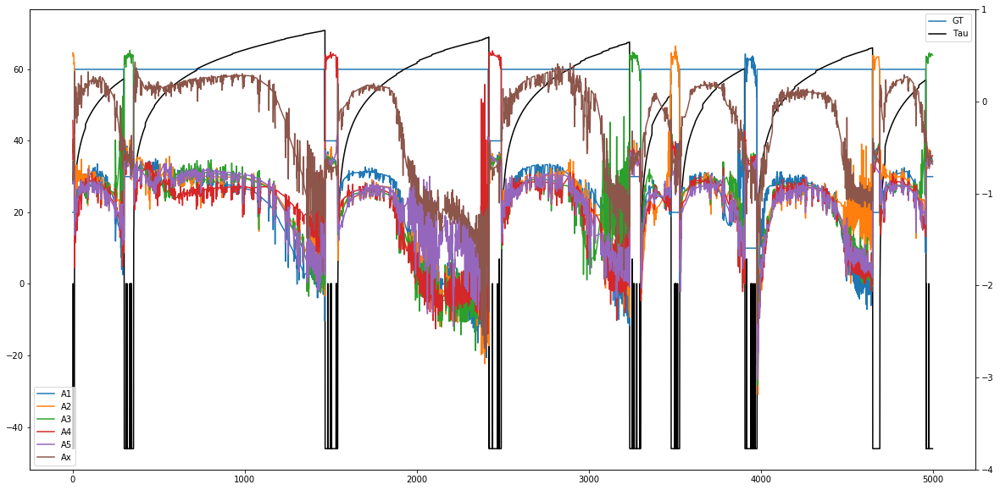

In [31]:
# histogram of Q values last 10 episodes
epn = -10
mmat = allEpData
episQ = np.stack(mmat[epn][:,0])[:,]
episY = mmat[epn][:,4]*10+10
episC = mmat[epn][:,5]*10+10
episTau = mmat[epn][:,1]
# print (episY)

plt.figure(figsize=(20,10))
plt.rcParams["figure.figsize"] = (20,10)
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()

ax1.plot(episY, label='GT')
ax1.plot(episTau, label='Tau', color='black')
#ax1.plot(episC+1, label='pi(s)', color='cyan')
ax1.legend(loc='best')

ax2.plot(episQ[:,0], label='A1')
ax2.plot(episQ[:,1], label='A2')
ax2.plot(episQ[:,2], label='A3')
ax2.plot(episQ[:,3], label='A4')
ax2.plot(episQ[:,4], label='A5')
ax2.plot(episQ[:,5], label='Ax')
ax2.set_ylim([-4,1])
ax2.legend(loc='best')

In [ ]:
print (episC)
print (mmat[epn][:,3])
print (episY)


In [34]:
policy_net = torch.load('./EpData/policy_db4_3rep_del_wt_re_10801')

In [53]:
#_,_,Qvals_val = test_func(pTest[0:2],iloc='first',eloc='last')
# histogram of Q values last 10 episodes
epn = -1
mmat = Qvals_val
episQ = np.stack(mmat[epn][:500,0])[:,]
episY = mmat[epn][:500,4]*10+10
episC = mmat[epn][:500,5]*10+10
episTau = mmat[epn][:500,1]
# print (episY)

plt.figure(figsize=(20,10))
plt.rcParams["figure.figsize"] = (20,10)
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()

ax1.plot(episY, label='GT')
ax1.plot(episC+1, label='pi(s)')
ax1.plot(episTau, label='Tau')
ax1.legend(loc='best')

ax2.plot(episQ[:,0], label='A1')
ax2.plot(episQ[:,1], label='A2')
ax2.plot(episQ[:,2], label='A3')
ax2.plot(episQ[:,3], label='A4')
ax2.plot(episQ[:,4], label='A5')
ax2.plot(episQ[:,5], label='Ax')
ax2.set_ylim([-300,500])
ax2.legend(loc='best')

NameError: name 'Qvals_val' is not defined

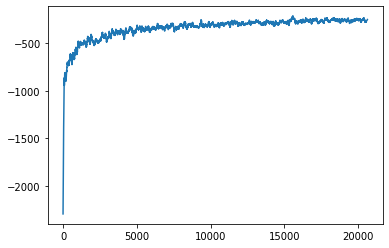

In [23]:
# reward received during training
rpR = np.vstack(episode_reward)
from scipy.signal import savgol_filter
yhat = savgol_filter(rpR[:,2], 161, 2) # window size 51, polynomial order 3
#plt.plot(rpR[:,4])
plt.figure(figsize=(6,4))
plt.plot(yhat)


In [29]:
def remove_duplicates(arr): 
    final_list = [] 
    gt_tr = []
    final_list.append(arr[0])     
    for i in range(1,arr.shape[0]): 
        if arr[i] != arr[i-1]:
            final_list.append(arr[i])     
            if arr[i] != num_camera-1:
                gt_tr.append(arr[i])
    return final_list, gt_tr

Initial position:  [  0  93 284  99  34  84]
Initial position:  [    4 25268   288    85    30    94]
Initial position:  [   0 3851  287  100   31   97]
Initial position:  [    3 29926    22    53    22    67]
Initial position:  [   3 3189   22   56   17   55]
Initial position:  [  3 200 279  83  36 110]
Initial position:  [    3 34006   273    80    30    99]
Initial position:  [    4 24375   149    69     7    26]
Initial position:  [    4 30659   247    96    65   142]
Initial position:  [    3 35161   208    96    42   107]
Initial position:  [   2 1356  265   97   24   54]
Initial position:  [    1 25930   259    80    59   130]
Initial position:  [  0 917 289 100  29  75]
Initial position:  [    3 28228    97    65    23    72]
Initial position:  [   4 9437  287   78   31   70]
Initial position:  [  4  18  39 102  66 137]
Initial position:  [    2 15044     1    98    59   116]
Initial position:  [   3 5860   19   60   21   60]
Initial position:  [    1 19348     1    88    37   

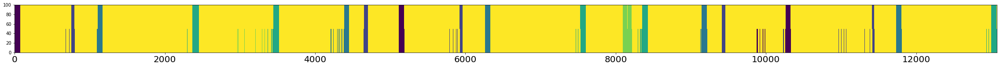

A,P,R:  0.9716995563714242 0.7860696517412935 0.9798449612403101
Num frames:  (1608, 344)
Accuracy:  0.9716995563714242
Person:  1
Transitions:  [4, 5, 3, 5, 2, 5, 1, 5, 0, 5, 0, 5, 1, 5, 2, 5, 3, 5, 4, 5, 3, 5]


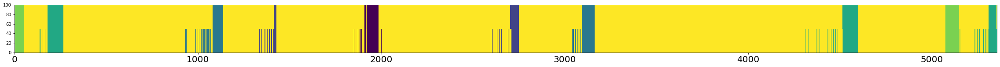

A,P,R:  0.9533233756534727 0.7111913357400722 0.9833610648918469
Num frames:  (831, 240)
Accuracy:  0.9533233756534727
Person:  2
Transitions:  [0, 5, 0, 5]


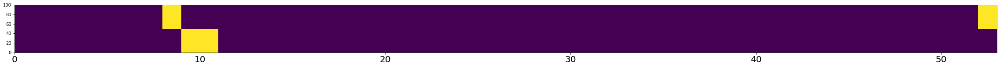

A,P,R:  0.9245283018867925 0.9607843137254902 0.9607843137254902
Num frames:  (51, 2)
Accuracy:  0.9245283018867925
Person:  3
Transitions:  [3, 5]


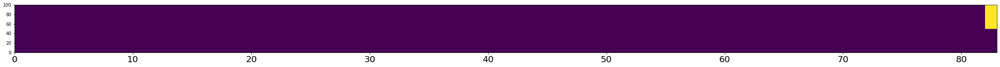

A,P,R:  0.9879518072289156 0.9879518072289156 1.0
Num frames:  (83, 1)
Accuracy:  0.9879518072289156
Person:  4
Transitions:  [3, 5, 3, 5, 3, 5]


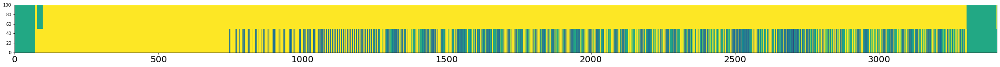

A,P,R:  0.5112936344969199 0.09416299559471365 0.8814432989690721
Num frames:  (1816, 1643)
Accuracy:  0.5112936344969199
Person:  5
Transitions:  [3, 5, 2, 5, 1, 5, 0, 5, 0, 5, 1, 5, 2, 5, 3, 5, 4, 5, 3, 5, 2, 5, 1, 5, 1, 5, 0, 5, 0, 5, 0, 5, 1, 5, 2, 5, 3, 5, 4, 5, 3, 5, 2, 5, 1, 5, 0, 5, 0, 5]


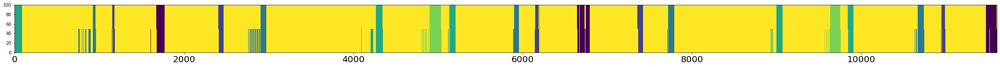

A,P,R:  0.9659541458369246 0.8099891422366993 0.970722186076773
Num frames:  (1842, 350)
Accuracy:  0.9659541458369246
Person:  6
Transitions:  [3, 5]


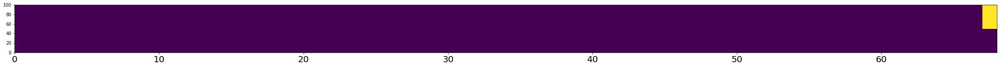

A,P,R:  0.9852941176470589 0.9852941176470589 1.0
Num frames:  (68, 1)
Accuracy:  0.9852941176470589
Person:  7
Transitions:  [4, 5]


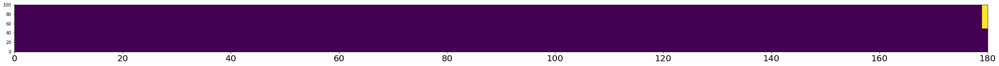

A,P,R:  0.9944444444444445 0.9944444444444445 1.0
Num frames:  (180, 1)
Accuracy:  0.9944444444444445
Person:  8
Transitions:  [4, 5]


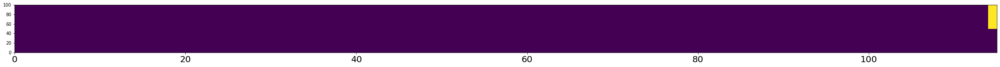

A,P,R:  0.991304347826087 0.991304347826087 1.0
Num frames:  (115, 1)
Accuracy:  0.991304347826087
Person:  9
Transitions:  [3, 5]


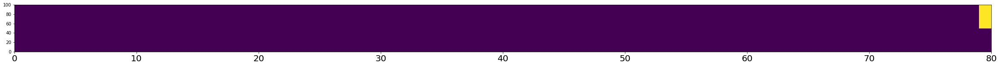

A,P,R:  0.9875 0.9875 1.0
Num frames:  (80, 1)
Accuracy:  0.9875
Person:  10
Transitions:  [2, 5, 3, 5, 4, 5, 3, 5, 2, 5, 1, 5, 1, 5, 0, 5, 1, 5, 2, 5, 2, 5, 3, 5, 4, 5, 3, 5, 3, 5, 2, 5, 1, 5, 0, 5, 1, 5]


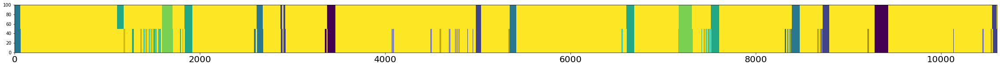

A,P,R:  0.9503960769520936 0.740718198417529 0.9240698557327259
Num frames:  (1643, 426)
Accuracy:  0.9503960769520936
Person:  11
Transitions:  [1, 5, 2, 5, 2, 5, 1, 5, 1, 5, 2, 5]


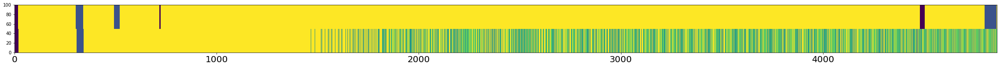

A,P,R:  0.5587327710347665 0.024824355971896955 0.3063583815028902
Num frames:  (2135, 2025)
Accuracy:  0.5587327710347665
Person:  12
Transitions:  [0, 5, 1, 5, 1, 5, 2, 5, 2, 5, 3, 5, 4, 5, 3, 5, 2, 5, 1, 5, 0, 5, 1, 5, 2, 5, 3, 5, 4, 5, 3, 5, 3, 5, 2, 5, 1, 5, 0, 5, 0, 5, 0, 5, 0, 5]


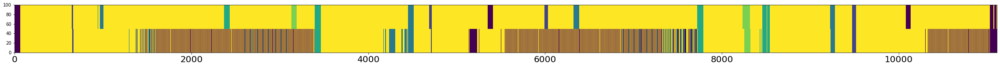

A,P,R:  0.7096832253419726 0.16838487972508592 0.569215876089061
Num frames:  (3492, 2781)
Accuracy:  0.7096832253419726
Person:  13
Transitions:  [3, 5]


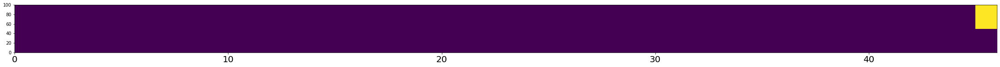

A,P,R:  0.9782608695652174 0.9782608695652174 1.0
Num frames:  (46, 1)
Accuracy:  0.9782608695652174
Person:  14
Transitions:  [4, 5, 4, 5, 4, 5, 4, 5, 4, 5, 4, 5, 4, 5, 4, 5]


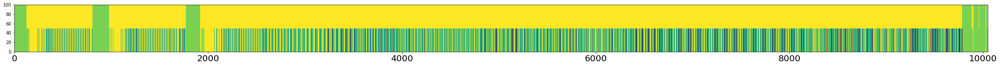

A,P,R:  0.3195660828025478 0.09024357779848263 0.9897810218978103
Num frames:  (7513, 6830)
Accuracy:  0.3195660828025478
Person:  15
Transitions:  [4, 5, 3, 5, 2, 5, 1, 5, 0, 5, 0, 5, 0, 5, 1, 5, 2, 5, 3, 5, 4, 5, 4, 5, 3, 5, 2, 5, 1, 5, 0, 5, 1, 5, 2, 5, 3, 5, 4, 5, 3, 5, 2, 5, 1, 5, 0, 5, 0, 5]


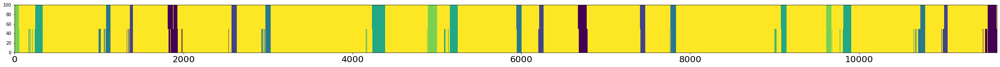

A,P,R:  0.96887627890981 0.8310700706137969 0.967741935483871
Num frames:  (1841, 311)
Accuracy:  0.96887627890981
Person:  16
Transitions:  [2, 5]


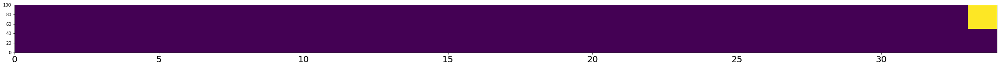

A,P,R:  0.9705882352941176 0.9705882352941176 1.0
Num frames:  (34, 1)
Accuracy:  0.9705882352941176
Person:  17
Transitions:  [3, 5]


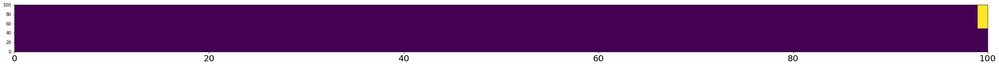

A,P,R:  0.99 0.99 1.0
Num frames:  (100, 1)
Accuracy:  0.99
Person:  18
Transitions:  [1, 5]


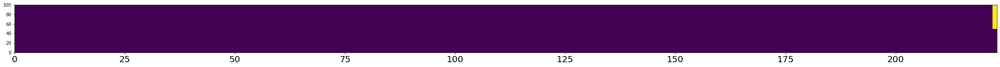

A,P,R:  0.9955156950672646 0.9955156950672646 1.0
Num frames:  (223, 1)
Accuracy:  0.9955156950672646
Person:  19
Transitions:  [0, 5]


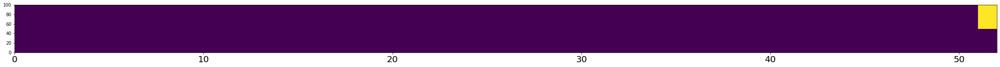

A,P,R:  0.9807692307692307 0.9807692307692307 1.0
Num frames:  (52, 1)
Accuracy:  0.9807692307692307
Person:  20
Transitions:  [3, 5]


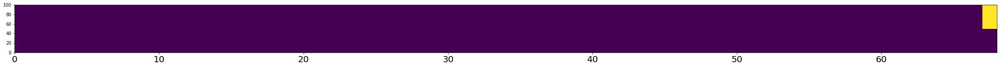

A,P,R:  0.9852941176470589 0.9852941176470589 1.0
Num frames:  (68, 1)
Accuracy:  0.9852941176470589
Person:  21
Transitions:  [4, 5]


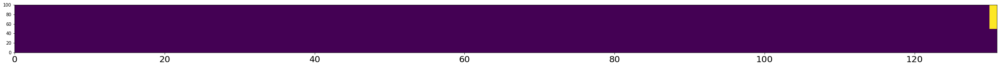

A,P,R:  0.9923664122137404 0.9923664122137404 1.0
Num frames:  (131, 1)
Accuracy:  0.9923664122137404
Person:  22
Transitions:  [0, 5, 0, 5, 1, 5, 2, 5, 2, 5, 3, 5, 4, 5, 3, 5, 2, 5, 1, 5, 0, 5, 0, 5, 1, 5, 2, 5, 3, 5, 4, 5, 3, 5, 2, 5, 1, 5, 0, 5, 0, 5, 1, 5, 2, 5, 2, 5, 3, 5, 4, 5]


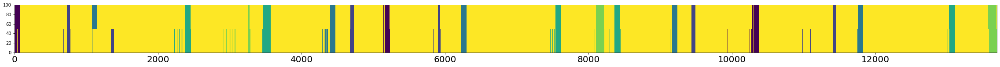

A,P,R:  0.9629710780017529 0.7750826901874311 0.93421926910299
Num frames:  (1814, 408)
Accuracy:  0.9629710780017529
Person:  23
Transitions:  [0, 5, 0, 5, 0, 5, 0, 5]


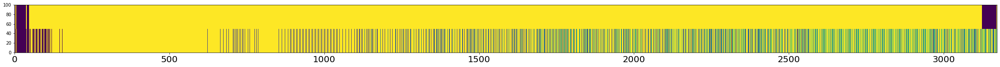

A,P,R:  0.6670870113493065 0.036380597014925374 0.4431818181818182
Num frames:  (1072, 1007)
Accuracy:  0.6670870113493065
Person:  24
Transitions:  [3, 5]


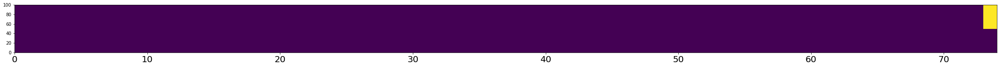

A,P,R:  0.9864864864864865 0.9864864864864865 1.0
Num frames:  (74, 1)
Accuracy:  0.9864864864864865
0.8915954921130962
Average A,P,R,F, ttr 0.8915954921130964 0.7541871029182816 0.9164289593157864 663.72 [39, 21, 3, 1, 5, 49, 1, 1, 1, 1, 37, 11, 45, 1, 15, 49, 1, 1, 1, 1, 1, 1, 51, 7, 1]
43292


In [32]:
policy_net.eval()
req_inc = 0
_,acc,_ = test_func(pALL,iloc='fix',eloc='last', fixLoc=2, isdebug=0, req_inc=req_inc)
tr_acc = 0
avg_tr_captured = []
A,P,R,F, ttr = [],[],[],[],[]
nfr = []
for i in range(len(acc)):
    print ('Person: ',i)
    gt = np.array([d[0] for d in acc[i]])
    pr = np.array([d[1] for d in acc[i]])
    g = gt #t[gt != num_camera-1]
    p = pr #r[gt != num_camera-1]
    
    dups,gt_tr = remove_duplicates(g)
    print ('Transitions: ', dups)
    print ('GT transitions: ', len(gt_tr))
    print ('Transitions captured: ', numTR[i])
    if len(gt_tr) != 0:
        avg_tr_captured.append((numTR[i],len(gt_tr)))
    
    # plot transitions
    afc.plot_color_transitions(p,g)
    # MCTA and number of frames
    if req_inc == 1:
        ac,pr,re,fr,tr = afc.compute_APRF_one_person_sct_ict(p,g)
    else:
        ac,pr,re,fr,tr = afc.compute_APRF_one_person_sct_ict(p,g)
    A.append(ac)
    P.append(pr)
    R.append(re)
    F.append(fr)
    ttr.append(tr)
    print ('A,P,R: ', ac,pr,re)
    f = afc.compute_num_frames(p,g)
    nfr.append(f)
    print ('Num frames: ', f)
    # Accuracy
    tacc = np.sum(g==p, dtype=np.float)/g.shape[0]
    tr_acc += tacc
    print ('Accuracy: ',tacc)
print (tr_acc/len(A))
print ('Average A,P,R,F, ttr', np.mean(A),np.mean(P),np.mean(R),np.mean(F), ttr)
print (np.sum(nfr))

In [ ]:
tr_acc = 0
for i in range(5):
    print ('Person: ',i)
    g = np.array([d[0] for d in acc[i]])
    p = np.array([d[1] for d in acc[i]])
    print (g)
    print (p)
    tr_acc += np.sum(g==p, dtype=np.float)/g.shape[0]
tr_acc/5

In [ ]:
np.log10(1000)

In [ ]:
mcta = []
nfr = []
for i in range(5):
    g = np.array([d[0] for d in acc[i]])
    p = np.array([d[1] for d in acc[i]])
    mcta.append(afc.compute_MCTA(p,g))
    nfr.append(afc.compute_num_frames(p,g))
print (np.mean(mcta))
print (np.sum(nfr))

### Test function

In [ ]:
backup_fname = '/media/win/HRLhkl/Q_CamSel_3L_l4_st200_db3_1tCont_2'
hkl.dump([[episode_reward, running_reward]], backup_fname+'_variables.hkl')

In [ ]:
1/np.log(1000)

In [ ]:
pp = 1
np.max(pTest[pp][1:,1] - pTest[pp][0:-1,1])